## Text Classification of Drug Effectiveness from Customer Review

#### Purpose: Predict the effectiveness Level of Drugs from drug takers' feedbacks (including benefit reviews and overall comments)

In [262]:
# Import libraries
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
from sklearn.model_selection import StratifiedKFold
from time import time
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt
from matplotlib import cm
import seaborn as sns
from sklearn.metrics import classification_report, multilabel_confusion_matrix

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

In [2]:
# disable chaining warning
pd.options.mode.chained_assignment = None

#### Data source: Drug Review Dataset (Druglib.com) Data Set (https://archive.ics.uci.edu/ml/datasets/Drug+Review+Dataset+%28Druglib.com%29)

Citation: Felix Gräßer, Surya Kallumadi, Hagen Malberg, and Sebastian Zaunseder. 2018. Aspect-Based Sentiment Analysis of Drug Reviews Applying Cross-Domain and Cross-Data Learning. In Proceedings of the 2018 International Conference on Digital Health (DH '18). ACM, New York, NY, USA, 121-125. DOI: [Web Link]

In [89]:
# Import dataset
train_file = 'data/drugLibTrain_raw.tsv'
test_file = 'data/drugLibTest_raw.tsv'
train_raw = pd.read_csv(train_file, sep='\t')
print('train data:')
print(train_raw.head(5))

test_raw = pd.read_csv(test_file,sep='\t')
print('\nTest data:')
print(test_raw.head(5))

train data:
   Unnamed: 0       urlDrugName  rating         effectiveness  \
0        2202         enalapril       4      Highly Effective   
1        3117  ortho-tri-cyclen       1      Highly Effective   
2        1146           ponstel      10      Highly Effective   
3        3947          prilosec       3  Marginally Effective   
4        1951            lyrica       2  Marginally Effective   

           sideEffects                               condition  \
0    Mild Side Effects  management of congestive heart failure   
1  Severe Side Effects                        birth prevention   
2      No Side Effects                        menstrual cramps   
3    Mild Side Effects                             acid reflux   
4  Severe Side Effects                            fibromyalgia   

                                      benefitsReview  \
0  slowed the progression of left ventricular dys...   
1  Although this type of birth control has more c...   
2  I was used to having cramps s

In [332]:
# Obtain useful features for training and testing
## Assume side effect != effectiveness of drugs, hence exclude side effect and side effect reviews
## Only focus on the effectiveness of drugs (not the overall ratings)
train_df_raw = train_raw[['effectiveness','benefitsReview','commentsReview']] 
test_df_raw = test_raw[['effectiveness','benefitsReview','commentsReview']] 

# print result
train_df_raw.head(5)


,effectiveness,benefitsReview,commentsReview
0,Highly Effective,slowed the progression of left ventricular dys...,"monitor blood pressure , weight and asses for ..."
1,Highly Effective,Although this type of birth control has more c...,"I Hate This Birth Control, I Would Not Suggest..."
2,Highly Effective,I was used to having cramps so badly that they...,I took 2 pills at the onset of my menstrual cr...
3,Marginally Effective,The acid reflux went away for a few months aft...,I was given Prilosec prescription at a dose of...
4,Marginally Effective,I think that the Lyrica was starting to help w...,See above


### Data Pre-Processing

In [334]:
# Check data quality

print(train_df_raw.info())
print(test_df_raw.info())

# keep dataset not null
train_df_raw.dropna(axis=0, how='any',inplace=True)
test_df_raw.dropna(axis=0, how='any',inplace=True)
print(train_df_raw.info())


<class 'pandas.core.frame.DataFrame'>
Int64Index: 3099 entries, 0 to 3106
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   effectiveness   3099 non-null   object
 1   benefitsReview  3099 non-null   object
 2   commentsReview  3099 non-null   object
dtypes: object(3)
memory usage: 96.8+ KB
None
<class 'pandas.core.frame.DataFrame'>
Int64Index: 1036 entries, 0 to 1035
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   effectiveness   1036 non-null   object
 1   benefitsReview  1036 non-null   object
 2   commentsReview  1036 non-null   object
dtypes: object(3)
memory usage: 32.4+ KB
None
<class 'pandas.core.frame.DataFrame'>
Int64Index: 3099 entries, 0 to 3106
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   effectiveness   3099 non-null   object
 1   benefitsRevie

In [93]:
# transform effectiveness into numeric/ ordinal variable into 3 levels as scholar papers suggested
print(train_df_raw.effectiveness.value_counts())
effectiveness_mapping = {'Highly Effective': 2, 'Considerably Effective':2, "Ineffective":0, 'Marginally Effective':1,'Moderately Effective':1}

# Update Effectiveness Level
train_df_raw['effectiveness_ordinal'] = train_df_raw['effectiveness'].map(effectiveness_mapping)
test_df_raw['effectiveness_ordinal'] = test_df_raw['effectiveness'].map(effectiveness_mapping)

# Show data distribution / balancy of dataset
print(train_df_raw.effectiveness_ordinal.value_counts(normalize=True))
print(test_df_raw.effectiveness_ordinal.value_counts(normalize=True))
## data distribution of test and train dataset are similar
## imbalance class on level 1 & 2, to be solved data after text extraction

Highly Effective          1328
Considerably Effective     925
Moderately Effective       414
Ineffective                246
Marginally Effective       186
Name: effectiveness, dtype: int64
2    0.727009
1    0.193611
0    0.079380
Name: effectiveness_ordinal, dtype: float64
2    0.695946
1    0.224903
0    0.079151
Name: effectiveness_ordinal, dtype: float64


In [14]:
# import nltk module

from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

tokenizer = RegexpTokenizer('\w+|^[\d\.]+|[^0-9]|\S+') # Tokenizer object
lemma = WordNetLemmatizer() # Lemmatization object
punctuations = '''!()-,[]{};:’“”'"\,,<>./?@#$%^&*_~''' # punctuation 
stopwords = stopwords.words('english') # obtain nltk ver. stopwords
drugsName = list(train_raw.urlDrugName.unique()) # list of drugs name
conditions = list(train_raw.condition.unique()) # list of medical condition
extra = ['would','will','also']

punctuations_list = [p for p in punctuations] # create punctuation list

# Remove stopwords that may remove negative sentiment 
remove_stopwords = ['not','no','very',"don't","ain",'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn', "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't",'mightn', "mightn't", 'mustn', "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't","won't", 'wouldn', "wouldn't"]    

for r in remove_stopwords:
    stopwords.remove(r)

# Check stopwords
unwanted_word = stopwords + punctuations_list +extra + drugsName + conditions # Remove influence of drug used and medical terms of condition
print(unwanted_word[0:200])

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'nor', 'only', 'own', 'same', 'so', 'than', 'too', 's', 't

In [94]:
# Text extraction from comments
from nltk.corpus import wordnet as wn
import re 
from sklearn.feature_extraction.text import TfidfVectorizer
# Create functions

def hasNumbers(inputString):
    return not(bool(re.search(r'\d', inputString)))

def word_extraction(text):
    word_list = tokenizer.tokenize(text) # tranform word in list
    useWord_list =[]
    for word in word_list:
        word = word.lower() # set word to lowercase 
        if (word not in unwanted_word) & (len(word)>2) & (hasNumbers(word)): # remove unwanted words / words with single character / words with dose amount
            word = lemma.lemmatize(word,wn.NOUN) # lemmatize by noun
            word = lemma.lemmatize(word,wn.VERB) # lemmatize by verb
            word = lemma.lemmatize(word,wn.ADJ) # lemmatize by adj
            useWord_list.append(word)
    text = ' '.join(useWord for useWord in useWord_list) # recreate the text sentence for count vectorizing
    return text    

def Train_Vectorizer(training_data,textCol1,textCol2,max_feature,min_count=2):
    textSeries1 = training_data[textCol1]
    textSeries2 = training_data[textCol2] 
    textSeries = textSeries1 + textSeries2 # combine the two columns with text comments
    textSeries = list(textSeries.map(word_extraction)) # words extraction and cleaning
    vectorizer = TfidfVectorizer(analyzer='word',token_pattern='\w+|\d|\S+',min_df=min_count,max_features=max_feature).fit(textSeries) # Vectorizer object to TF-IDF values
    return vectorizer

def text_preprocess(df, vectorizer,labelCol='effectiveness',textCol1='commentsReview',textCol2='benefitsReview'): # input data to pre-process with the trained vectorizer
    df['effectiveness_ordinal'] = df[labelCol].map(effectiveness_mapping)
    df.reset_index(inplace=True,drop=True)
    textSeries1 = df[textCol1]
    textSeries2 = df[textCol2] 
    label = df[['effectiveness_ordinal']] # obtain the label
    textSeries = textSeries1 + textSeries2 # combine the two columns with text comments
    textSeries = list(textSeries.map(word_extraction)) # words extraction and cleaning    
    count_vector = vectorizer.transform(textSeries).toarray() # obtain word count per combined comment
    feature = vectorizer.get_feature_names() # obtain words
    vector_df = pd.DataFrame(data=count_vector, columns=feature) # build dataframe for storing word vector
    df = pd.concat([vector_df,label],axis=1) # concat with original dataset
    return df

### Pre-Process raw text training data

### Train MLP Model

In [249]:
# Store training intermediate results
#iterResult = pd.DataFrame(columns=['ID','Model','totalFold','Fold_no','iter_no','TrainLoss','ValidationLoss','layer_no']) # Store the parameters and corresponding result (trainingtime, F-Score, Accuracy, PRC-AUC, etc.)
iterResult = pd.read_csv('data_output_iterate.csv')
iterResult.head()

,ID,Model,totalFold,Fold_no,iter_no,TrainLoss,ValidationLoss,layer_no
0,MLP_input2000_minC2_lr0.1_epoch500_hidden100_l...,MLP,5,1,0,1.072712,0.272581,1
1,MLP_input2000_minC2_lr0.1_epoch500_hidden100_l...,MLP,5,1,1,1.632382,0.272581,1
2,MLP_input2000_minC2_lr0.1_epoch500_hidden100_l...,MLP,5,1,2,0.685970,0.272581,1
3,MLP_input2000_minC2_lr0.1_epoch500_hidden100_l...,MLP,5,1,3,0.853099,0.272581,1
4,MLP_input2000_minC2_lr0.1_epoch500_hidden100_l...,MLP,5,1,4,0.840323,0.270968,1


In [250]:
#overview_training = pd.DataFrame(columns=['ID','Model','Cross_Validation','input_size','Vectorizer_minCount','learning_rate','num_epochs','hidden_size','layer_no','activationFunction','criterion','optimizer','trainingTime','Training_Accuracy','Generalization_Accuracy','Fscore_class0','Fscore_class1','Fscore_class2'])
overview_training = pd.read_csv('data_output_overview.csv')
overview_training.head()

,ID,Model,Cross_Validation,input_size,Vectorizer_minCount,learning_rate,num_epochs,hidden_size,layer_no,activationFunction,criterion,optimizer,trainingTime,Training_Accuracy,Generalization_Accuracy,Fscore_class0,Fscore_class1,Fscore_class2,k_value
0,MLP_input2000_minC2_lr0.1_epoch500_hidden100_l...,MLP,5,2000,2,0.10,500,100,1,Relu,CE,Adam,49.283138,99.903197,67.021106,0.232828,0.306955,0.801133,0
1,MLP_input2000_minC2_lr0.1_epoch500_hidden100_l...,MLP,5,2000,2,0.10,500,100,2,Relu,CE,Adam,63.733041,83.752576,67.570066,0.000000,0.270103,0.807920,0
2,MLP_input2000_minC2_lr0.01_epoch500_hidden100_...,MLP,5,2000,2,0.01,500,100,1,Relu,CE,Adam,48.409960,99.911264,67.182448,0.274945,0.287308,0.801209,0
3,MLP_input2000_minC2_lr0.01_epoch500_hidden100_...,MLP,5,2000,2,0.01,500,100,2,Relu,CE,Adam,64.588776,99.911264,67.795664,0.258526,0.323885,0.805222,0
4,MLP_input2000_minC2_lr0.01_epoch500_hidden50_l...,MLP,5,2000,2,0.01,500,50,1,Relu,CE,Adam,30.156201,99.911264,67.182500,0.267598,0.307747,0.800392,0


In [32]:
target_names = ['Ineffective',
 'Marginally Effective/ Moderately Effective','Highly Effective/ Considerably Effective']
label = [0,1,2]

In [38]:
# Preprocessing vectorizer parameter
max_feature = [None,3000,2000,1000] # Number of word feature for testing
max_feat = 4000
min_count = 2

# Train Vectorizer for text-processing
vectorizer = Train_Vectorizer(full_raw,'commentsReview','benefitsReview', max_feature=max_feat, min_count=2)
feature = vectorizer.get_feature_names()

# Calculate the TF-IDF score of training data
train_df = text_preprocess(train_df_raw,vectorizer,'effectiveness_ordinal','commentsReview','benefitsReview')
train_df.head()

,...,abandon,abate,abcess,abdomen,abdomin,abdominal,ability,ablation,able,...,yr,zanaflex,zanax,zap,zero,zetia,zit,zombie,zone,effectiveness_ordinal
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.146706,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.056798,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2


In [279]:
# Build network class with hidden layer, where no. of feature = max_feature
class MLP_Net_layer1(nn.Module):
     def __init__(self, input_size, hidden_size, num_classes,activation1):
        super(MLP_Net_layer1, self).__init__()
        self.layer_1 = nn.Linear(input_size,hidden_size, bias=True)
        self.activation1 = activation1
        self.output_layer = nn.Linear(hidden_size, num_classes, bias=True)
 
     def forward(self, x):
        out = self.layer_1(x)
        out = self.activation1(out)
        out = self.output_layer(out)
        return out

In [280]:
# Build network class of 2 hidden layer, where no. of feature = max_feature
class MLP_Net_layer2(nn.Module):
     def __init__(self, input_size, hidden_size, num_classes,activation1,activation2):
        super(MLP_Net_layer2, self).__init__()
        self.layer_1 = nn.Linear(input_size,hidden_size, bias=True)
        self.activation1 = activation1
        self.activation2 = activation2
        self.layer_2 = nn.Linear(hidden_size, hidden_size, bias=True)
        self.output_layer = nn.Linear(hidden_size, num_classes, bias=True)
 
     def forward(self, x):
        out = self.layer_1(x)
        out = self.activation1(out)
        out = self.layer_2(out)
        out = self.activation2(out)
        out = self.output_layer(out)
        return out

In [462]:
def Train_MLP(df_train,layer, ActivationFunc1,OptimizerName,learning_rate, hidden_size, num_epochs, kFold,lossFunc = 'CE', early_stopping=-1, SMOTE_bool=True,k=5,over_proportion_list=[0.3,0.3,1],classes=[0,1,2],min_count=2,ActivationFunc2='Softmax', CE_weight = True):
    Model = 'MLP'
    x_train, y_train = df_train.iloc[:,:-1],df_train.iloc[:,-1]
    input_size=df_train.shape[1]-1
    cv = kFold.n_splits
    over_proportion= 'none'
    mlp_dict =[]
            
    if ActivationFunc1 == 'Relu':
        activation1 = nn.ReLU()
    elif ActivationFunc1 == 'Softmax':
        activation1 = nn.Softmax(dim=1)
    elif ActivationFunc1 == 'Sigmoid':
        activation1 = nn.Sigmoid()
        
    if ActivationFunc2 == 'Relu':
        activation2 = nn.ReLU()
    elif ActivationFunc2 == 'Softmax':
        activation2 = nn.Softmax(dim=1)
    elif ActivationFunc2 == 'Sigmoid':
        activation2 = nn.Sigmoid()
                           
    if early_stopping >=0:
        OptimizerName = OptimizerName +'-earlystopping'+str(early_stopping)
    
    CV_loss = [] # for storing the cross validation loss in each fold
    train_loss = []
    F1Score_0 = []
    F1Score_1 = []
    F1Score_2 = []
    iter_list = []
    overview_list = []
                           
    ID = '{}_input{}_minC{}_lr{}_epoch{}_hidden{}_layer{}_{}_{}_{}_CV{}_k{}'.format(Model,str(input_size),str(min_count),str(learning_rate),str(num_epochs),str(hidden_size),str(layer),lossFunc,OptimizerName,ActivationFunc,str(cv),str(k))
    ini_time = time() 
    cv_fold = kFold.split(x_train, y_train)
                           
    for fold_id, (train_idx, val_idx) in enumerate(cv_fold):     # Perform Cross Validation 
        
        x_train_t,y_train_t = x_train.iloc[train_idx,:],y_train[train_idx]
        x_val, y_val = x_train.iloc[val_idx,:],y_train[val_idx]
        
        if SMOTE_bool:
            
            datasize = x_train_t.shape[0]
            over_target = dict(zip(classes,[int(i*datasize) for i in over_proportion_list]))
            over = SMOTE(random_state=123,sampling_strategy=over_target,k_neighbors=k)
            over_proportion = ';'.join([str(x) for x in over_proportion_list ])   
            
            x_train_t,y_train_t = over.fit_resample(x_train_t,y_train_t)
            balance = y_train_t.value_counts(normalize=True)
            weight = torch.from_numpy(np.array([balance[0],balance[1],balance[2]])).type(torch.FloatTensor)
        
        if not(CE_weight):
            weight = None       
        
        x_train_t = torch.from_numpy(np.array(x_train_t)).type(torch.FloatTensor)
        x_val= torch.from_numpy(np.array(x_val)).type(torch.FloatTensor)
        y_train_t = torch.from_numpy(np.array(y_train_t)).type(torch.LongTensor)
        y_val = torch.from_numpy(np.array(y_val)).type(torch.LongTensor)   
                           
        criterion = nn.CrossEntropyLoss(weight = weight)
        
        if layer ==1:
            mlp = MLP_Net_layer1(input_size,hidden_size,num_classes,activation1)
        elif layer ==2:
            mlp = MLP_Net_layer2(input_size,hidden_size,num_classes,activation1,activation2)
                           
        
        optimizer = torch.optim.Adam(mlp.parameters(), lr=learning_rate) 
        #elif OptimizerName == 'SGD':
        #    optimizer = torch.optim.SGD(mlp.parameters(), lr=learning_rate) 
        
        #print("-----Start Cross-Validating --- {}/{}--Fold---------------------".format(str(fold_id+1),str(cv)))                           
        
        iter = [ID,'MLP',cv,fold_id+1,0,1,1,layer] # initiate an empty list for early stopping + framework for storing the iterative results in every fold
        for epoch in range(num_epochs):
            optimizer.zero_grad()
            output = mlp(x_train_t)
            loss = criterion(output, y_train_t)

            # Calculate the loss in validation set at this model bias/ weight
            val_output_epoch = mlp(x_val) 
            _,pred_val_epoch = torch.max(val_output_epoch,1)
            wrong_val = (pred_val_epoch!=y_val).sum().item()
            loss_val_epoch = wrong_val / len(y_val)

            # Update the model parameter with loss function
            loss.backward()
            optimizer.step()                  
            
            last_iter = iter               
            iter = [ID,'MLP',cv,fold_id+1,epoch,loss.data.item(),loss_val_epoch,layer]
            iter_list.append(iter)
                           
            if early_stopping >=0:
                # Set up early stopping i.e. validation loss increase for n iterations
                if loss_val_epoch > last_iter[-2]: # iter: list stored in last iterations
                    incr_val_loss +=1
                else:
                    incr_val_loss=0 # restart the counting 

                # Early-stopping to break the iteration loop
                if incr_val_loss >=early_stopping:
                    print('-----early-stopping implemented, iterations stopped at %d | training loss %.2f | val. loss %.2f ------' %(epoch,loss.data.item(),loss_val_epoch))
                    break
        
        #print('---------------Training process has finished, Start Evaluating Models-----------------------')
        _, pred = torch.max(output,1)
        correct = (pred == y_train_t).sum().item()
        train_classification_accuracy = correct/ len(y_train_t) *100
        #print('Classification accuracy (training data): %.4f %%' % train_classification_accuracy)
        train_loss.append(train_classification_accuracy)

        with torch.no_grad():
            val_output = mlp(x_val)
            _,pred_val = torch.max(val_output,1)
            correct_val = (pred_val==y_val).sum().item()
            val_classification_accuracy = correct_val / len(y_val) *100
            #print('Classification accuracy (validation data): %.4f %% \n' % val_classification_accuracy)
            CV_loss.append(val_classification_accuracy)
            report = classification_report(y_val.data,pred_val.data, labels=label, target_names=target_names,output_dict=True)
            F1Score_0.append(report[target_names[0]]['f1-score'])
            F1Score_1.append(report[target_names[1]]['f1-score'])
            F1Score_2.append(report[target_names[2]]['f1-score'])
            #print('Average F1 Score: 0: %.3f | 1: %.3f | 2: %.3f \n\n' % (report[target_names[0]]['f1-score'],report[target_names[1]]['f1-score'],report[target_names[2]]['f1-score'])) 
        mlp_dict.append(mlp.state_dict())
    endtime = time()-ini_time
    print('Total training time:')
    print(endtime)

    train_loss_cv = sum(train_loss)/cv
    generalization_loss = sum(CV_loss)/ cv
    train_loss_cv = sum(train_loss)/cv
    f1_0 = sum(F1Score_0)/ cv 
    f1_1 = sum(F1Score_1)/ cv
    f1_2 = sum(F1Score_2)/ cv

    print('\nAverage Generalization Accuracy: %.4f %%' % generalization_loss)
    print('Average Training Accuracy: %.4f %%' % train_loss_cv)
    print('Average F1 Score: 0: %.3f | 1: %.3f | 2: %.3f \n\n' % (f1_0,f1_1,f1_2))    

    fig11, ax11 = plt.subplots(figsize=(18,5),ncols=2)
    ax11[0].plot(np.arange(cv)+1,np.array(train_loss),c='b',label='Training Set')
    ax11[0].plot(np.arange(cv)+1,np.array(CV_loss),c='r',label='Validation Set')
    ax11[0].set_xlabel('K-Fold Out of %d Fold' % cv)
    ax11[0].set_xticks(minor=False, ticks = [1,2,3,4,5])
    ax11[0].set_ylabel('Accuracy')
    ax11[0].set_title('\nValidating and Training Accuracy' )
    ax11[0].legend()

    # Show F1 Score across class
    ax11[1].plot(np.arange(cv)+1,np.array(F1Score_0),c='b',label='Class 0')
    ax11[1].plot(np.arange(cv)+1,np.array(F1Score_1),c='r',label='Class 1')
    ax11[1].plot(np.arange(cv)+1,np.array(F1Score_2),c='m',label='Class 2')
    ax11[1].set_xlabel('K-Fold Out of %d Fold' % cv)
    ax11[1].set_ylabel('F1 Score')
    ax11[1].set_xticks(minor=False, ticks = [1,2,3,4,5])
    ax11[1].set_title('\nF1 Score in Validation')  
    ax11[1].legend()
    plt.suptitle('K-Fold Variation on MLP Model | %s' %ID)
    plt.show()
    fig11.savefig('chart/accuracyAcrossCVfold_{}.jpg'.format(ID))

    # Store training model results in dataframe
    overview_list.append([ID,Model,cv,input_size,min_count,learning_rate,num_epochs,hidden_size,layer,ActivationFunc,lossFunc,Optimizer,endtime,train_loss_cv,generalization_loss,f1_0,f1_1,f1_2,k])   
    sum_iter = pd.DataFrame(iter_list,columns=list(iterResult.columns))
    #iterResult = pd.concat([iterResult,sum_iter])

    fig12, ax12 = plt.subplots(figsize=(18,5),ncols=2)
    sns.lineplot(data=sum_iter,x='iter_no',y='ValidationLoss',ax=ax12[0],hue='Fold_no')
    ax12[0].set_title('\nValidation Cross-Encropy Loss')
    sns.lineplot(data=sum_iter,x='iter_no',y='TrainLoss',ax=ax12[1],hue='Fold_no')
    ax12[1].set_title('\nTraining Cross-Encropy Loss')
    plt.suptitle('Iteration Results on MLP Model | %s' %ID)
    plt.show()
    fig12.savefig('chart/iterationResult_{}.jpg'.format(ID))

    sum_overview = pd.DataFrame(overview_list,columns=list(overview_training.columns))   
                           
    return sum_overview , sum_iter, mlp_dict
                           
                           
                           

Total training time:
34.93671917915344

Average Generalization Accuracy: 68.7640 %
Average Training Accuracy: 99.9355 %
Average F1 Score: 0: 0.267 | 1: 0.288 | 2: 0.814 




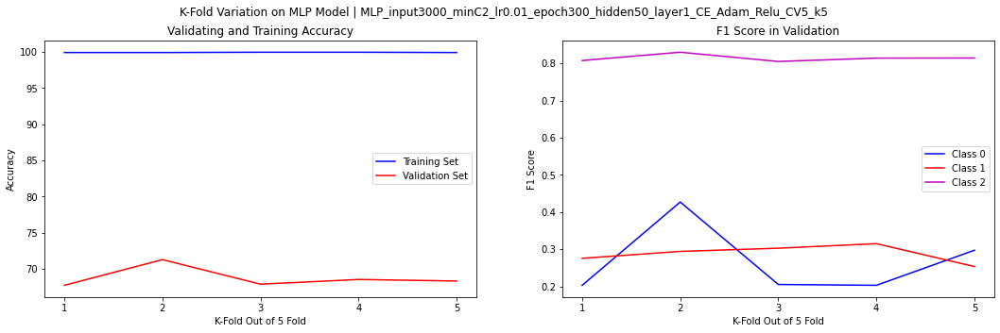

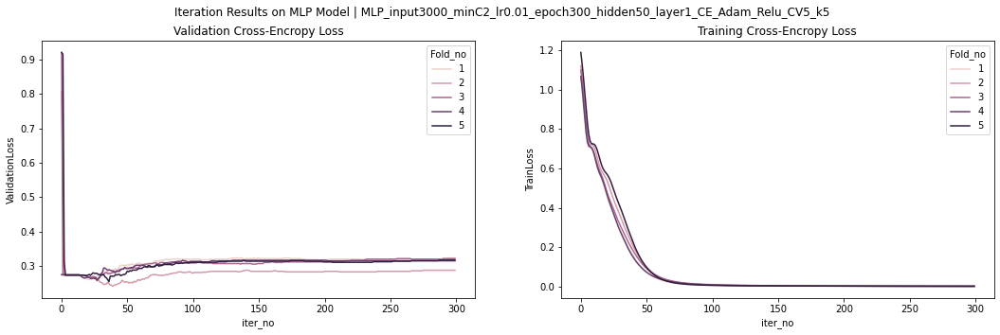

In [505]:
# Baseline
import warnings
warnings.filterwarnings('ignore')

OptimizerName = 'Adam'
lossFunc = 'CE'
ActivationFunc1 = 'Relu'
ActivationFunc2 = None
layer = 1
learning_rate = 0.01
hidden_size = 50
early_stopping =-1
num_epochs = 300
k= 5
over_proportion_list=[0.1,0.2,1]
classes=[0,1,2]
min_count = 3
SMOTE_bool=False
CE_weight = False


sum_overview , sum_iter,_ = Train_MLP(df_train,layer, ActivationFunc1,OptimizerName,learning_rate, hidden_size, num_epochs, kFold,lossFunc, early_stopping,SMOTE_bool,k,over_proportion_list,classes,min_count,ActivationFunc2,CE_weight)


### Grid Search (1) on SMOTE sampling

In [295]:
y_train.value_counts(normalize=True)

2    0.727009
1    0.193611
0    0.079380
Name: effectiveness_ordinal, dtype: float64

[0.1, 0.2, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 93.1711 %
Classification accuracy (validation data): 69.5161 % 

Average F1 Score: 0: 0.000 | 1: 0.257 | 2: 0.820 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 98.6839 %
Classification accuracy (validation data): 72.9032 % 

Average F1 Score: 0: 0.329 | 1: 0.340 | 2: 0.840 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 92.3020 %
Classification accuracy (validation data): 70.1613 % 

Average F1 Score: 0: 0.000 | 1: 0.295 | 2: 0.824 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.4289 %
Classification accuracy (validation data): 71.1290 % 

Average F1 Score: 0: 0.254 | 1: 0.287 | 2: 0.830 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy (training data)

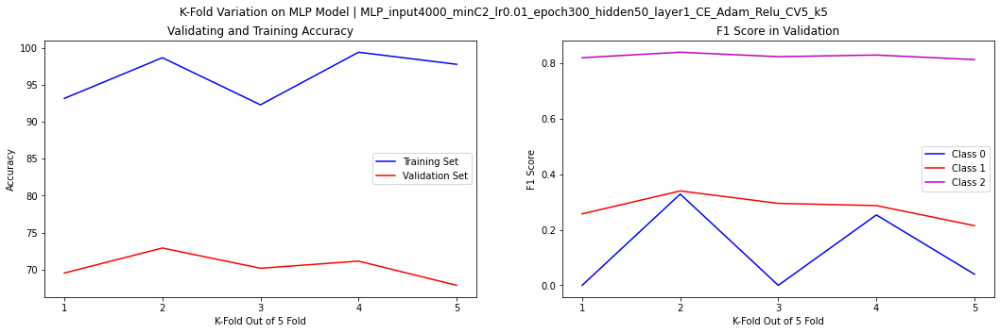

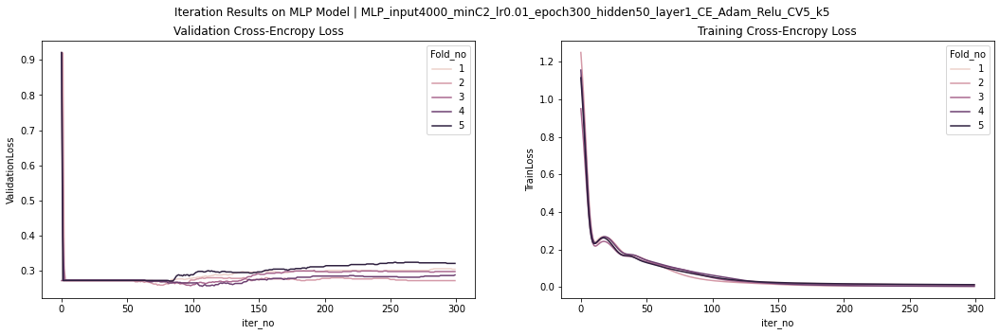

[0.1, 0.30000000000000004, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.3544 %
Classification accuracy (validation data): 68.8710 % 

Average F1 Score: 0: 0.161 | 1: 0.279 | 2: 0.814 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.7464 %
Classification accuracy (validation data): 69.8387 % 

Average F1 Score: 0: 0.246 | 1: 0.299 | 2: 0.822 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9539 %
Classification accuracy (validation data): 68.0645 % 

Average F1 Score: 0: 0.119 | 1: 0.286 | 2: 0.810 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.8155 %
Classification accuracy (validation data): 67.7419 % 

Average F1 Score: 0: 0.182 | 1: 0.317 | 2: 0.805 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy

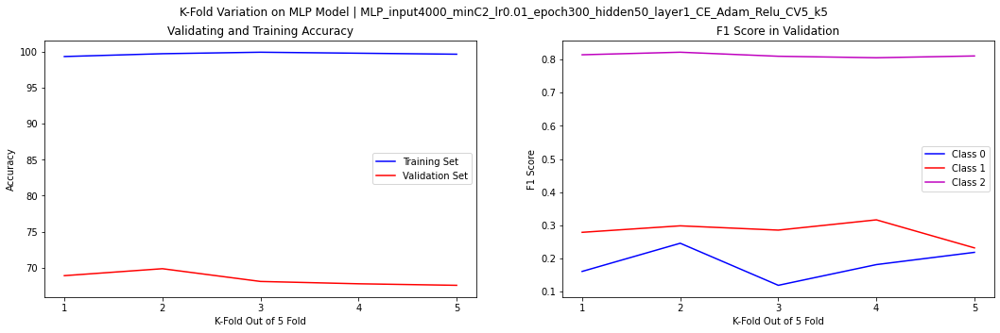

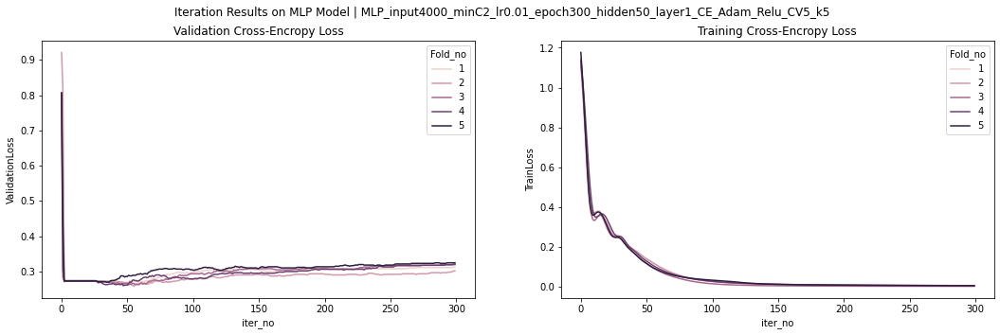

[0.1, 0.4000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.6342 %
Classification accuracy (validation data): 67.5806 % 

Average F1 Score: 0: 0.179 | 1: 0.306 | 2: 0.800 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.8924 %
Classification accuracy (validation data): 70.4839 % 

Average F1 Score: 0: 0.299 | 1: 0.321 | 2: 0.824 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.7633 %
Classification accuracy (validation data): 68.3871 % 

Average F1 Score: 0: 0.033 | 1: 0.311 | 2: 0.813 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.8278 %
Classification accuracy (validation data): 66.7742 % 

Average F1 Score: 0: 0.159 | 1: 0.328 | 2: 0.797 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy 

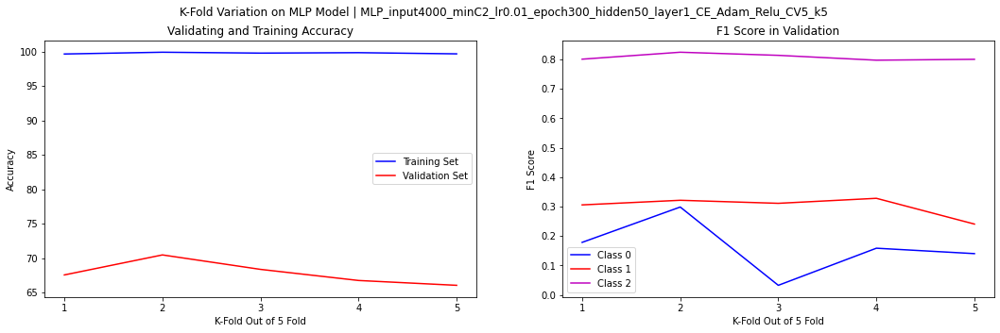

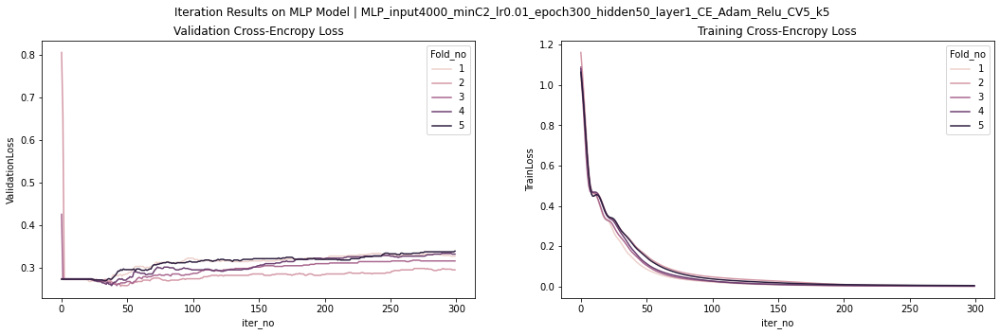

[0.1, 0.5000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.7579 %
Classification accuracy (validation data): 65.4839 % 

Average F1 Score: 0: 0.190 | 1: 0.253 | 2: 0.787 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.8184 %
Classification accuracy (validation data): 71.1290 % 

Average F1 Score: 0: 0.246 | 1: 0.336 | 2: 0.829 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9798 %
Classification accuracy (validation data): 68.2258 % 

Average F1 Score: 0: 0.194 | 1: 0.306 | 2: 0.812 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9597 %
Classification accuracy (validation data): 65.3226 % 

Average F1 Score: 0: 0.182 | 1: 0.338 | 2: 0.786 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy 

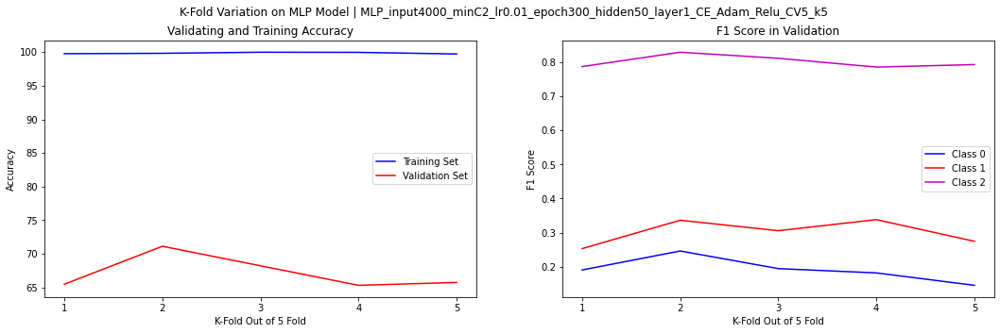

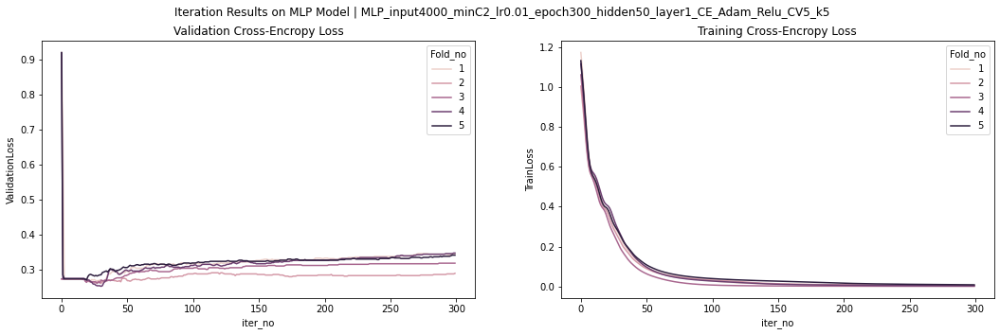

[0.2, 0.2, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.6772 %
Classification accuracy (validation data): 70.1613 % 

Average F1 Score: 0: 0.179 | 1: 0.267 | 2: 0.824 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.5619 %
Classification accuracy (validation data): 72.2581 % 

Average F1 Score: 0: 0.422 | 1: 0.267 | 2: 0.839 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9539 %
Classification accuracy (validation data): 68.7097 % 

Average F1 Score: 0: 0.158 | 1: 0.284 | 2: 0.815 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.8617 %
Classification accuracy (validation data): 70.0000 % 

Average F1 Score: 0: 0.145 | 1: 0.311 | 2: 0.826 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy (training data)

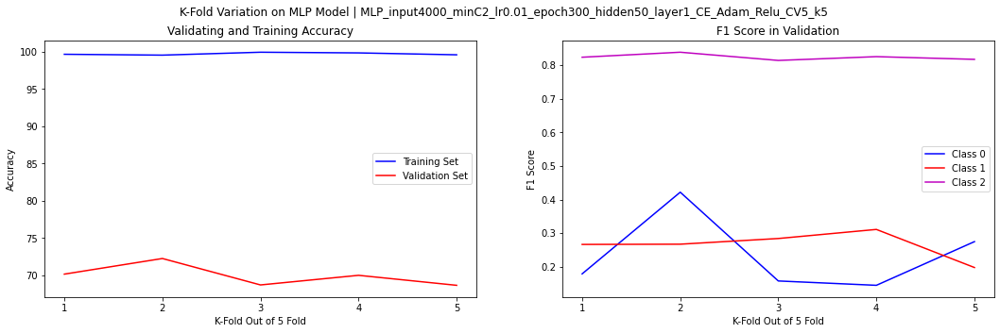

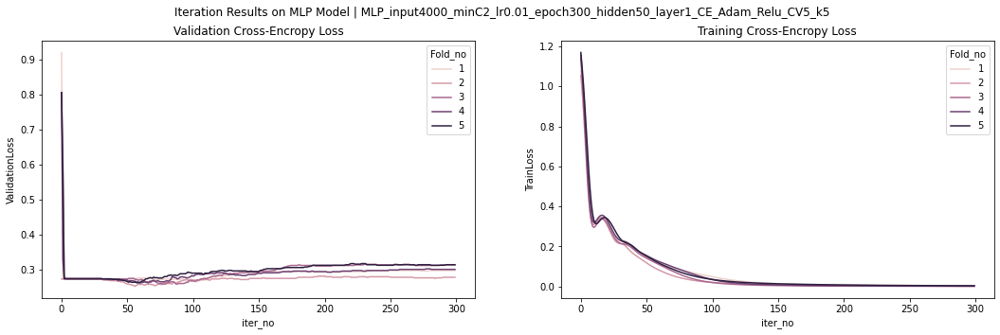

[0.2, 0.30000000000000004, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.6342 %
Classification accuracy (validation data): 68.8710 % 

Average F1 Score: 0: 0.209 | 1: 0.286 | 2: 0.814 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.5696 %
Classification accuracy (validation data): 70.1613 % 

Average F1 Score: 0: 0.379 | 1: 0.269 | 2: 0.826 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9785 %
Classification accuracy (validation data): 67.7419 % 

Average F1 Score: 0: 0.182 | 1: 0.280 | 2: 0.811 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.8063 %
Classification accuracy (validation data): 68.0645 % 

Average F1 Score: 0: 0.137 | 1: 0.333 | 2: 0.810 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy

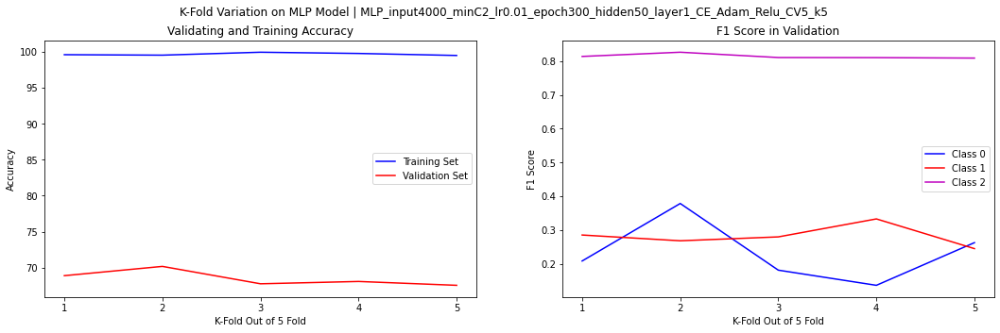

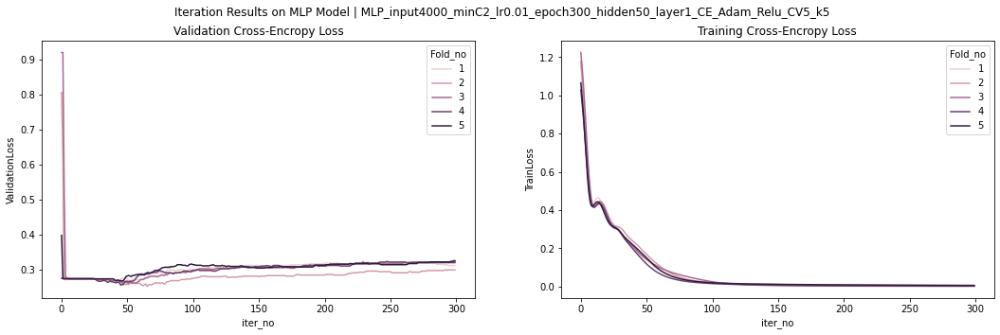

[0.2, 0.4000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.6772 %
Classification accuracy (validation data): 67.7419 % 

Average F1 Score: 0: 0.159 | 1: 0.321 | 2: 0.802 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.7176 %
Classification accuracy (validation data): 70.4839 % 

Average F1 Score: 0: 0.383 | 1: 0.273 | 2: 0.827 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.8386 %
Classification accuracy (validation data): 68.0645 % 

Average F1 Score: 0: 0.200 | 1: 0.297 | 2: 0.810 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9395 %
Classification accuracy (validation data): 66.4516 % 

Average F1 Score: 0: 0.129 | 1: 0.345 | 2: 0.795 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy 

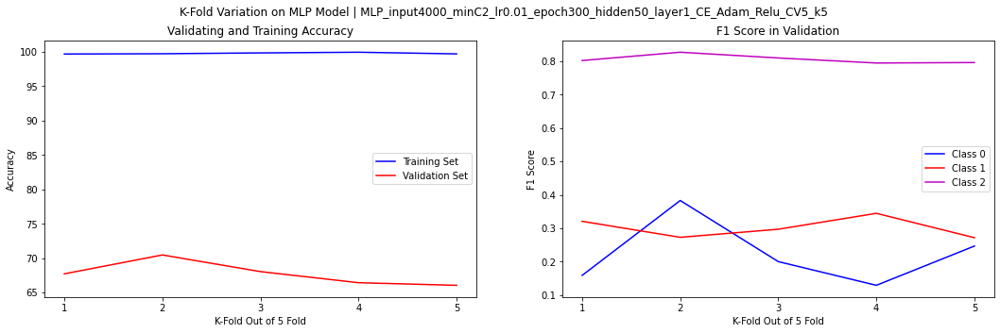

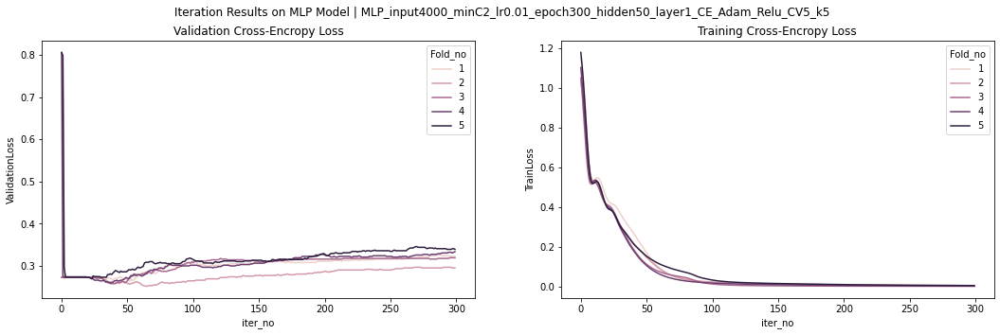

[0.2, 0.5000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.6962 %
Classification accuracy (validation data): 66.4516 % 

Average F1 Score: 0: 0.179 | 1: 0.299 | 2: 0.794 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.7152 %
Classification accuracy (validation data): 71.6129 % 

Average F1 Score: 0: 0.434 | 1: 0.321 | 2: 0.833 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.8291 %
Classification accuracy (validation data): 66.1290 % 

Average F1 Score: 0: 0.187 | 1: 0.262 | 2: 0.797 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9810 %
Classification accuracy (validation data): 66.2903 % 

Average F1 Score: 0: 0.152 | 1: 0.332 | 2: 0.796 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy 

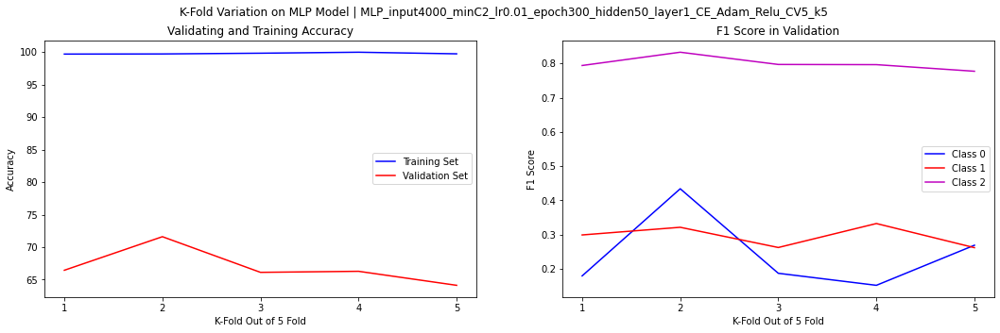

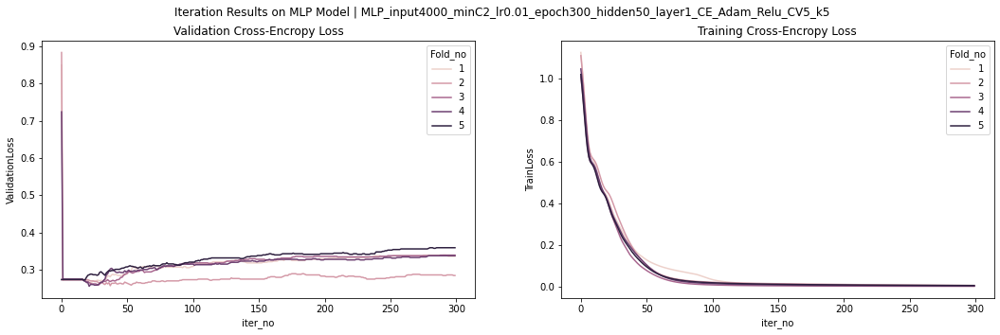

[0.30000000000000004, 0.2, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.7202 %
Classification accuracy (validation data): 70.0000 % 

Average F1 Score: 0: 0.244 | 1: 0.211 | 2: 0.828 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.8063 %
Classification accuracy (validation data): 71.2903 % 

Average F1 Score: 0: 0.374 | 1: 0.262 | 2: 0.838 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9785 %
Classification accuracy (validation data): 67.9032 % 

Average F1 Score: 0: 0.200 | 1: 0.260 | 2: 0.813 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9139 %
Classification accuracy (validation data): 69.6774 % 

Average F1 Score: 0: 0.162 | 1: 0.276 | 2: 0.823 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy

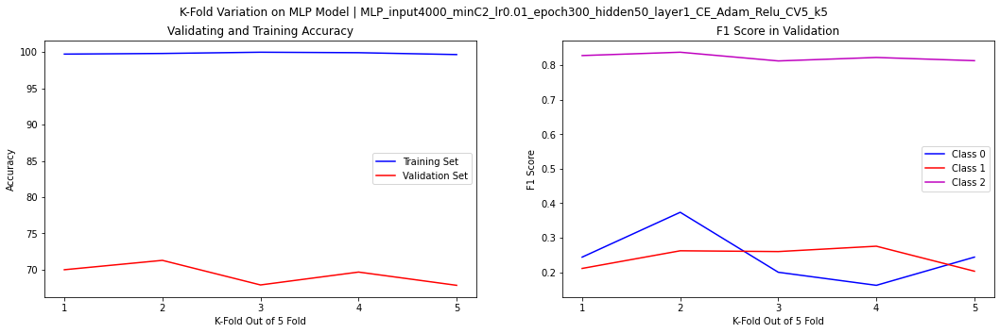

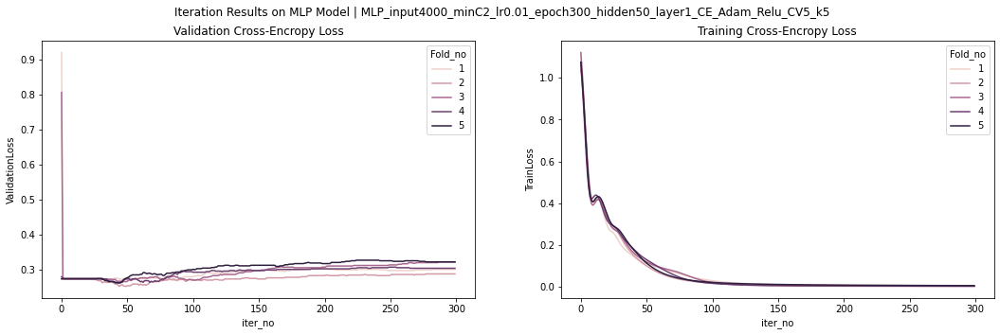

[0.30000000000000004, 0.30000000000000004, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.7176 %
Classification accuracy (validation data): 67.9032 % 

Average F1 Score: 0: 0.260 | 1: 0.256 | 2: 0.807 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.6369 %
Classification accuracy (validation data): 71.6129 % 

Average F1 Score: 0: 0.381 | 1: 0.293 | 2: 0.833 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9395 %
Classification accuracy (validation data): 67.4194 % 

Average F1 Score: 0: 0.175 | 1: 0.297 | 2: 0.806 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.6974 %
Classification accuracy (validation data): 68.8710 % 

Average F1 Score: 0: 0.162 | 1: 0.327 | 2: 0.817 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classif

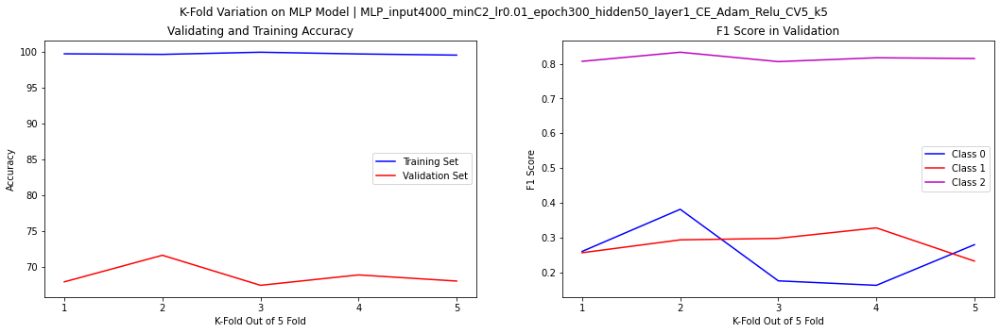

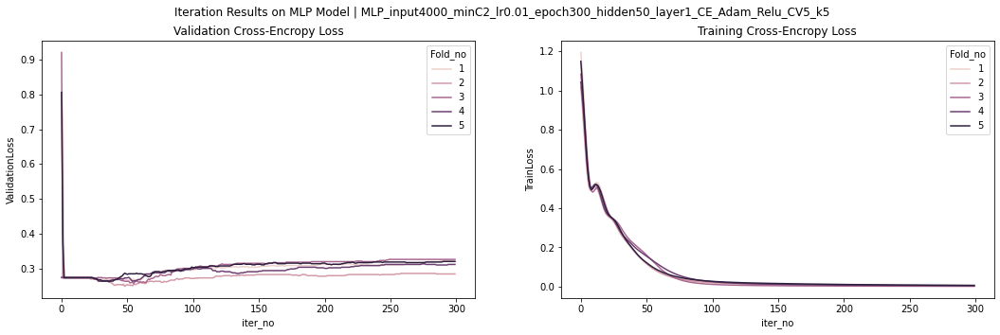

[0.30000000000000004, 0.4000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.7152 %
Classification accuracy (validation data): 66.9355 % 

Average F1 Score: 0: 0.241 | 1: 0.265 | 2: 0.806 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.7912 %
Classification accuracy (validation data): 70.8065 % 

Average F1 Score: 0: 0.422 | 1: 0.290 | 2: 0.827 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9430 %
Classification accuracy (validation data): 67.4194 % 

Average F1 Score: 0: 0.154 | 1: 0.305 | 2: 0.805 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9620 %
Classification accuracy (validation data): 65.4839 % 

Average F1 Score: 0: 0.174 | 1: 0.342 | 2: 0.785 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classifi

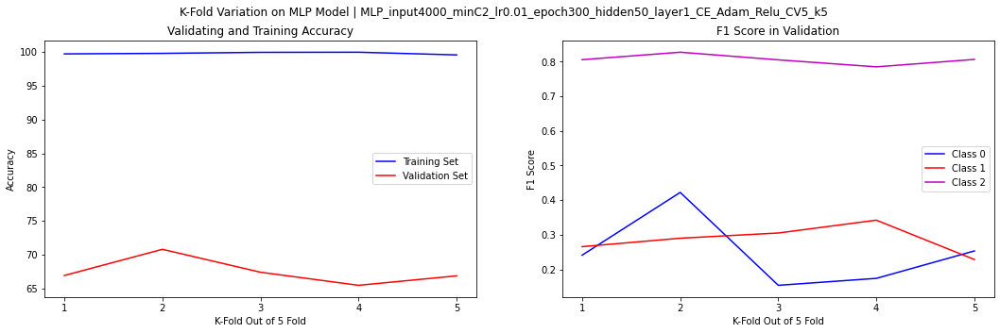

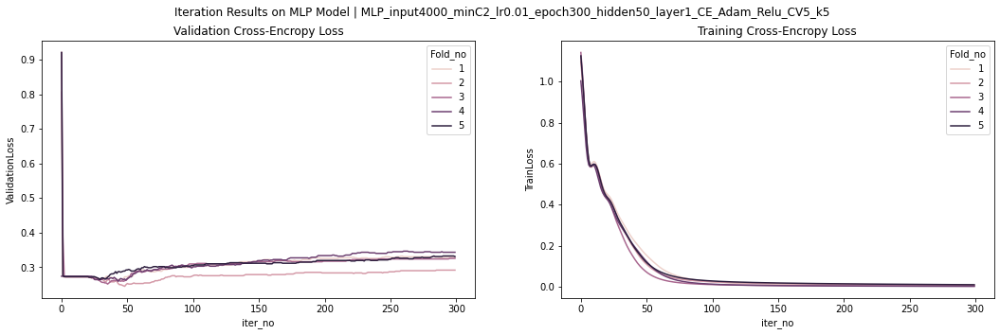

[0.30000000000000004, 0.5000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.7131 %
Classification accuracy (validation data): 65.0000 % 

Average F1 Score: 0: 0.225 | 1: 0.263 | 2: 0.790 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.7310 %
Classification accuracy (validation data): 71.1290 % 

Average F1 Score: 0: 0.419 | 1: 0.300 | 2: 0.828 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9283 %
Classification accuracy (validation data): 67.2581 % 

Average F1 Score: 0: 0.217 | 1: 0.298 | 2: 0.805 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9821 %
Classification accuracy (validation data): 64.6774 % 

Average F1 Score: 0: 0.141 | 1: 0.327 | 2: 0.782 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classifi

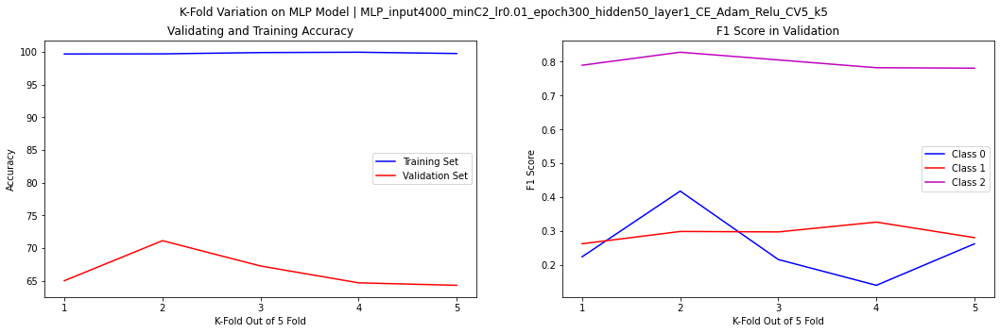

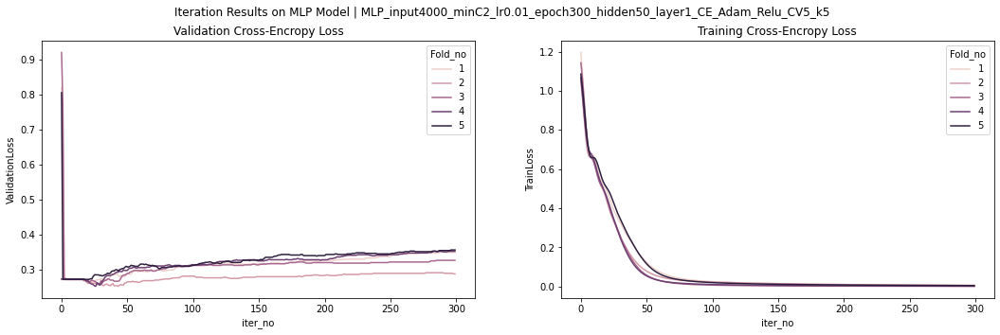

[0.4, 0.2, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.7377 %
Classification accuracy (validation data): 69.1935 % 

Average F1 Score: 0: 0.234 | 1: 0.238 | 2: 0.819 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9395 %
Classification accuracy (validation data): 72.9032 % 

Average F1 Score: 0: 0.422 | 1: 0.309 | 2: 0.848 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9798 %
Classification accuracy (validation data): 68.5484 % 

Average F1 Score: 0: 0.257 | 1: 0.253 | 2: 0.818 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.8790 %
Classification accuracy (validation data): 69.0323 % 

Average F1 Score: 0: 0.198 | 1: 0.271 | 2: 0.819 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy (training data)

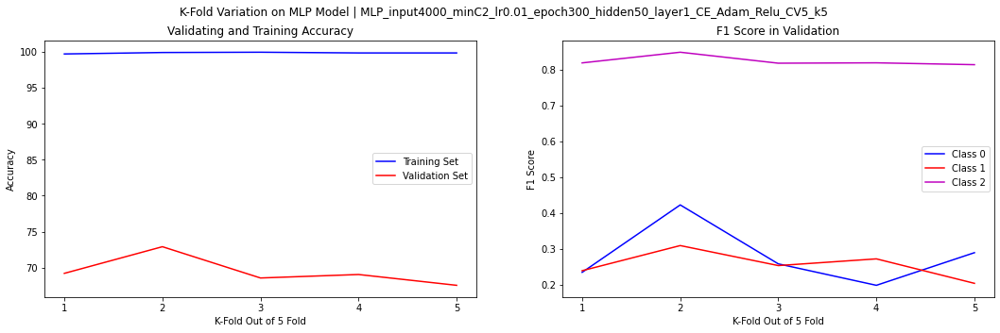

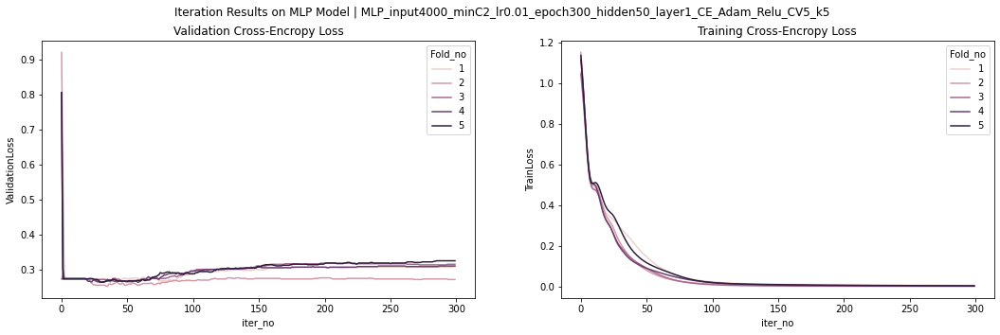

[0.4, 0.30000000000000004, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.8481 %
Classification accuracy (validation data): 67.0968 % 

Average F1 Score: 0: 0.258 | 1: 0.333 | 2: 0.800 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.6582 %
Classification accuracy (validation data): 70.6452 % 

Average F1 Score: 0: 0.370 | 1: 0.273 | 2: 0.829 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9430 %
Classification accuracy (validation data): 68.2258 % 

Average F1 Score: 0: 0.186 | 1: 0.288 | 2: 0.814 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.8671 %
Classification accuracy (validation data): 67.9032 % 

Average F1 Score: 0: 0.228 | 1: 0.304 | 2: 0.807 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy

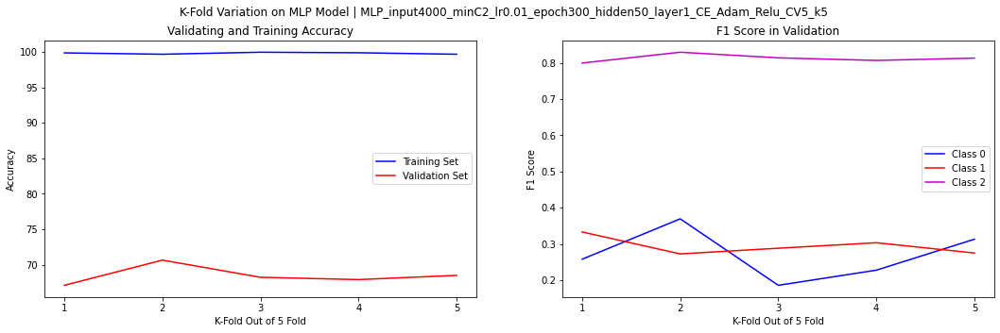

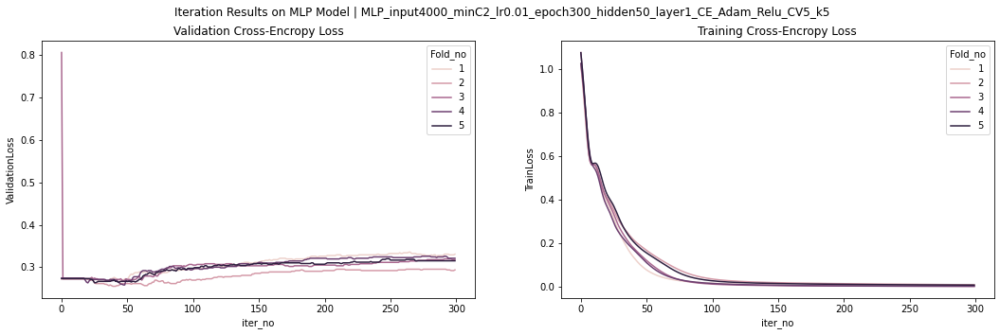

[0.4, 0.4000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.7669 %
Classification accuracy (validation data): 67.0968 % 

Average F1 Score: 0: 0.235 | 1: 0.288 | 2: 0.802 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.8924 %
Classification accuracy (validation data): 69.3548 % 

Average F1 Score: 0: 0.385 | 1: 0.275 | 2: 0.820 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9462 %
Classification accuracy (validation data): 65.1613 % 

Average F1 Score: 0: 0.209 | 1: 0.320 | 2: 0.785 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.8566 %
Classification accuracy (validation data): 68.7097 % 

Average F1 Score: 0: 0.211 | 1: 0.333 | 2: 0.812 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy 

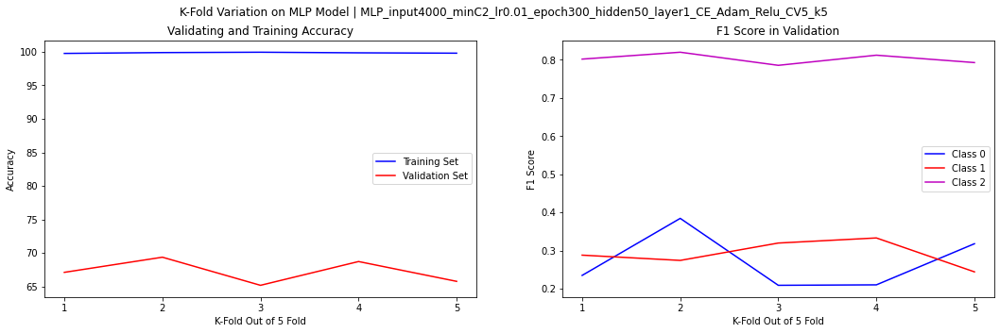

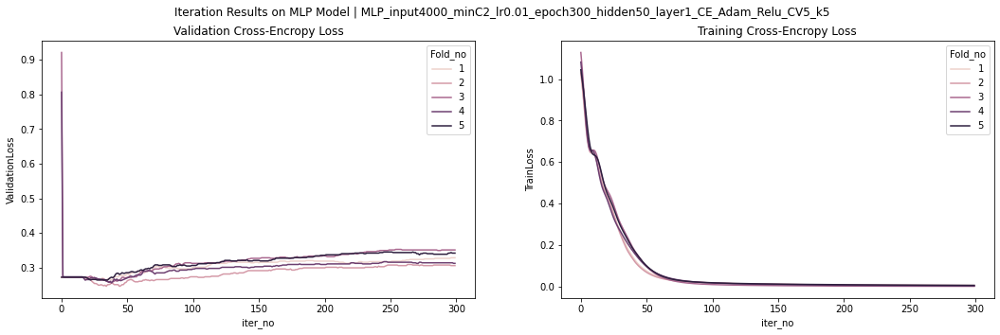

[0.4, 0.5000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.8471 %
Classification accuracy (validation data): 63.8710 % 

Average F1 Score: 0: 0.235 | 1: 0.283 | 2: 0.777 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.8131 %
Classification accuracy (validation data): 67.0968 % 

Average F1 Score: 0: 0.347 | 1: 0.296 | 2: 0.800 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9321 %
Classification accuracy (validation data): 67.2581 % 

Average F1 Score: 0: 0.220 | 1: 0.300 | 2: 0.805 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9830 %
Classification accuracy (validation data): 65.0000 % 

Average F1 Score: 0: 0.164 | 1: 0.332 | 2: 0.783 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy 

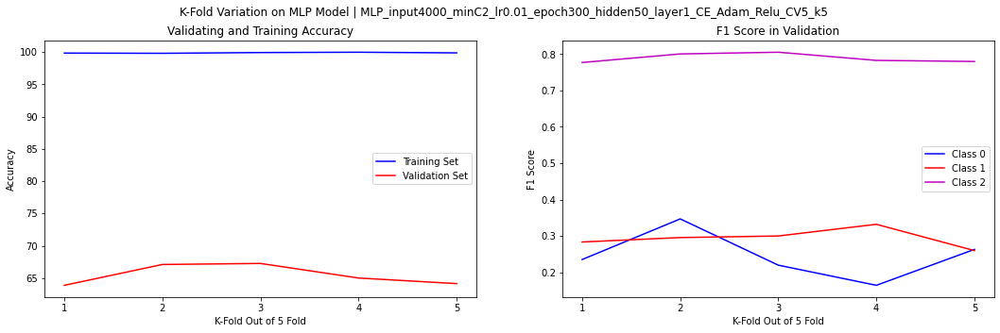

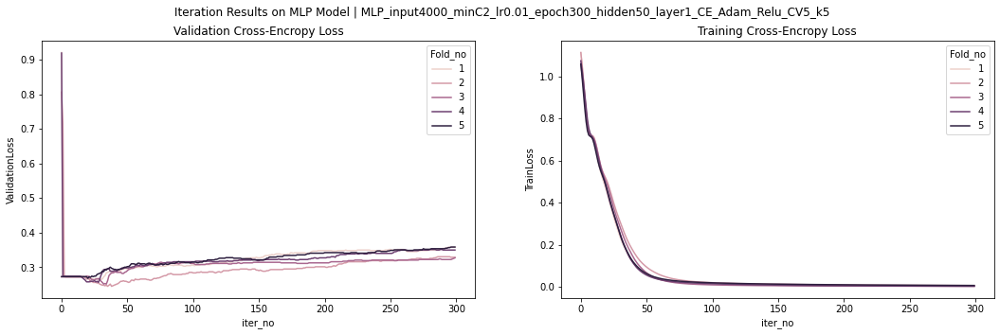

[0.5, 0.2, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.9241 %
Classification accuracy (validation data): 68.0645 % 

Average F1 Score: 0: 0.237 | 1: 0.261 | 2: 0.817 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9051 %
Classification accuracy (validation data): 70.8065 % 

Average F1 Score: 0: 0.357 | 1: 0.250 | 2: 0.834 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9810 %
Classification accuracy (validation data): 69.0323 % 

Average F1 Score: 0: 0.268 | 1: 0.267 | 2: 0.821 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9241 %
Classification accuracy (validation data): 68.7097 % 

Average F1 Score: 0: 0.150 | 1: 0.271 | 2: 0.818 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy (training data)

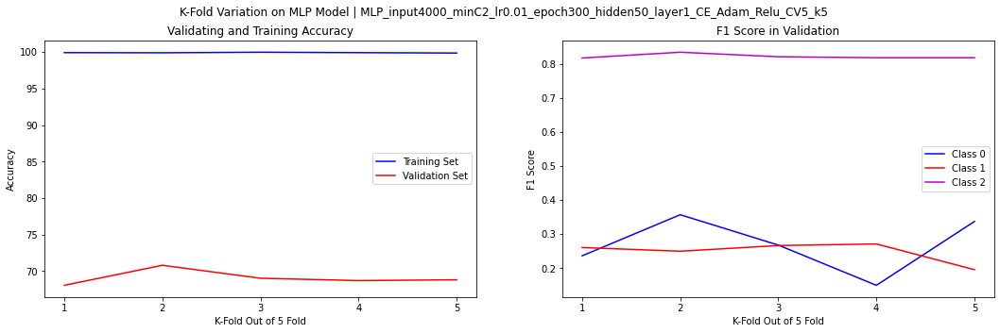

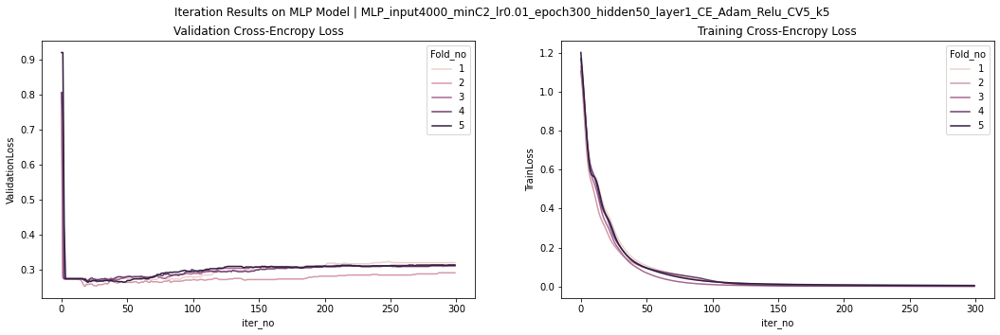

[0.5, 0.30000000000000004, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.8924 %
Classification accuracy (validation data): 67.4194 % 

Average F1 Score: 0: 0.253 | 1: 0.244 | 2: 0.811 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.7131 %
Classification accuracy (validation data): 70.1613 % 

Average F1 Score: 0: 0.365 | 1: 0.274 | 2: 0.829 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.8924 %
Classification accuracy (validation data): 67.7419 % 

Average F1 Score: 0: 0.205 | 1: 0.299 | 2: 0.808 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.7131 %
Classification accuracy (validation data): 68.7097 % 

Average F1 Score: 0: 0.217 | 1: 0.320 | 2: 0.814 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy

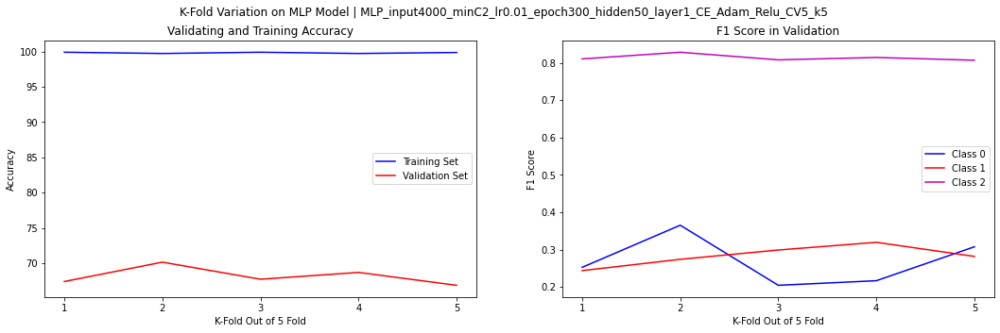

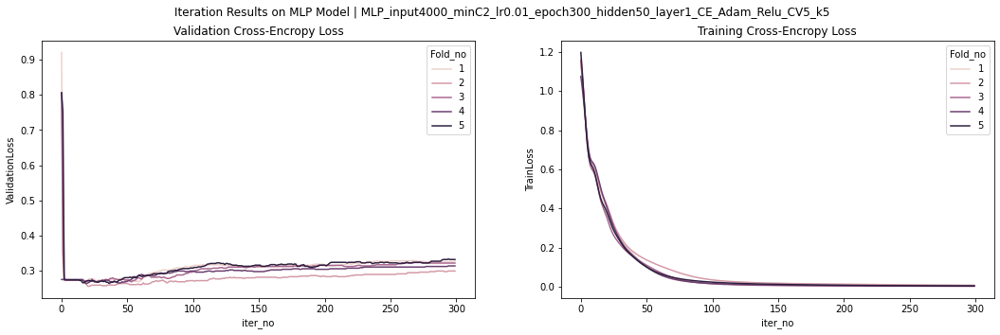

[0.5, 0.4000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.8471 %
Classification accuracy (validation data): 66.6129 % 

Average F1 Score: 0: 0.264 | 1: 0.317 | 2: 0.799 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9151 %
Classification accuracy (validation data): 68.8710 % 

Average F1 Score: 0: 0.340 | 1: 0.282 | 2: 0.819 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9490 %
Classification accuracy (validation data): 67.5806 % 

Average F1 Score: 0: 0.257 | 1: 0.311 | 2: 0.805 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9490 %
Classification accuracy (validation data): 66.1290 % 

Average F1 Score: 0: 0.205 | 1: 0.325 | 2: 0.793 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy 

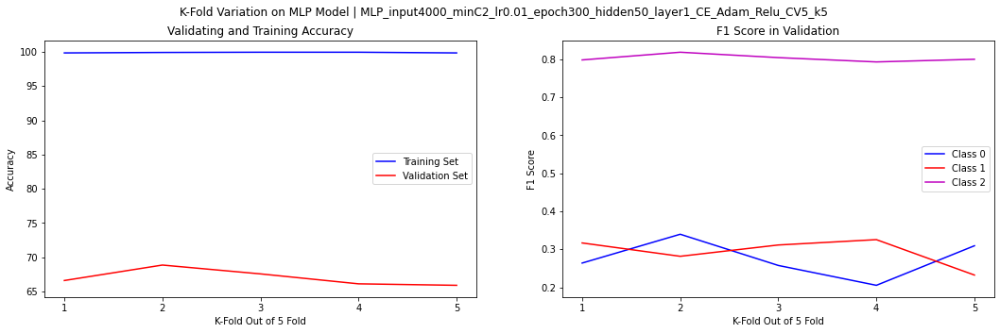

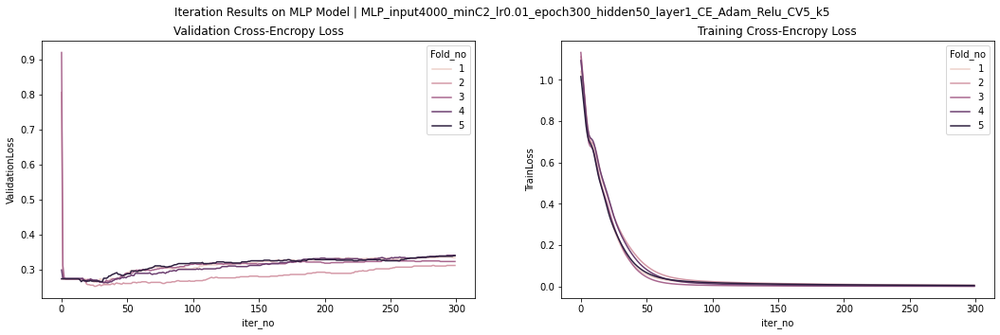

[0.5, 0.5000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.9032 %
Classification accuracy (validation data): 63.3871 % 

Average F1 Score: 0: 0.191 | 1: 0.272 | 2: 0.777 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.8386 %
Classification accuracy (validation data): 69.3548 % 

Average F1 Score: 0: 0.378 | 1: 0.281 | 2: 0.822 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9355 %
Classification accuracy (validation data): 67.7419 % 

Average F1 Score: 0: 0.269 | 1: 0.287 | 2: 0.811 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9839 %
Classification accuracy (validation data): 67.0968 % 

Average F1 Score: 0: 0.167 | 1: 0.346 | 2: 0.804 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy 

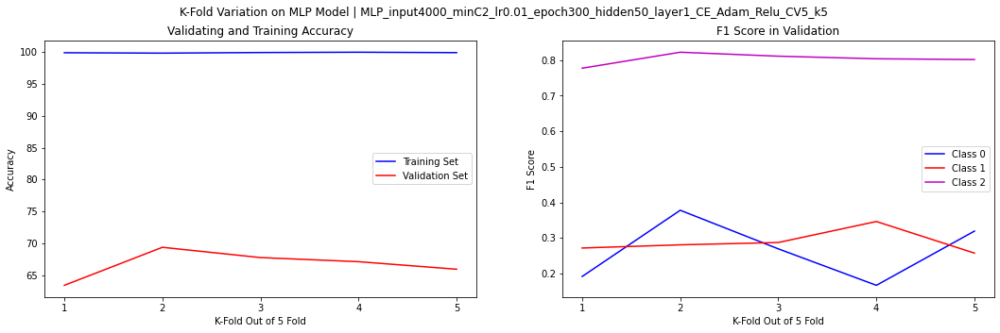

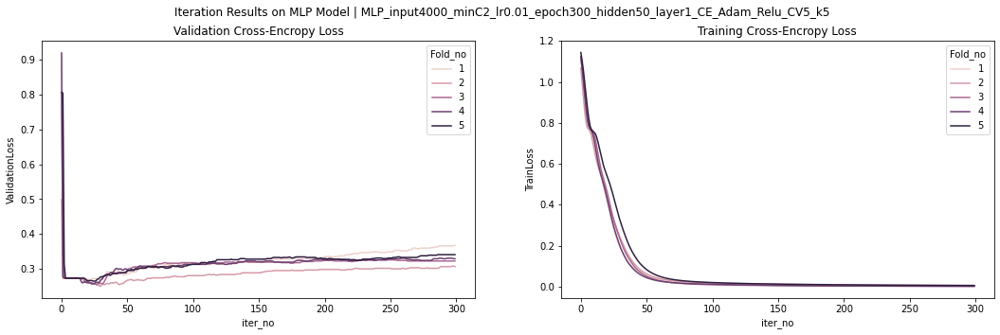

In [310]:
OptimizerName = 'Adam'
lossFunc = 'CE'
ActivationFunc1 = 'Relu'
ActivationFunc2 = None
layer = 1
learning_rate = 0.01
hidden_size = 50
early_stopping =-1
num_epochs = 300
k= 5
#over_proportion_list=[0.3,0.3,1]
classes=[0,1,2]
min_count = 2
SMOTE_bool=True
cv = 5
kFold = StratifiedKFold(n_splits=cv, shuffle=True, random_state=123)


grid_search1_sum = pd.DataFrame(columns=list(overview_training.columns))  
grid_search1_iter = pd.DataFrame(columns=list(iterResult.columns))  

for class0_p in np.arange(0.1,0.6,0.1):
    for class1_p in np.arange(0.2,0.6,0.1):
        over_proportion_list = [class0_p,class1_p,1]
        print(over_proportion_list)
        sum_overview , sum_iter,_ = Train_MLP(df_train,layer, ActivationFunc1,OptimizerName,learning_rate, hidden_size, num_epochs, kFold,lossFunc, early_stopping,SMOTE,k,over_proportion_list,classes,min_count,ActivationFunc2)
        grid_search1_sum = pd.concat([grid_search1_sum,sum_overview],axis=0)
        grid_search1_iter = pd.concat([grid_search1_iter,sum_iter],axis=0)

In [314]:
grid_search1_sum.reset_index(drop=True).sort_values(by=['Generalization_Accuracy','Fscore_class0','Fscore_class1'],ascending=False)

,ID,Model,Cross_Validation,input_size,Vectorizer_minCount,learning_rate,num_epochs,hidden_size,layer_no,activationFunction,criterion,optimizer,trainingTime,Training_Accuracy,Generalization_Accuracy,Fscore_class0,Fscore_class1,Fscore_class2,k_value
0,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,1,Relu,CE,Adam,74.899370,96.275143,70.312210,0.124458,0.278959,0.825182,5
4,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,1,Relu,CE,Adam,78.833940,99.732534,69.957632,0.235830,0.265519,0.824285,5
12,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,1,Relu,CE,Adam,93.616880,99.882994,69.441138,0.279880,0.254777,0.823385,5
8,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,1,Relu,CE,Adam,84.939450,99.814934,69.344468,0.244760,0.242392,0.822955,5
16,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,1,Relu,CE,Adam,104.634742,99.920258,69.086716,0.269819,0.248954,0.821505,5
9,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,1,Relu,CE,Adam,105.305583,99.705467,68.763875,0.251385,0.281094,0.815503,5
13,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,1,Relu,CE,Adam,109.237222,99.794950,68.473709,0.270955,0.294665,0.812611,5
5,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,1,Relu,CE,Adam,96.506473,99.703034,68.473396,0.233973,0.282670,0.813973,5
1,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,1,Relu,CE,Adam,94.800227,99.709477,68.408880,0.185483,0.282447,0.812243,5
17,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,1,Relu,CE,Adam,100.432008,99.813520,68.182865,0.269424,0.283731,0.813767,5


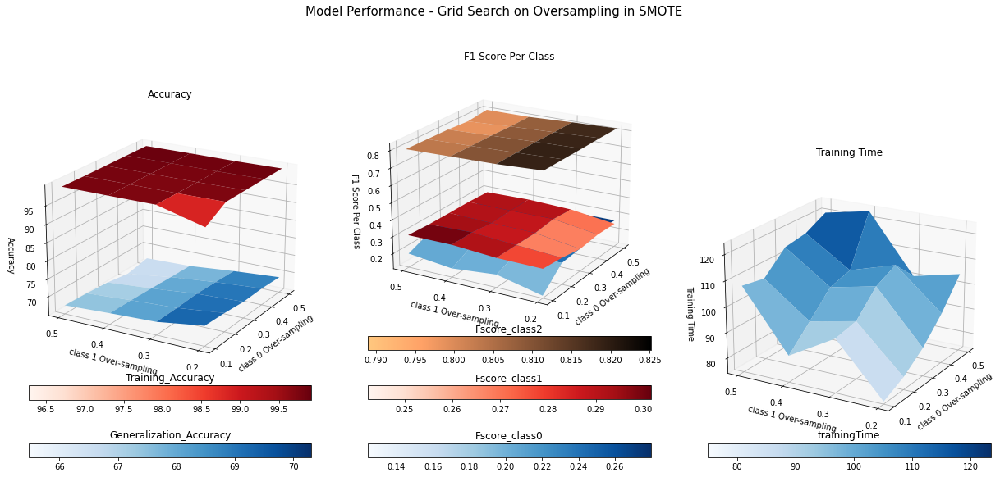

In [313]:
# Visualize influence of the Grid Search
%matplotlib inline

gridX = np.arange(0.1,0.6,0.1)
gridY = np.arange(0.2,0.6,0.1)

cmapList = ['Blues','Reds','copper_r']

Y, X = np.meshgrid(np.array(gridY), np.array(gridX))
gridXname = 'class 0 Over-sampling'
gridYname = 'class 1 Over-sampling'
fig3, ax3 = plt.subplots(figsize=(21,10),ncols=3,subplot_kw={"projection": "3d"},sharex=True)
metric = ['Accuracy','F1 Score Per Class','Training Time']

data = grid_search1_sum.reset_index(drop=True)

for i in range(3):
    if metric[i] == 'Accuracy':
        m = ['Generalization_Accuracy','Training_Accuracy']
    elif metric[i] =='F1 Score Per Class':
        m=['Fscore_class0','Fscore_class1','Fscore_class2']
    elif metric[i] =='Training Time':
        m=['trainingTime']
        
    for j in range(len(m)):
        
        Z = [[0]*len(gridY)]*len(gridX) # Create empty matrix
        for w in range(len(gridX)):
            Z[w] = list(data.loc[len(gridY)*w:(len(gridY)*w + len(gridY)-1) ,m[j]].values)  # Fill up with request matrix
        
        Z = np.array(Z)
        surf = ax3[i].plot_surface(X,Y,Z,label=m[j],cmap=cmapList[j], antialiased=True, linewidth=10,vmin=Z.min(),vmax=Z.max())
        cbar = fig3.colorbar(surf, ax=ax3[i],orientation='horizontal',pad=len(m)/1000)
        cbar.ax.set_title(m[j])
    ax3[i].set_xlabel(gridXname)
    ax3[i].set_ylabel(gridYname)
    ax3[i].set_zlabel(metric[i])
    ax3[i].set_title(metric[i])
    ax3[i].view_init(20, 210)        
    ax3[i].set_xticks(ticks=gridX,minor=False)
    ax3[i].set_yticks(ticks=gridY,minor=False)

plt.suptitle('Model Performance - Grid Search on Oversampling in SMOTE',fontsize=15)
plt.show()

fig3.savefig('chart/Grid_Search_SMOTE.jpg')

[0.1, 0.2, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.9503 %
Classification accuracy (validation data): 65.0000 % 

Average F1 Score: 0: 0.182 | 1: 0.308 | 2: 0.784 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9255 %
Classification accuracy (validation data): 71.2903 % 

Average F1 Score: 0: 0.274 | 1: 0.242 | 2: 0.832 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.8758 %
Classification accuracy (validation data): 68.7097 % 

Average F1 Score: 0: 0.000 | 1: 0.305 | 2: 0.812 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9503 %
Classification accuracy (validation data): 69.5161 % 

Average F1 Score: 0: 0.159 | 1: 0.323 | 2: 0.821 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy (training data)

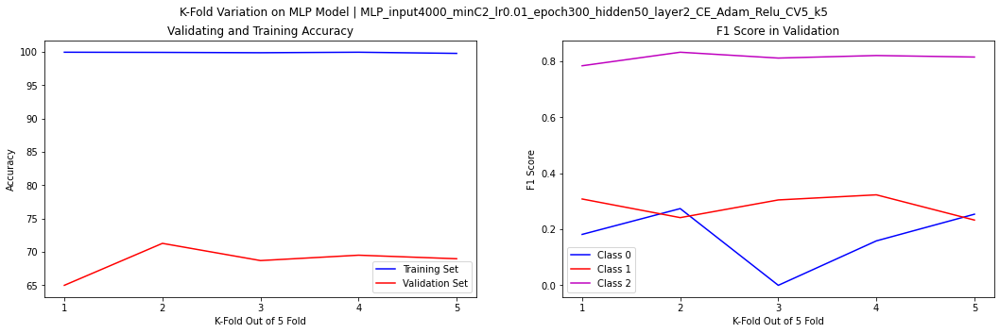

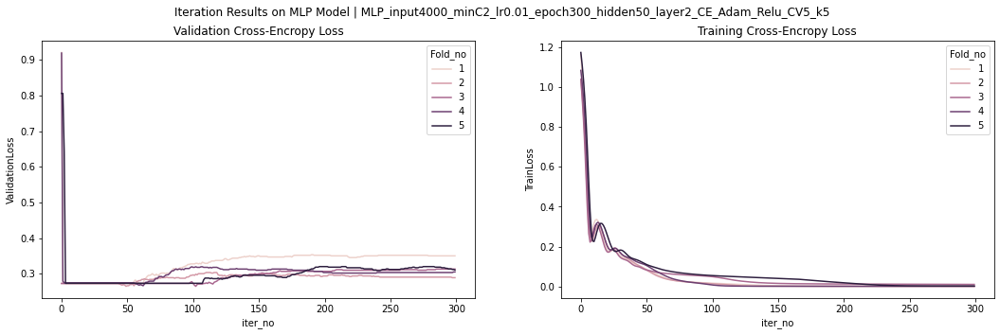

[0.1, 0.30000000000000004, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.9308 %
Classification accuracy (validation data): 66.4516 % 

Average F1 Score: 0: 0.241 | 1: 0.317 | 2: 0.787 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9078 %
Classification accuracy (validation data): 70.6452 % 

Average F1 Score: 0: 0.293 | 1: 0.357 | 2: 0.826 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9769 %
Classification accuracy (validation data): 67.2581 % 

Average F1 Score: 0: 0.145 | 1: 0.314 | 2: 0.802 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9539 %
Classification accuracy (validation data): 69.3548 % 

Average F1 Score: 0: 0.185 | 1: 0.322 | 2: 0.819 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy

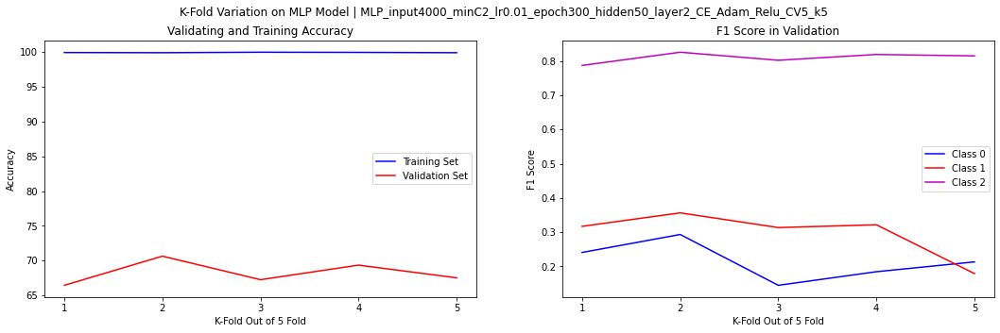

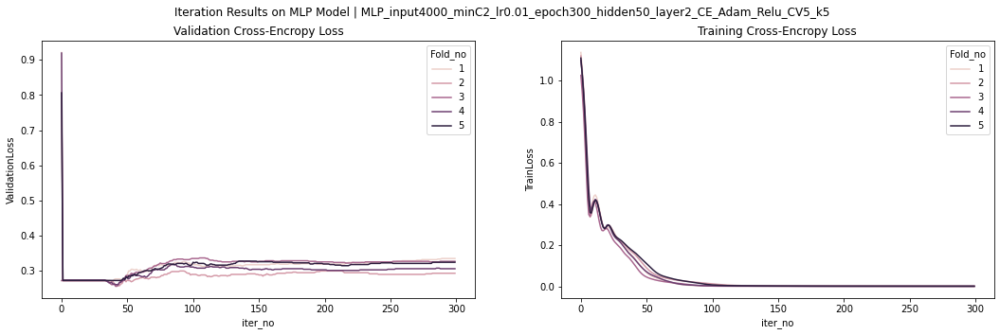

[0.1, 0.4000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.8924 %
Classification accuracy (validation data): 66.7742 % 

Average F1 Score: 0: 0.100 | 1: 0.311 | 2: 0.797 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9570 %
Classification accuracy (validation data): 71.4516 % 

Average F1 Score: 0: 0.356 | 1: 0.316 | 2: 0.832 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9785 %
Classification accuracy (validation data): 68.7097 % 

Average F1 Score: 0: 0.116 | 1: 0.306 | 2: 0.815 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9785 %
Classification accuracy (validation data): 65.3226 % 

Average F1 Score: 0: 0.156 | 1: 0.345 | 2: 0.787 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy 

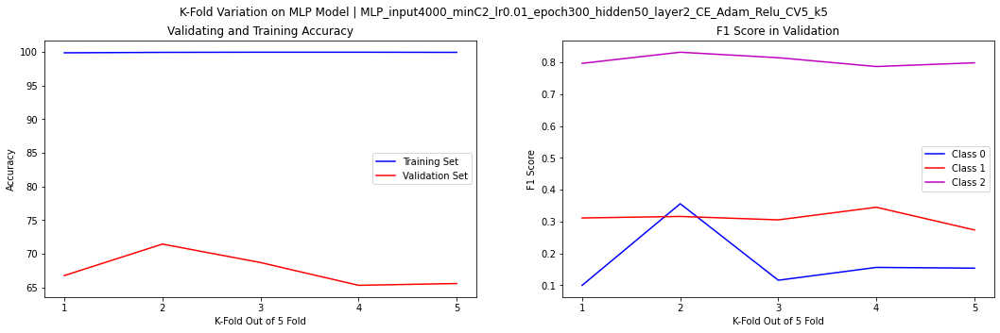

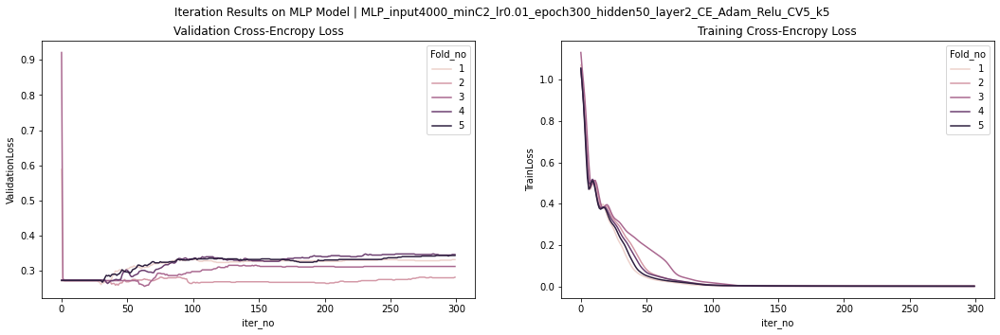

[0.1, 0.5000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.9193 %
Classification accuracy (validation data): 63.8710 % 

Average F1 Score: 0: 0.095 | 1: 0.307 | 2: 0.774 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9395 %
Classification accuracy (validation data): 71.2903 % 

Average F1 Score: 0: 0.273 | 1: 0.339 | 2: 0.832 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9798 %
Classification accuracy (validation data): 66.4516 % 

Average F1 Score: 0: 0.174 | 1: 0.316 | 2: 0.797 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9798 %
Classification accuracy (validation data): 65.9677 % 

Average F1 Score: 0: 0.152 | 1: 0.326 | 2: 0.793 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy 

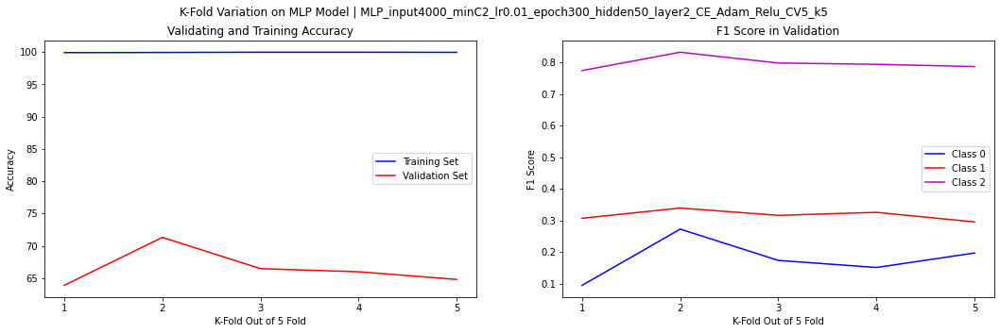

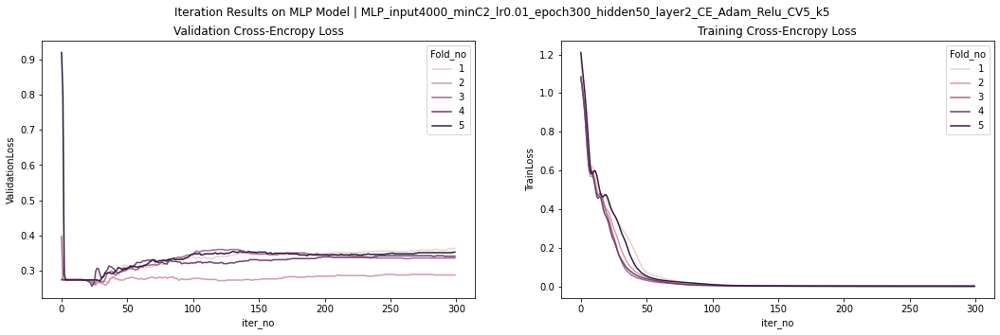

[0.2, 0.2, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.9539 %
Classification accuracy (validation data): 67.2581 % 

Average F1 Score: 0: 0.230 | 1: 0.263 | 2: 0.806 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9308 %
Classification accuracy (validation data): 71.7742 % 

Average F1 Score: 0: 0.348 | 1: 0.257 | 2: 0.843 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9769 %
Classification accuracy (validation data): 68.0645 % 

Average F1 Score: 0: 0.186 | 1: 0.269 | 2: 0.816 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.8155 %
Classification accuracy (validation data): 69.5161 % 

Average F1 Score: 0: 0.250 | 1: 0.314 | 2: 0.817 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy (training data)

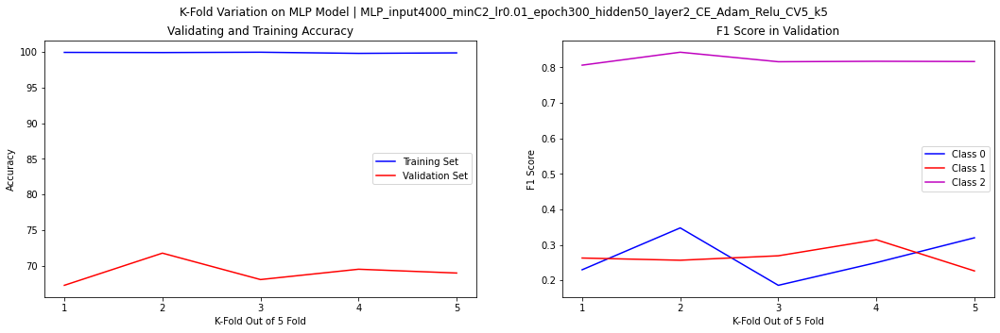

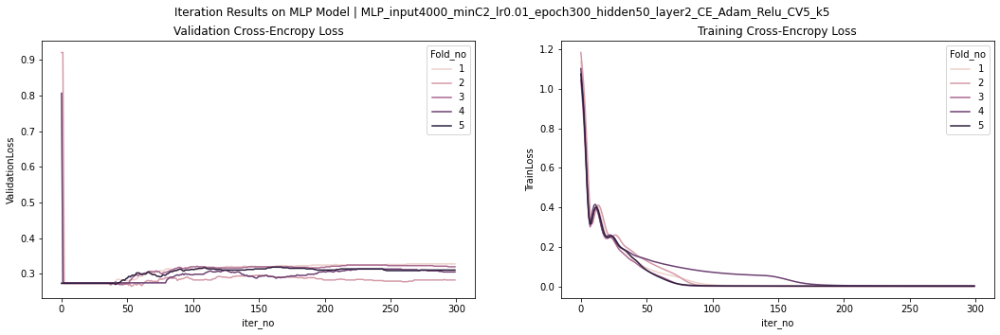

[0.2, 0.30000000000000004, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.9139 %
Classification accuracy (validation data): 67.5806 % 

Average F1 Score: 0: 0.206 | 1: 0.331 | 2: 0.800 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9139 %
Classification accuracy (validation data): 70.4839 % 

Average F1 Score: 0: 0.378 | 1: 0.305 | 2: 0.826 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9785 %
Classification accuracy (validation data): 68.5484 % 

Average F1 Score: 0: 0.215 | 1: 0.296 | 2: 0.816 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9570 %
Classification accuracy (validation data): 69.3548 % 

Average F1 Score: 0: 0.229 | 1: 0.301 | 2: 0.818 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy

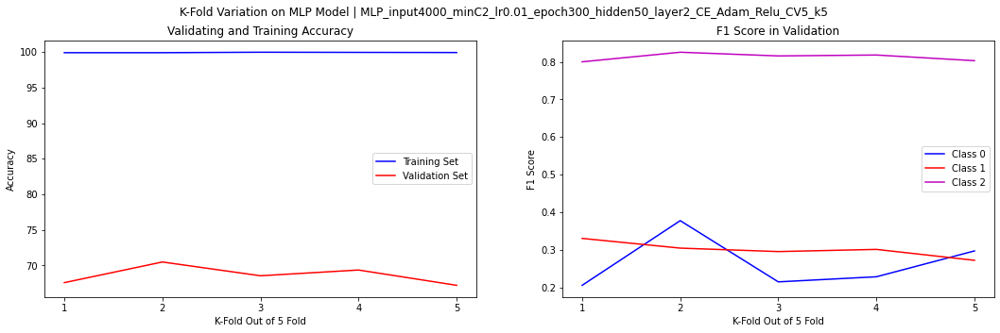

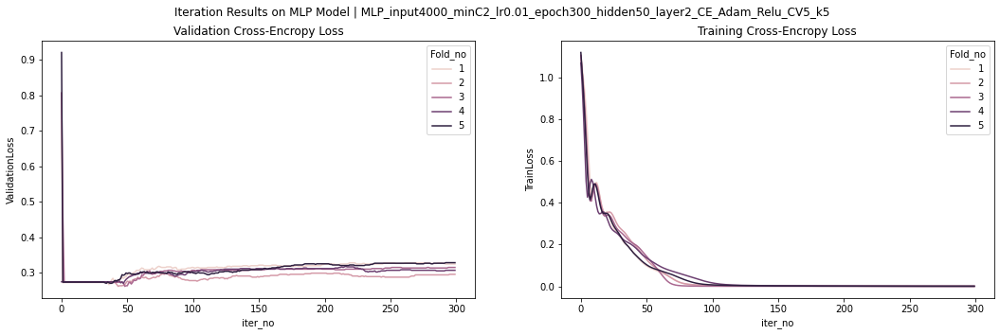

[0.2, 0.4000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.8386 %
Classification accuracy (validation data): 67.9032 % 

Average F1 Score: 0: 0.169 | 1: 0.284 | 2: 0.808 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9193 %
Classification accuracy (validation data): 71.9355 % 

Average F1 Score: 0: 0.346 | 1: 0.308 | 2: 0.837 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9798 %
Classification accuracy (validation data): 67.0968 % 

Average F1 Score: 0: 0.158 | 1: 0.270 | 2: 0.807 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9798 %
Classification accuracy (validation data): 68.0645 % 

Average F1 Score: 0: 0.159 | 1: 0.352 | 2: 0.808 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy 

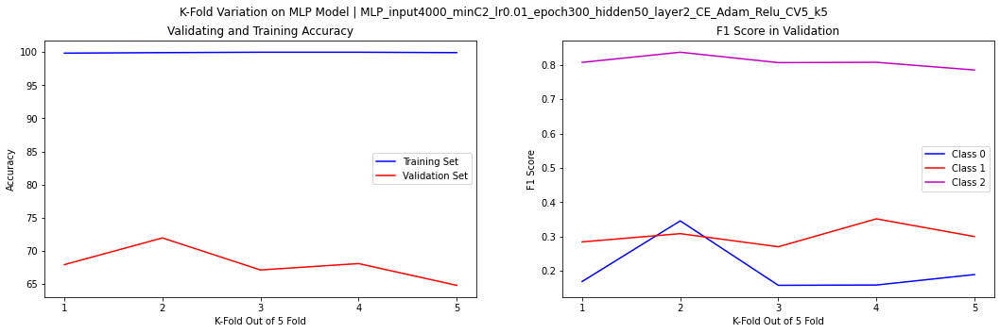

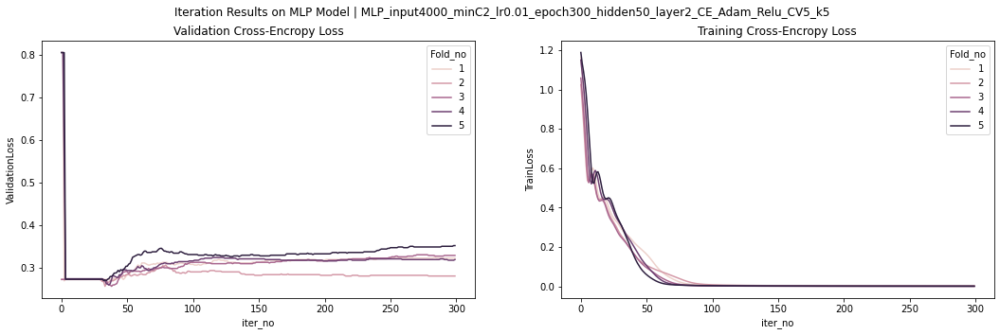

[0.2, 0.5000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.9051 %
Classification accuracy (validation data): 65.1613 % 

Average F1 Score: 0: 0.225 | 1: 0.313 | 2: 0.783 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9430 %
Classification accuracy (validation data): 70.4839 % 

Average F1 Score: 0: 0.400 | 1: 0.277 | 2: 0.829 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9810 %
Classification accuracy (validation data): 67.2581 % 

Average F1 Score: 0: 0.198 | 1: 0.262 | 2: 0.806 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9810 %
Classification accuracy (validation data): 68.5484 % 

Average F1 Score: 0: 0.188 | 1: 0.352 | 2: 0.810 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy 

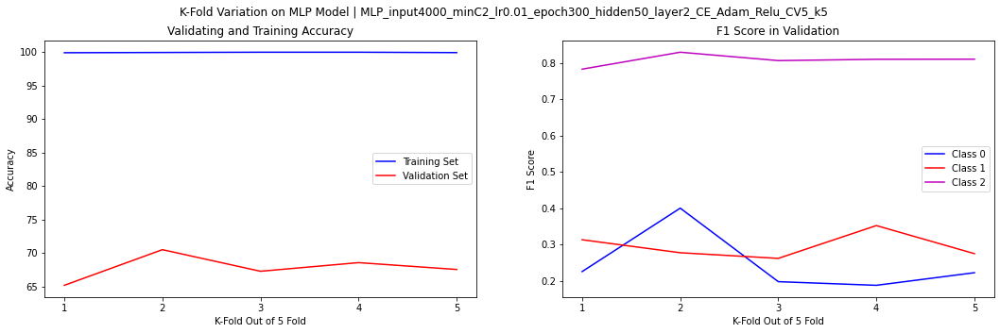

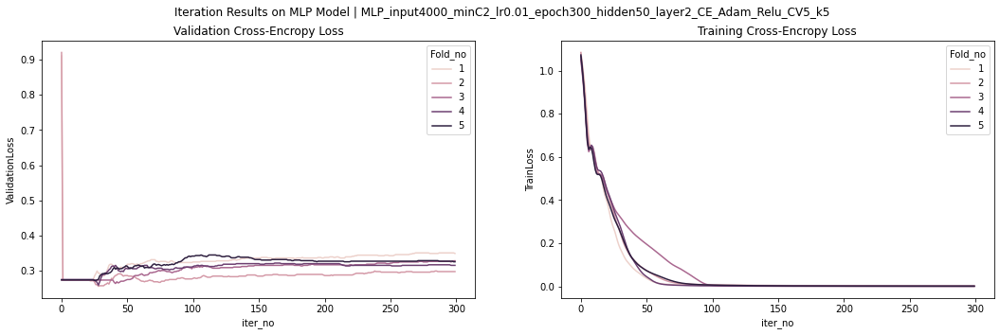

[0.30000000000000004, 0.2, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.9354 %
Classification accuracy (validation data): 69.1935 % 

Average F1 Score: 0: 0.235 | 1: 0.242 | 2: 0.821 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9139 %
Classification accuracy (validation data): 71.1290 % 

Average F1 Score: 0: 0.371 | 1: 0.287 | 2: 0.837 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9785 %
Classification accuracy (validation data): 68.8710 % 

Average F1 Score: 0: 0.171 | 1: 0.300 | 2: 0.818 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9570 %
Classification accuracy (validation data): 68.8710 % 

Average F1 Score: 0: 0.256 | 1: 0.288 | 2: 0.819 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy

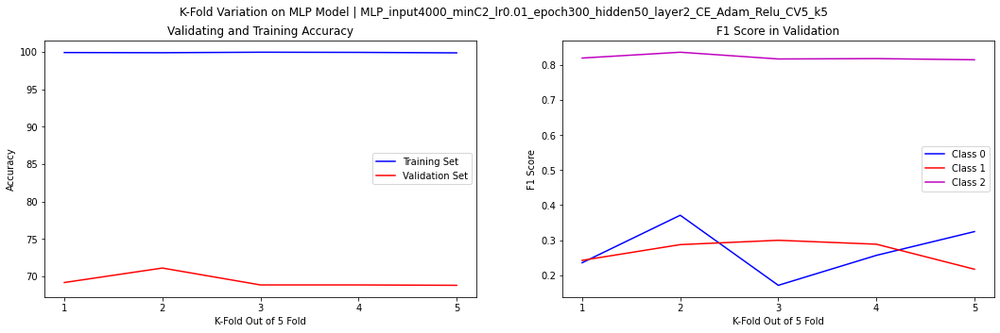

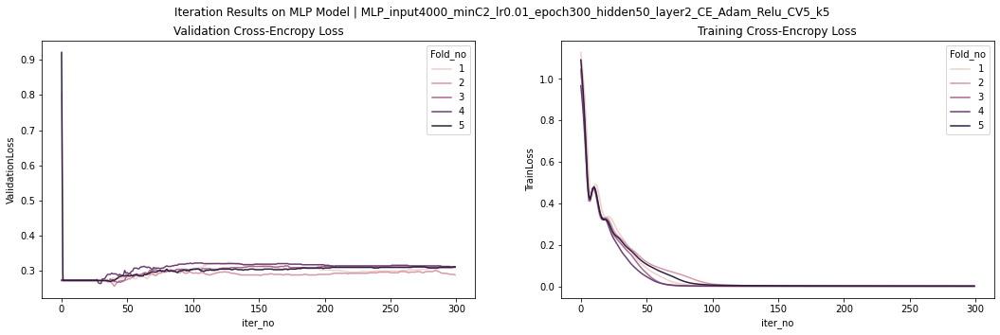

[0.30000000000000004, 0.30000000000000004, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.8588 %
Classification accuracy (validation data): 68.5484 % 

Average F1 Score: 0: 0.200 | 1: 0.295 | 2: 0.810 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.8991 %
Classification accuracy (validation data): 68.5484 % 

Average F1 Score: 0: 0.364 | 1: 0.313 | 2: 0.817 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9798 %
Classification accuracy (validation data): 69.0323 % 

Average F1 Score: 0: 0.137 | 1: 0.326 | 2: 0.815 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9597 %
Classification accuracy (validation data): 67.4194 % 

Average F1 Score: 0: 0.162 | 1: 0.343 | 2: 0.803 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classif

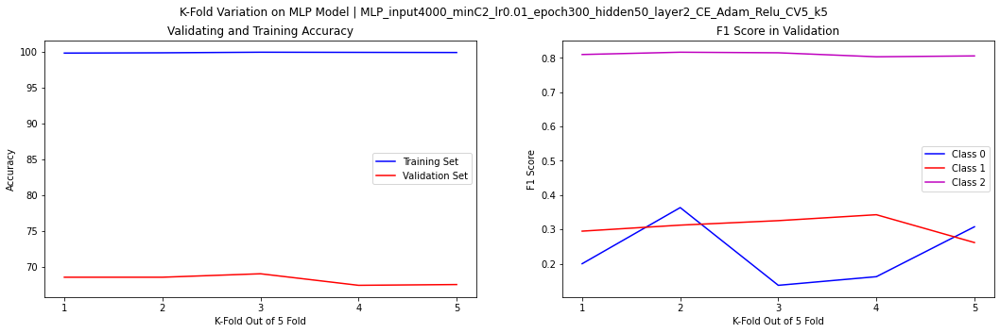

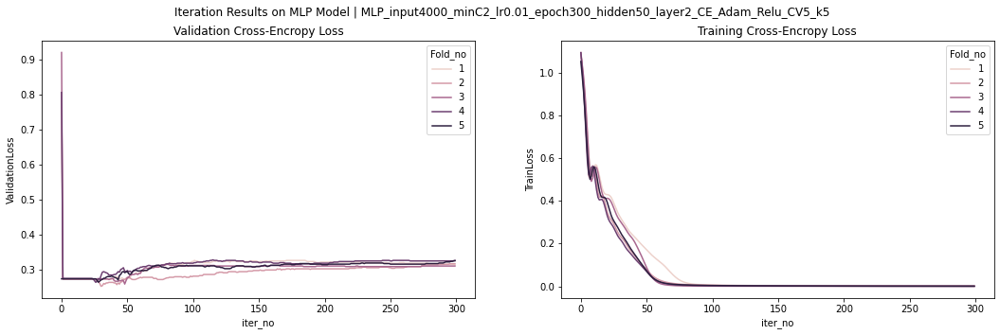

[0.30000000000000004, 0.4000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.8671 %
Classification accuracy (validation data): 67.2581 % 

Average F1 Score: 0: 0.192 | 1: 0.316 | 2: 0.800 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9241 %
Classification accuracy (validation data): 69.8387 % 

Average F1 Score: 0: 0.375 | 1: 0.303 | 2: 0.825 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9810 %
Classification accuracy (validation data): 69.1935 % 

Average F1 Score: 0: 0.092 | 1: 0.305 | 2: 0.817 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9810 %
Classification accuracy (validation data): 67.2581 % 

Average F1 Score: 0: 0.118 | 1: 0.354 | 2: 0.802 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classifi

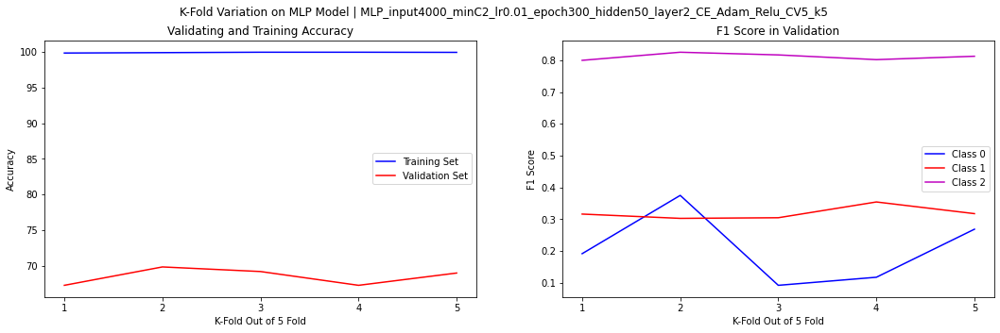

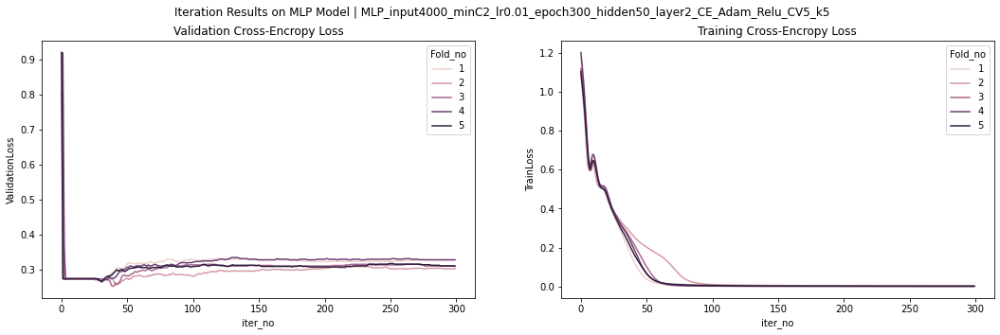

[0.30000000000000004, 0.5000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.8924 %
Classification accuracy (validation data): 65.8065 % 

Average F1 Score: 0: 0.222 | 1: 0.312 | 2: 0.789 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9103 %
Classification accuracy (validation data): 70.9677 % 

Average F1 Score: 0: 0.370 | 1: 0.313 | 2: 0.827 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9641 %
Classification accuracy (validation data): 67.4194 % 

Average F1 Score: 0: 0.177 | 1: 0.287 | 2: 0.808 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9821 %
Classification accuracy (validation data): 67.9032 % 

Average F1 Score: 0: 0.188 | 1: 0.343 | 2: 0.804 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classifi

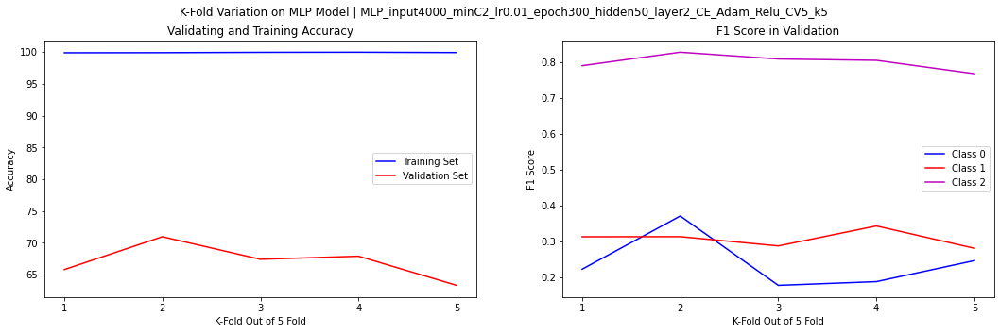

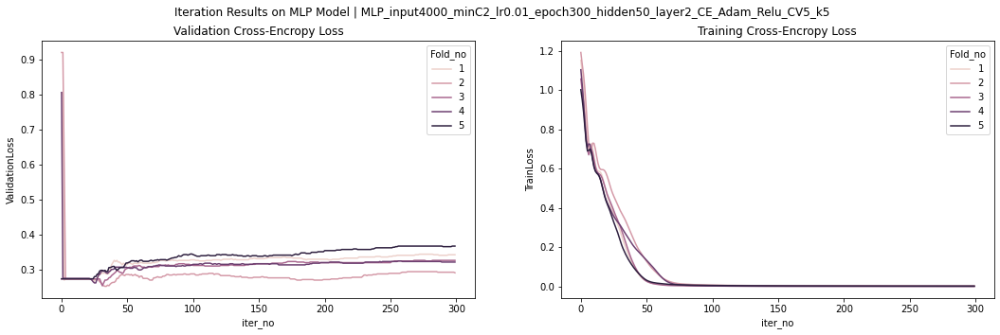

[0.4, 0.2, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.9597 %
Classification accuracy (validation data): 67.4194 % 

Average F1 Score: 0: 0.265 | 1: 0.266 | 2: 0.805 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9395 %
Classification accuracy (validation data): 70.8065 % 

Average F1 Score: 0: 0.319 | 1: 0.348 | 2: 0.835 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9798 %
Classification accuracy (validation data): 69.0323 % 

Average F1 Score: 0: 0.271 | 1: 0.276 | 2: 0.819 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9597 %
Classification accuracy (validation data): 68.2258 % 

Average F1 Score: 0: 0.154 | 1: 0.256 | 2: 0.815 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy (training data)

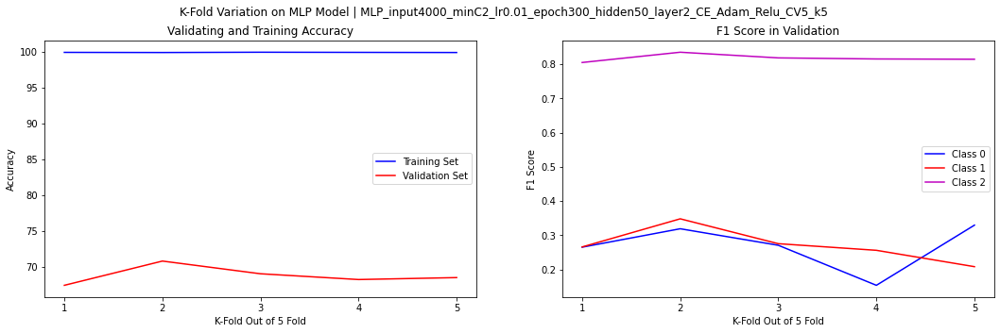

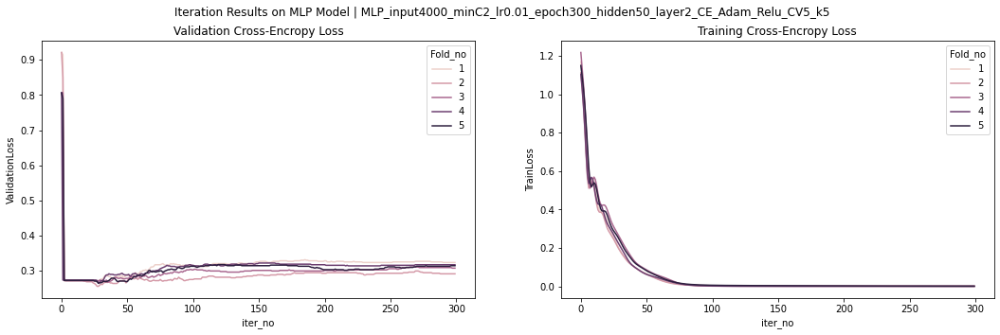

[0.4, 0.30000000000000004, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.8861 %
Classification accuracy (validation data): 66.9355 % 

Average F1 Score: 0: 0.273 | 1: 0.301 | 2: 0.797 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9241 %
Classification accuracy (validation data): 71.1290 % 

Average F1 Score: 0: 0.372 | 1: 0.305 | 2: 0.833 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9810 %
Classification accuracy (validation data): 68.0645 % 

Average F1 Score: 0: 0.208 | 1: 0.283 | 2: 0.812 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9620 %
Classification accuracy (validation data): 67.9032 % 

Average F1 Score: 0: 0.203 | 1: 0.295 | 2: 0.811 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy

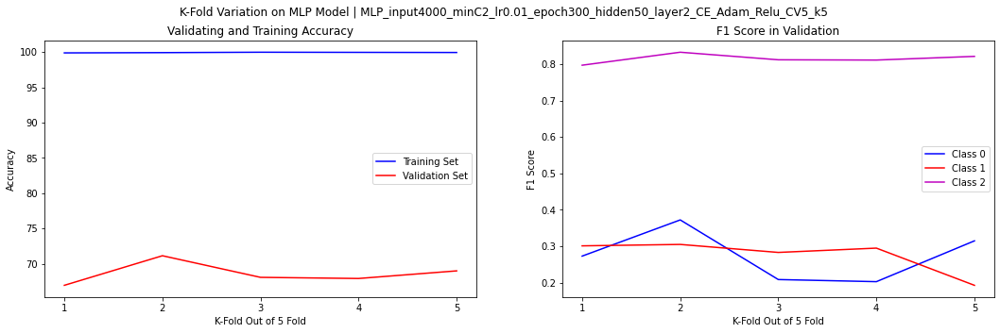

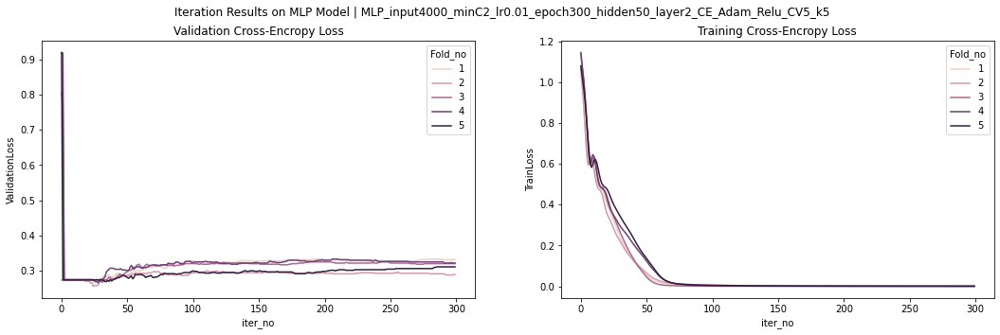

[0.4, 0.4000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.9641 %
Classification accuracy (validation data): 65.0000 % 

Average F1 Score: 0: 0.196 | 1: 0.324 | 2: 0.792 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9462 %
Classification accuracy (validation data): 70.3226 % 

Average F1 Score: 0: 0.400 | 1: 0.324 | 2: 0.825 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9462 %
Classification accuracy (validation data): 67.0968 % 

Average F1 Score: 0: 0.111 | 1: 0.325 | 2: 0.804 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9821 %
Classification accuracy (validation data): 67.0968 % 

Average F1 Score: 0: 0.209 | 1: 0.357 | 2: 0.796 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy 

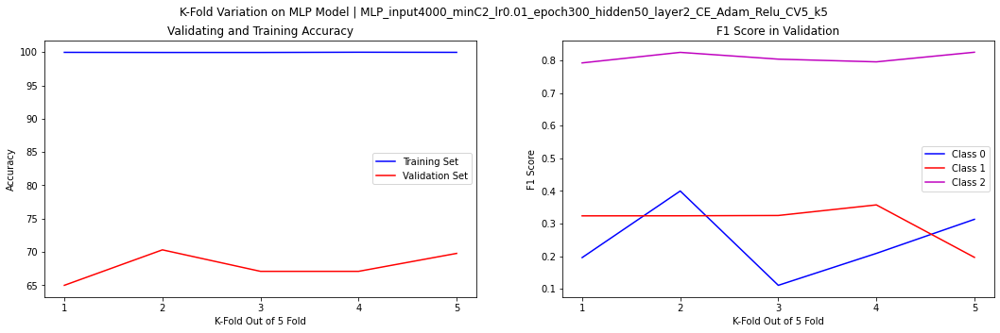

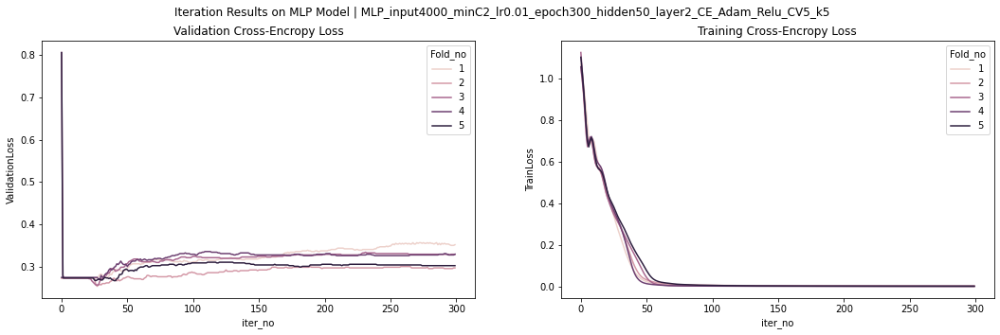

[0.4, 0.5000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.9321 %
Classification accuracy (validation data): 64.0323 % 

Average F1 Score: 0: 0.167 | 1: 0.234 | 2: 0.785 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9490 %
Classification accuracy (validation data): 70.1613 % 

Average F1 Score: 0: 0.374 | 1: 0.332 | 2: 0.826 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9830 %
Classification accuracy (validation data): 67.4194 % 

Average F1 Score: 0: 0.133 | 1: 0.296 | 2: 0.807 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9830 %
Classification accuracy (validation data): 68.0645 % 

Average F1 Score: 0: 0.188 | 1: 0.318 | 2: 0.810 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy 

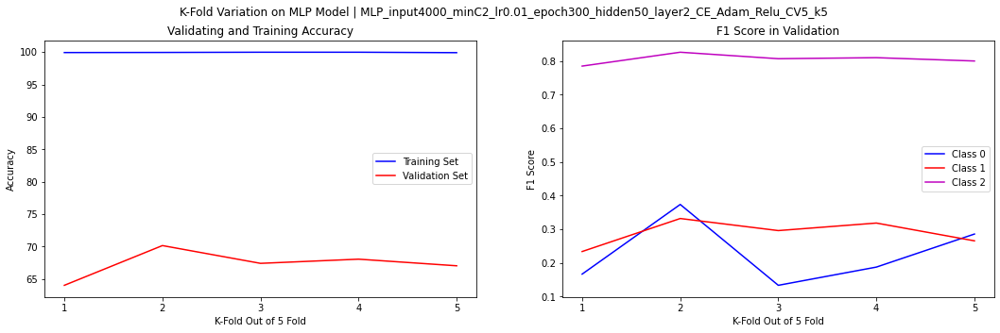

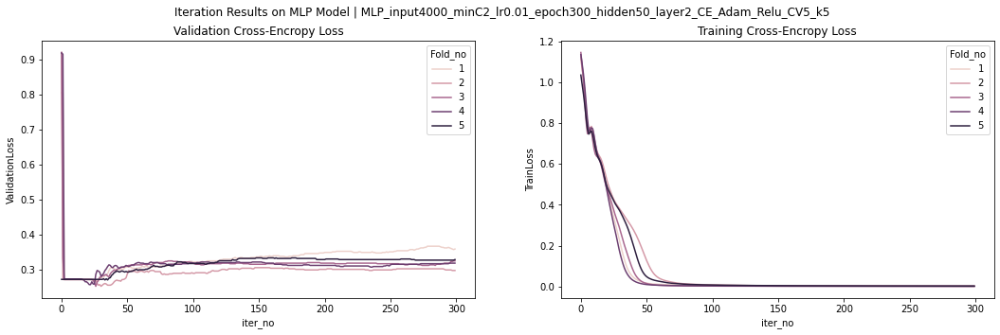

[0.5, 0.2, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.9620 %
Classification accuracy (validation data): 66.6129 % 

Average F1 Score: 0: 0.270 | 1: 0.244 | 2: 0.804 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9430 %
Classification accuracy (validation data): 68.7097 % 

Average F1 Score: 0: 0.309 | 1: 0.314 | 2: 0.821 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9810 %
Classification accuracy (validation data): 68.7097 % 

Average F1 Score: 0: 0.196 | 1: 0.288 | 2: 0.823 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9241 %
Classification accuracy (validation data): 68.2258 % 

Average F1 Score: 0: 0.209 | 1: 0.269 | 2: 0.816 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy (training data)

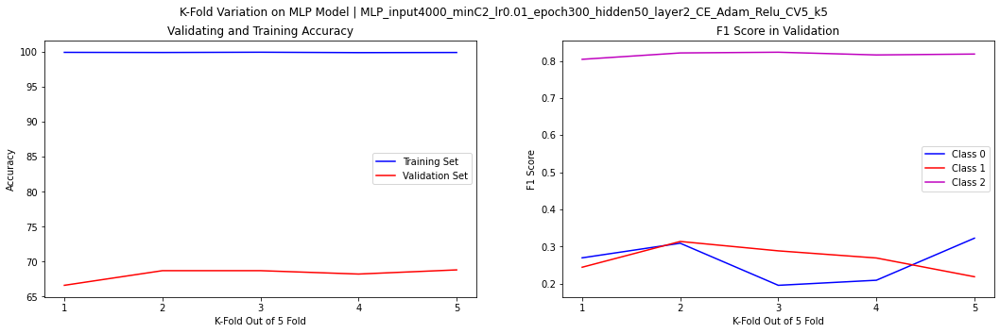

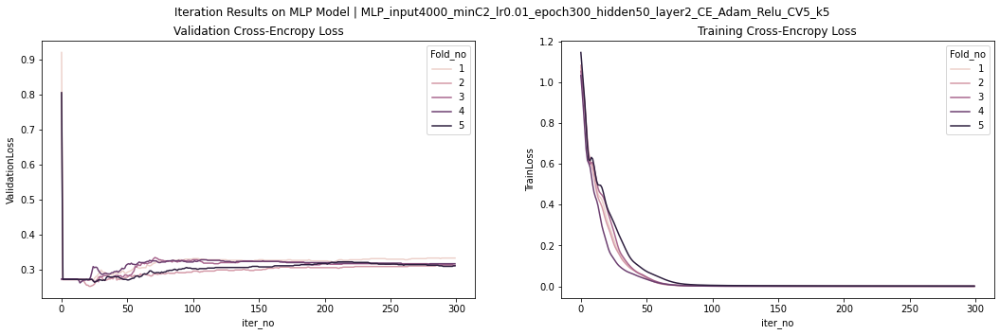

[0.5, 0.30000000000000004, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.9462 %
Classification accuracy (validation data): 66.9355 % 

Average F1 Score: 0: 0.306 | 1: 0.253 | 2: 0.801 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9283 %
Classification accuracy (validation data): 67.2581 % 

Average F1 Score: 0: 0.336 | 1: 0.320 | 2: 0.806 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9821 %
Classification accuracy (validation data): 68.0645 % 

Average F1 Score: 0: 0.248 | 1: 0.277 | 2: 0.813 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9641 %
Classification accuracy (validation data): 66.6129 % 

Average F1 Score: 0: 0.200 | 1: 0.336 | 2: 0.798 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy

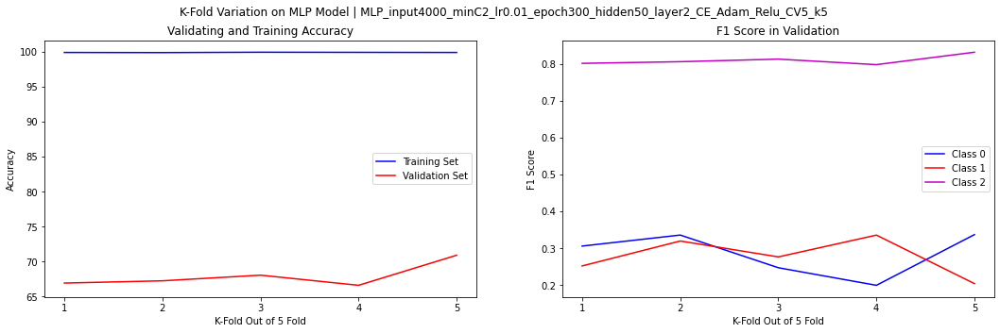

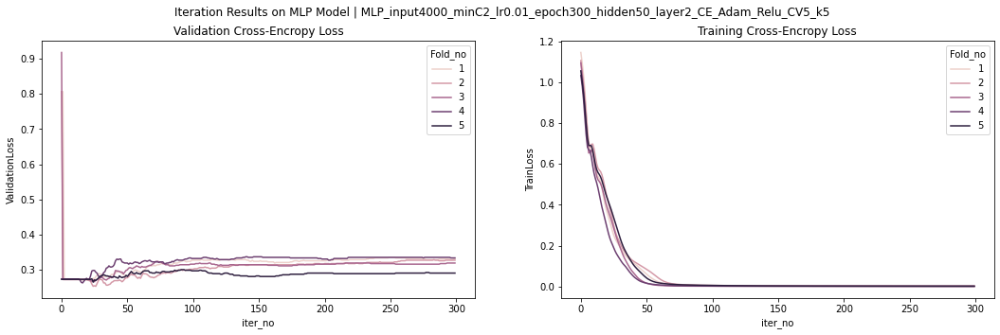

[0.5, 0.4000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.9660 %
Classification accuracy (validation data): 66.6129 % 

Average F1 Score: 0: 0.261 | 1: 0.267 | 2: 0.799 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9660 %
Classification accuracy (validation data): 71.7742 % 

Average F1 Score: 0: 0.348 | 1: 0.283 | 2: 0.840 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9490 %
Classification accuracy (validation data): 67.7419 % 

Average F1 Score: 0: 0.222 | 1: 0.261 | 2: 0.812 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9830 %
Classification accuracy (validation data): 64.8387 % 

Average F1 Score: 0: 0.156 | 1: 0.355 | 2: 0.782 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy 

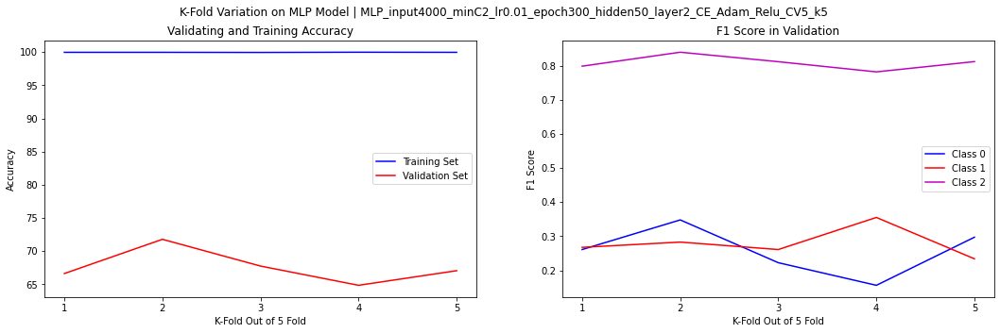

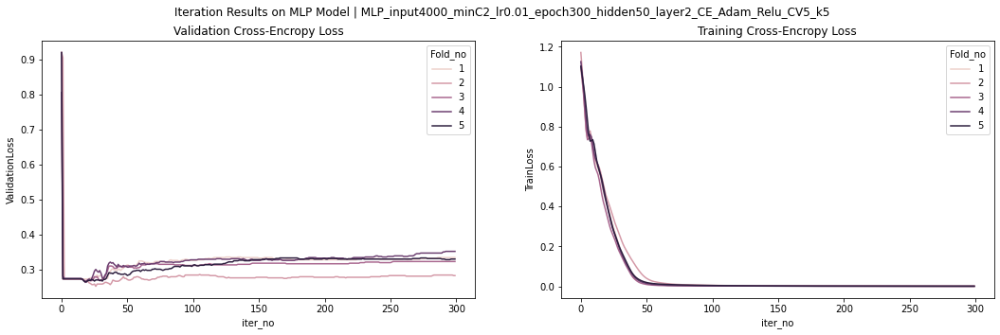

[0.5, 0.5000000000000001, 1]
-----Start Cross-Validating --- 1/5--Fold---------------------
Classification accuracy (training data): 99.9516 %
Classification accuracy (validation data): 66.1290 % 

Average F1 Score: 0: 0.200 | 1: 0.257 | 2: 0.799 


-----Start Cross-Validating --- 2/5--Fold---------------------
Classification accuracy (training data): 99.9193 %
Classification accuracy (validation data): 68.5484 % 

Average F1 Score: 0: 0.289 | 1: 0.314 | 2: 0.817 


-----Start Cross-Validating --- 3/5--Fold---------------------
Classification accuracy (training data): 99.9839 %
Classification accuracy (validation data): 66.6129 % 

Average F1 Score: 0: 0.237 | 1: 0.279 | 2: 0.798 


-----Start Cross-Validating --- 4/5--Fold---------------------
Classification accuracy (training data): 99.9839 %
Classification accuracy (validation data): 64.6774 % 

Average F1 Score: 0: 0.200 | 1: 0.312 | 2: 0.784 


-----Start Cross-Validating --- 5/5--Fold---------------------
Classification accuracy 

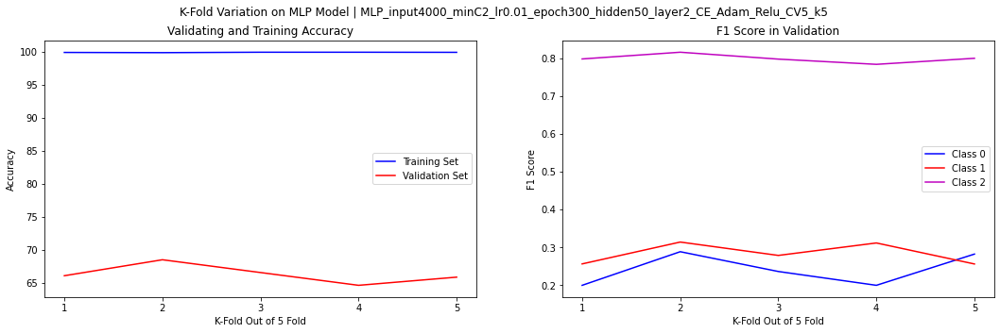

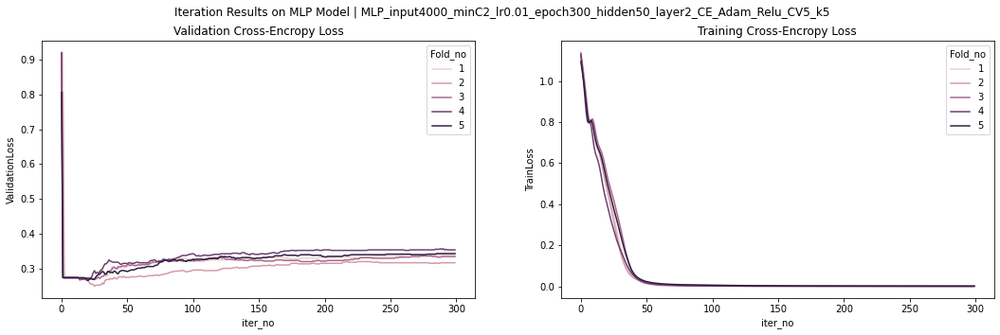

In [315]:
OptimizerName = 'Adam'
lossFunc = 'CE'
ActivationFunc1 = 'Relu'
ActivationFunc2 = 'Relu'
layer = 2
learning_rate = 0.01
hidden_size = 50
early_stopping =-1
num_epochs = 300
k= 5
#over_proportion_list=[0.3,0.3,1]
classes=[0,1,2]
min_count = 2
SMOTE_bool=True
cv = 5
kFold = StratifiedKFold(n_splits=cv, shuffle=True, random_state=123)


grid_search1_sum = pd.DataFrame(columns=list(overview_training.columns))  
grid_search1_iter = pd.DataFrame(columns=list(iterResult.columns))  

for class0_p in np.arange(0.1,0.6,0.1):
    for class1_p in np.arange(0.2,0.6,0.1):
        over_proportion_list = [class0_p,class1_p,1]
        print(over_proportion_list)
        sum_overview , sum_iter,_ = Train_MLP(df_train,layer, ActivationFunc1,OptimizerName,learning_rate, hidden_size, num_epochs, kFold,lossFunc, early_stopping,SMOTE,k,over_proportion_list,classes,min_count,ActivationFunc2)
        grid_search1_sum = pd.concat([grid_search1_sum,sum_overview],axis=0)
        grid_search1_iter = pd.concat([grid_search1_iter,sum_iter],axis=0)

In [316]:
grid_search1_sum.reset_index(drop=True).sort_values(by=['Generalization_Accuracy','Fscore_class0','Fscore_class1'],ascending=False)

,ID,Model,Cross_Validation,input_size,Vectorizer_minCount,learning_rate,num_epochs,hidden_size,layer_no,activationFunction,criterion,optimizer,trainingTime,Training_Accuracy,Generalization_Accuracy,Fscore_class0,Fscore_class1,Fscore_class2,k_value
8,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,2,Relu,CE,Adam,81.449718,99.935442,69.377039,0.271579,0.266758,0.822237,5
4,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,2,Relu,CE,Adam,87.184815,99.912382,69.119027,0.266752,0.265968,0.819861,5
12,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,2,Relu,CE,Adam,83.294879,99.955618,68.796290,0.267761,0.270845,0.817782,5
0,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,2,Relu,CE,Adam,76.806538,99.895704,68.699672,0.173698,0.282223,0.812834,5
5,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,2,Relu,CE,Adam,102.270309,99.939746,68.634582,0.264917,0.300923,0.812462,5
13,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,2,Relu,CE,Adam,100.329568,99.939244,68.602897,0.274058,0.275126,0.814750,5
10,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,2,Relu,CE,Adam,94.135286,99.943042,68.506123,0.209078,0.319136,0.811063,5
1,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,2,Relu,CE,Adam,97.075939,99.935439,68.247590,0.215435,0.297621,0.809784,5
16,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,2,Relu,CE,Adam,83.122689,99.950636,68.215749,0.261228,0.266902,0.816742,5
9,MLP_input4000_minC2_lr0.01_epoch300_hidden50_l...,MLP,5,4000,2,0.01,300,50,2,Relu,CE,Adam,75.284457,99.927375,68.215332,0.234095,0.307510,0.810291,5


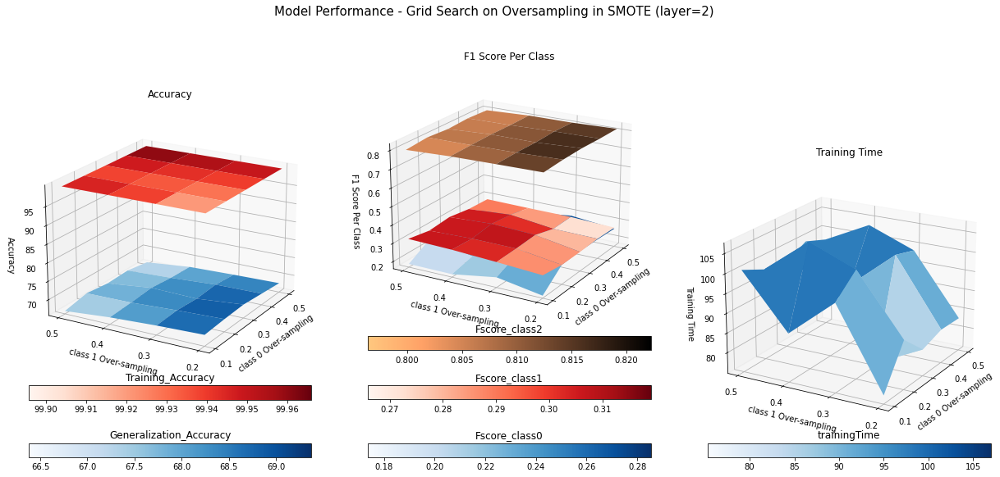

In [317]:
# Visualize influence of the Grid Search
%matplotlib inline

gridX = np.arange(0.1,0.6,0.1)
gridY = np.arange(0.2,0.6,0.1)

cmapList = ['Blues','Reds','copper_r']

Y, X = np.meshgrid(np.array(gridY), np.array(gridX))
gridXname = 'class 0 Over-sampling'
gridYname = 'class 1 Over-sampling'
fig3, ax3 = plt.subplots(figsize=(21,10),ncols=3,subplot_kw={"projection": "3d"},sharex=True)
metric = ['Accuracy','F1 Score Per Class','Training Time']

data = grid_search1_sum.reset_index(drop=True)

for i in range(3):
    if metric[i] == 'Accuracy':
        m = ['Generalization_Accuracy','Training_Accuracy']
    elif metric[i] =='F1 Score Per Class':
        m=['Fscore_class0','Fscore_class1','Fscore_class2']
    elif metric[i] =='Training Time':
        m=['trainingTime']
        
    for j in range(len(m)):
        
        Z = [[0]*len(gridY)]*len(gridX) # Create empty matrix
        for w in range(len(gridX)):
            Z[w] = list(data.loc[len(gridY)*w:(len(gridY)*w + len(gridY)-1) ,m[j]].values)  # Fill up with request matrix
        
        Z = np.array(Z)
        surf = ax3[i].plot_surface(X,Y,Z,label=m[j],cmap=cmapList[j], antialiased=True, linewidth=10,vmin=Z.min(),vmax=Z.max())
        cbar = fig3.colorbar(surf, ax=ax3[i],orientation='horizontal',pad=len(m)/1000)
        cbar.ax.set_title(m[j])
    ax3[i].set_xlabel(gridXname)
    ax3[i].set_ylabel(gridYname)
    ax3[i].set_zlabel(metric[i])
    ax3[i].set_title(metric[i])
    ax3[i].view_init(20, 210)        
    ax3[i].set_xticks(ticks=gridX,minor=False)
    ax3[i].set_yticks(ticks=gridY,minor=False)

plt.suptitle('Model Performance - Grid Search on Oversampling in SMOTE (layer=2)',fontsize=15)
plt.show()

fig3.savefig('chart/Grid_Search_SMOTE_layer2.jpg')

### Grid search (2) on k-value and number of hidden layer

layer = 1 | k = 3
Total training time:
73.47142887115479

Average Generalization Accuracy: 71.9910 %
Average Training Accuracy: 94.7370 %
Average F1 Score: 0: 0.274 | 1: 0.214 | 2: 0.841 




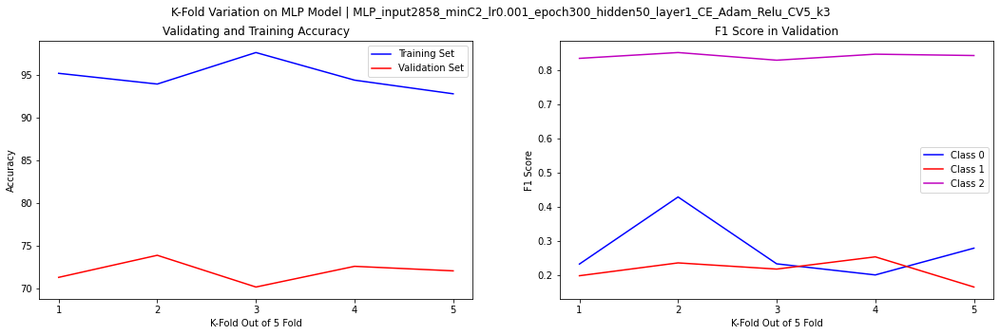

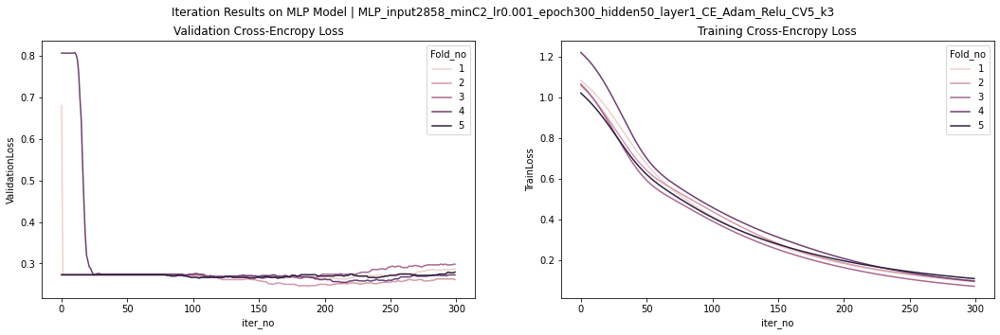

layer = 2 | k = 3
Total training time:
107.37229323387146

Average Generalization Accuracy: 72.6041 %
Average Training Accuracy: 66.8274 %
Average F1 Score: 0: 0.046 | 1: 0.000 | 2: 0.843 




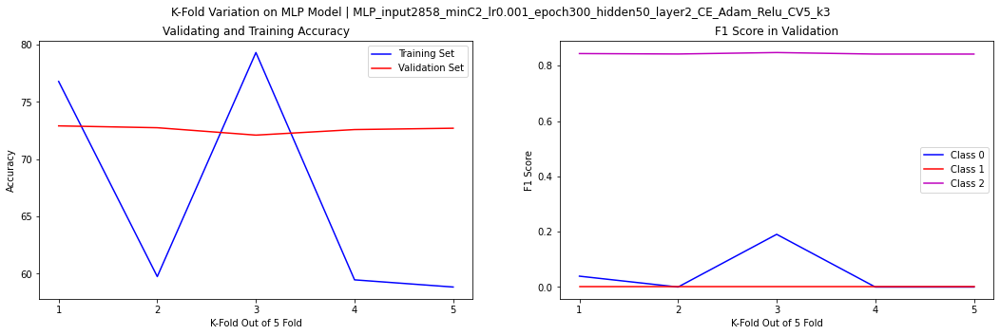

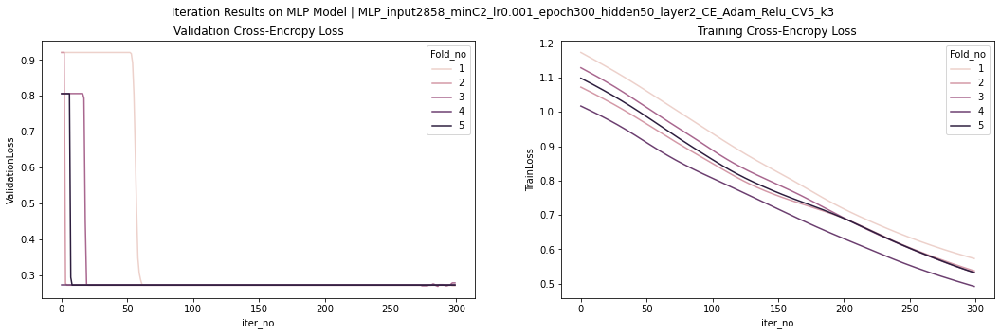

layer = 1 | k = 4
Total training time:
98.703697681427

Average Generalization Accuracy: 72.2493 %
Average Training Accuracy: 95.3712 %
Average F1 Score: 0: 0.267 | 1: 0.227 | 2: 0.843 




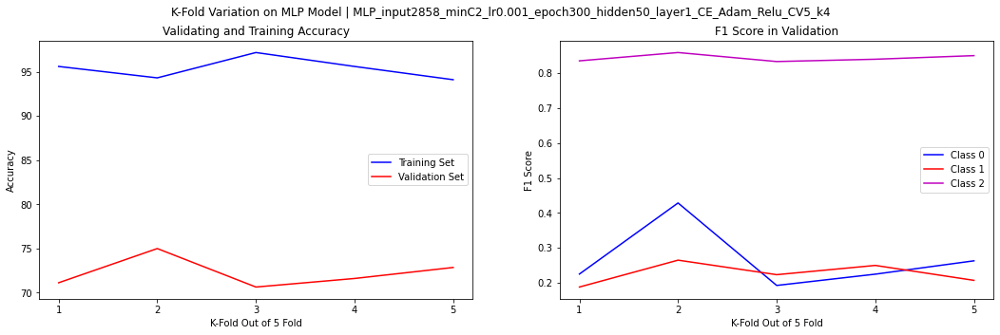

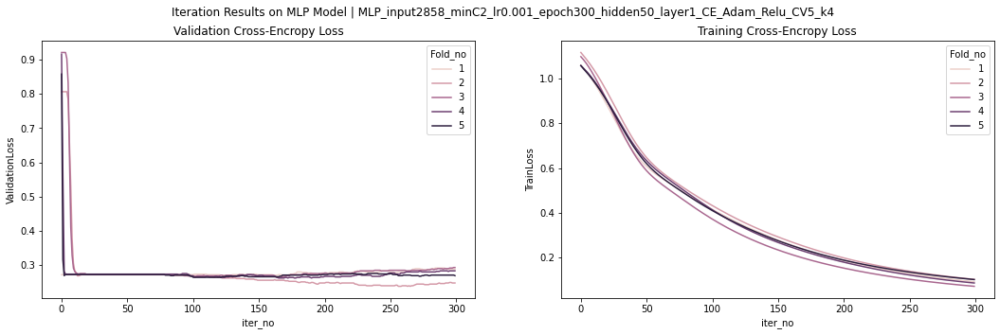

layer = 2 | k = 4
Total training time:
109.19039988517761

Average Generalization Accuracy: 73.1848 %
Average Training Accuracy: 65.9882 %
Average F1 Score: 0: 0.122 | 1: 0.000 | 2: 0.848 




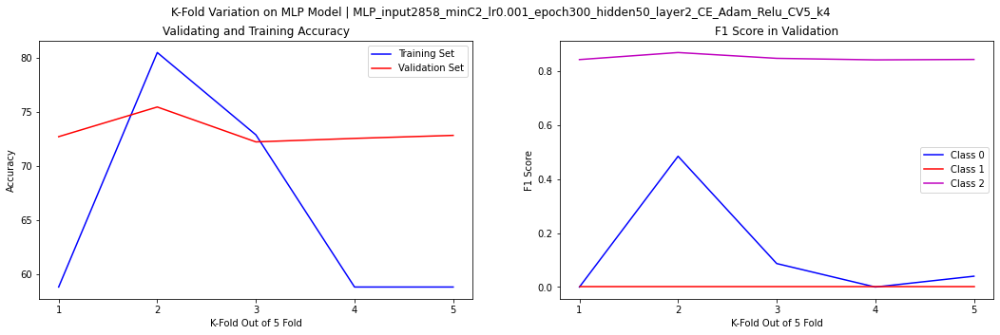

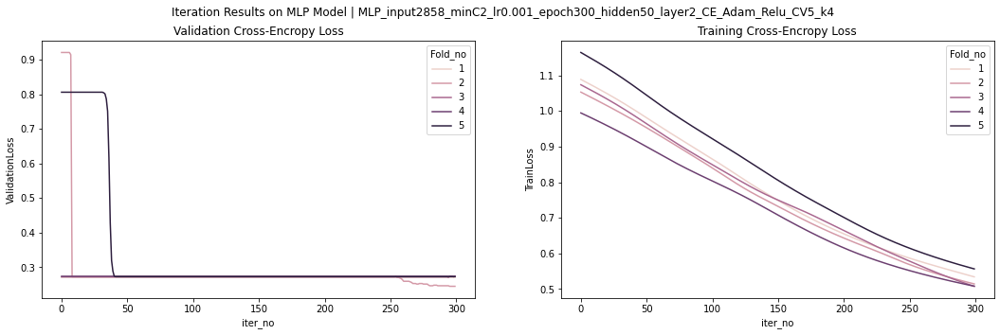

layer = 1 | k = 5
Total training time:
94.78689742088318

Average Generalization Accuracy: 72.7975 %
Average Training Accuracy: 95.2725 %
Average F1 Score: 0: 0.298 | 1: 0.230 | 2: 0.846 




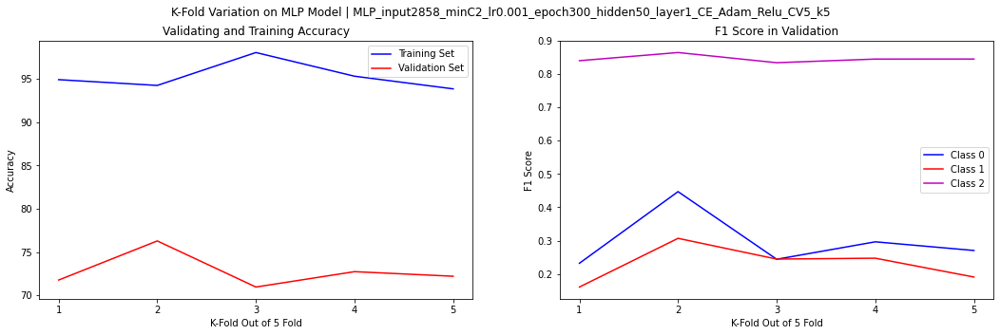

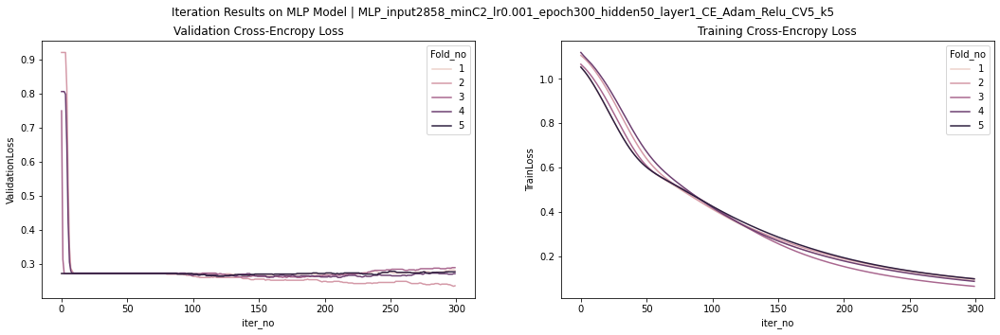

layer = 2 | k = 5
Total training time:
108.89242219924927

Average Generalization Accuracy: 72.7333 %
Average Training Accuracy: 75.9673 %
Average F1 Score: 0: 0.215 | 1: 0.000 | 2: 0.849 




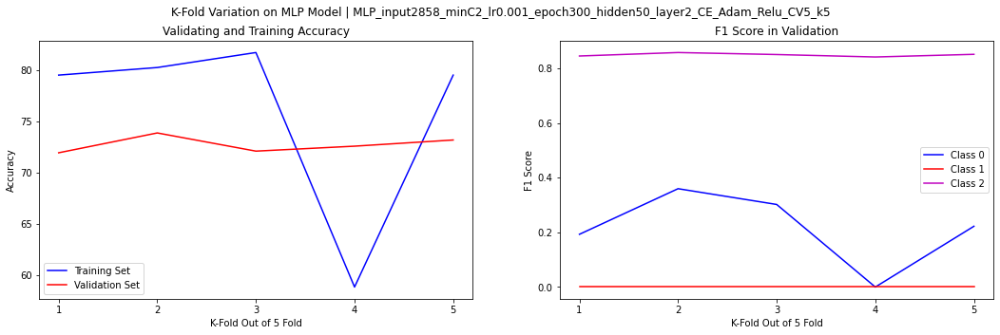

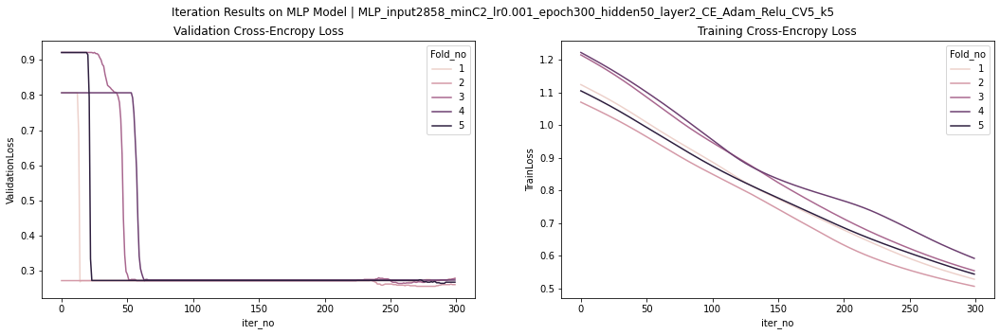

layer = 1 | k = 6
Total training time:
98.64586901664734

Average Generalization Accuracy: 71.9908 %
Average Training Accuracy: 95.9332 %
Average F1 Score: 0: 0.256 | 1: 0.241 | 2: 0.840 




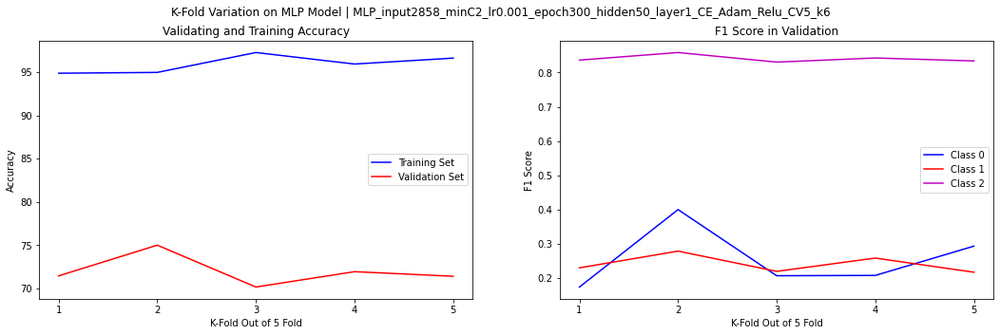

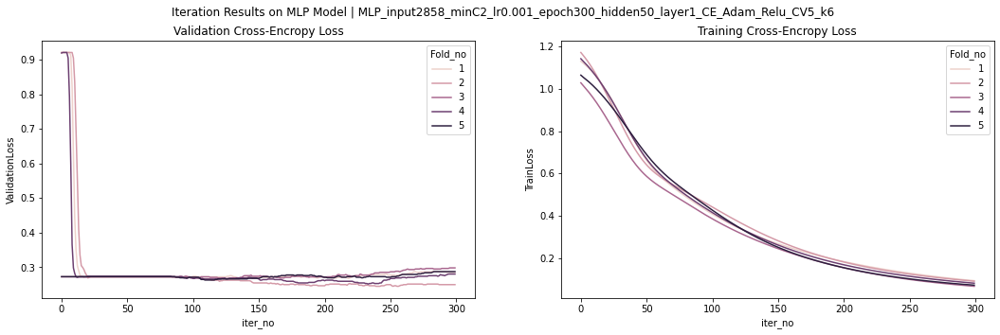

layer = 2 | k = 6
Total training time:
107.1707513332367

Average Generalization Accuracy: 72.6364 %
Average Training Accuracy: 71.7524 %
Average F1 Score: 0: 0.168 | 1: 0.000 | 2: 0.846 




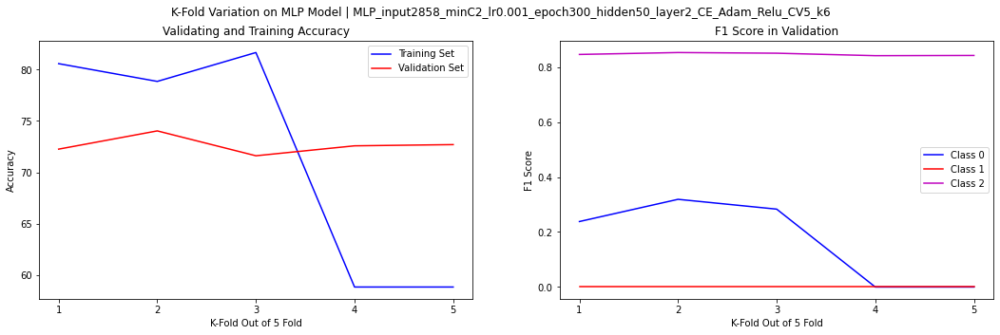

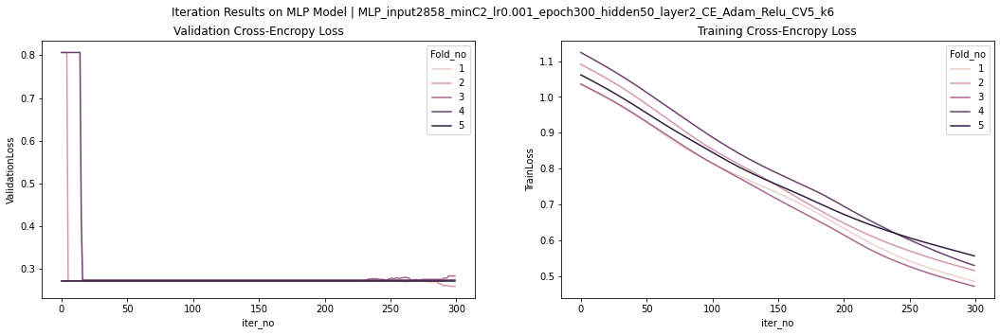

layer = 1 | k = 7
Total training time:
94.77040100097656

Average Generalization Accuracy: 72.1847 %
Average Training Accuracy: 96.1344 %
Average F1 Score: 0: 0.277 | 1: 0.232 | 2: 0.841 




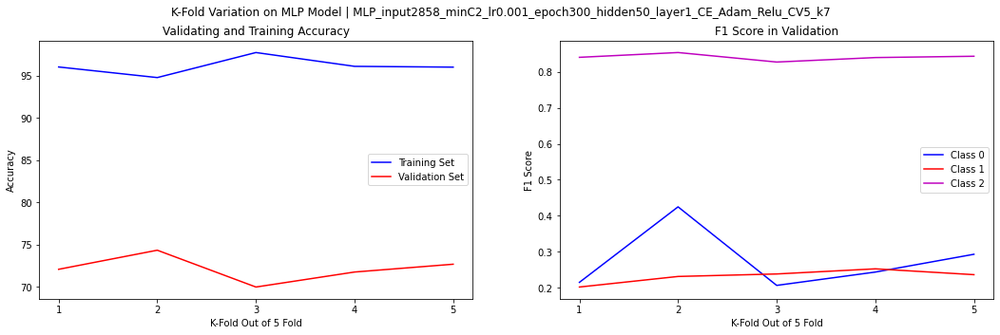

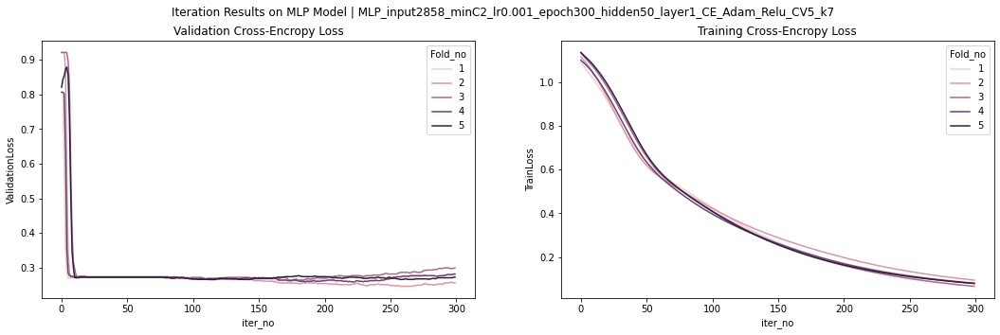

layer = 2 | k = 7
Total training time:
107.77855896949768

Average Generalization Accuracy: 72.5719 %
Average Training Accuracy: 67.5679 %
Average F1 Score: 0: 0.078 | 1: 0.000 | 2: 0.844 




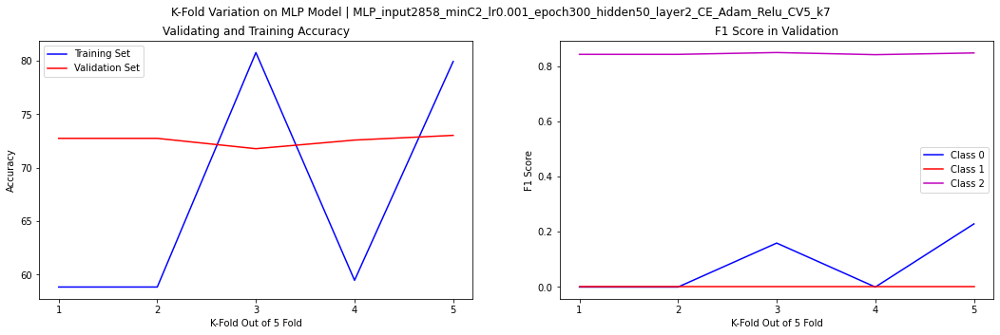

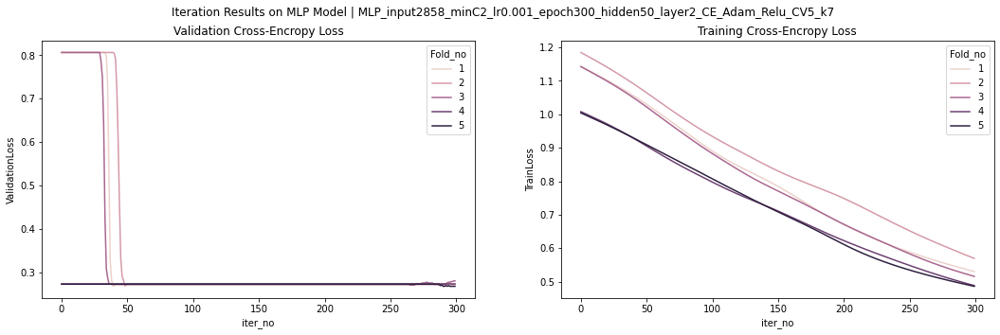

In [400]:
## Grid search (1) on k-value and number of hidden layer
k_value = [3,4,5,6,7]
layer_no = [1,2] 

OptimizerName = 'Adam'
lossFunc = 'CE'
ActivationFunc1 = 'Relu'
ActivationFunc2 = 'Softmax'
#layer = 1
learning_rate = 0.001
hidden_size = 50
early_stopping =-1
num_epochs = 300
#k= 5
over_proportion_list=[0.4,0.3,1]
classes=[0,1,2]
min_count = 2
SMOTE_bool=True
cv = 5
kFold = StratifiedKFold(n_splits=cv, shuffle=True, random_state=123)


grid_search2_sum = pd.DataFrame(columns=list(overview_training.columns))  
grid_search2_iter = pd.DataFrame(columns=list(iterResult.columns))  

for k in k_value:
    for layer in layer_no:
        print('layer = %d | k = %d' %(layer,k))
        sum_overview , sum_iter,_ = Train_MLP(df_train,layer, ActivationFunc1,OptimizerName,learning_rate, hidden_size, num_epochs, kFold,lossFunc, early_stopping,SMOTE,k,over_proportion_list,classes,min_count,ActivationFunc2)
        grid_search2_sum = pd.concat([grid_search2_sum,sum_overview],axis=0)
        grid_search2_iter = pd.concat([grid_search2_iter,sum_iter],axis=0)

In [401]:
grid_search2_sum.reset_index(drop=True).sort_values(by=['Generalization_Accuracy','Fscore_class0'],ascending=False)

,ID,Model,Cross_Validation,input_size,Vectorizer_minCount,learning_rate,num_epochs,hidden_size,layer_no,activationFunction,criterion,optimizer,trainingTime,Training_Accuracy,Generalization_Accuracy,Fscore_class0,Fscore_class1,Fscore_class2,k_value
13,MLP_input2858_minC2_lr0.001_epoch300_hidden50_...,MLP,5,2858,2,0.001,300,50,2,Relu,CE,Adam,109.190400,65.988229,73.184793,0.122233,0.000000,0.848225,4
14,MLP_input2858_minC2_lr0.001_epoch300_hidden50_...,MLP,5,2858,2,0.001,300,50,1,Relu,CE,Adam,94.786897,95.272451,72.797488,0.297882,0.229844,0.846078,5
15,MLP_input2858_minC2_lr0.001_epoch300_hidden50_...,MLP,5,2858,2,0.001,300,50,2,Relu,CE,Adam,108.892422,75.967344,72.733285,0.215286,0.000000,0.848849,5
17,MLP_input2858_minC2_lr0.001_epoch300_hidden50_...,MLP,5,2858,2,0.001,300,50,2,Relu,CE,Adam,107.170751,71.752421,72.636354,0.168024,0.000000,0.846232,6
11,MLP_input2858_minC2_lr0.001_epoch300_hidden50_...,MLP,5,2858,2,0.001,300,50,2,Relu,CE,Adam,107.372293,66.827416,72.604096,0.045938,0.000000,0.843458,3
19,MLP_input2858_minC2_lr0.001_epoch300_hidden50_...,MLP,5,2858,2,0.001,300,50,2,Relu,CE,Adam,107.778559,67.567875,72.571942,0.077532,0.000000,0.844339,7
12,MLP_input2858_minC2_lr0.001_epoch300_hidden50_...,MLP,5,2858,2,0.001,300,50,1,Relu,CE,Adam,98.703698,95.371179,72.249310,0.266971,0.226828,0.843076,4
18,MLP_input2858_minC2_lr0.001_epoch300_hidden50_...,MLP,5,2858,2,0.001,300,50,1,Relu,CE,Adam,94.770401,96.134422,72.184741,0.276903,0.232457,0.840609,7
10,MLP_input2858_minC2_lr0.001_epoch300_hidden50_...,MLP,5,2858,2,0.001,300,50,1,Relu,CE,Adam,73.471429,94.737042,71.990984,0.274299,0.213536,0.841284,3
16,MLP_input2858_minC2_lr0.001_epoch300_hidden50_...,MLP,5,2858,2,0.001,300,50,1,Relu,CE,Adam,98.645869,95.933169,71.990776,0.256387,0.240779,0.840471,6


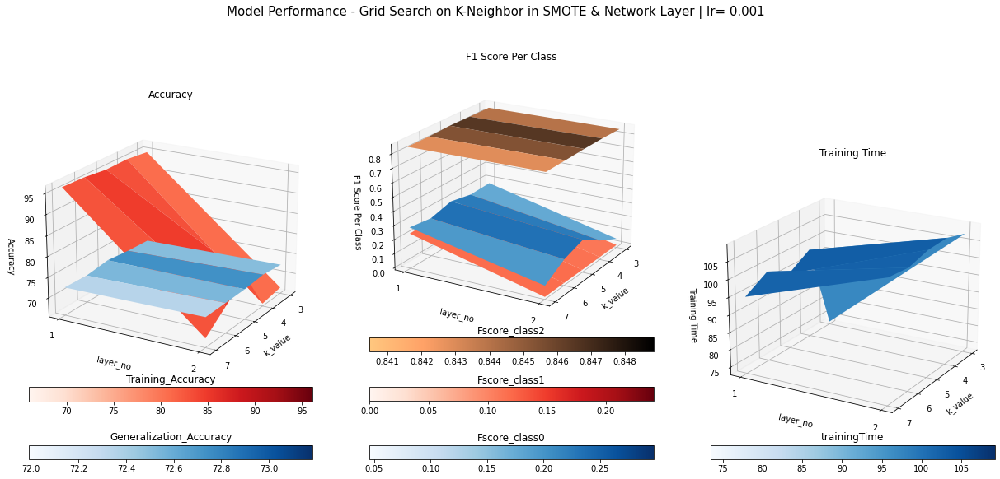

In [403]:
# Visualize influence of the Grid Search
%matplotlib inline

gridX = k_value
gridY = layer_no

gridXname = 'k_value'
gridYname = 'layer_no'

cmapList = ['Blues','Reds','copper_r']

X, Y = np.meshgrid(np.array(gridX), np.array(gridY))

data = grid_search2_sum.reset_index(drop=True)
data = data[data.learning_rate == 0.001]
fig3, ax3 = plt.subplots(figsize=(21,10),ncols=3,subplot_kw={"projection": "3d"},sharex=True)
metric = ['Accuracy','F1 Score Per Class','Training Time']

for i in range(3):
    if metric[i] == 'Accuracy':
        m = ['Generalization_Accuracy','Training_Accuracy']
    elif metric[i] =='F1 Score Per Class':
        m=['Fscore_class0','Fscore_class1','Fscore_class2']
    elif metric[i] =='Training Time':
        m=['trainingTime']
        
    for j in range(len(m)):
        
        Z = [[0]*len(X)]*len(Y) # Create empty matrix
        for w in range(len(Y)):
            Z[w] = data.loc[(data[gridYname] == gridY[w]),m[j]]  # Fill up with request matrix
        
        Z = np.array(Z)
        vmin = Z.min()
        vmax = Z.max()
        surf = ax3[i].plot_surface(X,Y,Z,label=m[j],cmap=cmapList[j], antialiased=True, linewidth=10,vmin=vmin,vmax=vmax)
        #fig3.legend()
        cbar = fig3.colorbar(surf, ax=ax3[i],orientation='horizontal',pad=len(m)/1000)
        cbar.ax.set_title(m[j])
    ax3[i].set_xlabel(gridXname)
    ax3[i].set_ylabel(gridYname)
    ax3[i].set_zlabel(metric[i])
    ax3[i].set_title(metric[i])
    ax3[i].view_init(20, 30)        
    ax3[i].set_xticks(ticks=gridX,minor=False)
    ax3[i].set_yticks(ticks=gridY,minor=False)

plt.suptitle('Model Performance - Grid Search on K-Neighbor in SMOTE & Network Layer | lr= 0.001',fontsize=15)
plt.show()

fig3.savefig('chart/Grid_Search_k_value_layer_no.jpg')

### Grid Search (3) on Learning Rate & Number of Hidden Neurons

learning rate = 0.000 | hidden neurons = 10
Total training time:
57.95732641220093

Average Generalization Accuracy: 61.5711 %
Average Training Accuracy: 49.8158 %
Average F1 Score: 0: 0.000 | 1: 0.078 | 2: 0.671 




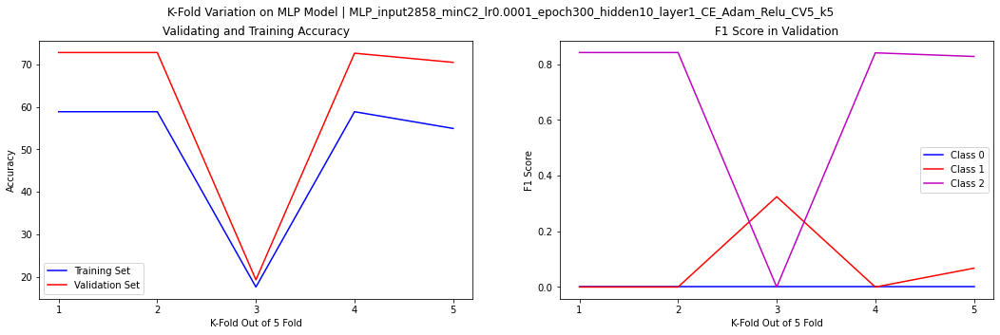

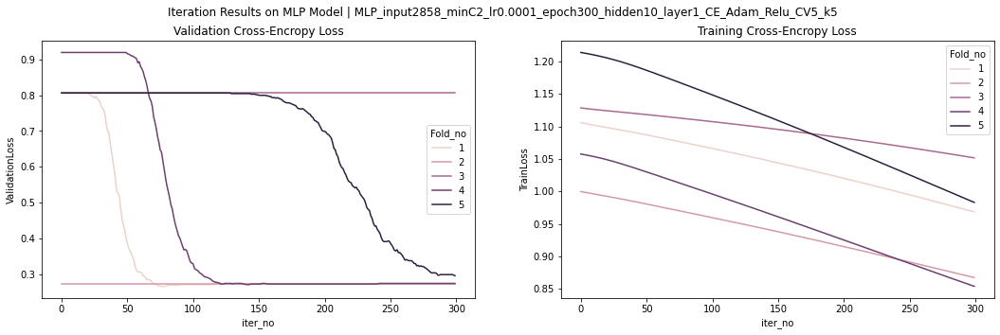

learning rate = 0.000 | hidden neurons = 20
Total training time:
61.114198446273804

Average Generalization Accuracy: 72.7654 %
Average Training Accuracy: 60.2392 %
Average F1 Score: 0: 0.033 | 1: 0.000 | 2: 0.843 




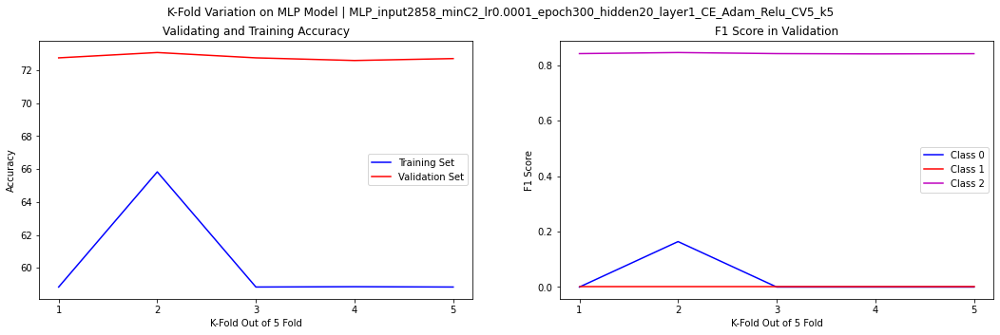

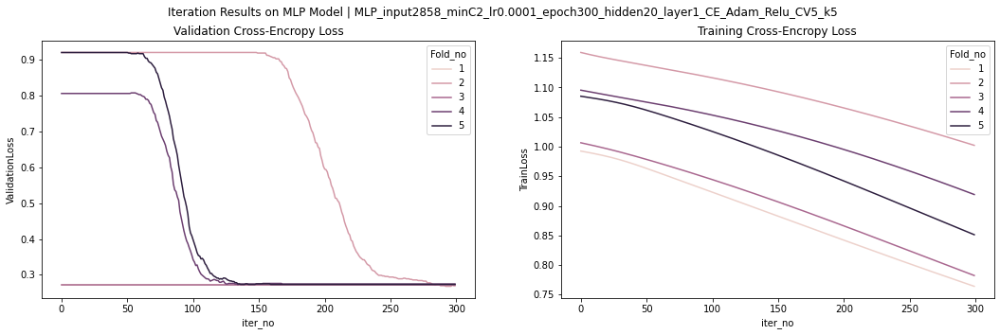

learning rate = 0.000 | hidden neurons = 30
Total training time:
81.33419179916382

Average Generalization Accuracy: 72.7331 %
Average Training Accuracy: 59.8519 %
Average F1 Score: 0: 0.032 | 1: 0.000 | 2: 0.842 




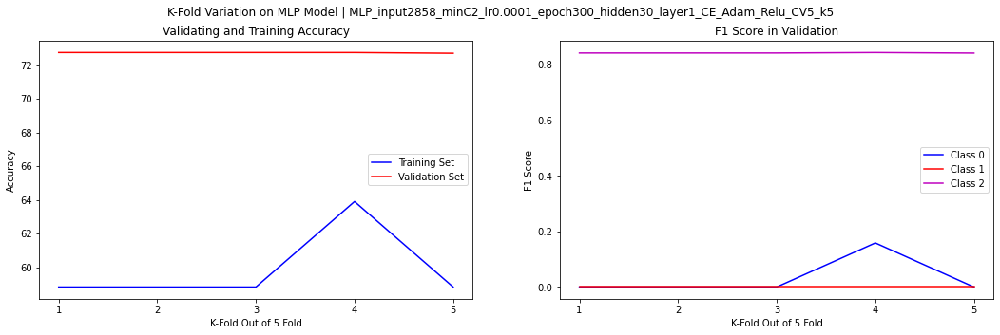

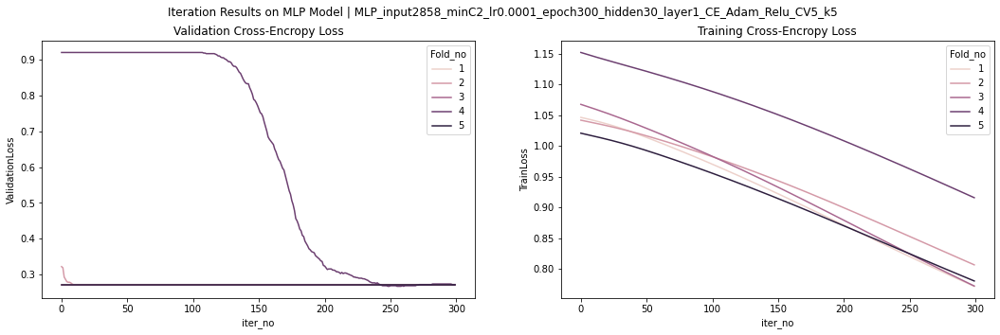

learning rate = 0.000 | hidden neurons = 40
Total training time:
81.30915927886963

Average Generalization Accuracy: 72.7331 %
Average Training Accuracy: 58.7469 %
Average F1 Score: 0: 0.000 | 1: 0.003 | 2: 0.843 




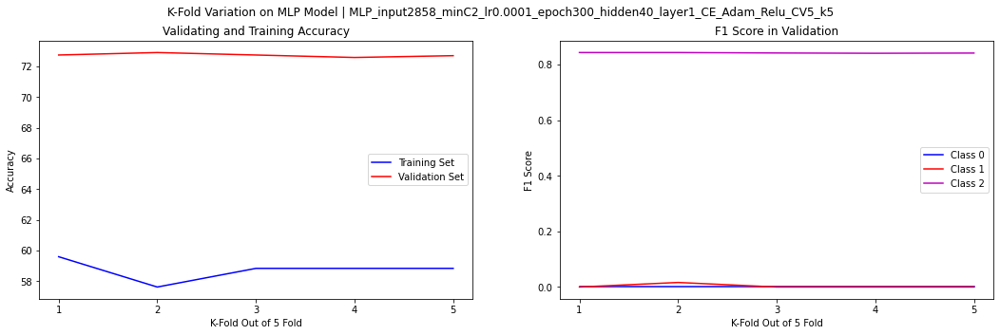

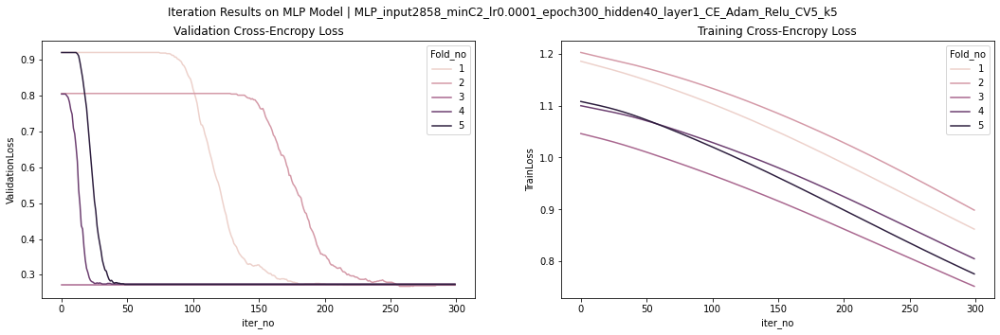

learning rate = 0.000 | hidden neurons = 50
Total training time:
94.65171980857849

Average Generalization Accuracy: 72.7009 %
Average Training Accuracy: 58.8760 %
Average F1 Score: 0: 0.000 | 1: 0.000 | 2: 0.842 




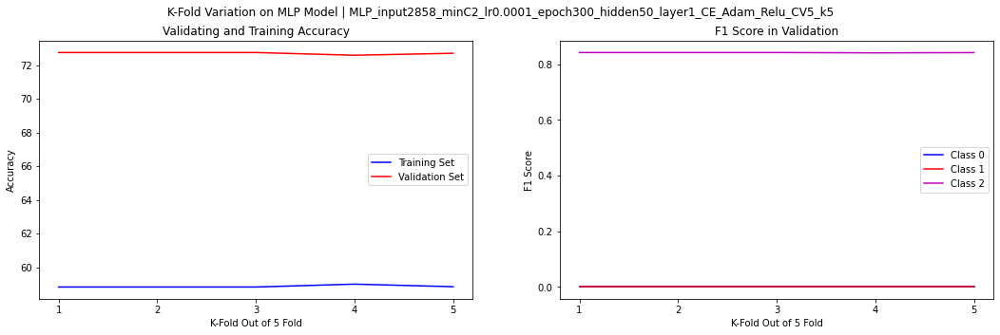

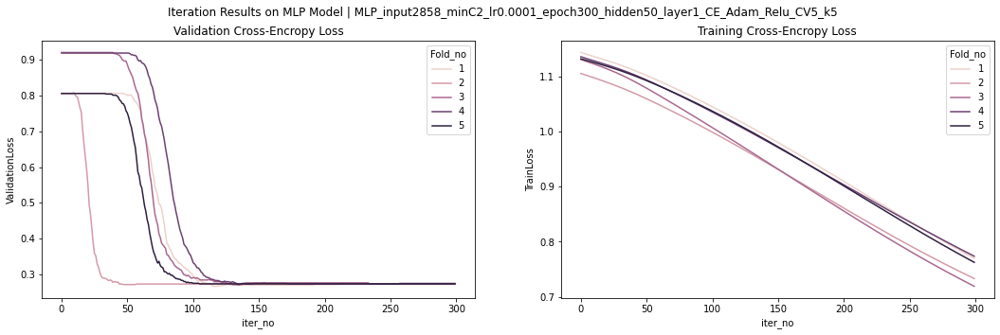

learning rate = 0.000 | hidden neurons = 60
Total training time:
76.74644660949707

Average Generalization Accuracy: 72.7009 %
Average Training Accuracy: 58.8608 %
Average F1 Score: 0: 0.000 | 1: 0.000 | 2: 0.842 




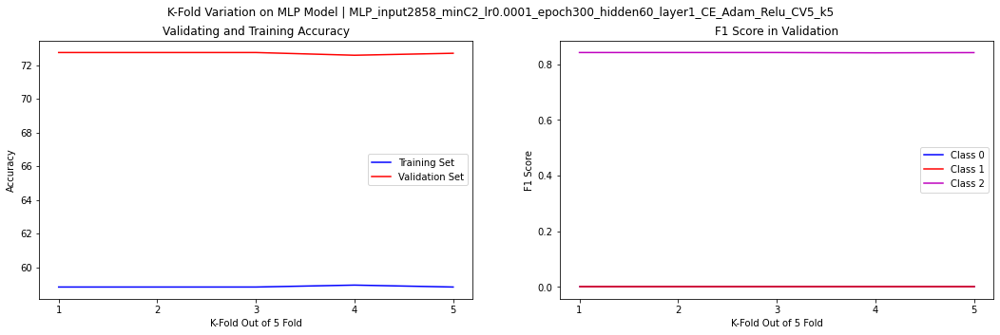

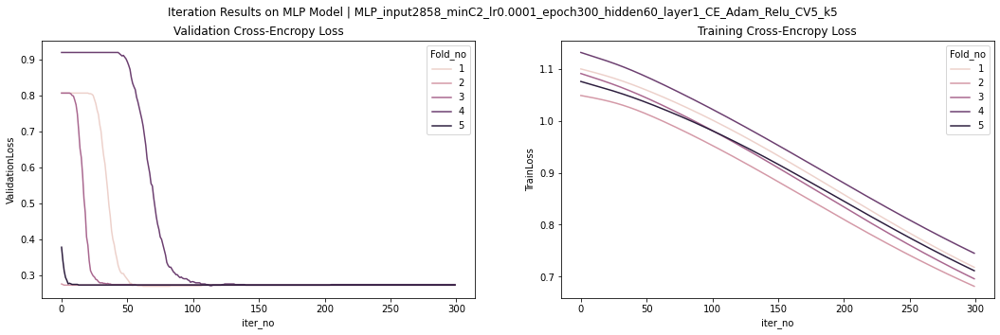

learning rate = 0.000 | hidden neurons = 70
Total training time:
82.6885666847229

Average Generalization Accuracy: 72.7009 %
Average Training Accuracy: 58.9216 %
Average F1 Score: 0: 0.000 | 1: 0.000 | 2: 0.842 




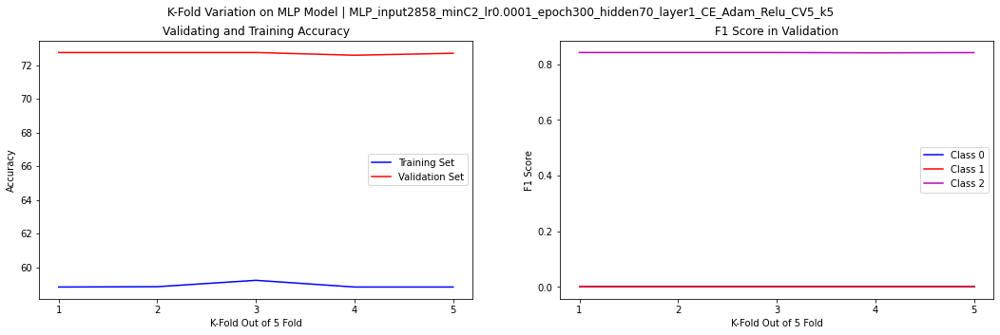

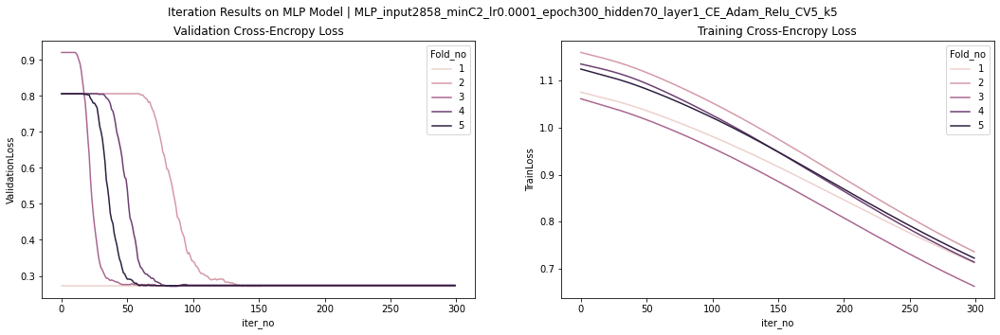

learning rate = 0.000 | hidden neurons = 80
Total training time:
85.95387196540833

Average Generalization Accuracy: 72.7009 %
Average Training Accuracy: 58.8380 %
Average F1 Score: 0: 0.000 | 1: 0.000 | 2: 0.842 




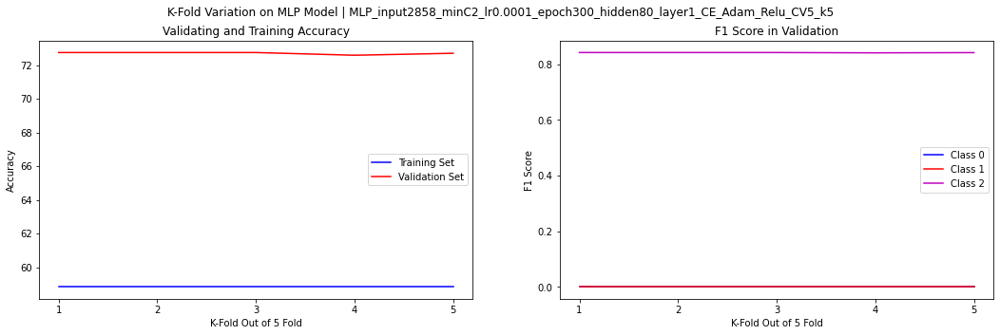

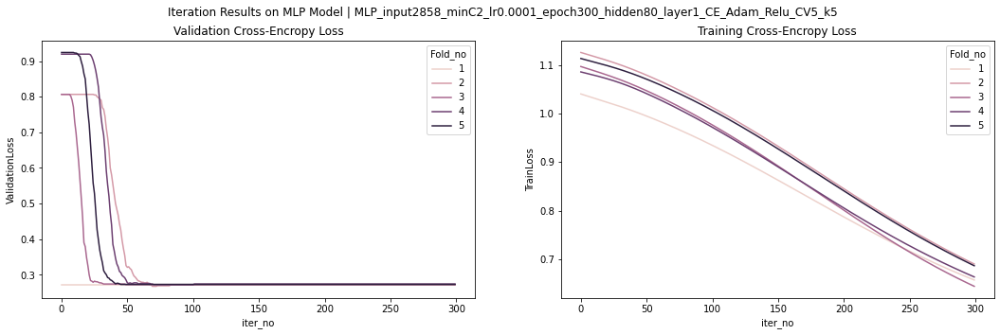

learning rate = 0.000 | hidden neurons = 90
Total training time:
106.6698431968689

Average Generalization Accuracy: 72.7009 %
Average Training Accuracy: 58.8608 %
Average F1 Score: 0: 0.000 | 1: 0.000 | 2: 0.842 




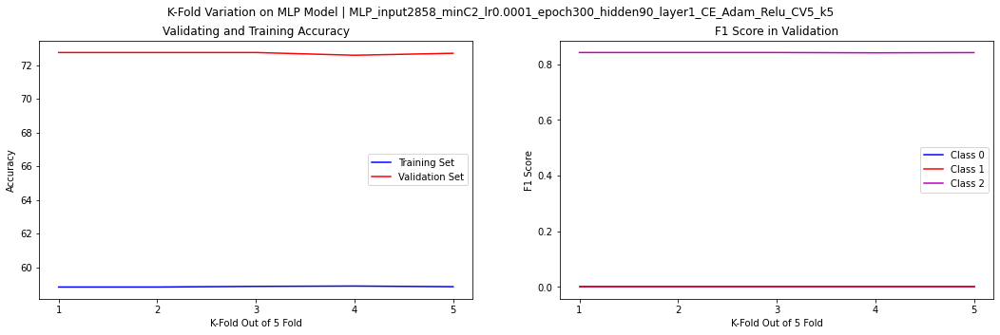

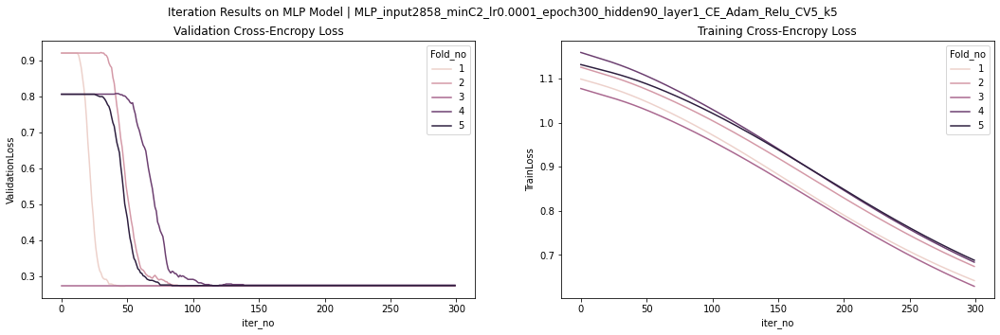

learning rate = 0.000 | hidden neurons = 100
Total training time:
112.57655072212219

Average Generalization Accuracy: 72.7009 %
Average Training Accuracy: 58.9102 %
Average F1 Score: 0: 0.000 | 1: 0.000 | 2: 0.842 




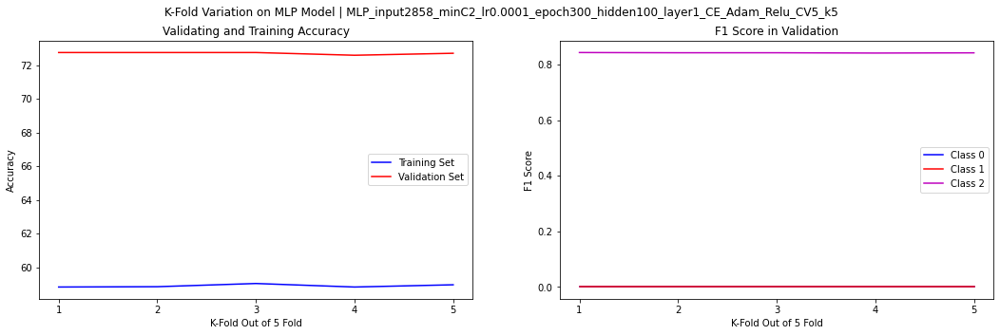

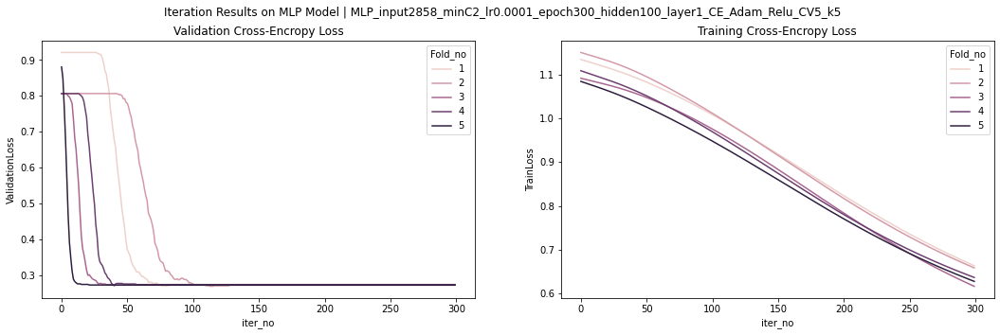

learning rate = 0.001 | hidden neurons = 10
Total training time:
46.76252269744873

Average Generalization Accuracy: 73.0880 %
Average Training Accuracy: 80.9683 %
Average F1 Score: 0: 0.242 | 1: 0.016 | 2: 0.847 




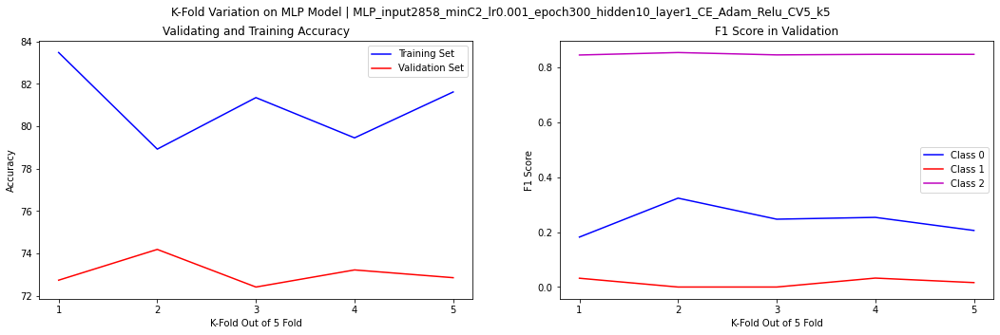

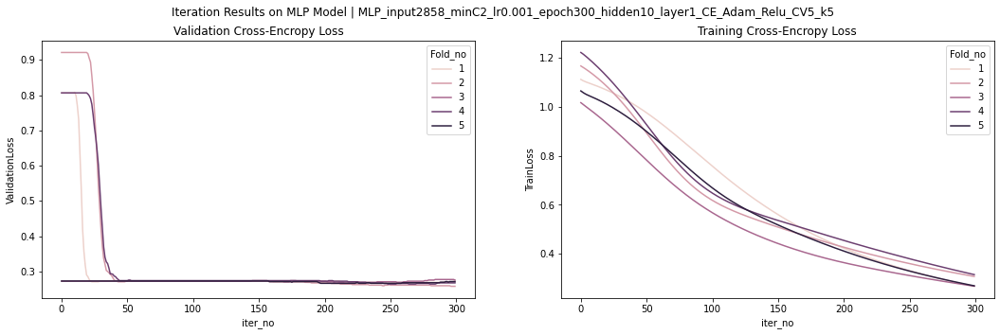

learning rate = 0.001 | hidden neurons = 20
Total training time:
57.44430422782898

Average Generalization Accuracy: 73.5720 %
Average Training Accuracy: 87.5717 %
Average F1 Score: 0: 0.293 | 1: 0.105 | 2: 0.851 




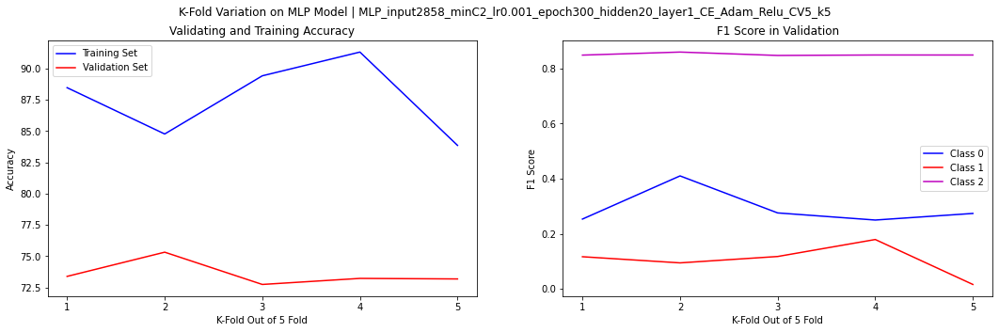

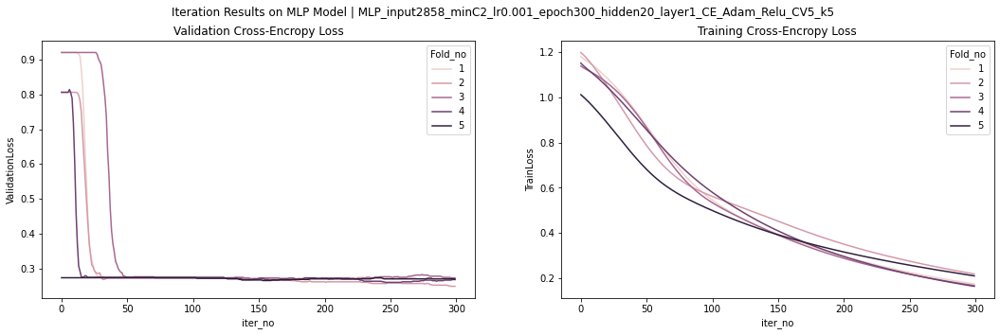

learning rate = 0.001 | hidden neurons = 30
Total training time:
78.91432332992554

Average Generalization Accuracy: 73.2493 %
Average Training Accuracy: 92.9106 %
Average F1 Score: 0: 0.279 | 1: 0.188 | 2: 0.850 




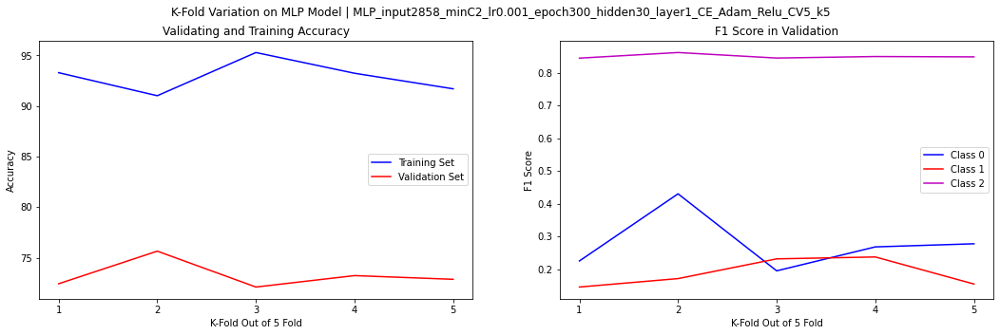

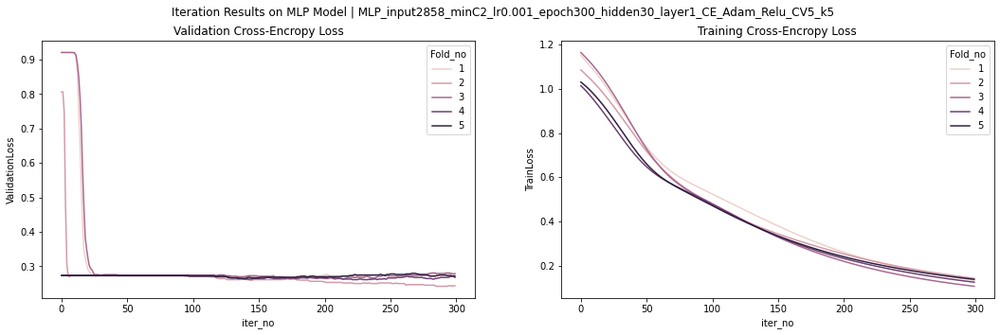

learning rate = 0.001 | hidden neurons = 40
Total training time:
65.01103782653809

Average Generalization Accuracy: 73.1201 %
Average Training Accuracy: 94.3118 %
Average F1 Score: 0: 0.292 | 1: 0.219 | 2: 0.849 




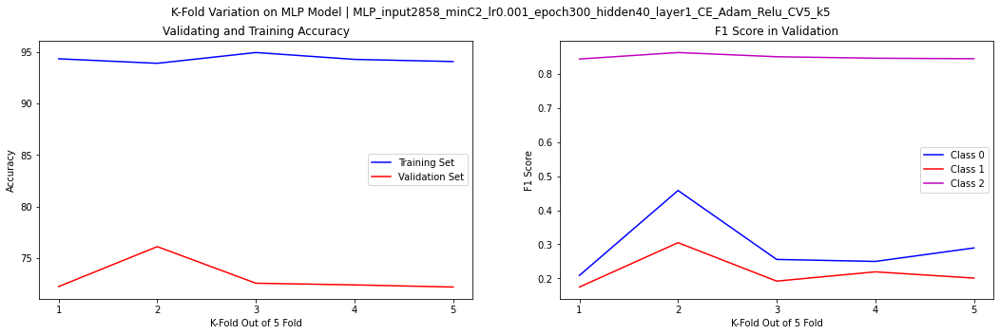

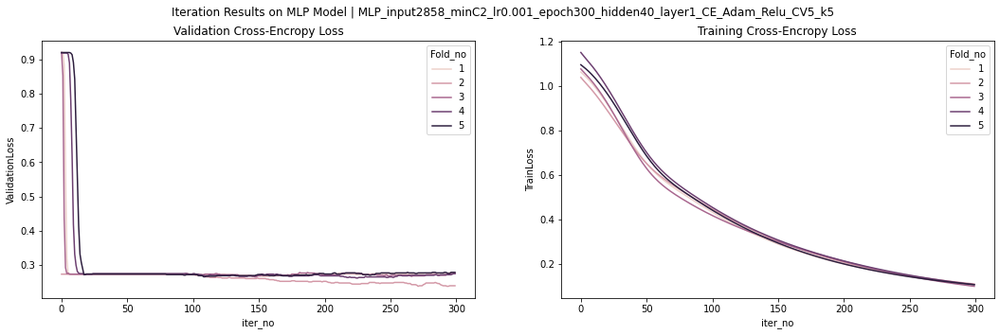

learning rate = 0.001 | hidden neurons = 50
Total training time:
92.30509328842163

Average Generalization Accuracy: 72.5394 %
Average Training Accuracy: 95.4281 %
Average F1 Score: 0: 0.289 | 1: 0.226 | 2: 0.844 




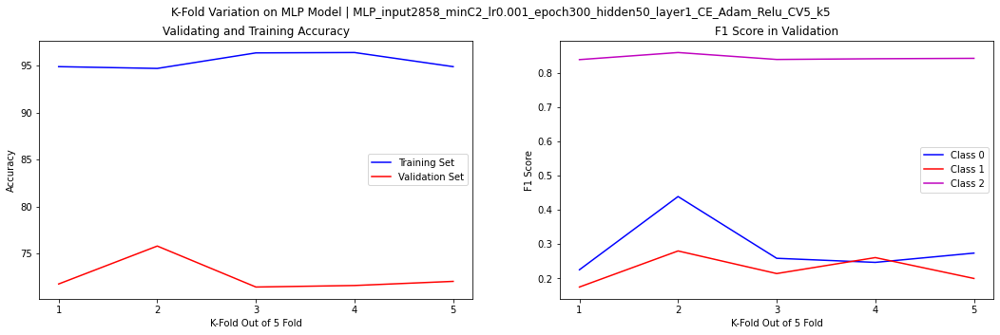

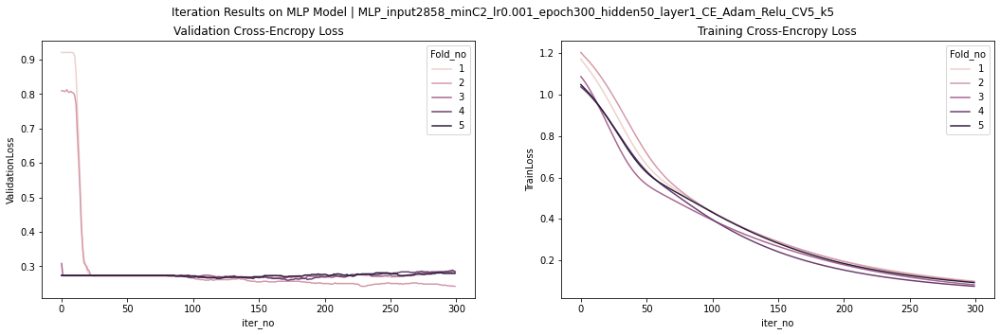

learning rate = 0.001 | hidden neurons = 60
Total training time:
97.52259635925293

Average Generalization Accuracy: 72.2490 %
Average Training Accuracy: 96.1914 %
Average F1 Score: 0: 0.290 | 1: 0.243 | 2: 0.841 




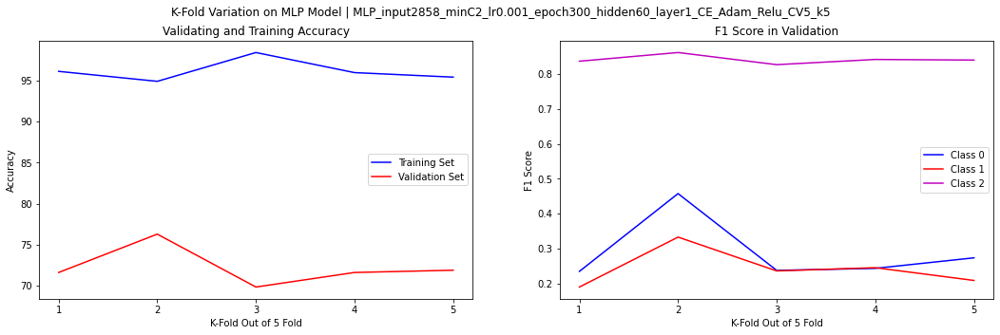

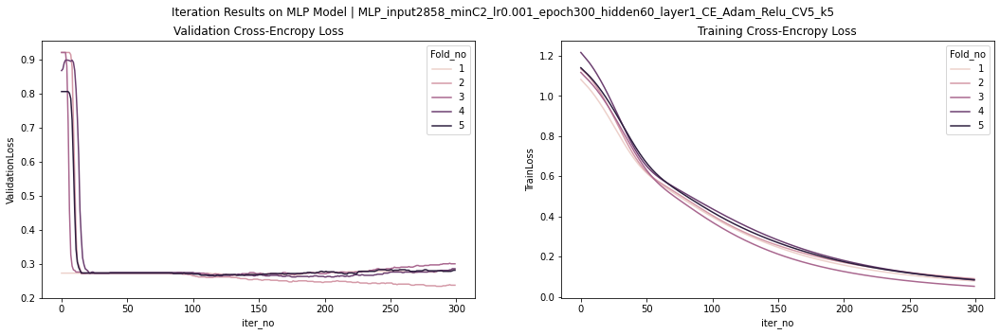

learning rate = 0.001 | hidden neurons = 70
Total training time:
110.10691952705383

Average Generalization Accuracy: 71.9266 %
Average Training Accuracy: 96.7989 %
Average F1 Score: 0: 0.293 | 1: 0.246 | 2: 0.839 




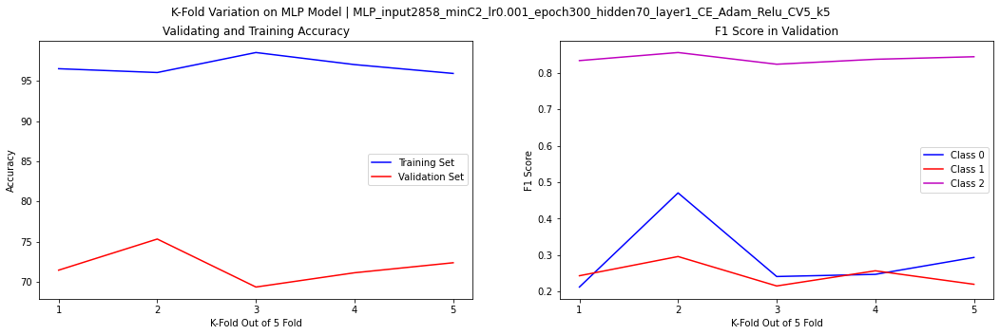

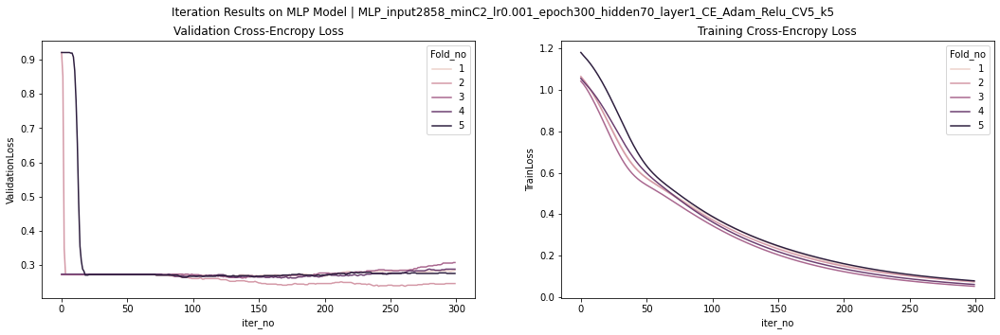

learning rate = 0.001 | hidden neurons = 80
Total training time:
112.14578676223755

Average Generalization Accuracy: 71.3456 %
Average Training Accuracy: 97.2204 %
Average F1 Score: 0: 0.295 | 1: 0.247 | 2: 0.835 




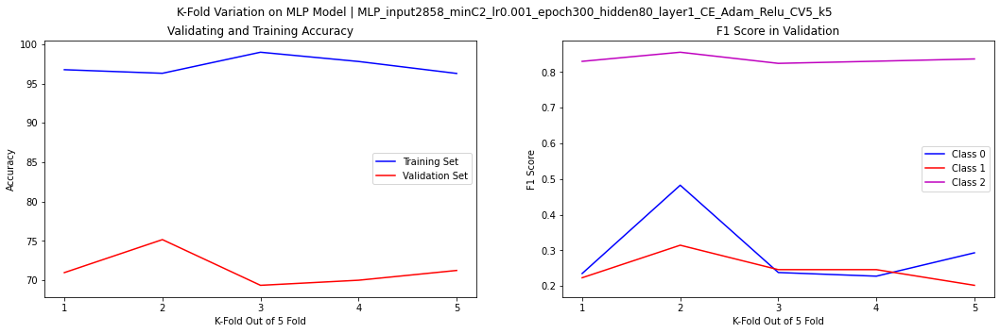

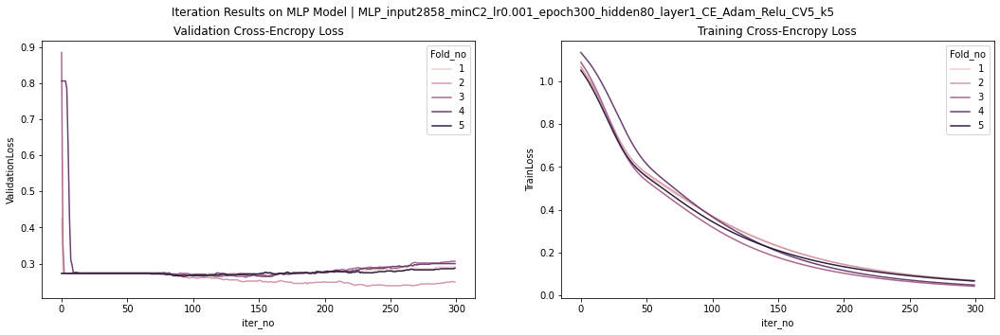

learning rate = 0.001 | hidden neurons = 90
Total training time:
182.3992464542389

Average Generalization Accuracy: 71.1843 %
Average Training Accuracy: 97.3040 %
Average F1 Score: 0: 0.276 | 1: 0.252 | 2: 0.834 




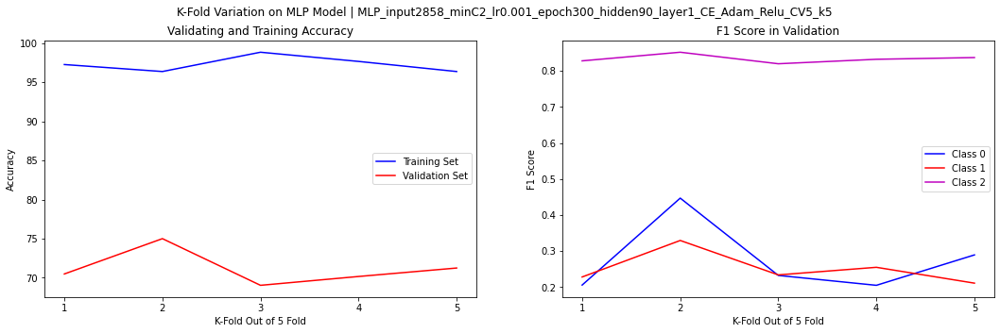

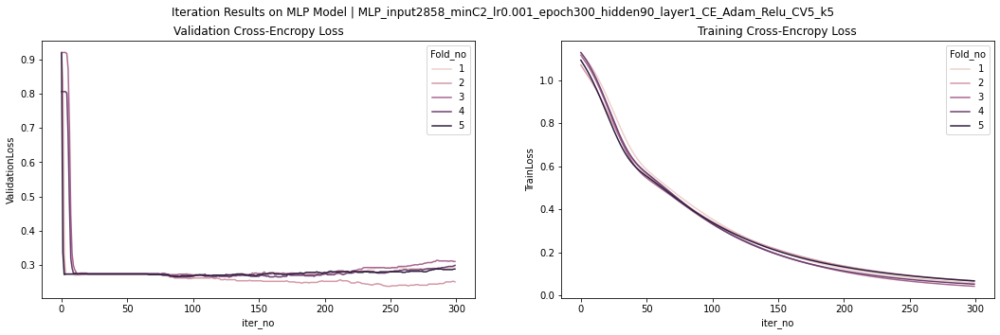

learning rate = 0.001 | hidden neurons = 100
Total training time:
153.92836260795593

Average Generalization Accuracy: 71.0229 %
Average Training Accuracy: 97.6305 %
Average F1 Score: 0: 0.280 | 1: 0.260 | 2: 0.833 




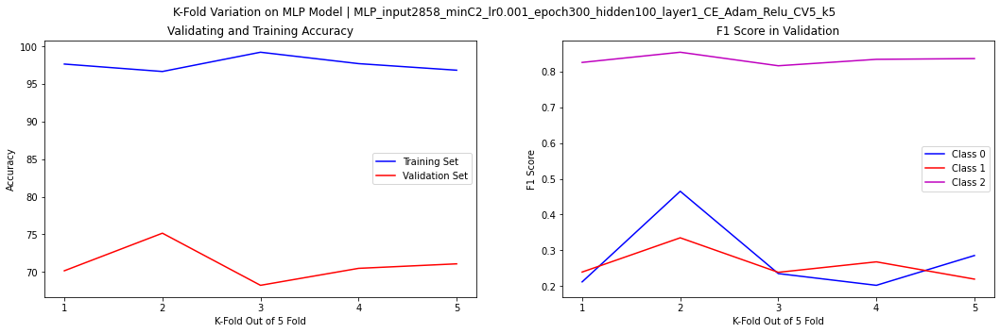

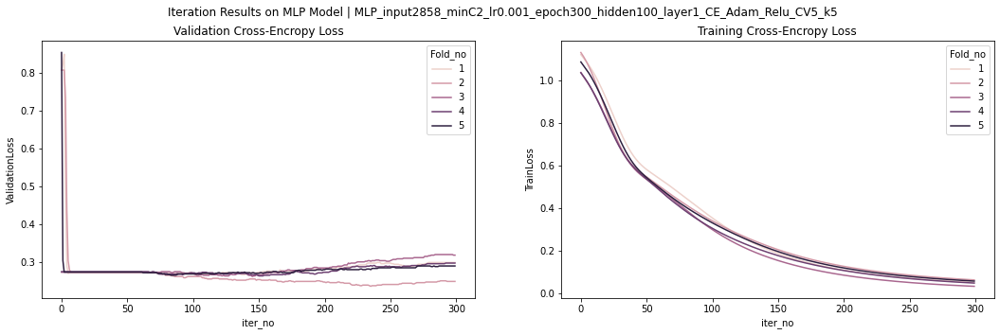

learning rate = 0.005 | hidden neurons = 10
Total training time:
65.36001348495483

Average Generalization Accuracy: 70.1841 %
Average Training Accuracy: 98.0862 %
Average F1 Score: 0: 0.287 | 1: 0.266 | 2: 0.826 




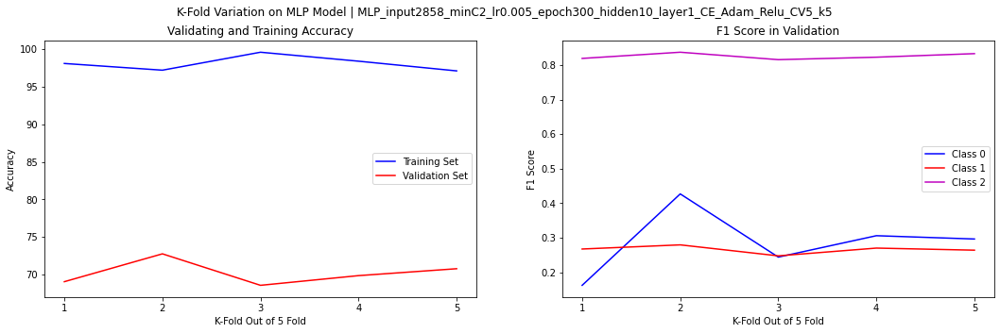

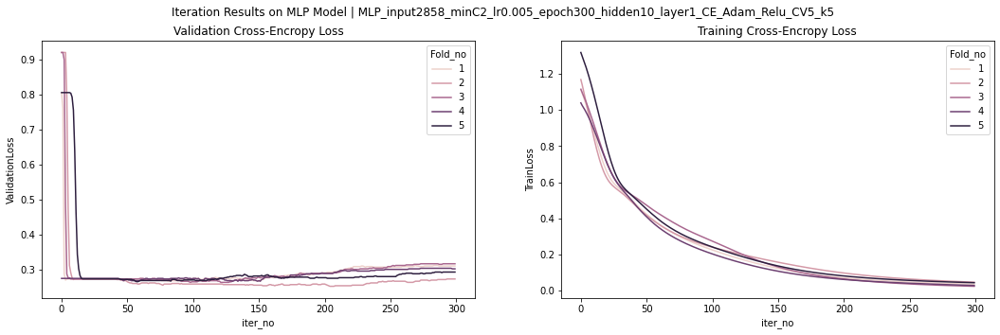

learning rate = 0.005 | hidden neurons = 20
Total training time:
65.71435499191284

Average Generalization Accuracy: 68.7642 %
Average Training Accuracy: 99.1532 %
Average F1 Score: 0: 0.269 | 1: 0.285 | 2: 0.816 




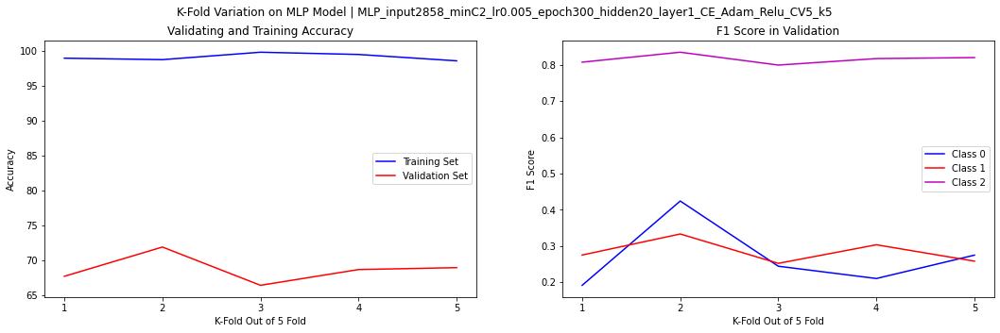

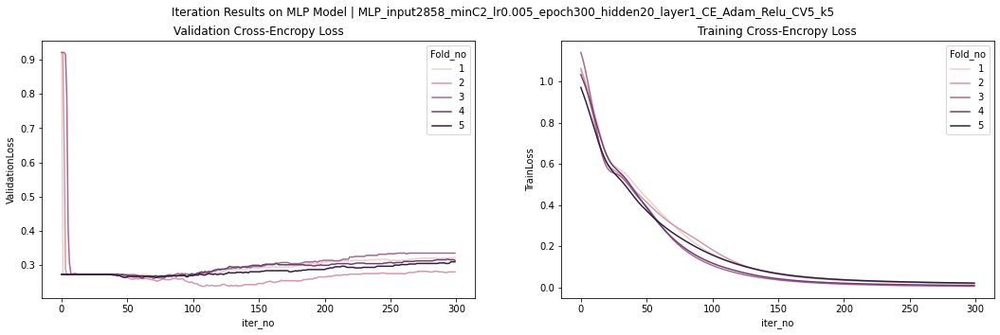

learning rate = 0.005 | hidden neurons = 30
Total training time:
89.38325428962708

Average Generalization Accuracy: 69.0867 %
Average Training Accuracy: 99.2330 %
Average F1 Score: 0: 0.279 | 1: 0.294 | 2: 0.817 




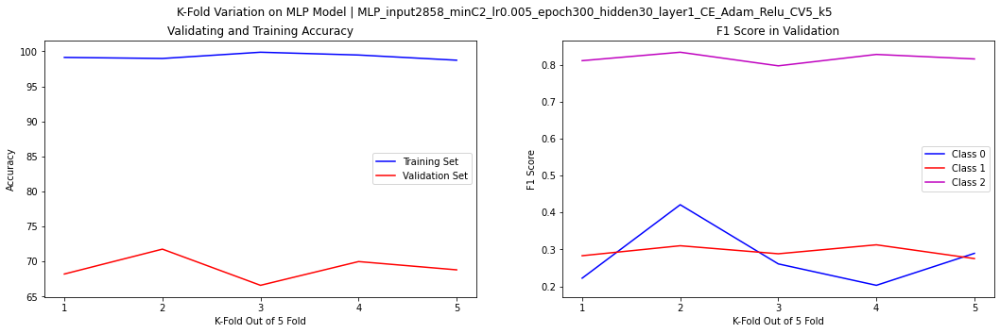

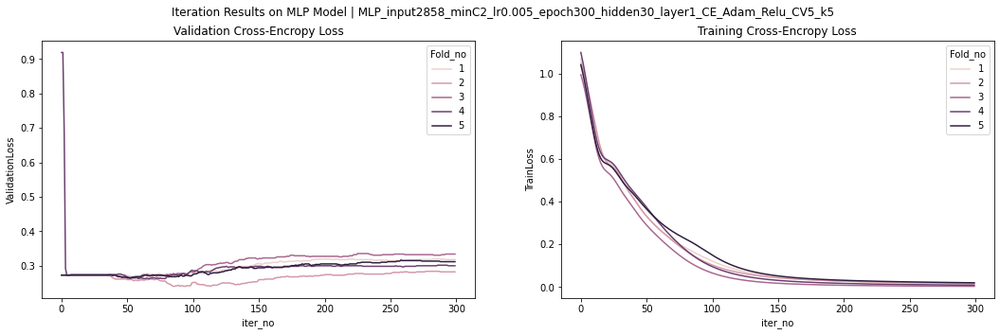

learning rate = 0.005 | hidden neurons = 40
Total training time:
82.31566214561462

Average Generalization Accuracy: 68.5382 %
Average Training Accuracy: 99.3659 %
Average F1 Score: 0: 0.280 | 1: 0.281 | 2: 0.813 




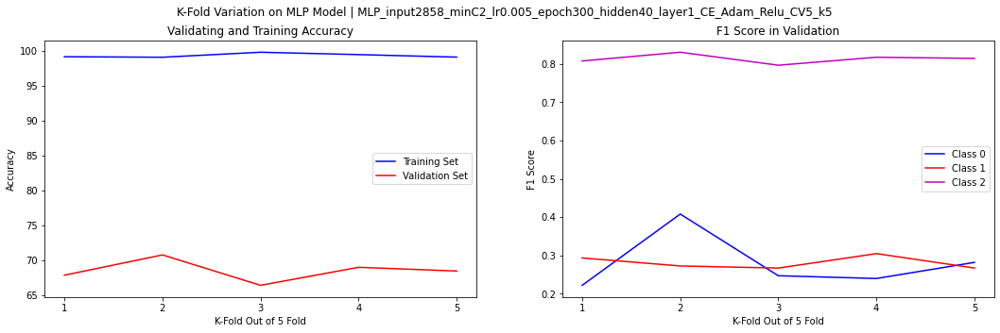

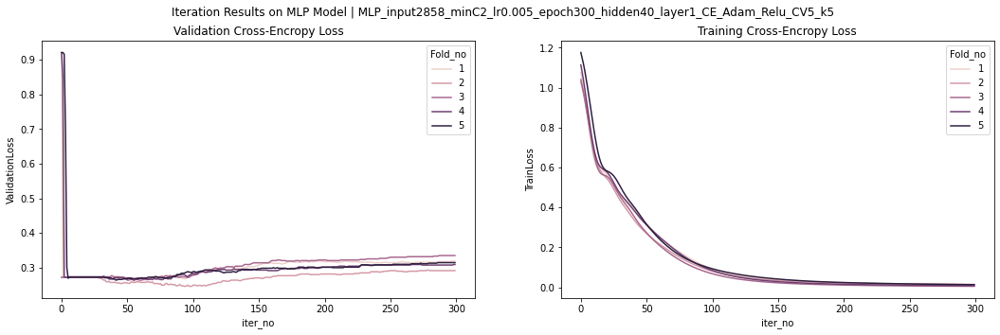

learning rate = 0.005 | hidden neurons = 50
Total training time:
96.55355739593506

Average Generalization Accuracy: 68.6026 %
Average Training Accuracy: 99.3431 %
Average F1 Score: 0: 0.279 | 1: 0.280 | 2: 0.814 




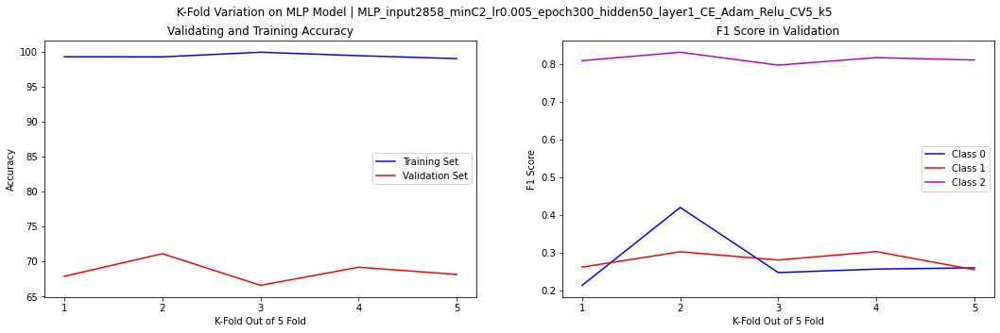

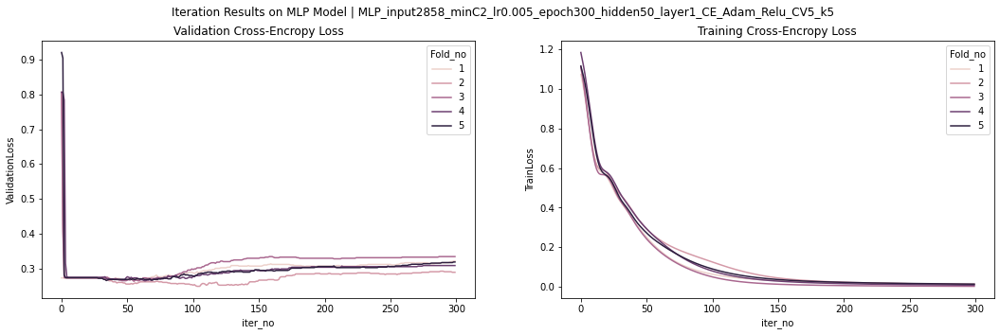

learning rate = 0.005 | hidden neurons = 60
Total training time:
101.7884030342102

Average Generalization Accuracy: 68.5382 %
Average Training Accuracy: 99.4532 %
Average F1 Score: 0: 0.294 | 1: 0.283 | 2: 0.813 




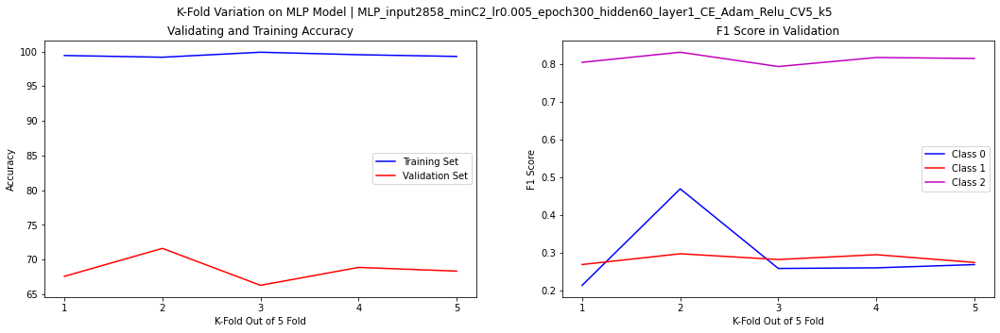

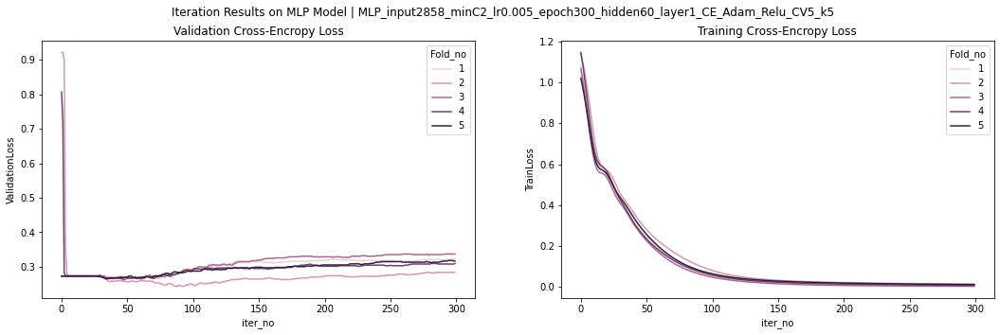

learning rate = 0.005 | hidden neurons = 70
Total training time:
109.02573323249817

Average Generalization Accuracy: 68.3769 %
Average Training Accuracy: 99.4760 %
Average F1 Score: 0: 0.295 | 1: 0.280 | 2: 0.813 




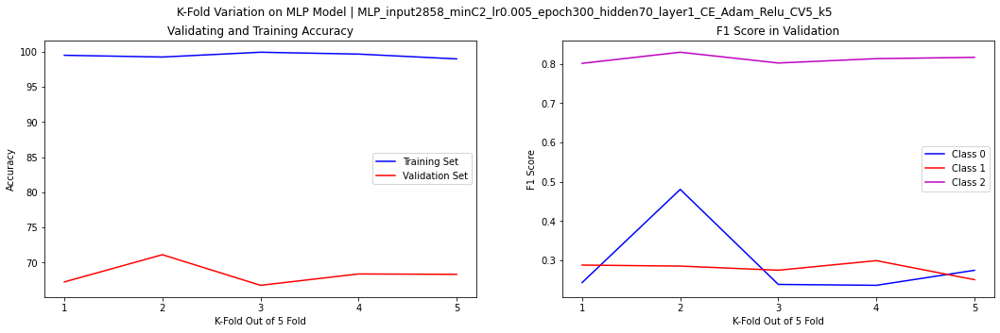

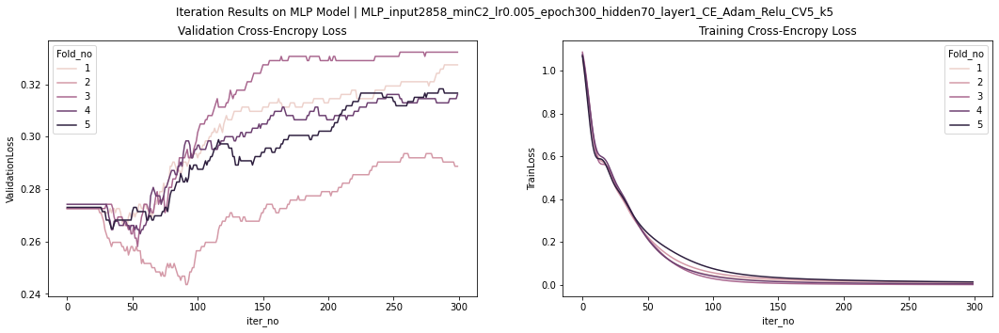

learning rate = 0.005 | hidden neurons = 80
Total training time:
99.06235194206238

Average Generalization Accuracy: 68.2800 %
Average Training Accuracy: 99.5671 %
Average F1 Score: 0: 0.300 | 1: 0.275 | 2: 0.811 




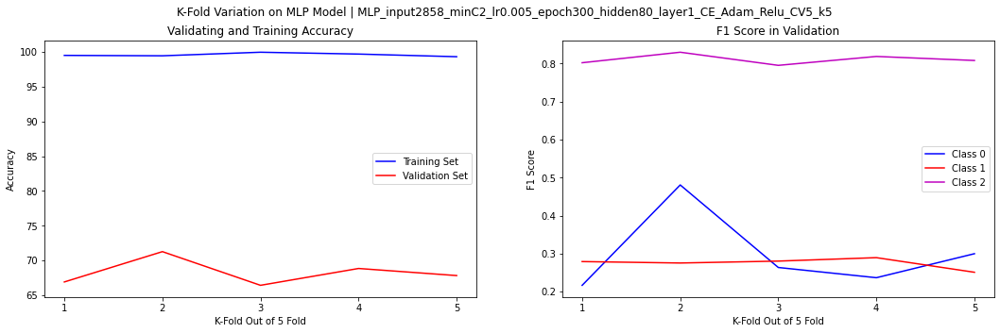

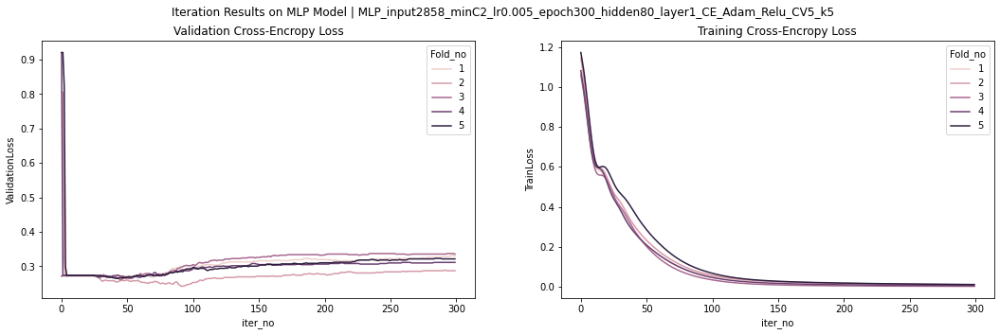

learning rate = 0.005 | hidden neurons = 90
Total training time:
128.53658652305603

Average Generalization Accuracy: 68.1835 %
Average Training Accuracy: 99.5709 %
Average F1 Score: 0: 0.289 | 1: 0.286 | 2: 0.811 




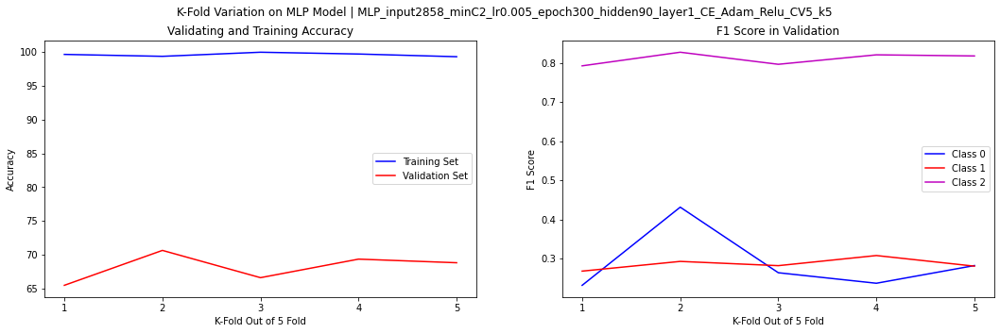

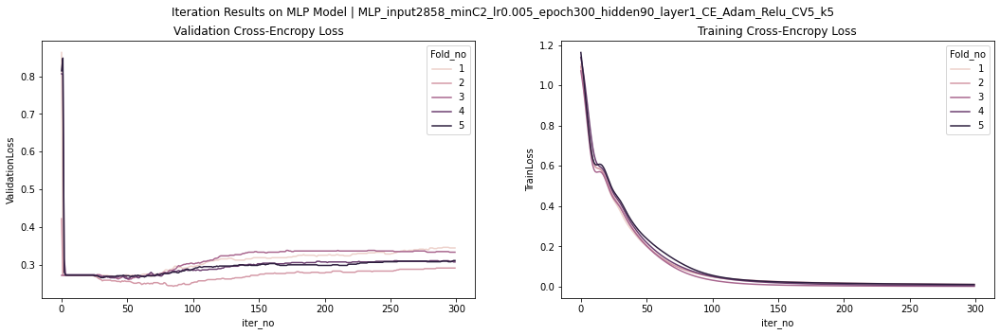

learning rate = 0.005 | hidden neurons = 100
Total training time:
133.03030133247375

Average Generalization Accuracy: 68.4736 %
Average Training Accuracy: 99.6545 %
Average F1 Score: 0: 0.288 | 1: 0.287 | 2: 0.815 




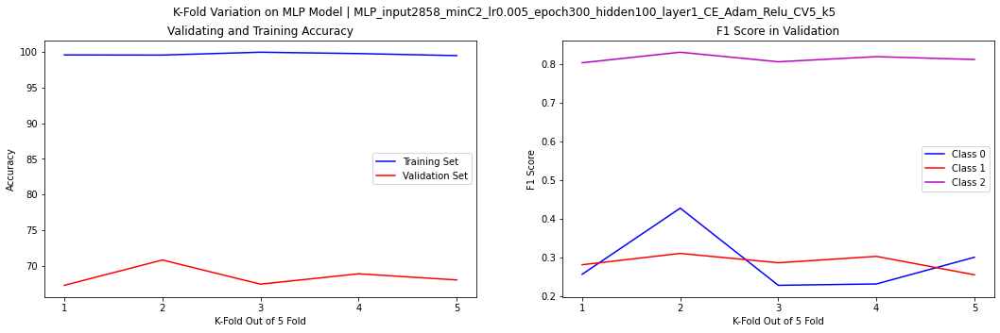

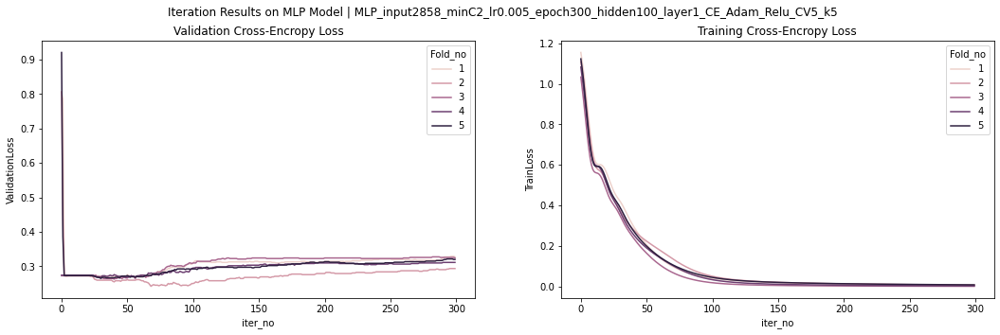

learning rate = 0.010 | hidden neurons = 10
Total training time:
51.970598459243774

Average Generalization Accuracy: 68.8285 %
Average Training Accuracy: 99.0089 %
Average F1 Score: 0: 0.264 | 1: 0.285 | 2: 0.816 




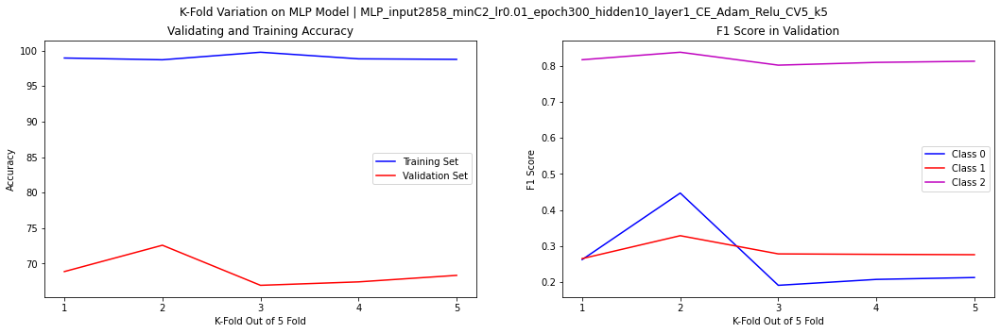

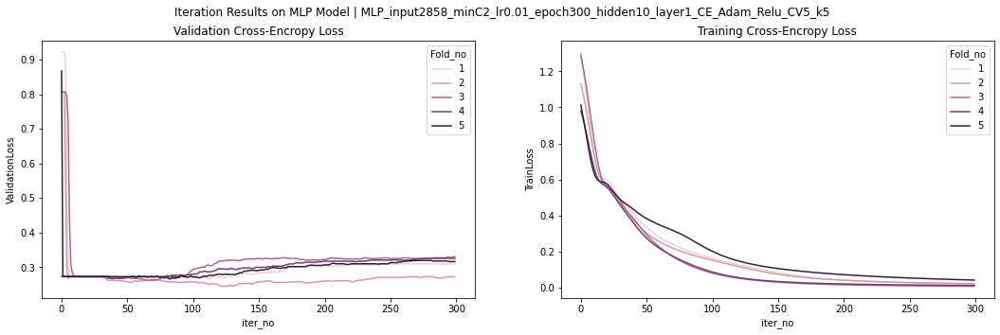

learning rate = 0.010 | hidden neurons = 20
Total training time:
56.35422086715698

Average Generalization Accuracy: 68.1187 %
Average Training Accuracy: 99.4608 %
Average F1 Score: 0: 0.296 | 1: 0.282 | 2: 0.811 




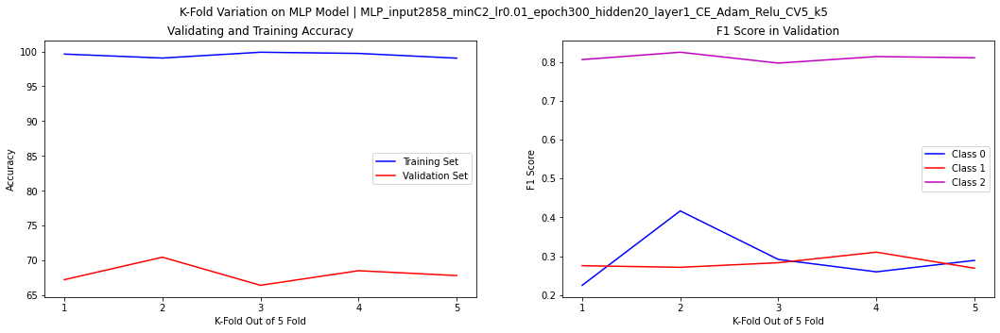

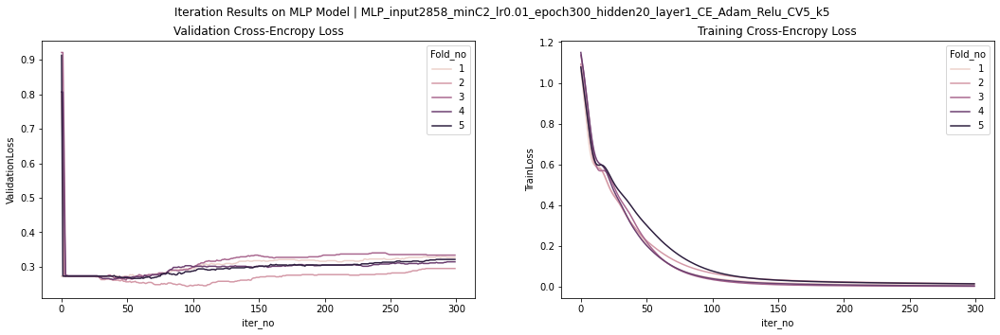

learning rate = 0.010 | hidden neurons = 30
Total training time:
70.04578185081482

Average Generalization Accuracy: 67.4088 %
Average Training Accuracy: 99.6051 %
Average F1 Score: 0: 0.267 | 1: 0.268 | 2: 0.808 




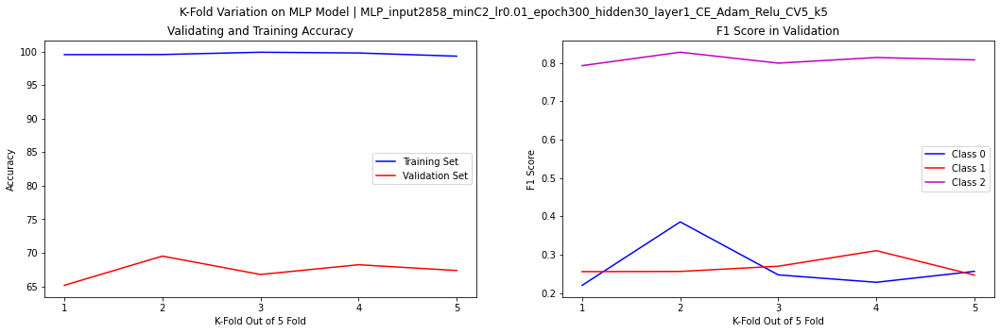

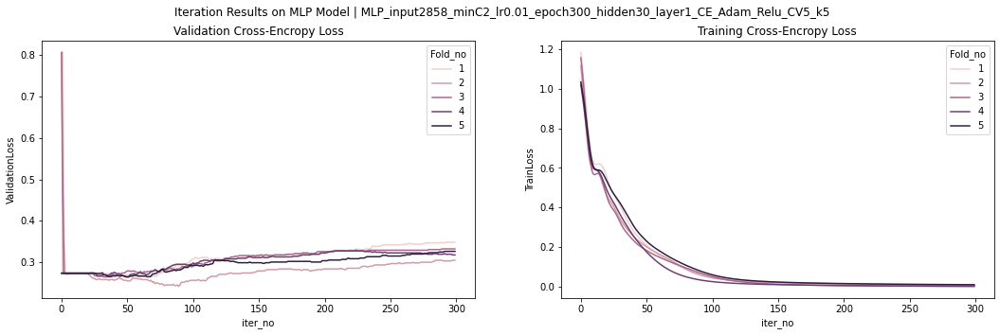

learning rate = 0.010 | hidden neurons = 40
Total training time:
73.9044713973999

Average Generalization Accuracy: 67.4412 %
Average Training Accuracy: 99.6734 %
Average F1 Score: 0: 0.293 | 1: 0.282 | 2: 0.806 




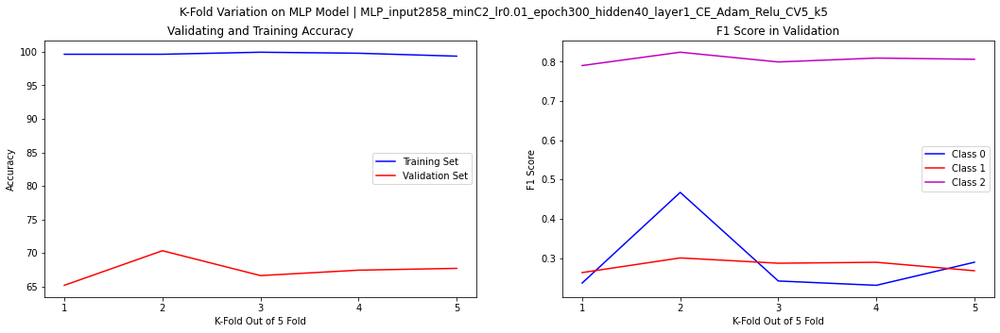

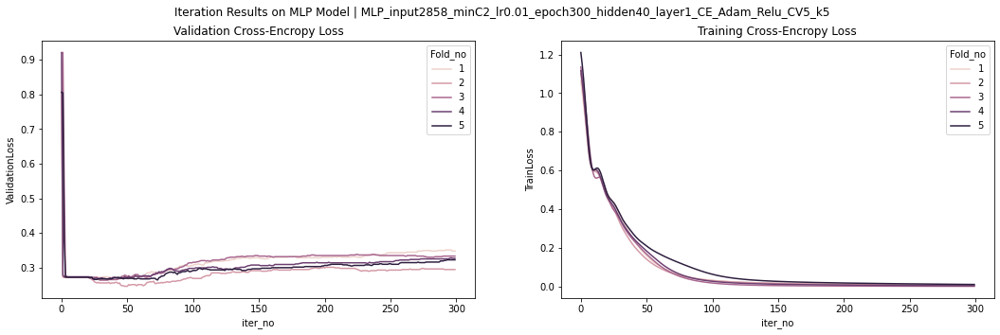

learning rate = 0.010 | hidden neurons = 50
Total training time:
86.6757926940918

Average Generalization Accuracy: 66.7955 %
Average Training Accuracy: 99.7152 %
Average F1 Score: 0: 0.274 | 1: 0.290 | 2: 0.800 




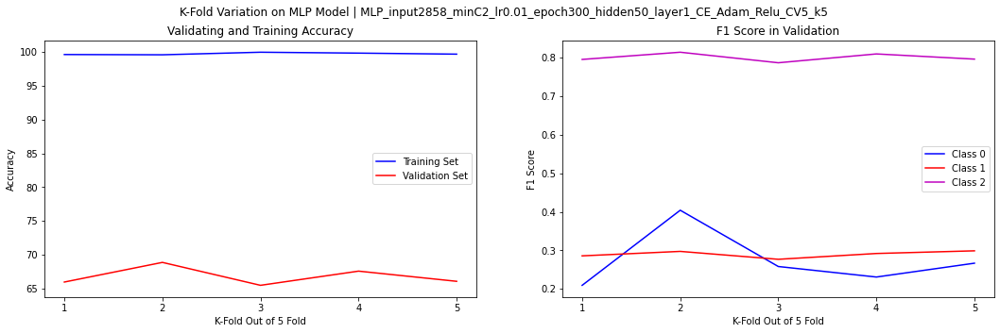

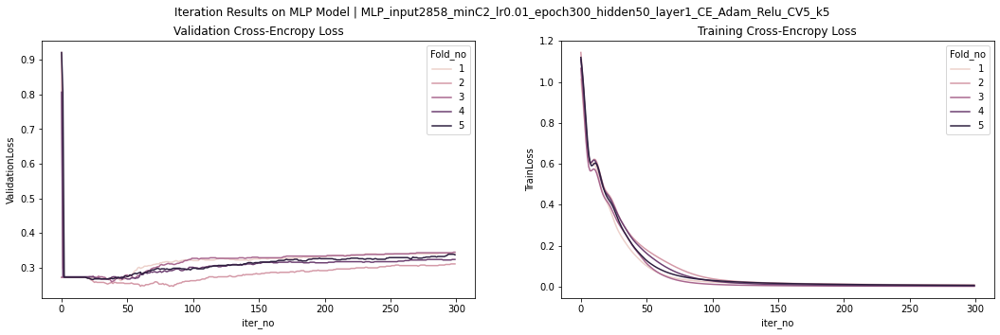

learning rate = 0.010 | hidden neurons = 60
Total training time:
97.89123320579529

Average Generalization Accuracy: 67.4083 %
Average Training Accuracy: 99.7114 %
Average F1 Score: 0: 0.278 | 1: 0.283 | 2: 0.806 




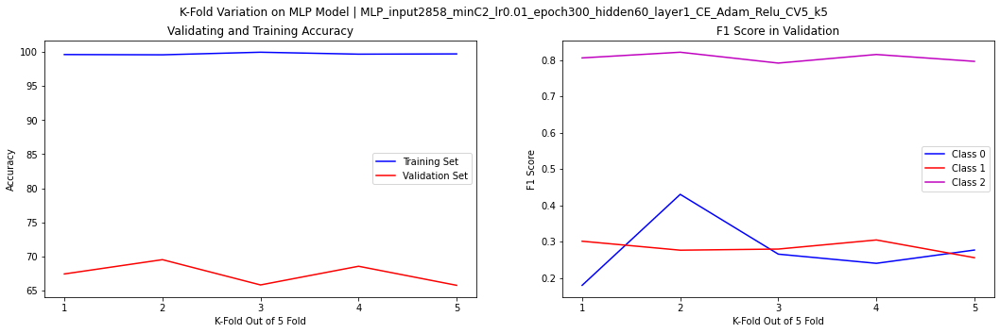

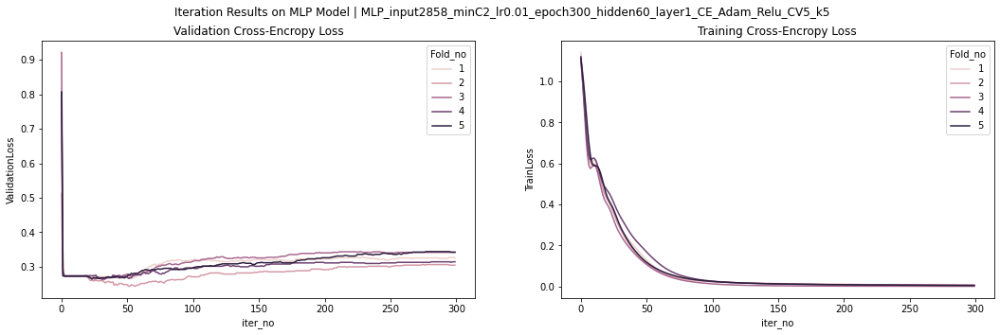

learning rate = 0.010 | hidden neurons = 70
Total training time:
109.49579381942749

Average Generalization Accuracy: 66.7309 %
Average Training Accuracy: 99.7114 %
Average F1 Score: 0: 0.267 | 1: 0.285 | 2: 0.801 




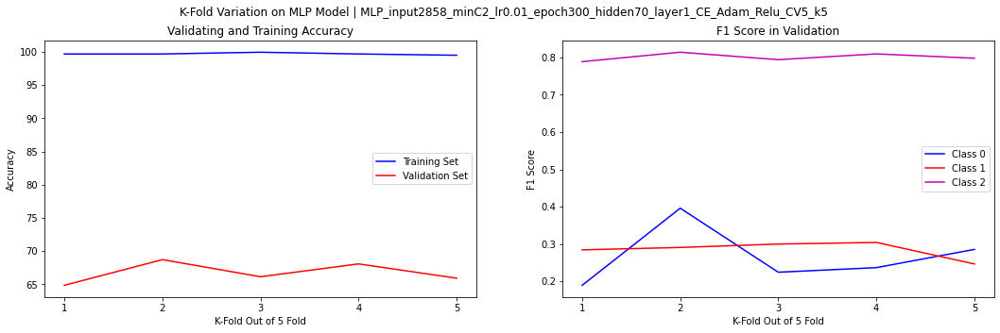

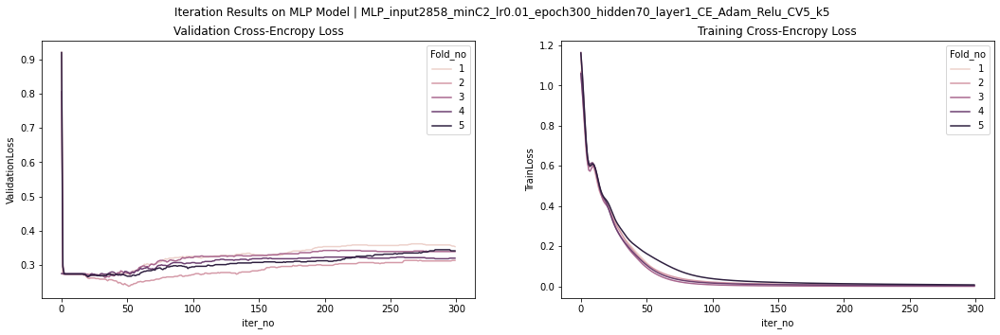

learning rate = 0.010 | hidden neurons = 80
Total training time:
103.3244776725769

Average Generalization Accuracy: 67.6347 %
Average Training Accuracy: 99.7190 %
Average F1 Score: 0: 0.288 | 1: 0.285 | 2: 0.806 




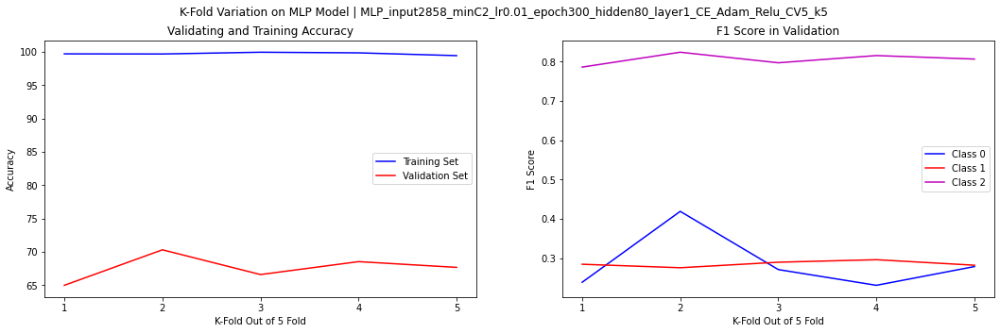

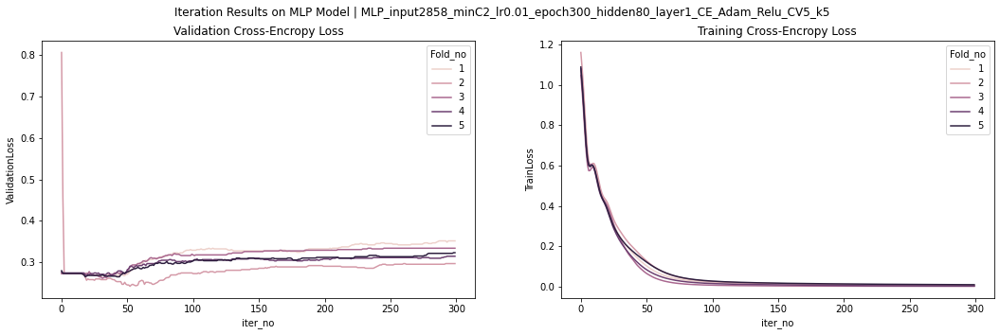

learning rate = 0.010 | hidden neurons = 90
Total training time:
129.23478865623474

Average Generalization Accuracy: 67.5702 %
Average Training Accuracy: 99.7684 %
Average F1 Score: 0: 0.282 | 1: 0.293 | 2: 0.805 




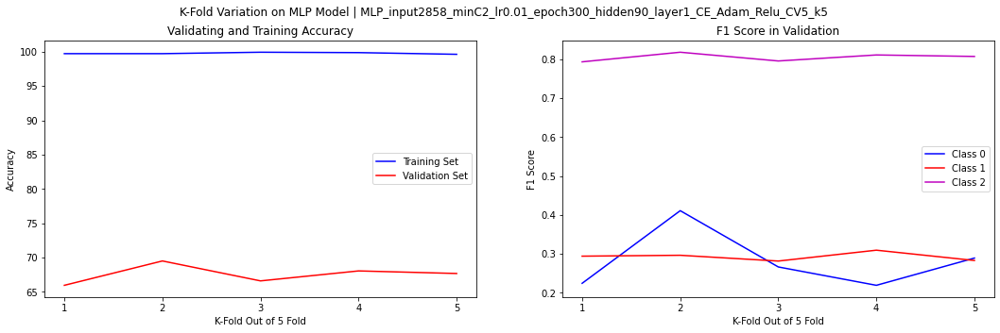

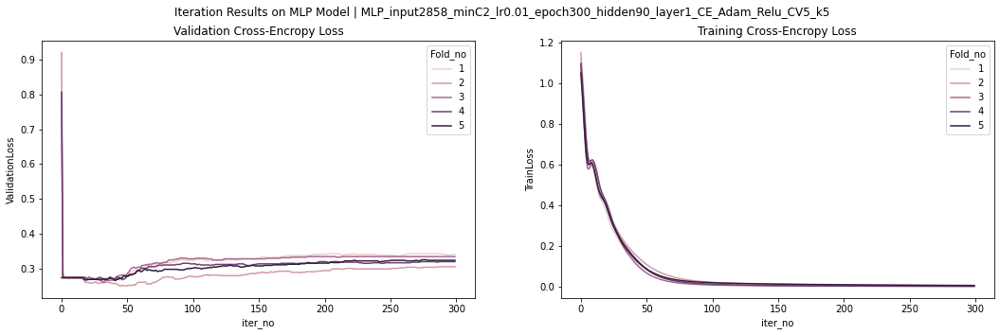

learning rate = 0.010 | hidden neurons = 100
Total training time:
133.02437663078308

Average Generalization Accuracy: 66.7633 %
Average Training Accuracy: 99.8063 %
Average F1 Score: 0: 0.293 | 1: 0.286 | 2: 0.799 




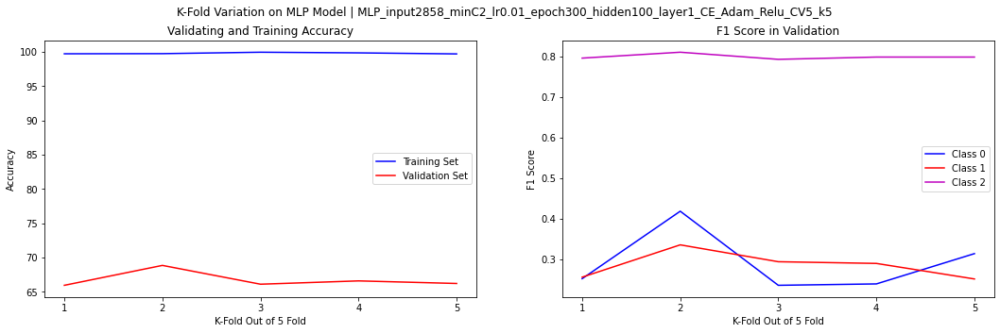

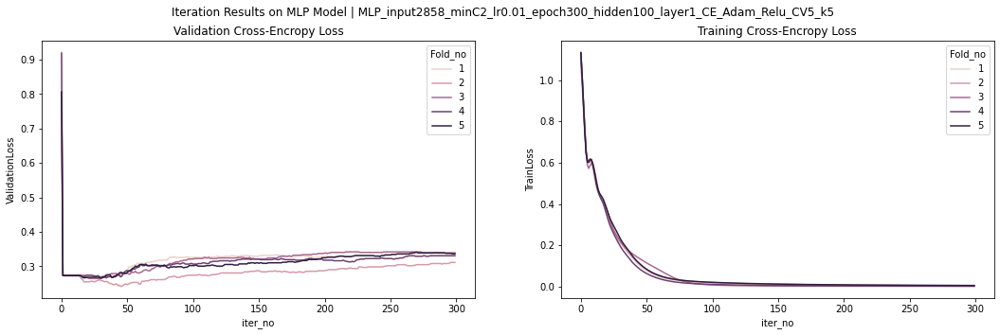

learning rate = 0.050 | hidden neurons = 10
Total training time:
53.18498086929321

Average Generalization Accuracy: 66.7952 %
Average Training Accuracy: 99.7456 %
Average F1 Score: 0: 0.248 | 1: 0.292 | 2: 0.801 




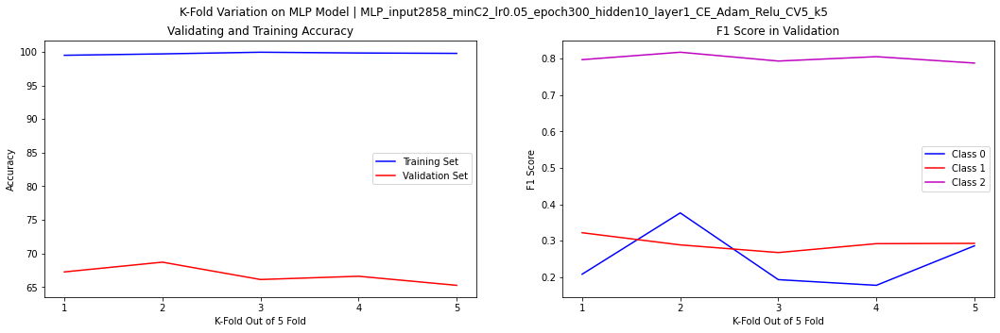

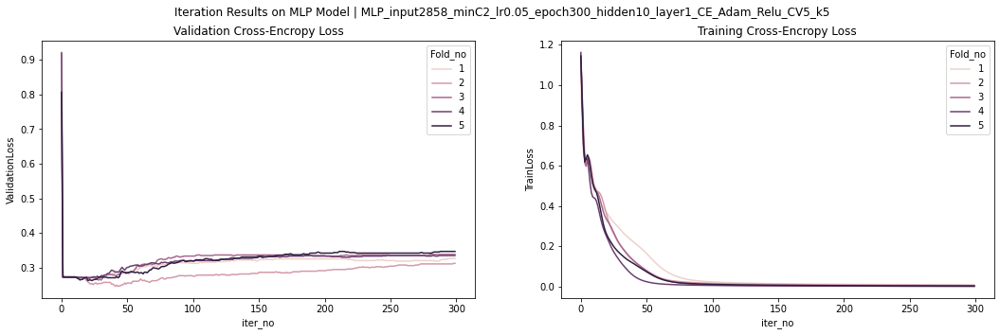

learning rate = 0.050 | hidden neurons = 20
Total training time:
57.224666118621826

Average Generalization Accuracy: 67.2475 %
Average Training Accuracy: 99.7494 %
Average F1 Score: 0: 0.266 | 1: 0.300 | 2: 0.802 




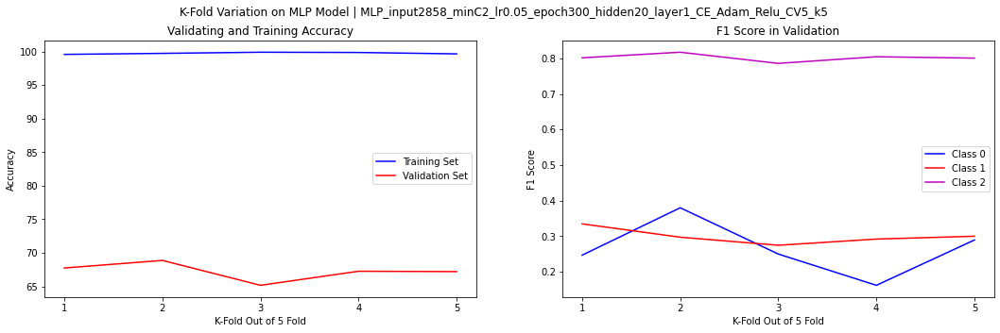

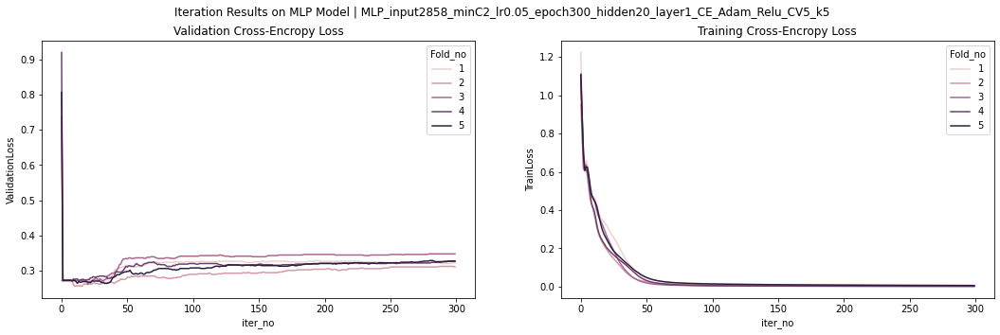

learning rate = 0.050 | hidden neurons = 30
Total training time:
64.43810319900513

Average Generalization Accuracy: 66.9251 %
Average Training Accuracy: 99.8329 %
Average F1 Score: 0: 0.270 | 1: 0.301 | 2: 0.802 




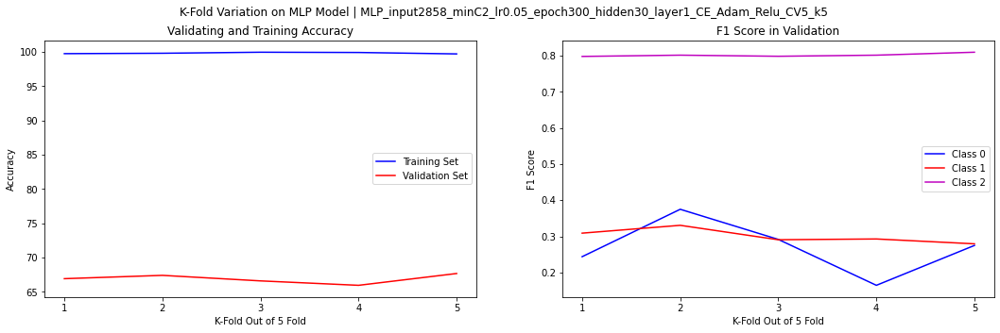

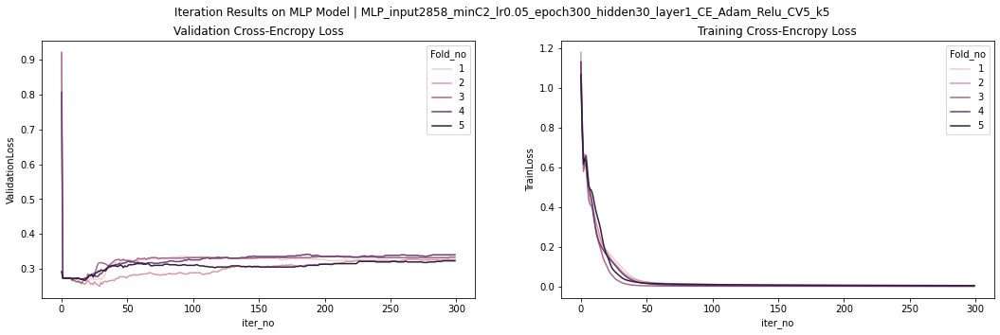

learning rate = 0.050 | hidden neurons = 40
Total training time:
72.66768789291382

Average Generalization Accuracy: 67.1498 %
Average Training Accuracy: 99.8557 %
Average F1 Score: 0: 0.274 | 1: 0.300 | 2: 0.801 




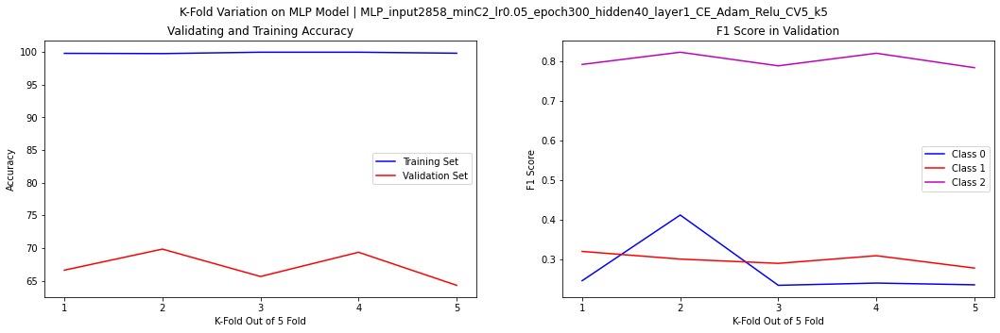

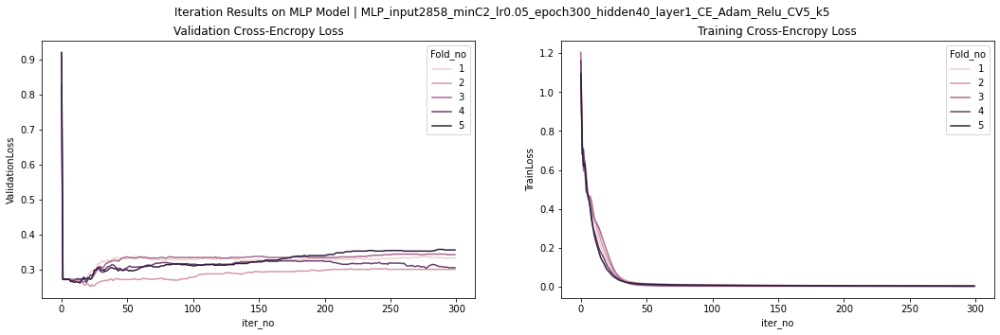

learning rate = 0.050 | hidden neurons = 50
Total training time:
88.73168635368347

Average Generalization Accuracy: 67.3441 %
Average Training Accuracy: 99.8557 %
Average F1 Score: 0: 0.263 | 1: 0.293 | 2: 0.805 




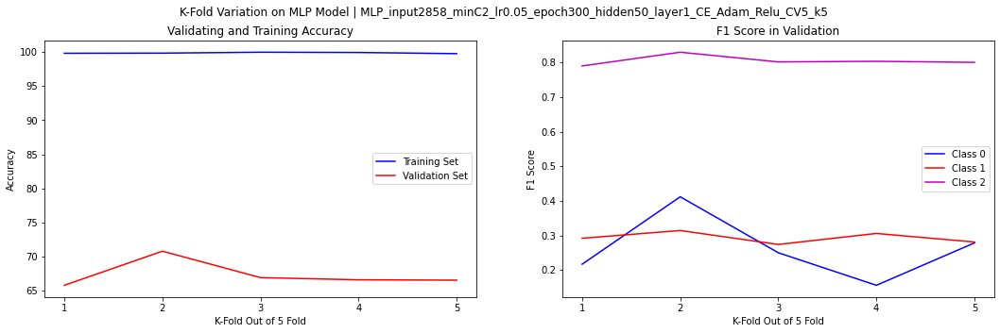

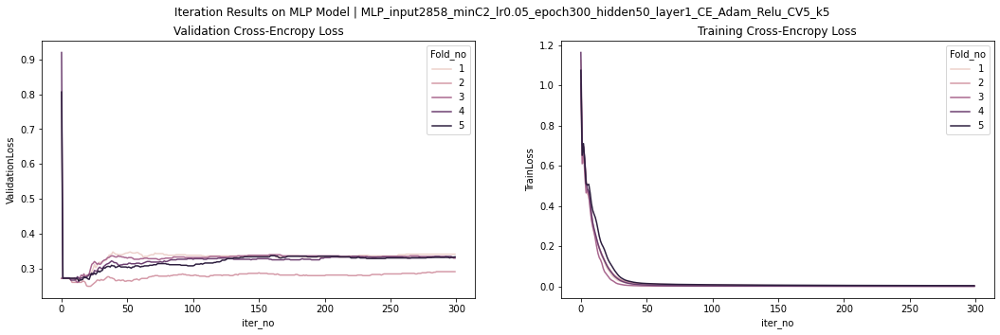

learning rate = 0.050 | hidden neurons = 60
Total training time:
95.35414838790894

Average Generalization Accuracy: 66.6984 %
Average Training Accuracy: 99.9051 %
Average F1 Score: 0: 0.269 | 1: 0.290 | 2: 0.802 




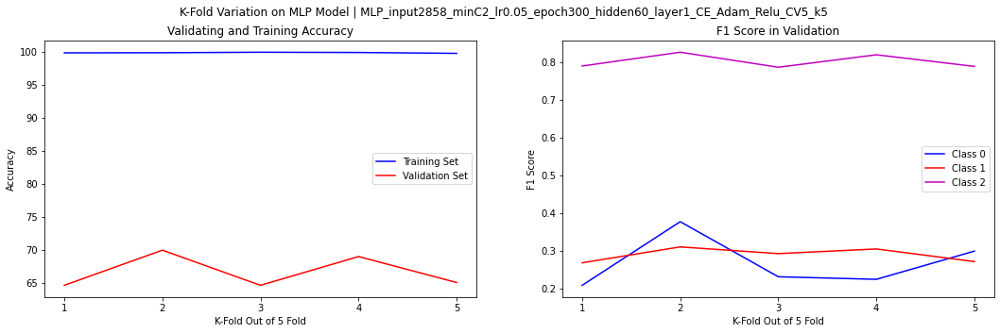

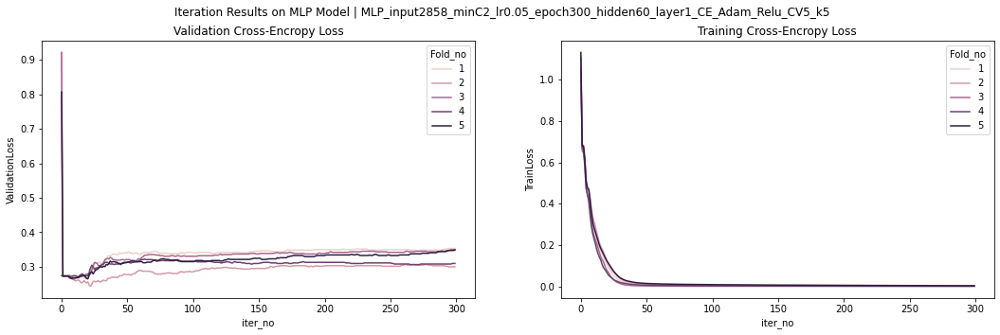

learning rate = 0.050 | hidden neurons = 70
Total training time:
106.18452405929565

Average Generalization Accuracy: 68.1833 %
Average Training Accuracy: 99.9241 %
Average F1 Score: 0: 0.290 | 1: 0.280 | 2: 0.810 




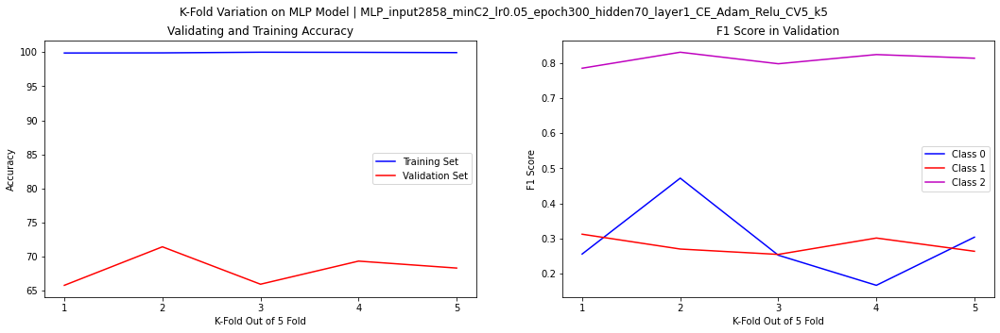

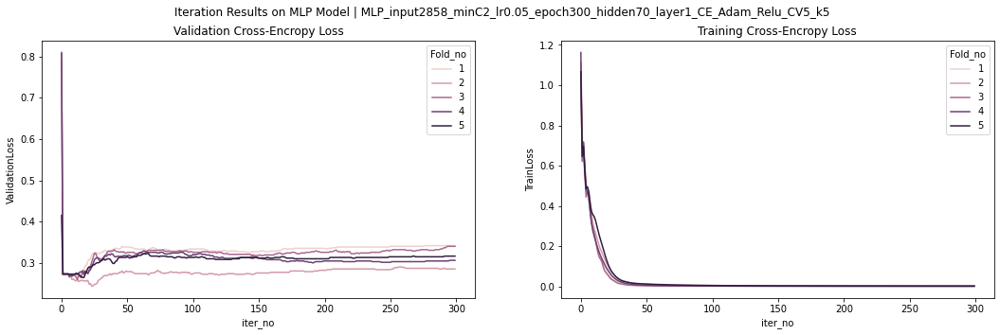

learning rate = 0.050 | hidden neurons = 80
Total training time:
113.08396410942078

Average Generalization Accuracy: 67.2476 %
Average Training Accuracy: 99.9013 %
Average F1 Score: 0: 0.261 | 1: 0.294 | 2: 0.805 




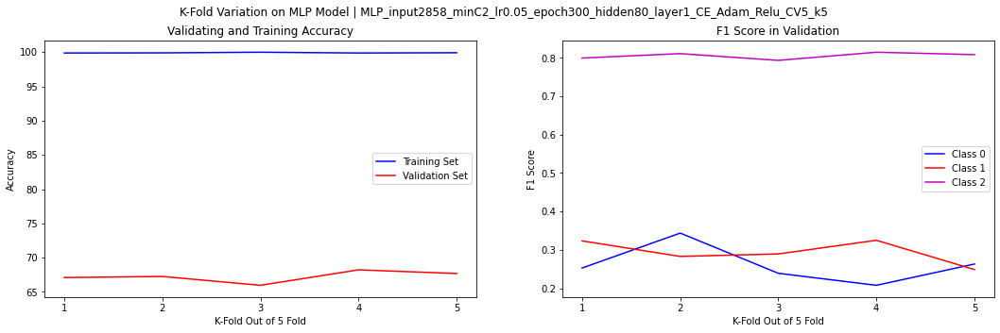

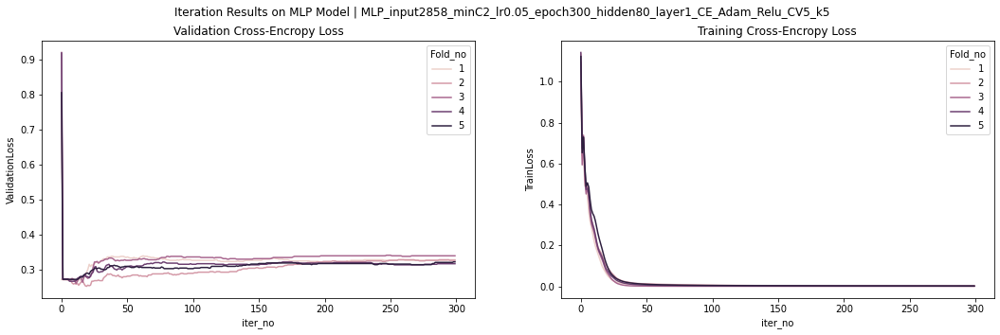

learning rate = 0.050 | hidden neurons = 90
Total training time:
128.707181930542

Average Generalization Accuracy: 67.3757 %
Average Training Accuracy: 99.8861 %
Average F1 Score: 0: 0.240 | 1: 0.294 | 2: 0.805 




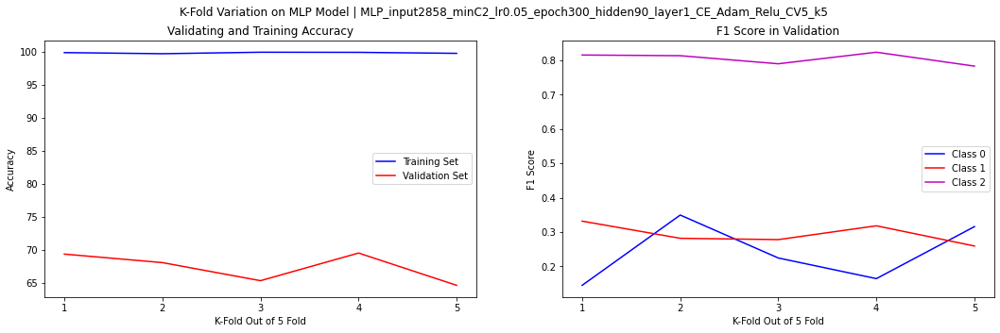

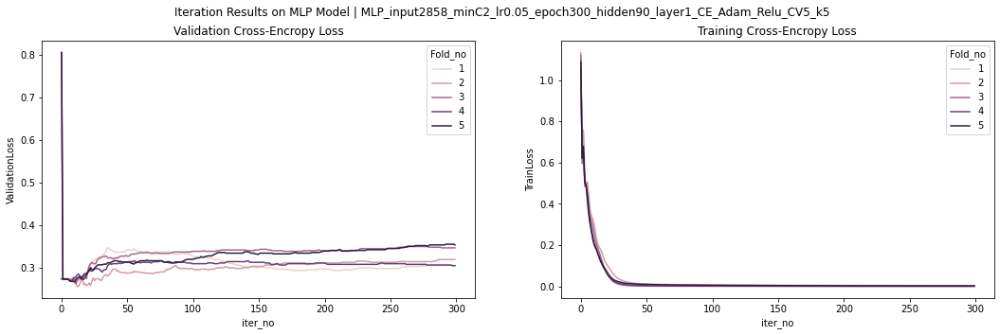

learning rate = 0.050 | hidden neurons = 100
Total training time:
134.71098160743713

Average Generalization Accuracy: 67.5688 %
Average Training Accuracy: 99.8937 %
Average F1 Score: 0: 0.260 | 1: 0.307 | 2: 0.805 




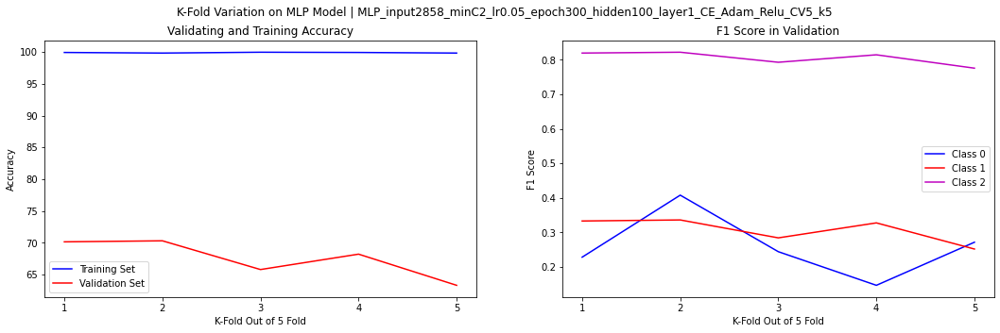

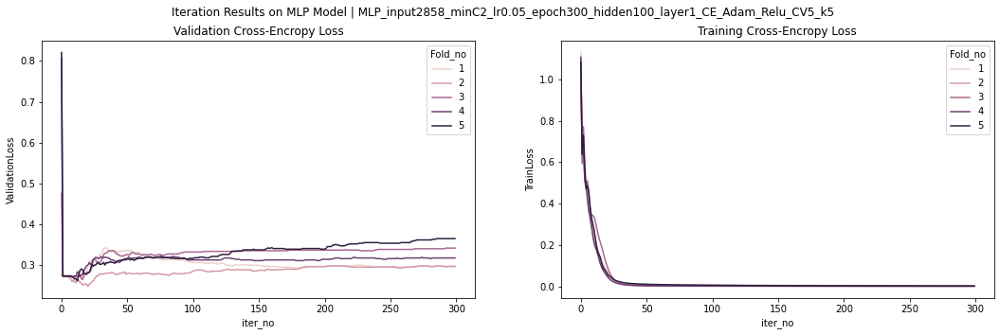

In [404]:
## Grid search 
lr_list = [0.0001,0.001, 0.005,0.01,0.05]
hidden_lst = np.arange(10,101,10)

OptimizerName = 'Adam'
lossFunc = 'CE'
ActivationFunc1 = 'Relu'
ActivationFunc2 = None
layer = 1
#learning_rate = 0.01
# hidden_size = 50
early_stopping =-1
num_epochs = 300
k= 5
over_proportion_list=[0.4,0.3,1]
classes=[0,1,2]
min_count = 2
SMOTE_bool=True
cv = 5
kFold = StratifiedKFold(n_splits=cv, shuffle=True, random_state=123)
CE_weight=True

grid_search3_sum = pd.DataFrame(columns=list(overview_training.columns))  
grid_search3_iter = pd.DataFrame(columns=list(iterResult.columns))  

for learning_rate in lr_list:
    for hidden_size in hidden_lst:
        print('learning rate = %.3f | hidden neurons = %d' %(learning_rate,hidden_size))
        sum_overview , sum_iter ,_= Train_MLP(df_train,layer, ActivationFunc1,OptimizerName,learning_rate, hidden_size, num_epochs, kFold,lossFunc, early_stopping,SMOTE,k,over_proportion_list,classes,min_count,ActivationFunc2,CE_weight)
        grid_search3_sum = pd.concat([grid_search3_sum,sum_overview],axis=0)
        grid_search3_iter = pd.concat([grid_search3_iter,sum_iter],axis=0)

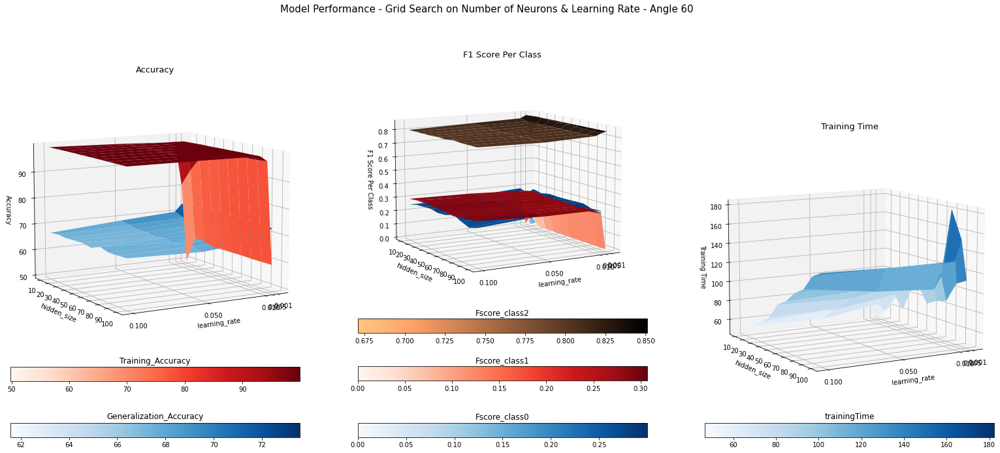

In [552]:
# Visualize influence of the Grid Search
learning_rate_Ls = [0.001 ,0.005,0.01,0.05,0.1] 
hidden_sizeLst = [10,20,30,40,50,60,70,80,90,100] 

gridX = learning_rate_Ls
gridY = hidden_sizeLst

gridXname = 'learning_rate'
gridYname = 'hidden_size'

cmapList = ['Blues','Reds','copper_r']

X, Y = np.meshgrid(np.array(gridX), np.array(gridY))
data = grid_search3_sum

fig3, ax3 = plt.subplots(figsize=(27,12),ncols=3,subplot_kw={"projection": "3d"},sharex=True)
metric = ['Accuracy','F1 Score Per Class','Training Time']

for i in range(3):
    if metric[i] == 'Accuracy':
        m = ['Generalization_Accuracy','Training_Accuracy']
    elif metric[i] =='F1 Score Per Class':
        m=['Fscore_class0','Fscore_class1','Fscore_class2']
    elif metric[i] =='Training Time':
        m=['trainingTime']
        
    for j in range(len(m)):
        
        Z = [[0]*len(X)]*len(Y) # Create empty matrix
        
        for w in range(len(Y)):
            Z[w] = data.loc[(data[gridYname] == gridY[w]),[m[j],gridXname]] \
            .sort_values(by=[gridXname],ascending=True)[m[j]]  # Fill up with request matrix
        
        Z = np.array(Z)
        vmin = Z.min()
        vmax = Z.max()
        surf = ax3[i].plot_surface(X,Y,Z,label=m[j],cmap=cmapList[j], antialiased=True, linewidth=10,vmin=vmin,vmax=vmax)
       
        cbar = fig3.colorbar(surf, ax=ax3[i],orientation='horizontal',pad=len(m)/500)
        cbar.ax.set_title(m[j])
    ax3[i].set_xlabel(gridXname)
    ax3[i].set_ylabel(gridYname)
    ax3[i].set_zlabel(metric[i])
    ax3[i].set_title(metric[i],fontsize=13)
    angles = 60
    ax3[i].view_init(10, angles)        
    ax3[i].set_xticks(gridX,minor=False)
    #ax3[i].set_xticklabels(labels =gridX,rotate=45)
    ax3[i].set_yticks(gridY,minor=False)

plt.suptitle('Model Performance - Grid Search on Number of Neurons & Learning Rate - Angle %d' %angles,fontsize=15)
plt.show()

fig3.savefig('chart/Grid_Search_hiddenSize_LearningRate_Angle%d.jpg' %angles)

In [557]:
grid_search3_sum[['ID','learning_rate','hidden_size','Generalization_Accuracy','Training_Accuracy','Fscore_class0','Fscore_class1','Fscore_class2','trainingTime']].sort_values(by=['Generalization_Accuracy','Fscore_class0','Fscore_class2'],ascending=False)

,ID,learning_rate,hidden_size,Generalization_Accuracy,Training_Accuracy,Fscore_class0,Fscore_class1,Fscore_class2,trainingTime
0,MLP_input2858_minC2_lr0.001_epoch300_hidden20_...,0.0010,20,73.571994,87.571673,0.292722,0.104873,0.850955,57.444304
0,MLP_input2858_minC2_lr0.001_epoch300_hidden30_...,0.0010,30,73.249310,92.910575,0.279385,0.188234,0.850026,78.914323
0,MLP_input2858_minC2_lr0.001_epoch300_hidden40_...,0.0010,40,73.120069,94.311752,0.292415,0.218576,0.848813,65.011038
0,MLP_input2858_minC2_lr0.001_epoch300_hidden10_...,0.0010,10,73.088019,80.968293,0.242333,0.016130,0.847468,46.762523
0,MLP_input2858_minC2_lr0.0001_epoch300_hidden20...,0.0001,20,72.765386,60.239225,0.032787,0.000000,0.842704,61.114198
0,MLP_input2858_minC2_lr0.0001_epoch300_hidden30...,0.0001,30,72.733128,59.851908,0.031746,0.000000,0.842483,81.334192
0,MLP_input2858_minC2_lr0.0001_epoch300_hidden40...,0.0001,40,72.733128,58.746915,0.000000,0.003279,0.842558,81.309159
0,MLP_input2858_minC2_lr0.0001_epoch300_hidden10...,0.0001,100,72.700870,58.910196,0.000000,0.000000,0.842086,112.576551
0,MLP_input2858_minC2_lr0.0001_epoch300_hidden50...,0.0001,50,72.700870,58.876021,0.000000,0.000000,0.841928,94.651720
0,MLP_input2858_minC2_lr0.0001_epoch300_hidden60...,0.0001,60,72.700870,58.860832,0.000000,0.000000,0.841928,76.746447


### Grid Search (4) Feature Extraction From Text (Max. Feature (Input Vector size) & Min. Count across data

max featuer = 1000 | min. document frequency = 2 | actual input size = 1000
Total training time:
26.604360103607178

Average Generalization Accuracy: 72.2490 %
Average Training Accuracy: 84.9060 %
Average F1 Score: 0: 0.283 | 1: 0.120 | 2: 0.846 




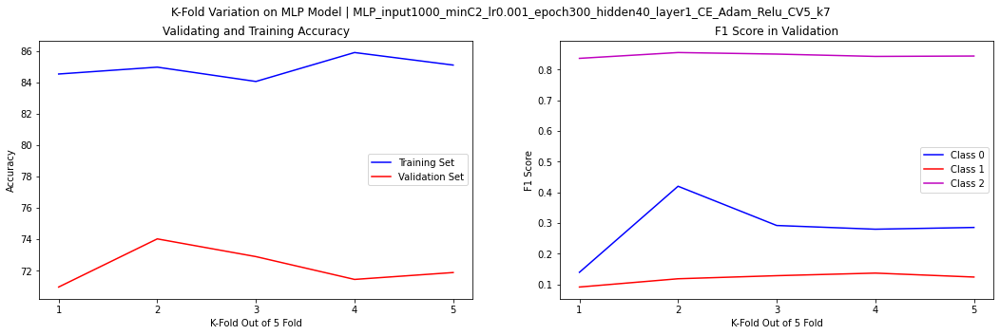

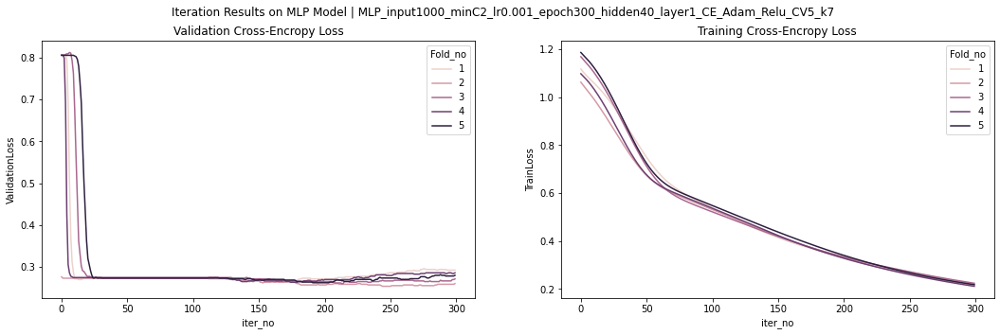

max featuer = 1000 | min. document frequency = 3 | actual input size = 1000
Total training time:
32.428539752960205

Average Generalization Accuracy: 71.9907 %
Average Training Accuracy: 86.6679 %
Average F1 Score: 0: 0.286 | 1: 0.139 | 2: 0.844 




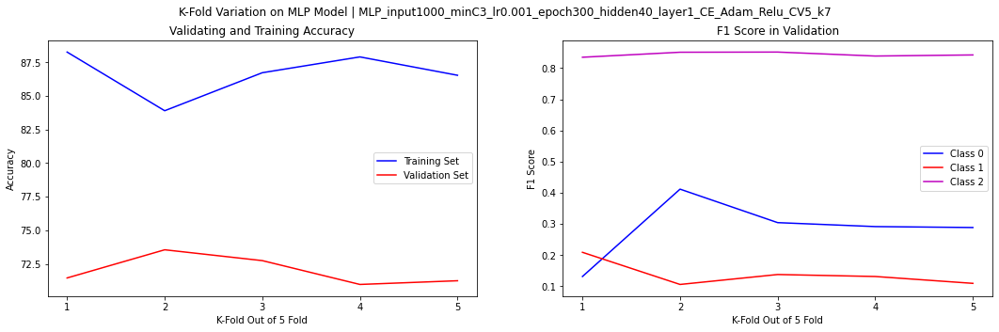

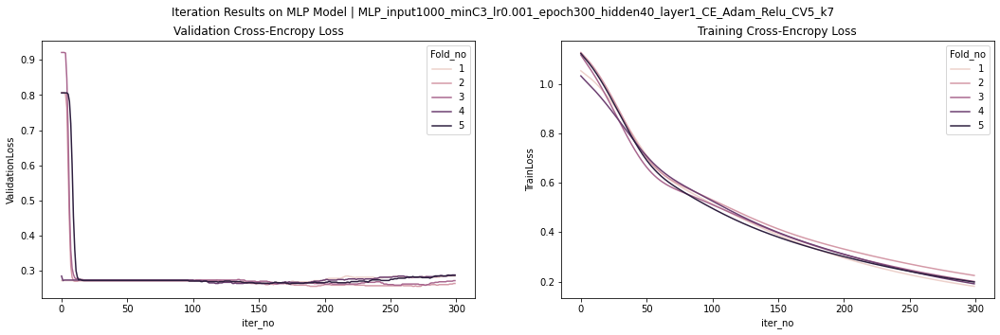

max featuer = 1000 | min. document frequency = 4 | actual input size = 1000
Total training time:
31.490504264831543

Average Generalization Accuracy: 72.1522 %
Average Training Accuracy: 84.7769 %
Average F1 Score: 0: 0.280 | 1: 0.125 | 2: 0.846 




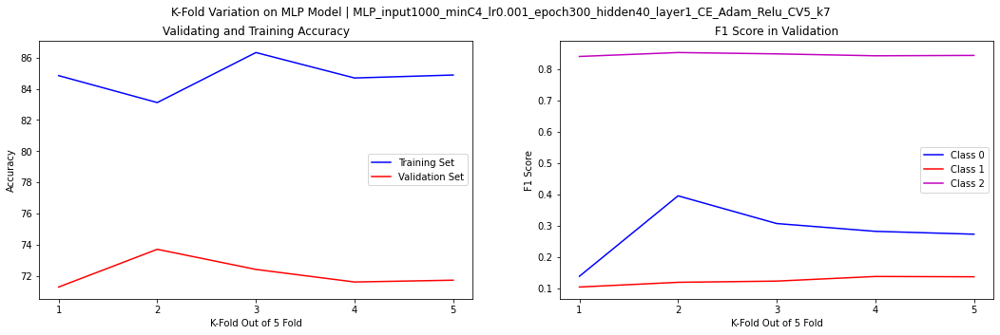

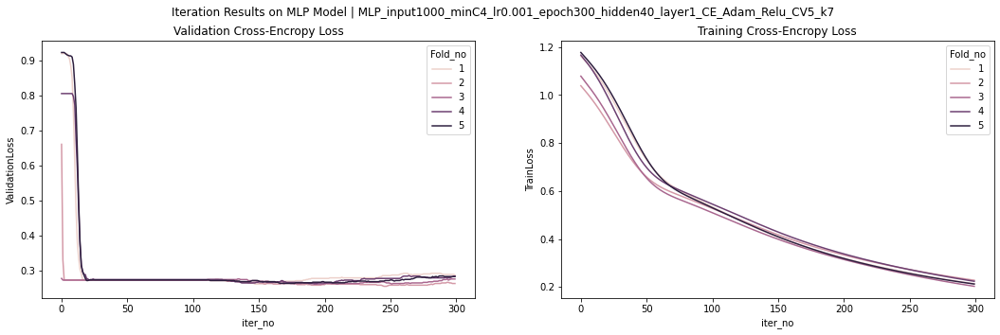

max featuer = 1000 | min. document frequency = 5 | actual input size = 1000
Total training time:
32.85278630256653

Average Generalization Accuracy: 72.4102 %
Average Training Accuracy: 86.1363 %
Average F1 Score: 0: 0.286 | 1: 0.133 | 2: 0.847 




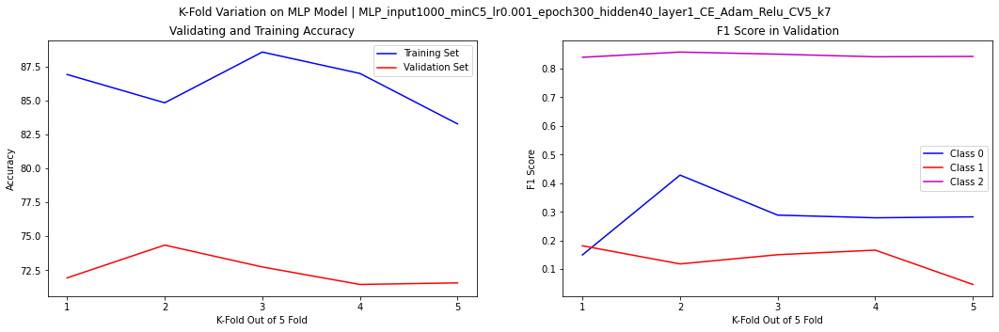

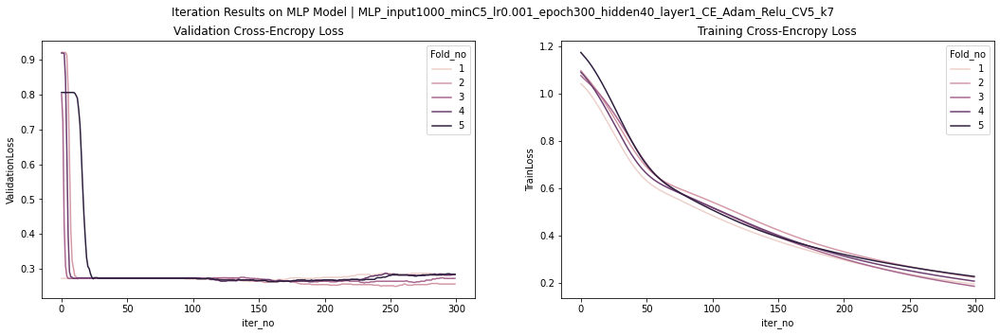

max featuer = 2000 | min. document frequency = 2 | actual input size = 2000
Total training time:
56.4259569644928

Average Generalization Accuracy: 72.5070 %
Average Training Accuracy: 91.6765 %
Average F1 Score: 0: 0.274 | 1: 0.193 | 2: 0.846 




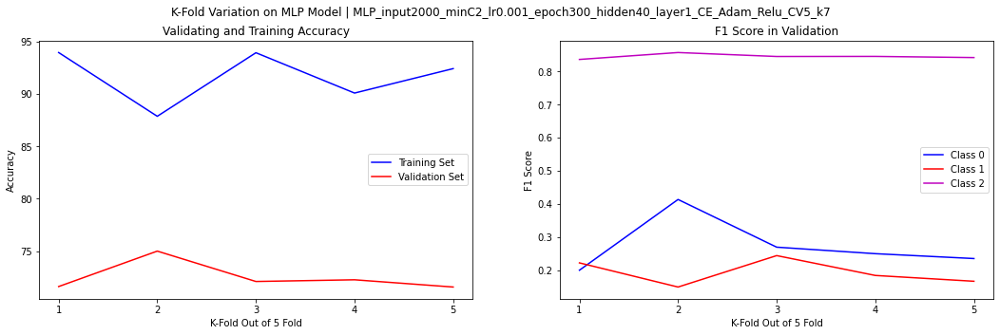

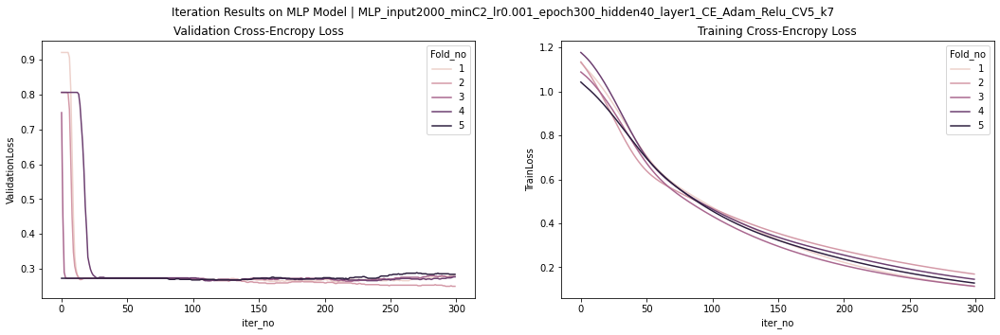

max featuer = 2000 | min. document frequency = 3 | actual input size = 2000
Total training time:
56.28664422035217

Average Generalization Accuracy: 72.6361 %
Average Training Accuracy: 92.3790 %
Average F1 Score: 0: 0.279 | 1: 0.210 | 2: 0.846 




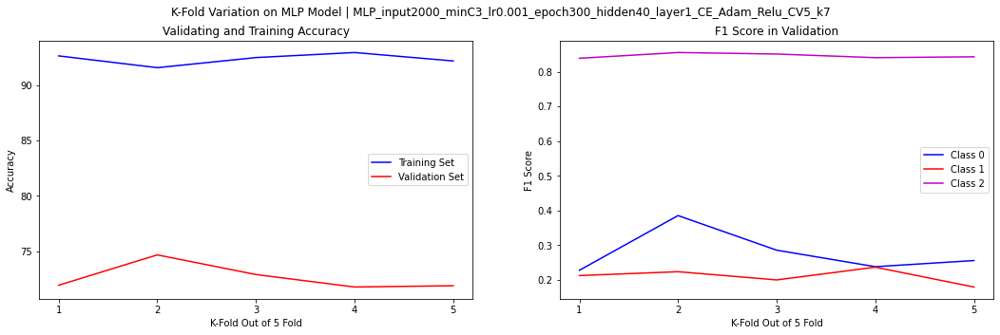

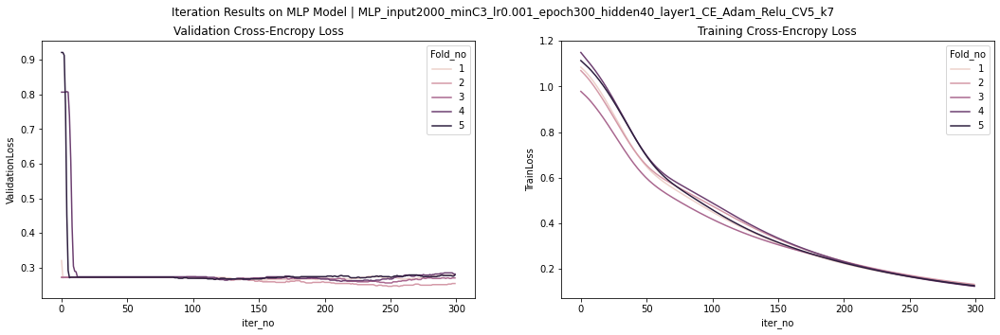

max featuer = 2000 | min. document frequency = 4 | actual input size = 2000
Total training time:
55.478397607803345

Average Generalization Accuracy: 72.7654 %
Average Training Accuracy: 92.2347 %
Average F1 Score: 0: 0.292 | 1: 0.215 | 2: 0.845 




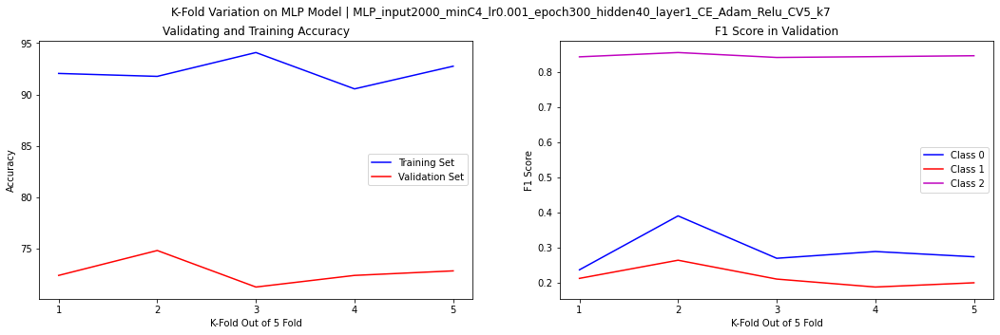

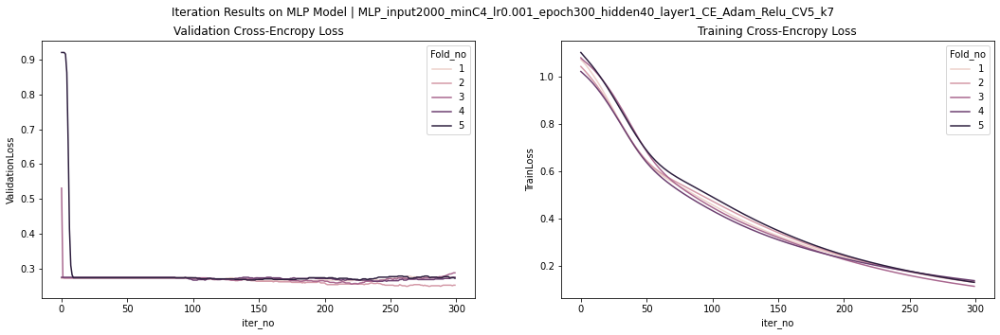

max featuer = 2000 | min. document frequency = 5 | actual input size = 2000
Total training time:
55.45598292350769

Average Generalization Accuracy: 72.9911 %
Average Training Accuracy: 92.6068 %
Average F1 Score: 0: 0.291 | 1: 0.231 | 2: 0.847 




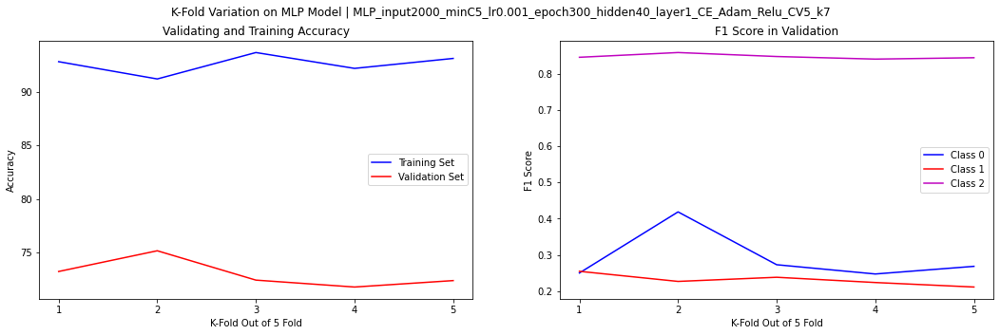

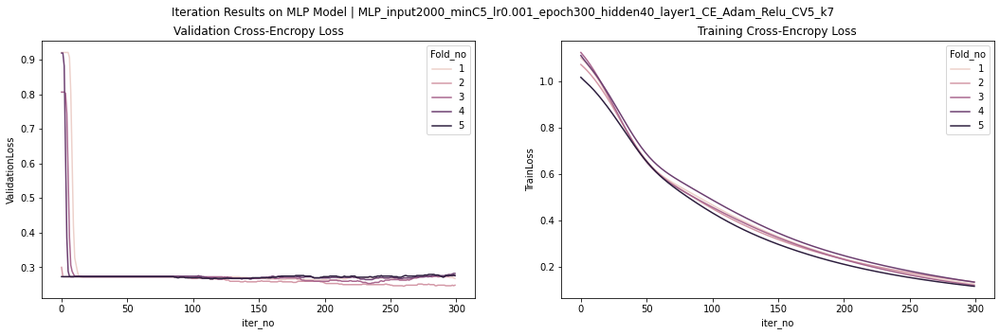

max featuer = 3000 | min. document frequency = 2 | actual input size = 3000
Total training time:
76.84967875480652

Average Generalization Accuracy: 72.6364 %
Average Training Accuracy: 95.8458 %
Average F1 Score: 0: 0.282 | 1: 0.219 | 2: 0.845 




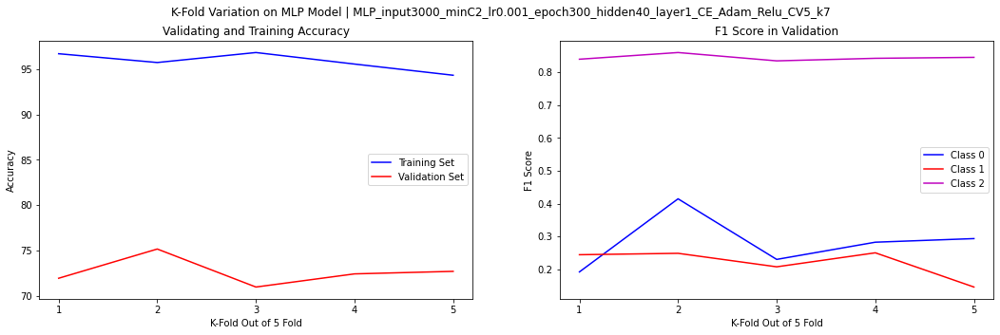

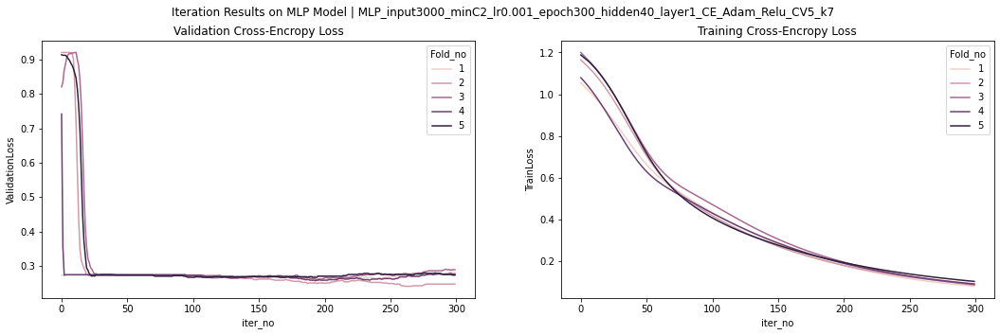

max featuer = 3000 | min. document frequency = 3 | actual input size = 3000
Total training time:
76.6993088722229

Average Generalization Accuracy: 73.1203 %
Average Training Accuracy: 95.6750 %
Average F1 Score: 0: 0.281 | 1: 0.233 | 2: 0.847 




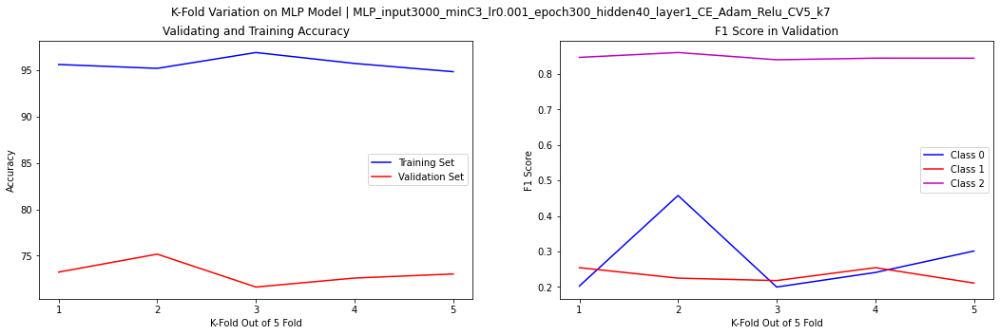

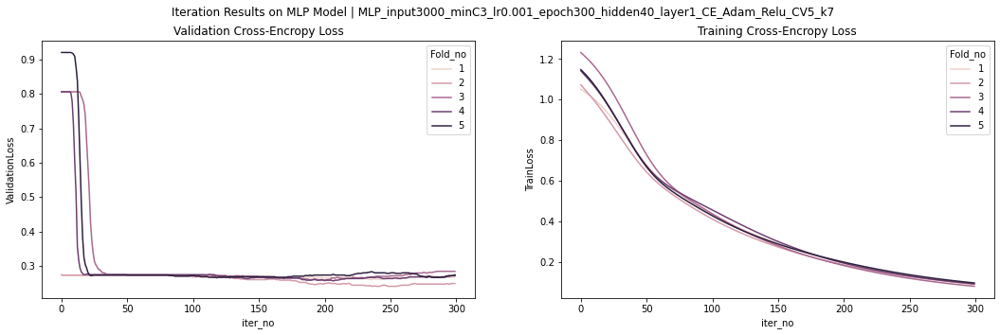

max featuer = 3000 | min. document frequency = 4 | actual input size = 2858
Total training time:
72.49724531173706

Average Generalization Accuracy: 72.1847 %
Average Training Accuracy: 95.6256 %
Average F1 Score: 0: 0.271 | 1: 0.214 | 2: 0.842 




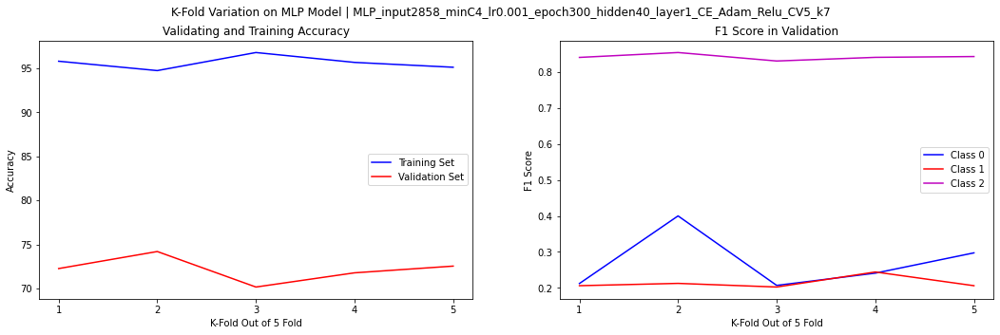

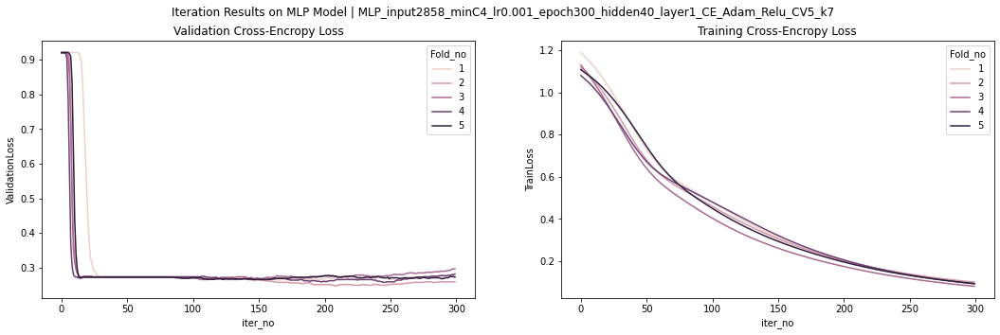

max featuer = 3000 | min. document frequency = 5 | actual input size = 2517
Total training time:
64.04411554336548

Average Generalization Accuracy: 72.8623 %
Average Training Accuracy: 94.2662 %
Average F1 Score: 0: 0.292 | 1: 0.226 | 2: 0.846 




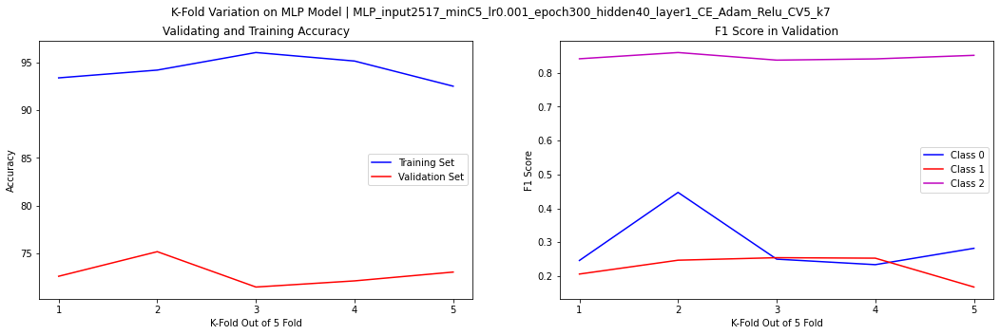

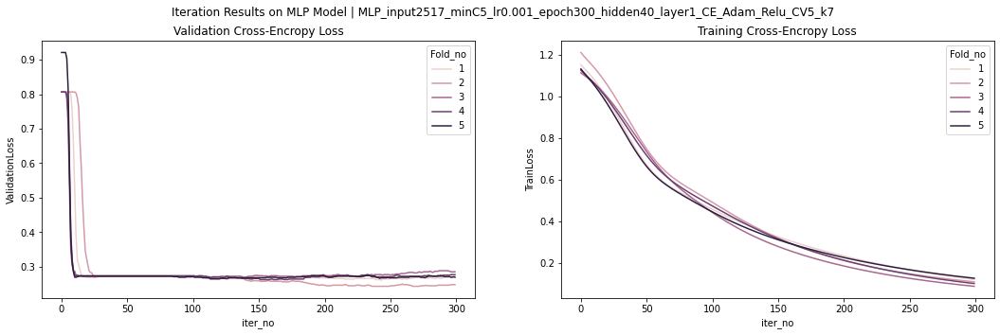

max featuer = 4000 | min. document frequency = 2 | actual input size = 4000
Total training time:
106.22783541679382

Average Generalization Accuracy: 72.6685 %
Average Training Accuracy: 97.1407 %
Average F1 Score: 0: 0.259 | 1: 0.212 | 2: 0.846 




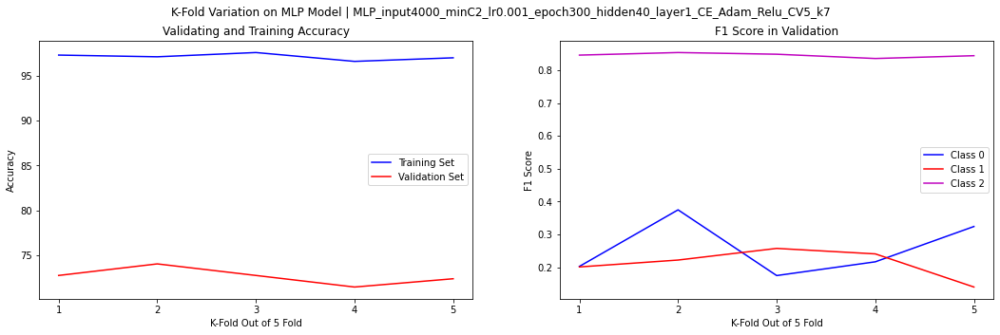

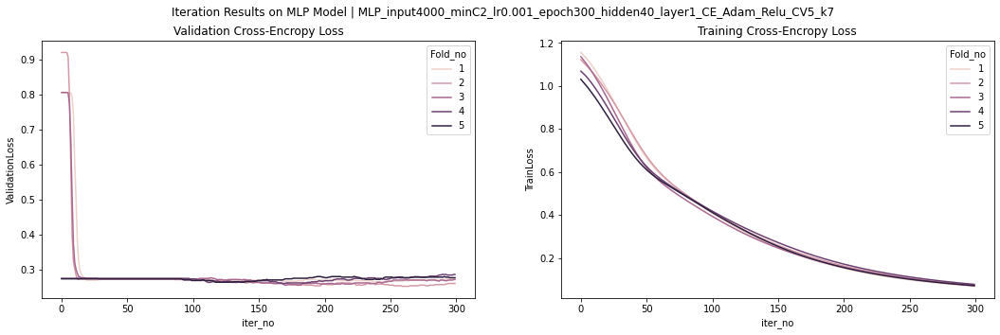

max featuer = 4000 | min. document frequency = 3 | actual input size = 3447
Total training time:
74.73872900009155

Average Generalization Accuracy: 72.8944 %
Average Training Accuracy: 96.5028 %
Average F1 Score: 0: 0.270 | 1: 0.230 | 2: 0.846 




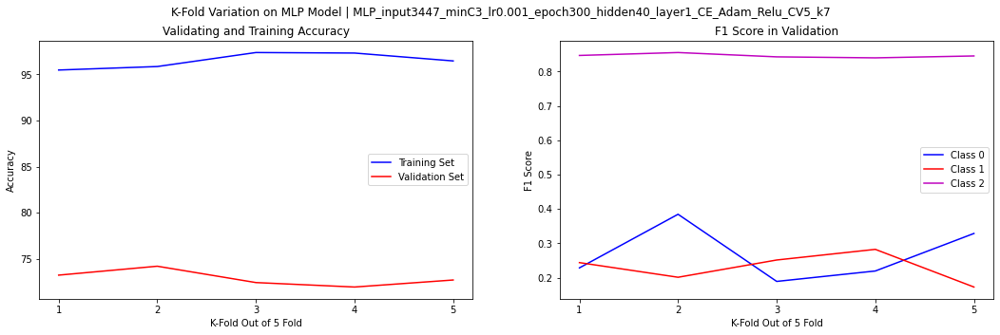

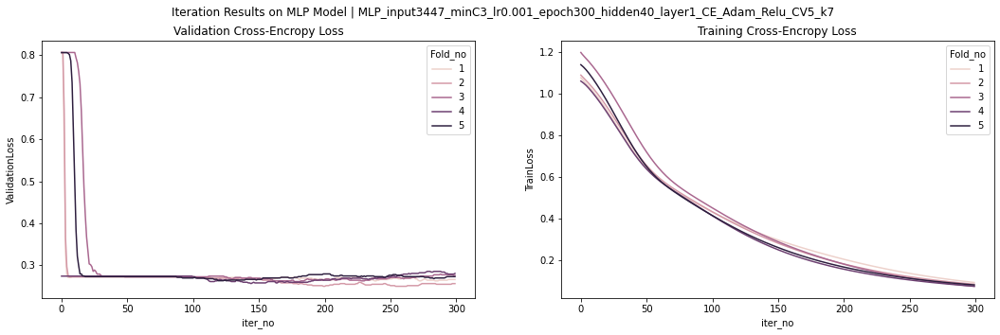

max featuer = 4000 | min. document frequency = 4 | actual input size = 2858
Total training time:
60.40011405944824

Average Generalization Accuracy: 72.6365 %
Average Training Accuracy: 95.5534 %
Average F1 Score: 0: 0.272 | 1: 0.229 | 2: 0.845 




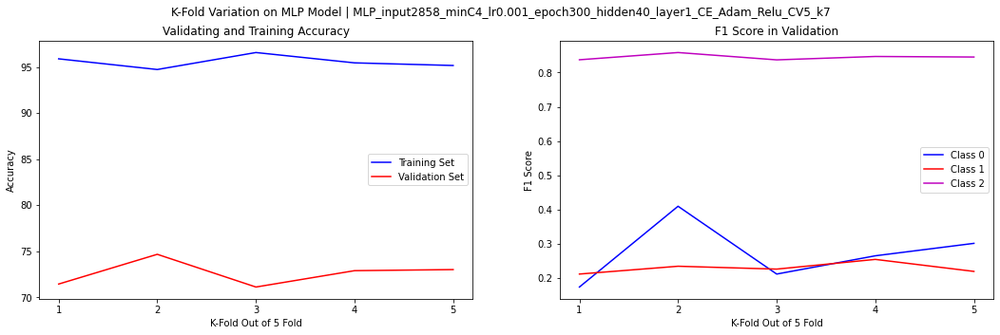

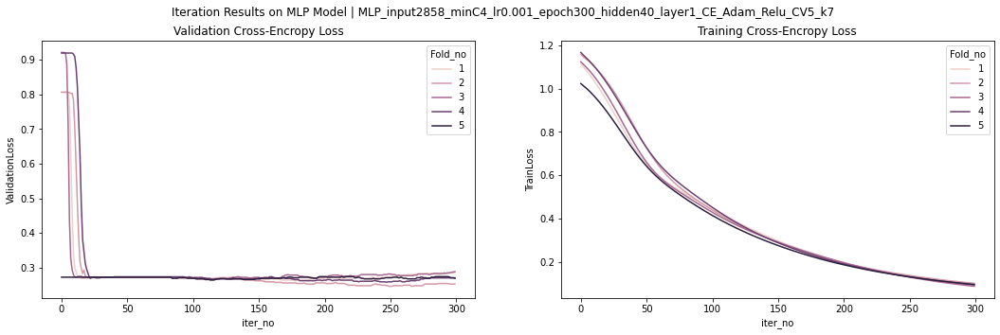

max featuer = 4000 | min. document frequency = 5 | actual input size = 2517
Total training time:
59.455246686935425

Average Generalization Accuracy: 72.9267 %
Average Training Accuracy: 94.4598 %
Average F1 Score: 0: 0.287 | 1: 0.226 | 2: 0.848 




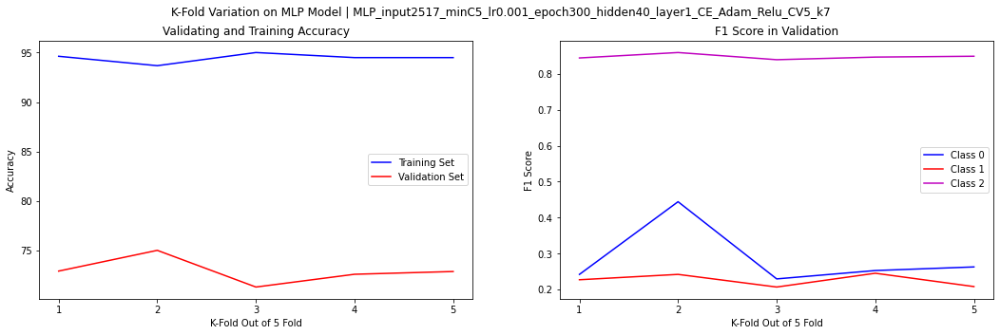

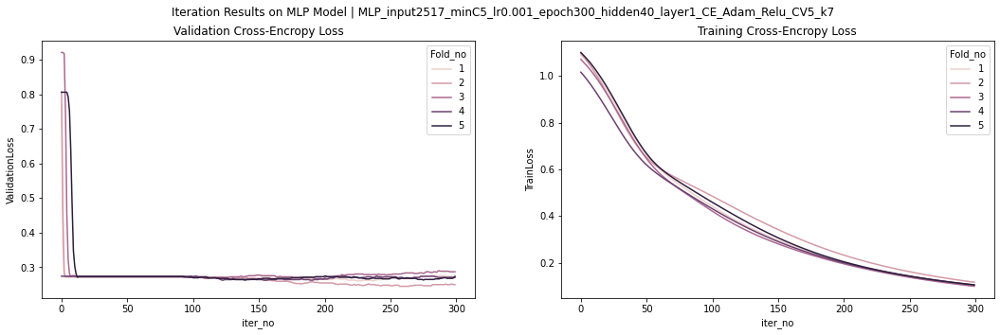

max featuer = None | min. document frequency = 2 | actual input size = 4636
Total training time:
100.92125821113586

Average Generalization Accuracy: 72.3455 %
Average Training Accuracy: 98.5267 %
Average F1 Score: 0: 0.272 | 1: 0.206 | 2: 0.843 




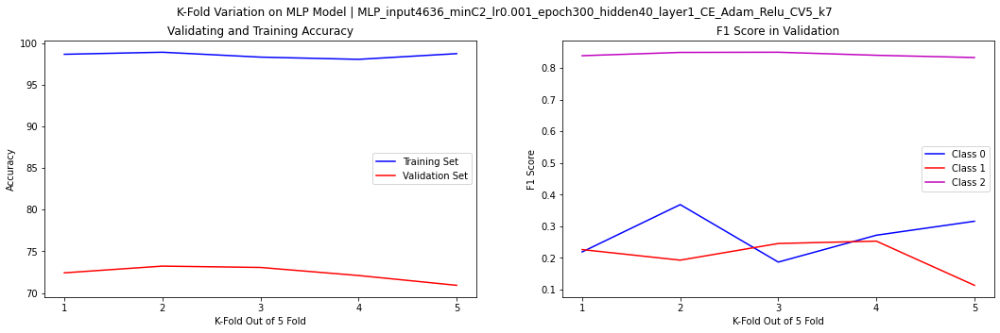

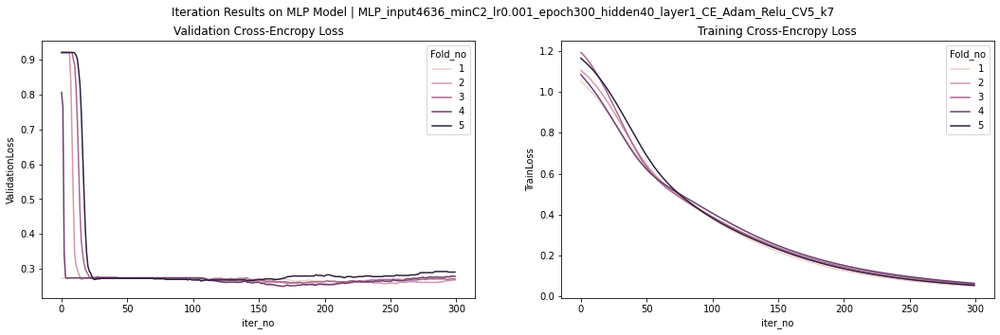

max featuer = None | min. document frequency = 3 | actual input size = 3447
Total training time:
99.1679904460907

Average Generalization Accuracy: 73.0879 %
Average Training Accuracy: 96.2104 %
Average F1 Score: 0: 0.291 | 1: 0.225 | 2: 0.847 




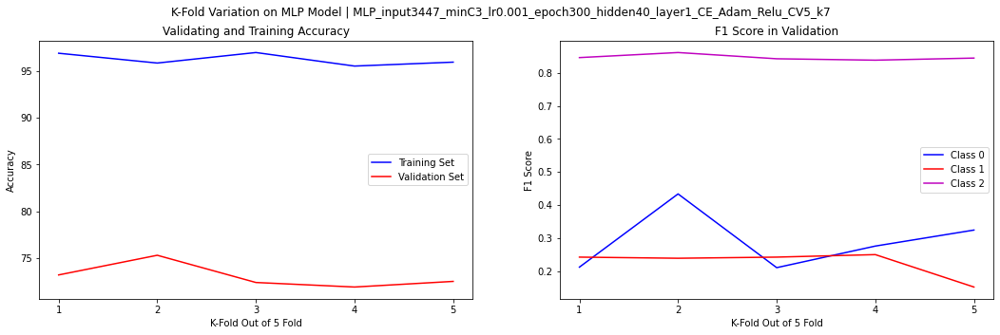

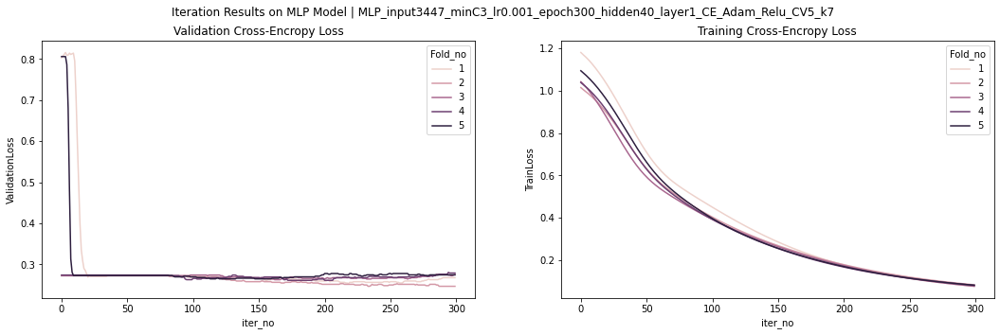

max featuer = None | min. document frequency = 4 | actual input size = 2858
Total training time:
78.8069908618927

Average Generalization Accuracy: 72.8624 %
Average Training Accuracy: 95.2611 %
Average F1 Score: 0: 0.286 | 1: 0.218 | 2: 0.845 




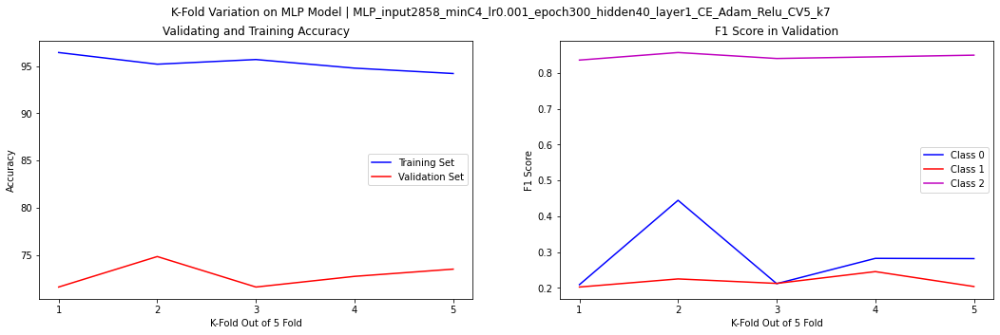

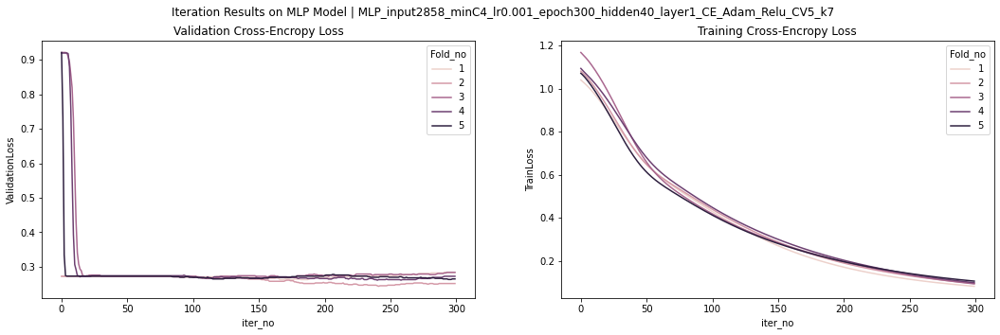

max featuer = None | min. document frequency = 5 | actual input size = 2517
Total training time:
68.89775133132935

Average Generalization Accuracy: 72.6686 %
Average Training Accuracy: 93.8181 %
Average F1 Score: 0: 0.274 | 1: 0.213 | 2: 0.846 




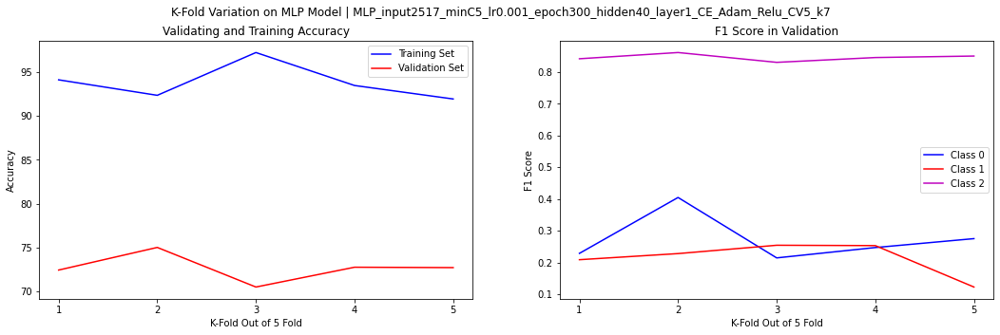

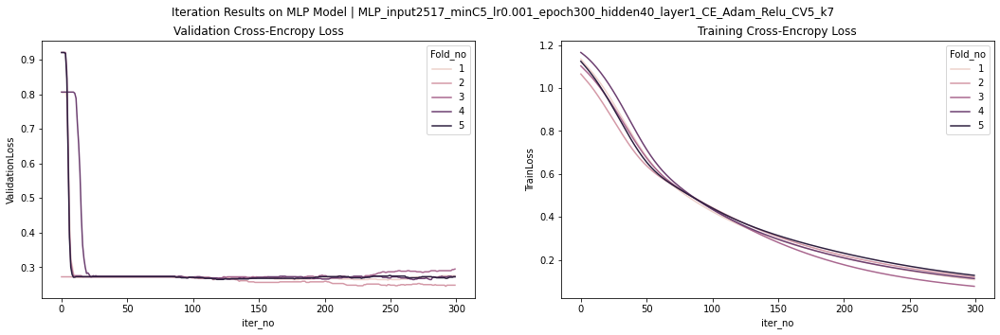

In [415]:
## Grid search 
max_list = [1000,2000,3000,4000, None] 
min_list = [2,3,4,5]

OptimizerName = 'Adam'
lossFunc = 'CE'
ActivationFunc1 = 'Relu'
ActivationFunc2 = None
layer = 1
learning_rate = 0.001
hidden_size = 40
early_stopping =-1
num_epochs = 300
k= 5
over_proportion_list=[0.4,0.3,1]
classes=[0,1,2]
# min_count = 2
SMOTE_bool=True
cv = 5
kFold = StratifiedKFold(n_splits=cv, shuffle=True, random_state=123)
CE_weight=True

grid_search4_sum = pd.DataFrame(columns=list(overview_training.columns))  
grid_search4_iter = pd.DataFrame(columns=list(iterResult.columns))  

for ml in max_list:
    for min_count in min_list:
        vectorizer = Train_Vectorizer(full_raw,'commentsReview','benefitsReview', max_feature=ml, min_count=min_count)
        df_train = text_preprocess(train_df_raw, vectorizer)
        input_size = df_train.shape[1]-1
        print('max featuer = %s | min. document frequency = %d | actual input size = %d' %(str(ml),min_count,input_size))
        sum_overview , sum_iter,_ = Train_MLP(df_train,layer, ActivationFunc1,OptimizerName,learning_rate, hidden_size, num_epochs, kFold,lossFunc, early_stopping,SMOTE,k,over_proportion_list,classes,min_count,ActivationFunc2,CE_weight)
        grid_search4_sum = pd.concat([grid_search4_sum,sum_overview],axis=0)
        grid_search4_iter = pd.concat([grid_search4_iter,sum_iter],axis=0)

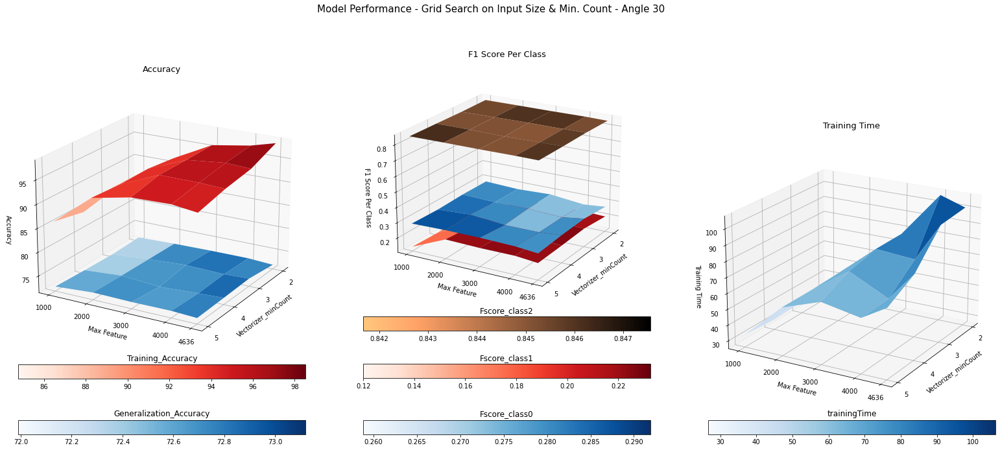

In [558]:
# Visualize influence of the Grid Search

graphdata = grid_search4_sum
graphdata['Max Feature'] = [1000]*4 + [2000]*4 + [3000]*4 +[4000]*4 +[4636]*4

input_size_Lst = [1000,2000,3000,4000,4636] 
min_count_Lst = [2,3,4,5] # 

gridX = min_count_Lst
gridY =  input_size_Lst

gridXname = 'Vectorizer_minCount'
gridYname = 'Max Feature'

cmapList = ['Blues','Reds','copper_r']

X, Y = np.meshgrid(np.array(gridX), np.array(gridY))


fig3, ax3 = plt.subplots(figsize=(27,12),ncols=3,subplot_kw={"projection": "3d"},sharex=True)
metric = ['Accuracy','F1 Score Per Class','Training Time']

for i in range(3):
    if metric[i] == 'Accuracy':
        m = ['Generalization_Accuracy','Training_Accuracy']
    elif metric[i] =='F1 Score Per Class':
        m=['Fscore_class0','Fscore_class1','Fscore_class2']
    elif metric[i] =='Training Time':
        m=['trainingTime']
        
    for j in range(len(m)):
        
        Z = [[0]*len(X)]*len(Y) # Create empty matrix
        
        for w in range(len(Y)):
            Z[w] = graphdata.loc[(graphdata[gridYname] == gridY[w]),[m[j],gridXname]] \
            .sort_values(by=[gridXname],ascending=True)[m[j]]  # Fill up with request matrix
        
        Z = np.array(Z)
        vmin = Z.min()
        vmax = Z.max()
        surf = ax3[i].plot_surface(X,Y,Z,label=m[j],cmap=cmapList[j], antialiased=True, linewidth=10,vmin=vmin,vmax=vmax)
       
        cbar = fig3.colorbar(surf, ax=ax3[i],orientation='horizontal',pad=len(m)/500)
        cbar.ax.set_title(m[j])
    ax3[i].set_xlabel(gridXname)
    ax3[i].set_ylabel(gridYname)
    ax3[i].set_zlabel(metric[i])
    ax3[i].set_title(metric[i],fontsize=13)
    angles = 30
    ax3[i].view_init(20, angles)        
    ax3[i].set_xticks(gridX,minor=False)
    #ax3[i].set_xticklabels(labels =gridX,rotate=45)
    ax3[i].set_yticks(gridY,minor=False)

plt.suptitle('Model Performance - Grid Search on Input Size & Min. Count - Angle %d' %angles,fontsize=15)
plt.show()

fig3.savefig('chart/Grid_Search_MinCount_InputSize_Angle%d.jpg' %angles)

In [418]:
graphdata.loc[: ,['ID','Vectorizer_minCount','Max Feature' ,'Generalization_Accuracy','Training_Accuracy','Fscore_class0','Fscore_class1','Fscore_class2']].sort_values(by=['Generalization_Accuracy','Fscore_class2','Fscore_class0'],ascending=False)

,ID,Vectorizer_minCount,Max Feature,Generalization_Accuracy,Training_Accuracy,Fscore_class0,Fscore_class1,Fscore_class2
0,MLP_input3000_minC3_lr0.001_epoch300_hidden40_...,3,3000,73.120329,95.674957,0.280613,0.232691,0.847416
0,MLP_input3447_minC3_lr0.001_epoch300_hidden40_...,3,4636,73.087915,96.210366,0.291314,0.225148,0.846892
0,MLP_input2000_minC5_lr0.001_epoch300_hidden40_...,5,2000,72.991089,92.606797,0.291363,0.230818,0.847243
0,MLP_input2517_minC5_lr0.001_epoch300_hidden40_...,5,4000,72.926729,94.459844,0.286615,0.226298,0.847558
0,MLP_input3447_minC3_lr0.001_epoch300_hidden40_...,3,4000,72.894419,96.502753,0.270131,0.230397,0.846124
0,MLP_input2858_minC4_lr0.001_epoch300_hidden40_...,4,4636,72.862421,95.261059,0.285841,0.217820,0.845428
0,MLP_input2517_minC5_lr0.001_epoch300_hidden40_...,5,3000,72.862265,94.266186,0.291806,0.225585,0.846438
0,MLP_input2000_minC4_lr0.001_epoch300_hidden40_...,4,2000,72.765439,92.234669,0.291922,0.215019,0.845446
0,MLP_input2517_minC5_lr0.001_epoch300_hidden40_...,5,4636,72.668612,93.818113,0.273907,0.213208,0.846232
0,MLP_input4000_minC2_lr0.001_epoch300_hidden40_...,2,4000,72.668508,97.140687,0.258818,0.212448,0.845543


### Short Summary
- Computing time for training increase with the number of features (max. input size), and relatively independent of min_count.
- In terms of accuracy and F1 score, both metric improve with the increase of input features, and fit best with min_count = 2-3. Grid search perform well in either min_count = 4/5, word feature = 4000/4636, or min_count = 2, word featuer = 4000

- both accuracy and F1 score are maximized at min_count = 2, max feature = 4000.
- Checking the validation variation, the accuracy is quite stable across folds, but F1 score of class 0/1 varies within +-0.07. 
- Since we target to include more input features, instead of using a stabler parameter combinations with lower input size and higher min_count, plus the validation variation in accuracy remains stable, I accept it as a trade off

#### Data Structure of Textual Data

In [419]:
# Understand the data structure based on the pre-processed text data

min_count =3
max_feature = 3000

vectorizer = Train_Vectorizer(full_raw,'commentsReview','benefitsReview', max_feature=input_size, min_count=min_count)
feature = vectorizer.get_feature_names()

#Calculate the TF-IDF score of training data
df = text_preprocess(train_df_raw,vectorizer,'effectiveness','commentsReview','benefitsReview')

In [420]:
df

,abate,abdomen,abdominal,ability,able,abovei,abscess,absolute,absolutely,absorb,...,yes,yet,yoga,yogurt,young,yr,zero,zombie,zone,effectiveness_ordinal
0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
1,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
2,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
3,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,0.0,0.0,0.0,0.0,0.000000,0.654918,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3094,0.0,0.0,0.0,0.0,0.214205,0.000000,0.0,0.0,0.0,0.289795,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
3095,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3096,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3097,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2


In [421]:
# Check correlation
corr = df.corr()
corr_target = corr[['effectiveness_ordinal']].fillna(0)

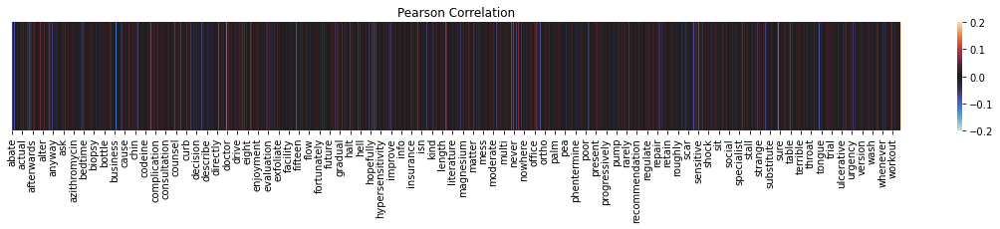

In [422]:
fig6, ax6 = plt.subplots(figsize = (20,2))
sns.heatmap(data = corr_target.T,cbar = True,center=0, vmin=-0.2,vmax=0.2,ax=ax6,yticklabels=False)
plt.title('Pearson Correlation') # observe linearity among data
fig6.savefig('chart/data_structure_corr.jpg')

Text(0.5, 1.0, 'Pearson Correlation')

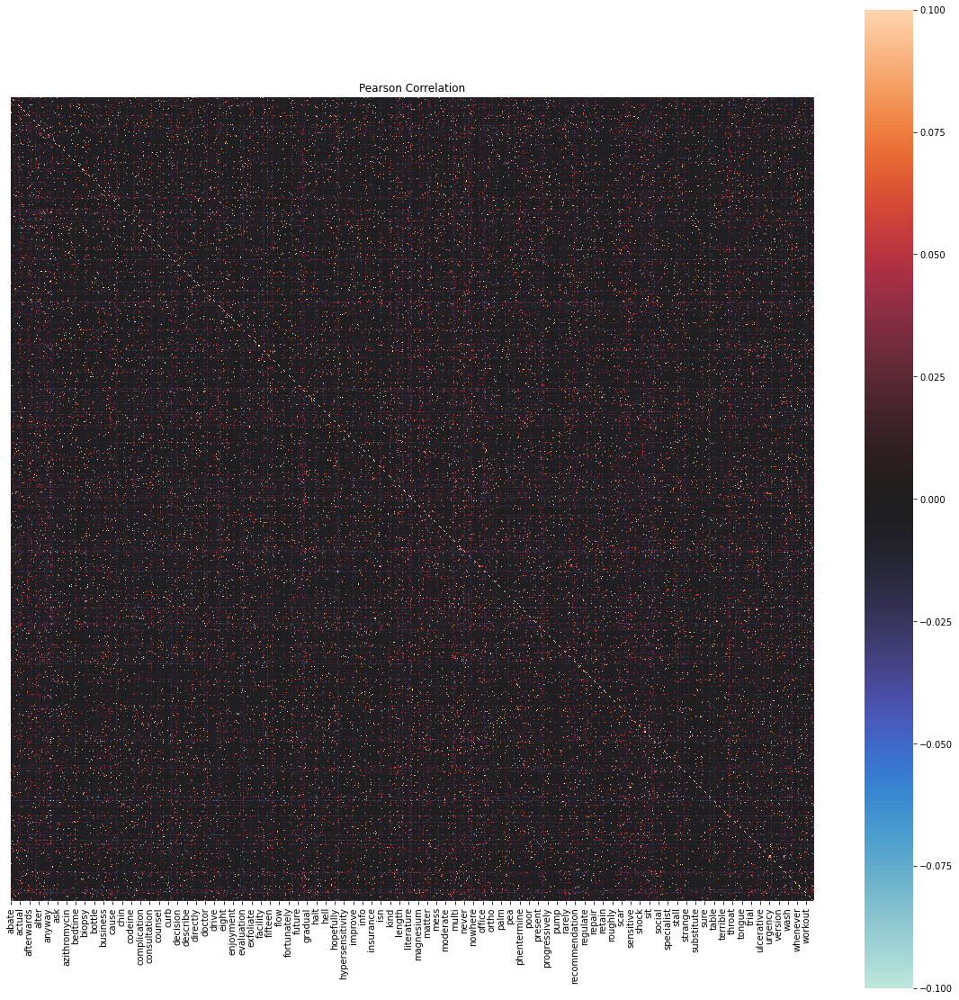

In [423]:
fig6, ax6 = plt.subplots(figsize = (20,20))
sns.heatmap(data = corr ,cbar = True,center=0, vmin=-0.1,vmax=0.1,ax=ax6,yticklabels=False,square=True)
plt.title('Pearson Correlation') # observe linearity among data

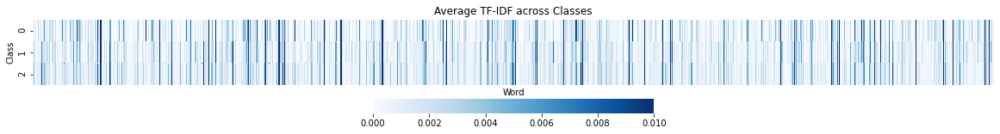

In [424]:
# Check distribution
group_df = df.groupby('effectiveness_ordinal').mean().reset_index()
fig7, ax7 = plt.subplots(figsize = (20,2))
s=sns.heatmap(data = group_df,cbar = True,ax=ax7,cmap='Blues',vmax=0.01,xticklabels=False,cbar_kws={"orientation": "horizontal"})
plt.title('Average TF-IDF across Classes')
ax7.set_xticklabels('',minor=False)
ax7.set_xlabel('Word')
ax7.set_ylabel('Class')
fig7.savefig('chart/data_structure_classMean.jpg')

### Early Stopping Criteria

max early stopping = 1 | iterative times = 0
-----early-stopping implemented, iterations stopped at 10 | training loss 1.00 | val. loss 0.27 ------
-----early-stopping implemented, iterations stopped at 127 | training loss 0.35 | val. loss 0.26 ------
-----early-stopping implemented, iterations stopped at 93 | training loss 0.43 | val. loss 0.27 ------
-----early-stopping implemented, iterations stopped at 5 | training loss 1.07 | val. loss 0.27 ------
-----early-stopping implemented, iterations stopped at 109 | training loss 0.41 | val. loss 0.27 ------
Total training time:
19.629636764526367

Average Generalization Accuracy: 72.9590 %
Average Training Accuracy: 64.9942 %
Average F1 Score: 0: 0.076 | 1: 0.000 | 2: 0.844 




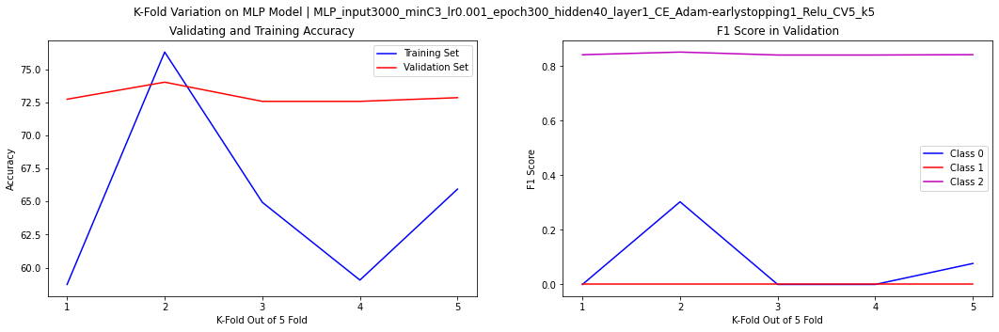

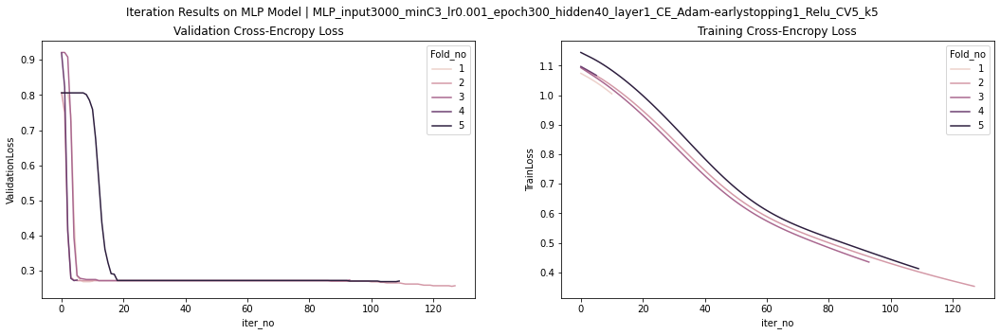

max early stopping = 2 | iterative times = 0
-----early-stopping implemented, iterations stopped at 151 | training loss 0.27 | val. loss 0.27 ------
-----early-stopping implemented, iterations stopped at 159 | training loss 0.27 | val. loss 0.25 ------
-----early-stopping implemented, iterations stopped at 178 | training loss 0.21 | val. loss 0.26 ------
-----early-stopping implemented, iterations stopped at 219 | training loss 0.16 | val. loss 0.26 ------
-----early-stopping implemented, iterations stopped at 275 | training loss 0.12 | val. loss 0.28 ------
Total training time:
39.02818703651428

Average Generalization Accuracy: 73.1844 %
Average Training Accuracy: 86.2767 %
Average F1 Score: 0: 0.285 | 1: 0.087 | 2: 0.848 




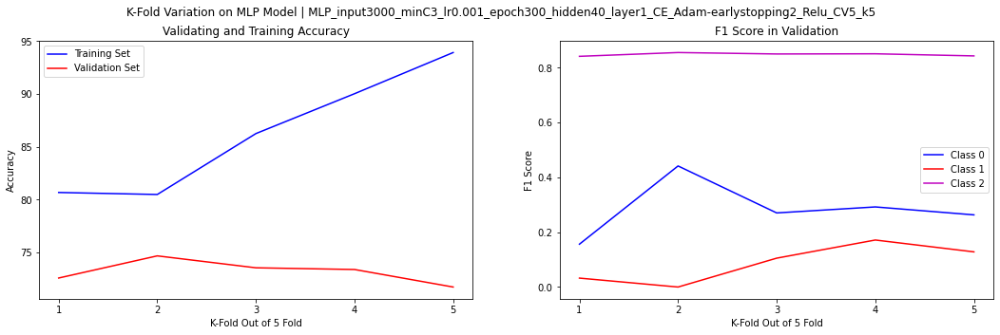

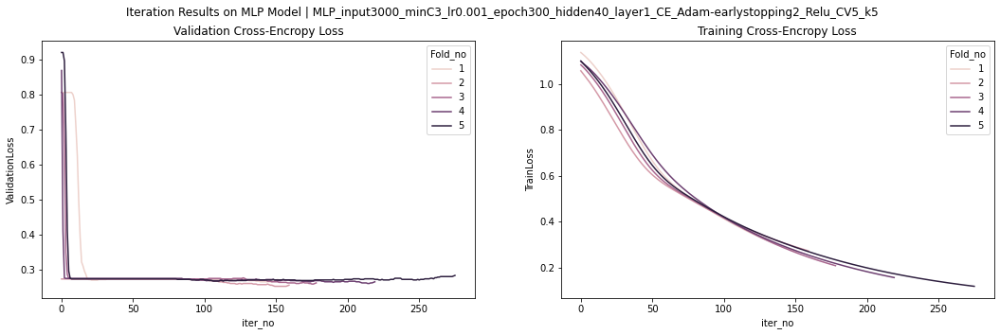

max early stopping = 3 | iterative times = 0
-----early-stopping implemented, iterations stopped at 257 | training loss 0.12 | val. loss 0.28 ------
-----early-stopping implemented, iterations stopped at 191 | training loss 0.21 | val. loss 0.27 ------
Total training time:
54.976075410842896

Average Generalization Accuracy: 72.9910 %
Average Training Accuracy: 93.5681 %
Average F1 Score: 0: 0.283 | 1: 0.175 | 2: 0.848 




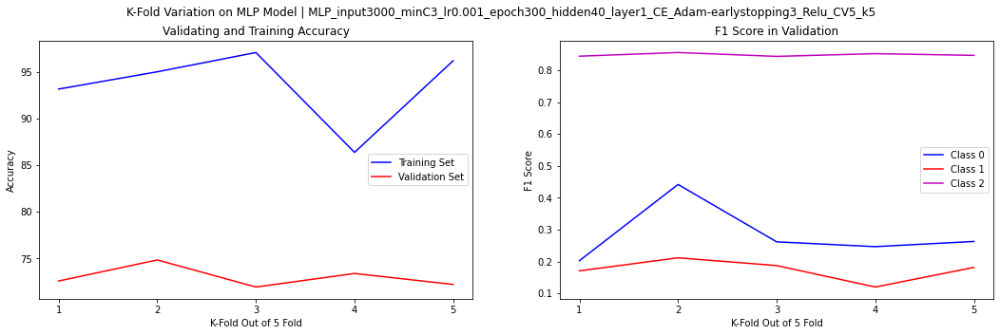

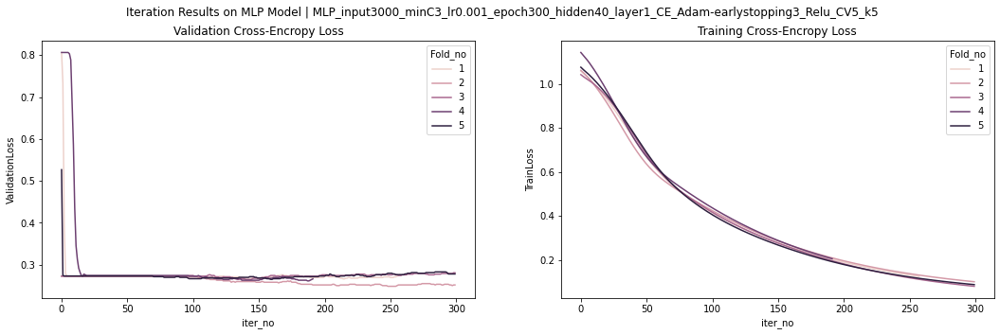

max early stopping = 4 | iterative times = 0
Total training time:
58.60825204849243

Average Generalization Accuracy: 72.7973 %
Average Training Accuracy: 95.5003 %
Average F1 Score: 0: 0.268 | 1: 0.215 | 2: 0.847 




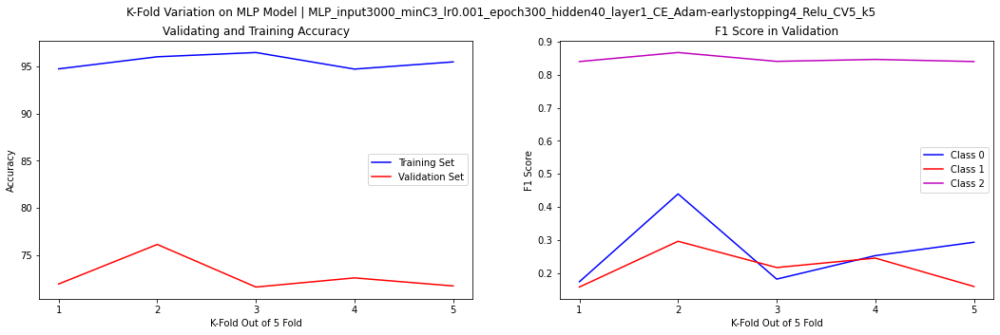

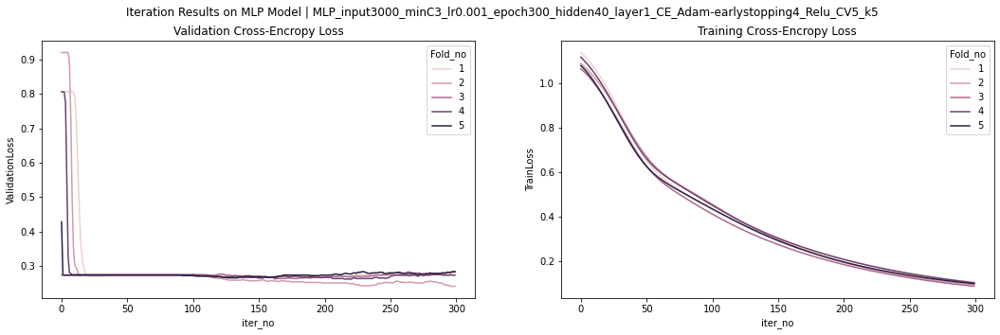

max early stopping = 5 | iterative times = 0
Total training time:
62.11046361923218

Average Generalization Accuracy: 72.5070 %
Average Training Accuracy: 96.0699 %
Average F1 Score: 0: 0.267 | 1: 0.212 | 2: 0.845 




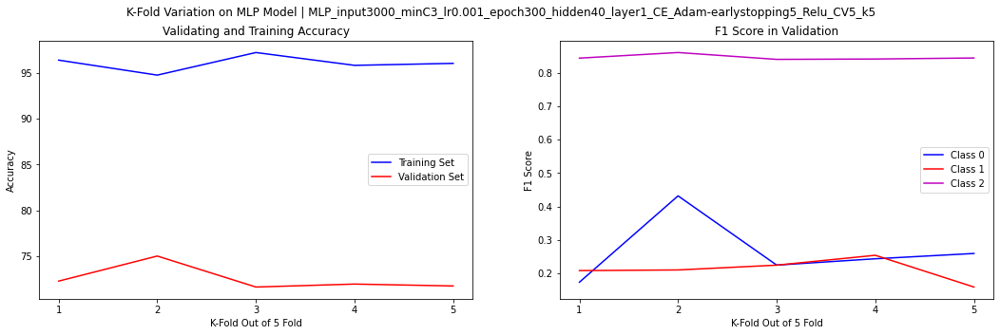

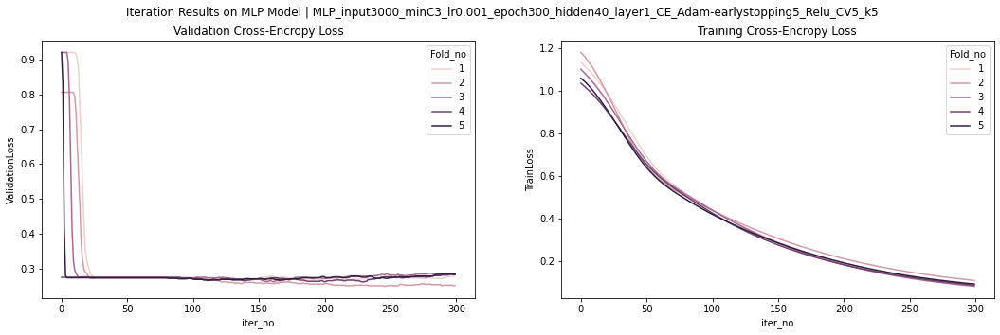

max early stopping = 6 | iterative times = 0
Total training time:
54.56070327758789

Average Generalization Accuracy: 72.6362 %
Average Training Accuracy: 96.0178 %
Average F1 Score: 0: 0.273 | 1: 0.216 | 2: 0.846 




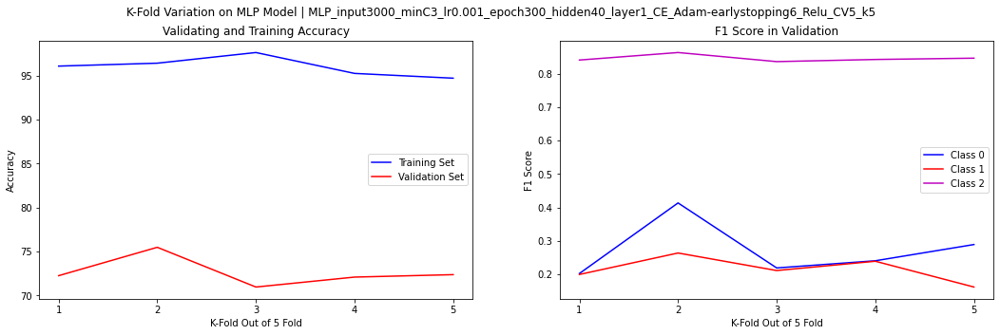

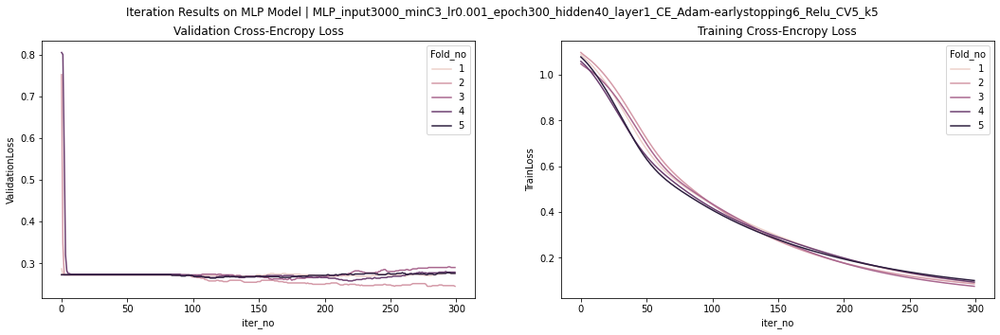

max early stopping = 7 | iterative times = 0
Total training time:
57.90227222442627

Average Generalization Accuracy: 72.7008 %
Average Training Accuracy: 95.3434 %
Average F1 Score: 0: 0.286 | 1: 0.221 | 2: 0.845 




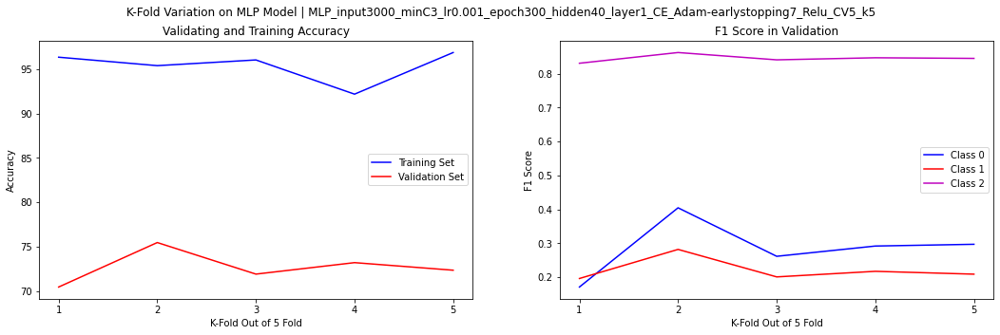

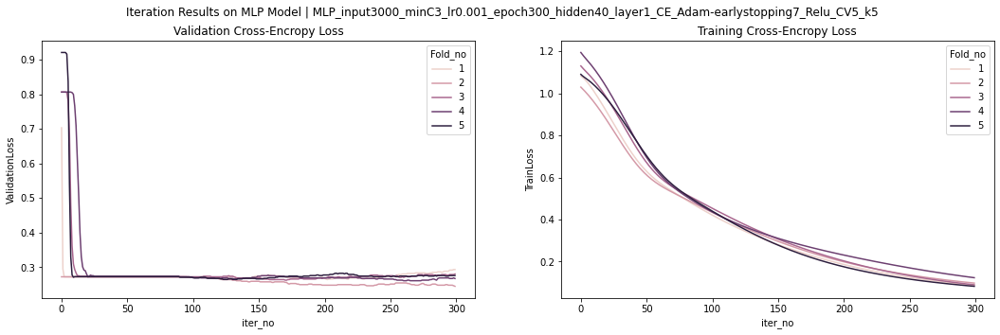

max early stopping = 8 | iterative times = 0
-----early-stopping implemented, iterations stopped at 10 | training loss 1.16 | val. loss 0.84 ------
Total training time:
53.91096258163452

Average Generalization Accuracy: 60.4428 %
Average Training Accuracy: 82.9582 %
Average F1 Score: 0: 0.222 | 1: 0.211 | 2: 0.673 




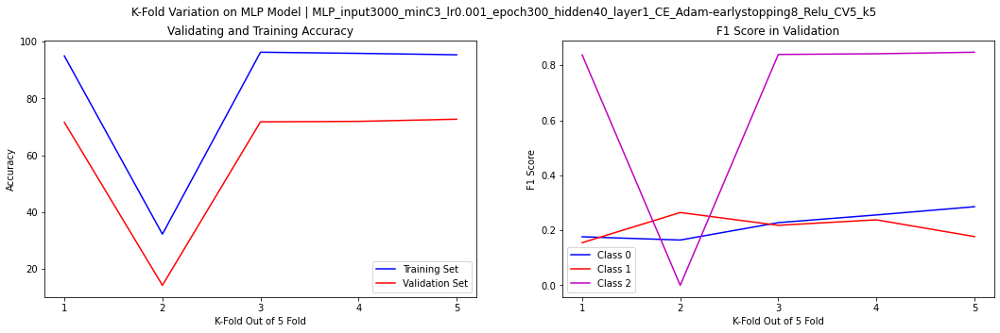

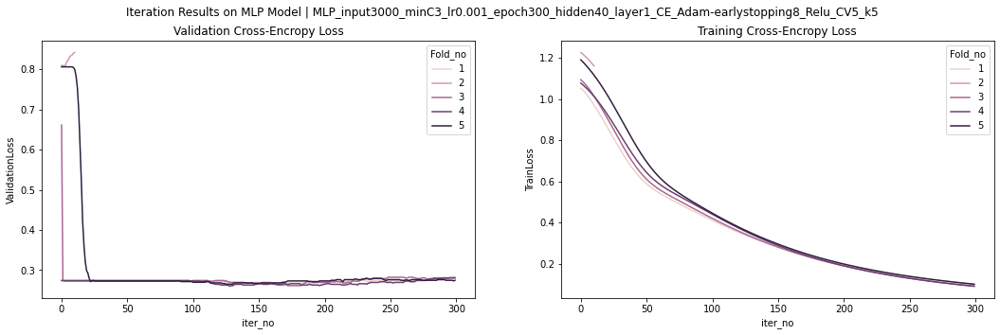

max early stopping = 9 | iterative times = 0
Total training time:
60.30272817611694

Average Generalization Accuracy: 72.3782 %
Average Training Accuracy: 96.1981 %
Average F1 Score: 0: 0.269 | 1: 0.225 | 2: 0.843 




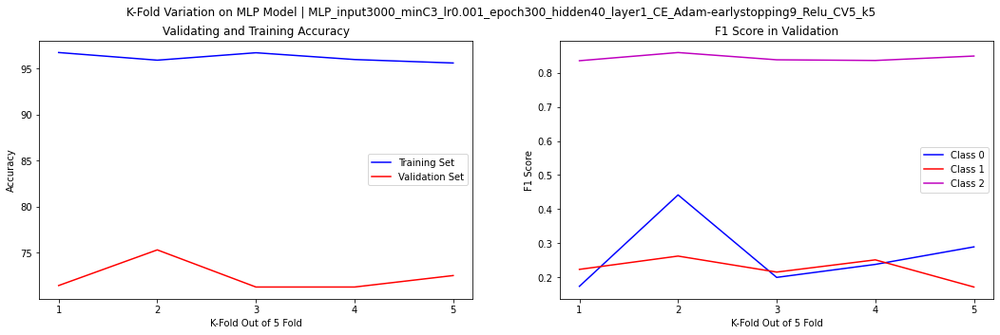

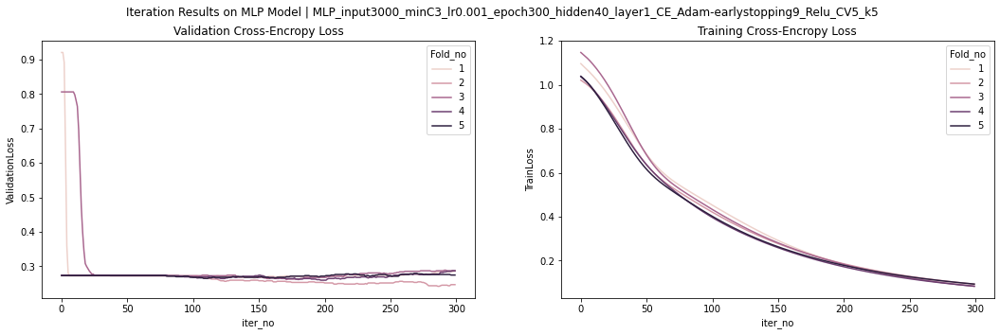

max early stopping = 1 | iterative times = 1
-----early-stopping implemented, iterations stopped at 24 | training loss 0.96 | val. loss 0.27 ------
-----early-stopping implemented, iterations stopped at 11 | training loss 1.00 | val. loss 0.27 ------
-----early-stopping implemented, iterations stopped at 98 | training loss 0.43 | val. loss 0.27 ------
-----early-stopping implemented, iterations stopped at 20 | training loss 0.98 | val. loss 0.27 ------
-----early-stopping implemented, iterations stopped at 7 | training loss 1.02 | val. loss 0.27 ------
Total training time:
13.862876892089844

Average Generalization Accuracy: 72.7008 %
Average Training Accuracy: 60.3809 %
Average F1 Score: 0: 0.000 | 1: 0.007 | 2: 0.842 




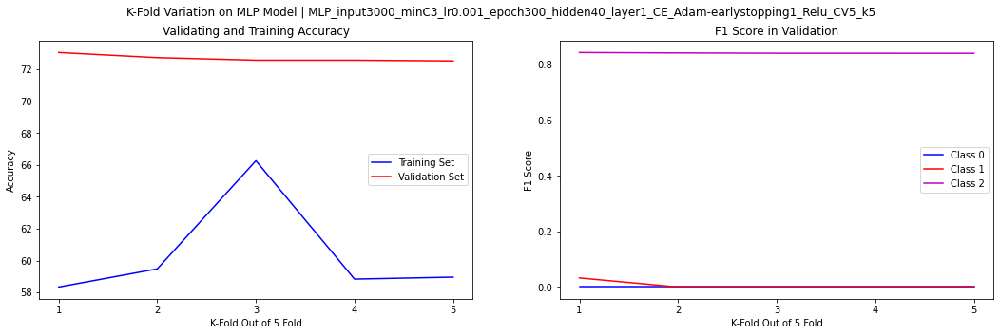

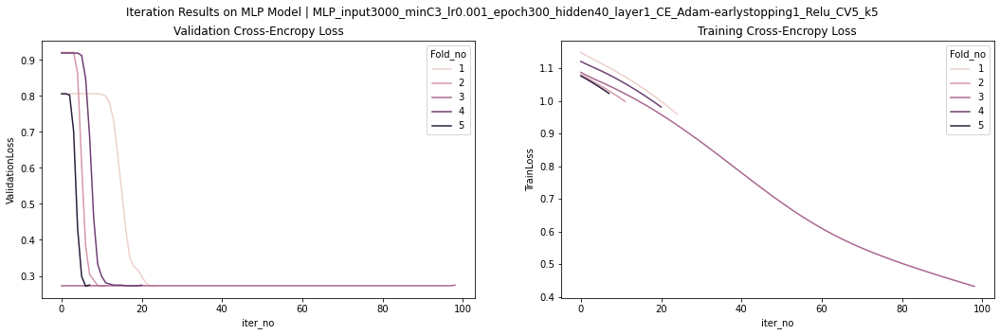

max early stopping = 2 | iterative times = 1
-----early-stopping implemented, iterations stopped at 148 | training loss 0.28 | val. loss 0.27 ------
-----early-stopping implemented, iterations stopped at 237 | training loss 0.14 | val. loss 0.25 ------
-----early-stopping implemented, iterations stopped at 169 | training loss 0.23 | val. loss 0.26 ------
-----early-stopping implemented, iterations stopped at 143 | training loss 0.29 | val. loss 0.27 ------
-----early-stopping implemented, iterations stopped at 136 | training loss 0.33 | val. loss 0.27 ------
Total training time:
36.02606987953186

Average Generalization Accuracy: 73.5720 %
Average Training Accuracy: 82.3010 %
Average F1 Score: 0: 0.251 | 1: 0.063 | 2: 0.850 




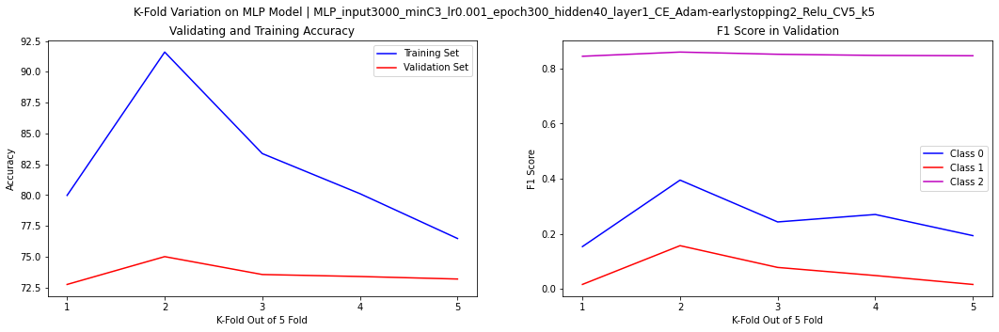

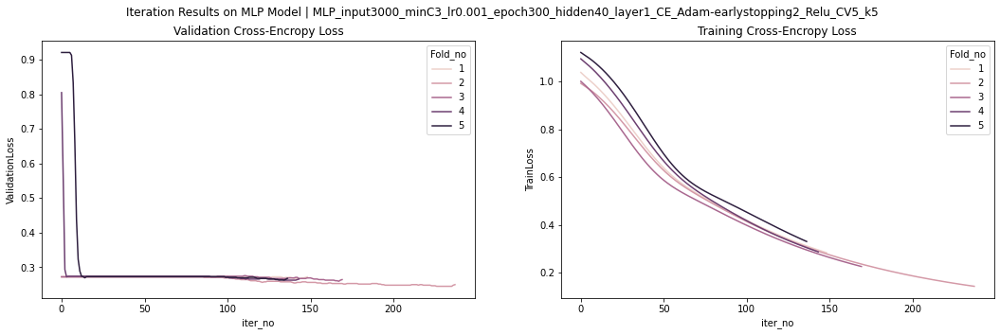

max early stopping = 3 | iterative times = 1
-----early-stopping implemented, iterations stopped at 257 | training loss 0.12 | val. loss 0.28 ------
-----early-stopping implemented, iterations stopped at 3 | training loss 1.17 | val. loss 0.90 ------
Total training time:
52.72941040992737

Average Generalization Accuracy: 60.1643 %
Average Training Accuracy: 81.0691 %
Average F1 Score: 0: 0.261 | 1: 0.183 | 2: 0.677 




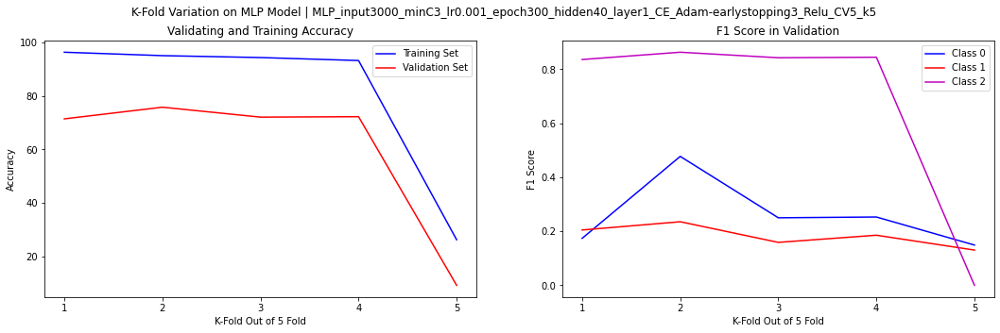

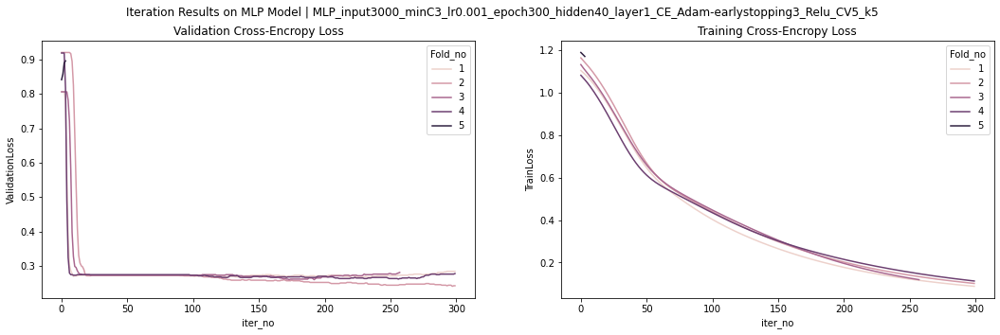

max early stopping = 4 | iterative times = 1
Total training time:
56.25458121299744

Average Generalization Accuracy: 72.6039 %
Average Training Accuracy: 95.4435 %
Average F1 Score: 0: 0.265 | 1: 0.207 | 2: 0.845 




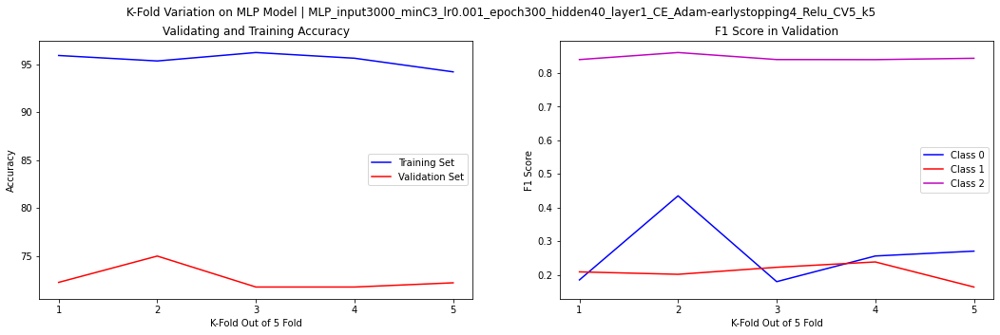

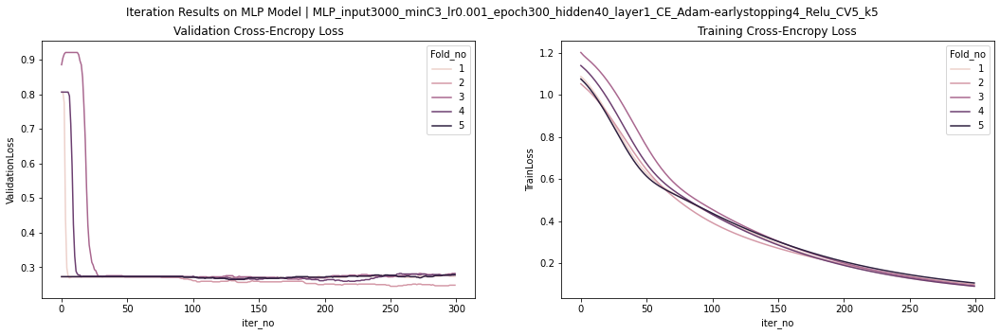

max early stopping = 5 | iterative times = 1
Total training time:
63.51710796356201

Average Generalization Accuracy: 72.2814 %
Average Training Accuracy: 95.8895 %
Average F1 Score: 0: 0.281 | 1: 0.199 | 2: 0.843 




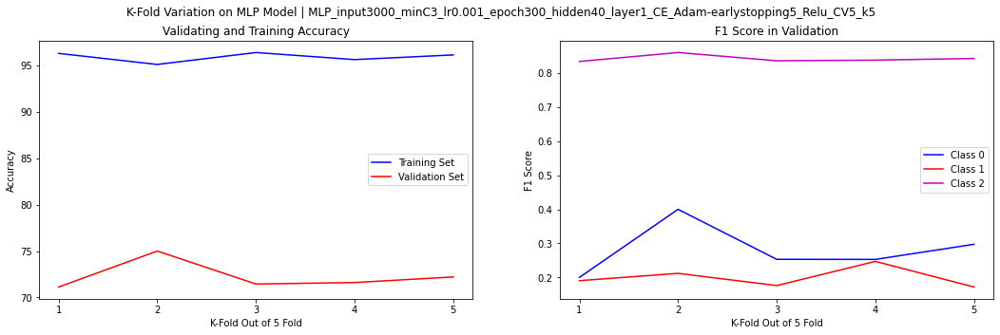

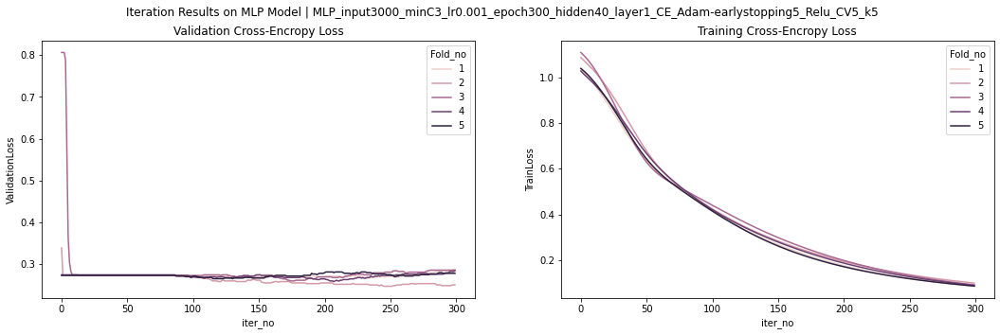

max early stopping = 6 | iterative times = 1
Total training time:
63.53359794616699

Average Generalization Accuracy: 72.5396 %
Average Training Accuracy: 94.9355 %
Average F1 Score: 0: 0.266 | 1: 0.200 | 2: 0.845 




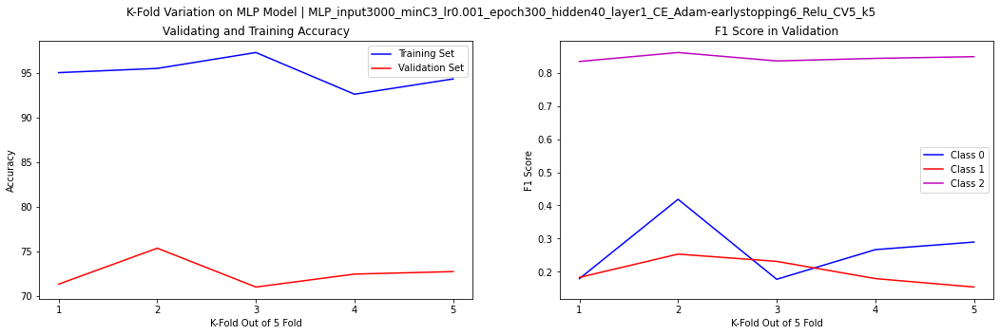

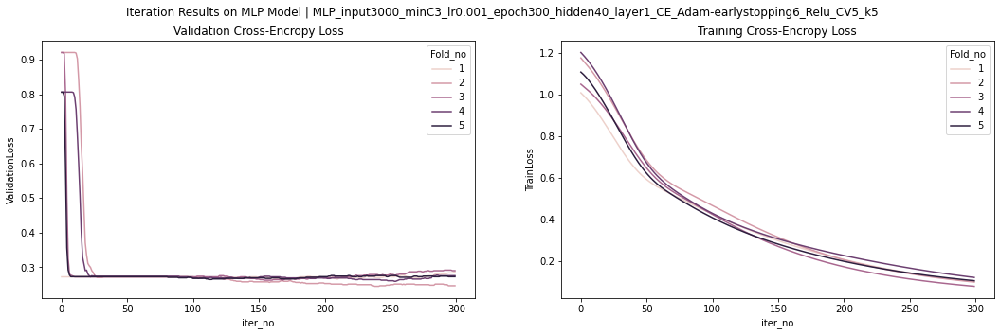

max early stopping = 7 | iterative times = 1
Total training time:
55.663827419281006

Average Generalization Accuracy: 72.6361 %
Average Training Accuracy: 95.0255 %
Average F1 Score: 0: 0.281 | 1: 0.193 | 2: 0.846 




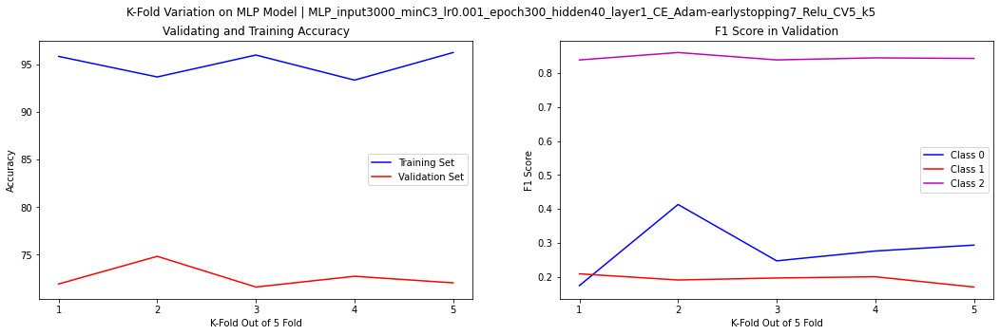

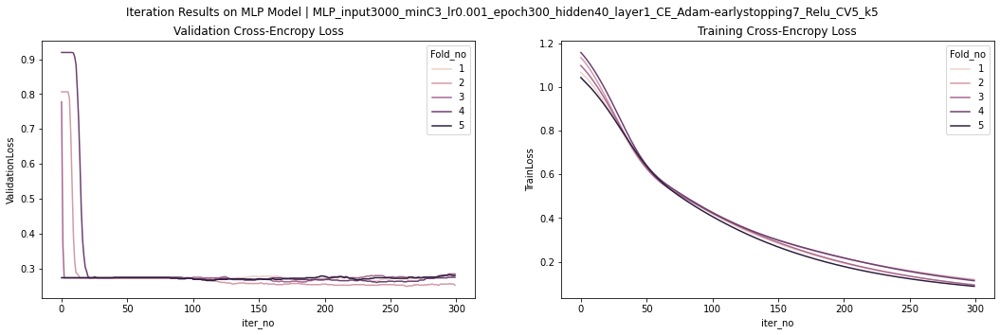

max early stopping = 8 | iterative times = 1
Total training time:
55.775503635406494

Average Generalization Accuracy: 72.5071 %
Average Training Accuracy: 95.8802 %
Average F1 Score: 0: 0.270 | 1: 0.216 | 2: 0.844 




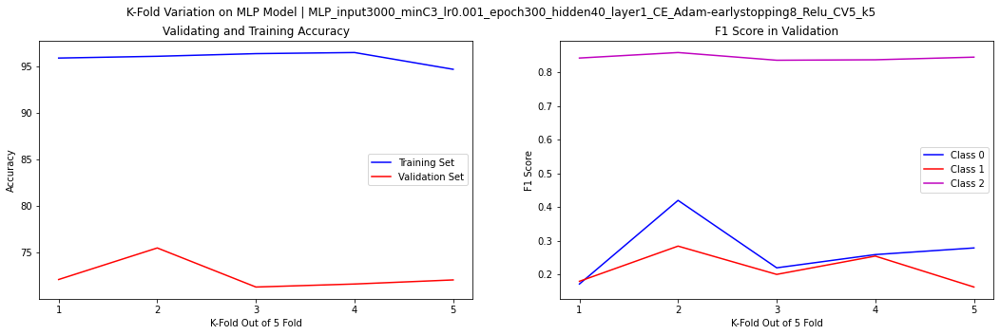

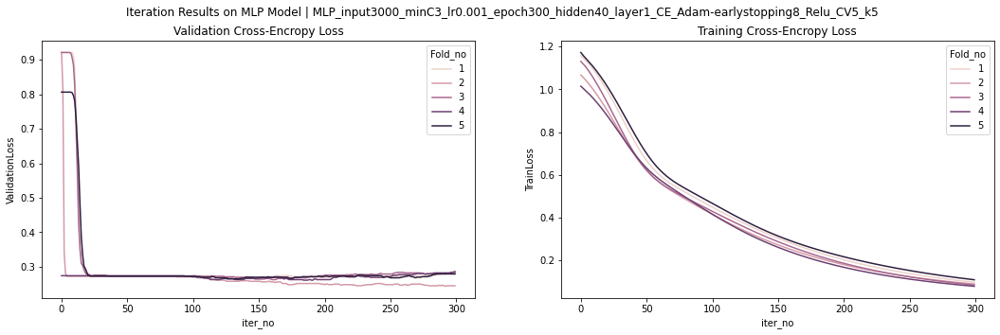

max early stopping = 9 | iterative times = 1
Total training time:
65.5058000087738

Average Generalization Accuracy: 72.4751 %
Average Training Accuracy: 95.6665 %
Average F1 Score: 0: 0.268 | 1: 0.216 | 2: 0.845 




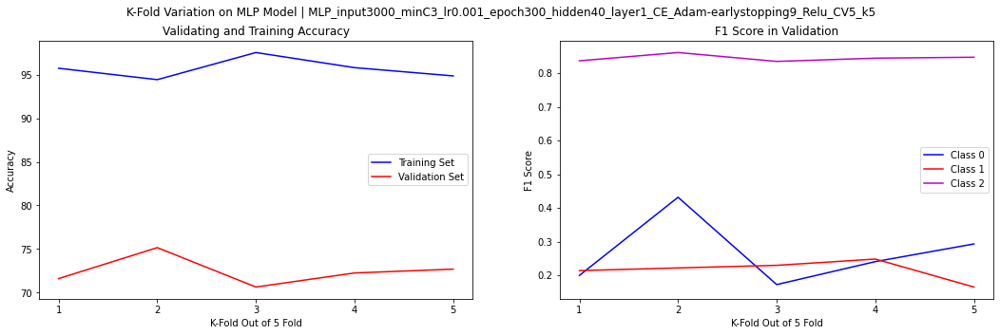

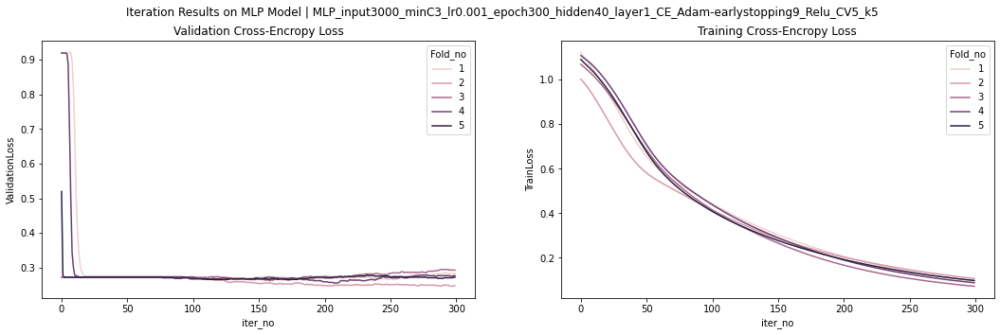

max early stopping = 1 | iterative times = 2
-----early-stopping implemented, iterations stopped at 4 | training loss 1.02 | val. loss 0.27 ------
-----early-stopping implemented, iterations stopped at 131 | training loss 0.33 | val. loss 0.26 ------
-----early-stopping implemented, iterations stopped at 22 | training loss 0.98 | val. loss 0.29 ------
-----early-stopping implemented, iterations stopped at 20 | training loss 1.00 | val. loss 0.27 ------
-----early-stopping implemented, iterations stopped at 89 | training loss 0.47 | val. loss 0.27 ------
Total training time:
16.63115119934082

Average Generalization Accuracy: 72.7977 %
Average Training Accuracy: 64.4339 %
Average F1 Score: 0: 0.100 | 1: 0.000 | 2: 0.843 




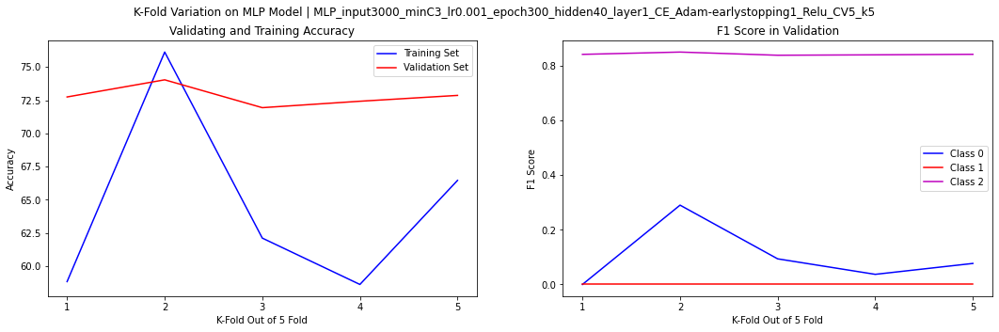

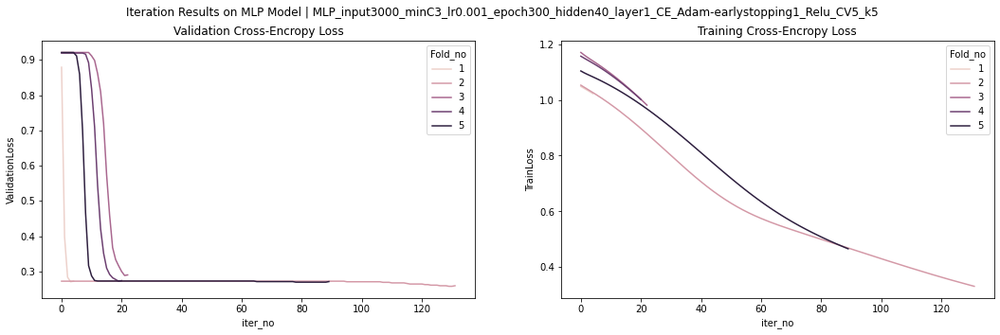

max early stopping = 2 | iterative times = 2
-----early-stopping implemented, iterations stopped at 213 | training loss 0.19 | val. loss 0.27 ------
-----early-stopping implemented, iterations stopped at 27 | training loss 0.95 | val. loss 0.27 ------
-----early-stopping implemented, iterations stopped at 7 | training loss 1.12 | val. loss 0.90 ------
-----early-stopping implemented, iterations stopped at 110 | training loss 0.40 | val. loss 0.27 ------
-----early-stopping implemented, iterations stopped at 135 | training loss 0.36 | val. loss 0.27 ------
Total training time:
23.96934700012207

Average Generalization Accuracy: 60.6365 %
Average Training Accuracy: 64.0291 %
Average F1 Score: 0: 0.152 | 1: 0.035 | 2: 0.688 




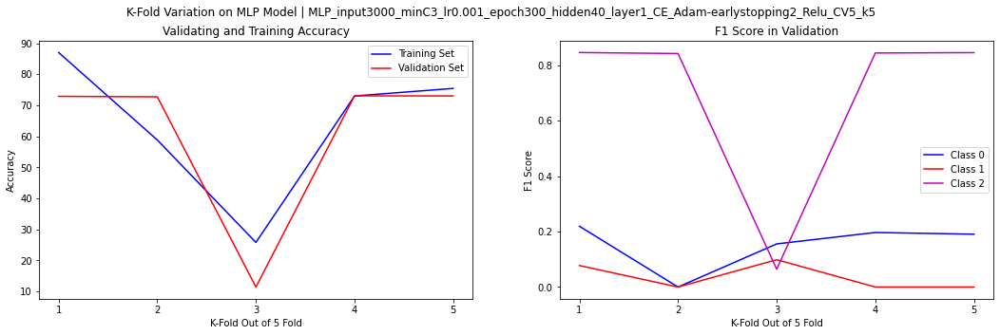

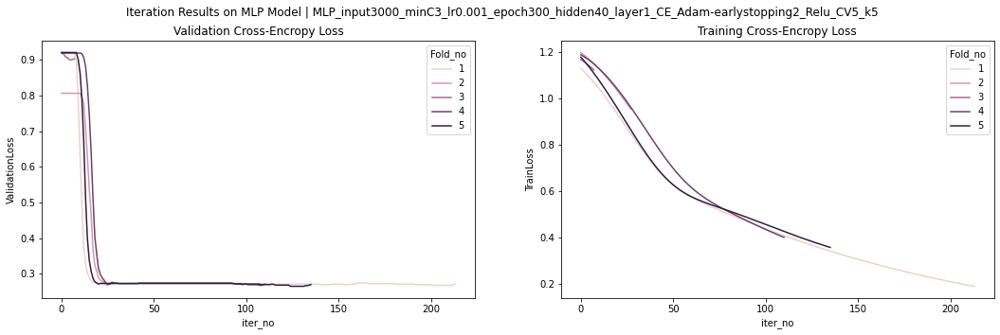

max early stopping = 3 | iterative times = 2
-----early-stopping implemented, iterations stopped at 290 | training loss 0.09 | val. loss 0.29 ------
-----early-stopping implemented, iterations stopped at 213 | training loss 0.20 | val. loss 0.27 ------
Total training time:
52.2699921131134

Average Generalization Accuracy: 72.4750 %
Average Training Accuracy: 94.2245 %
Average F1 Score: 0: 0.257 | 1: 0.186 | 2: 0.845 




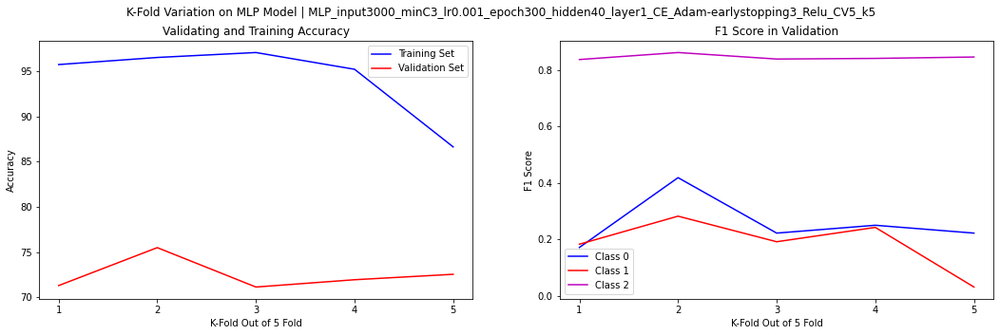

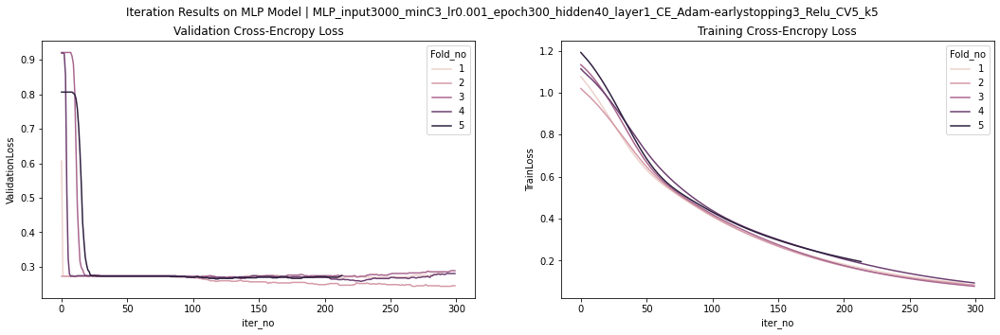

max early stopping = 4 | iterative times = 2
Total training time:
64.11697196960449

Average Generalization Accuracy: 72.5394 %
Average Training Accuracy: 95.5004 %
Average F1 Score: 0: 0.271 | 1: 0.196 | 2: 0.846 




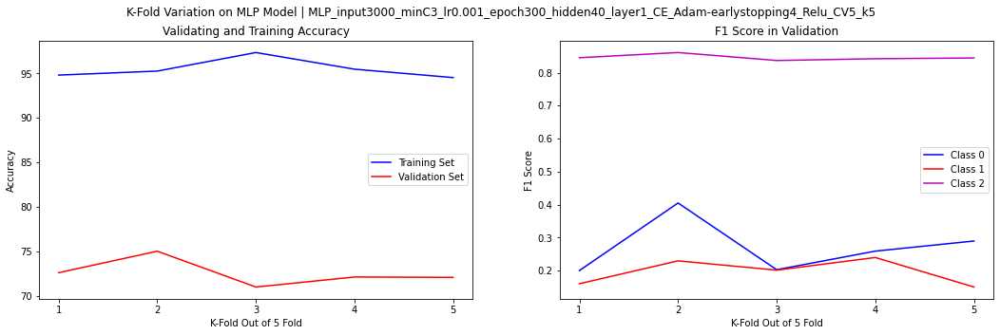

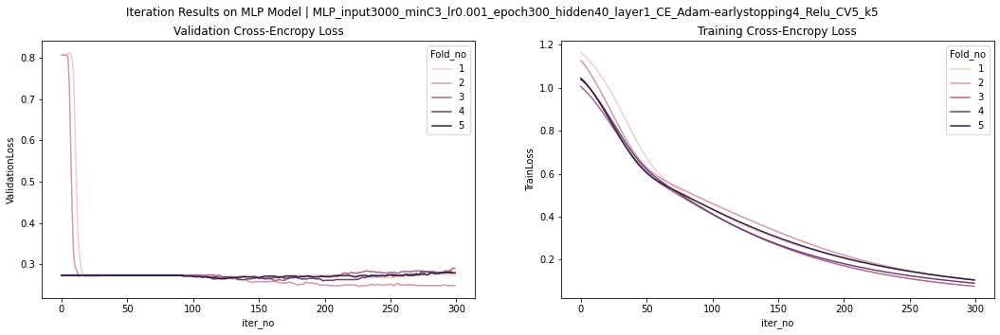

max early stopping = 5 | iterative times = 2
Total training time:
59.40739607810974

Average Generalization Accuracy: 72.8620 %
Average Training Accuracy: 95.9037 %
Average F1 Score: 0: 0.276 | 1: 0.212 | 2: 0.848 




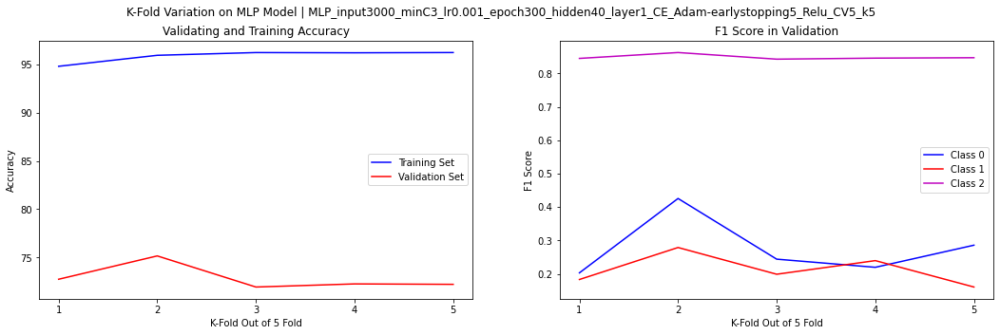

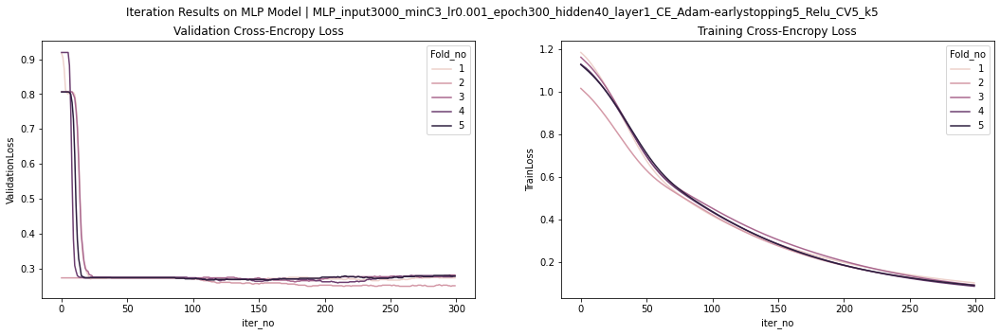

max early stopping = 6 | iterative times = 2
Total training time:
55.412742137908936

Average Generalization Accuracy: 72.5716 %
Average Training Accuracy: 95.9749 %
Average F1 Score: 0: 0.269 | 1: 0.215 | 2: 0.844 




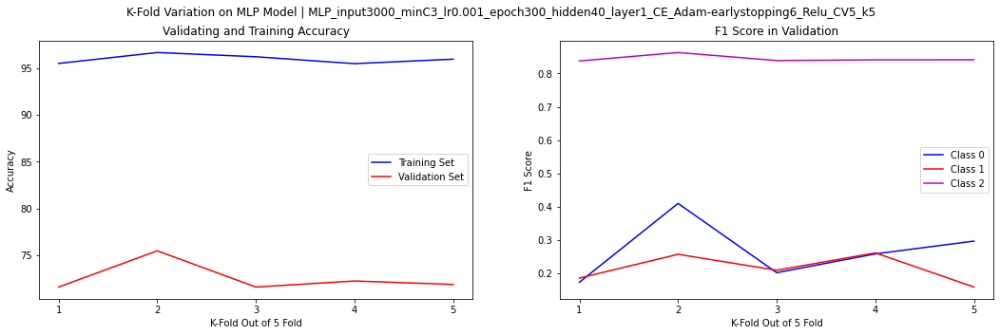

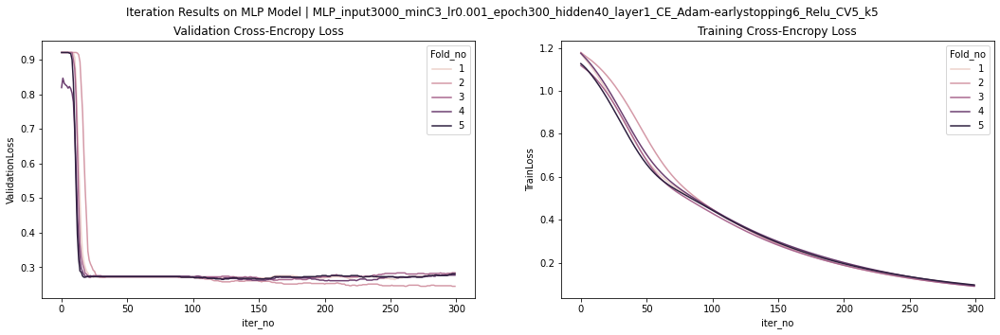

max early stopping = 7 | iterative times = 2
Total training time:
58.387314319610596

Average Generalization Accuracy: 72.6684 %
Average Training Accuracy: 96.0557 %
Average F1 Score: 0: 0.268 | 1: 0.218 | 2: 0.846 




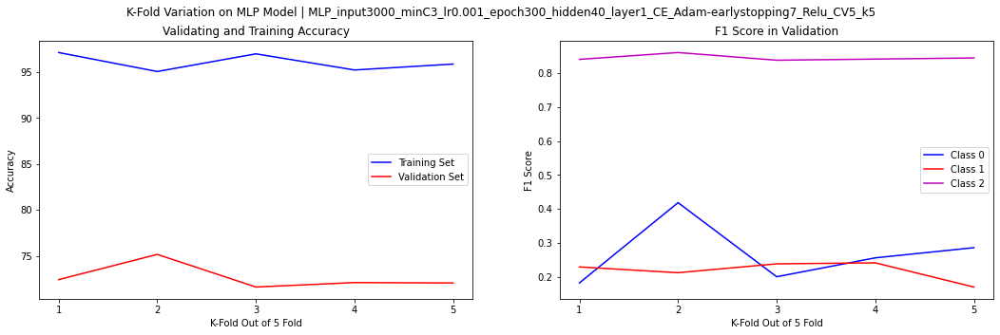

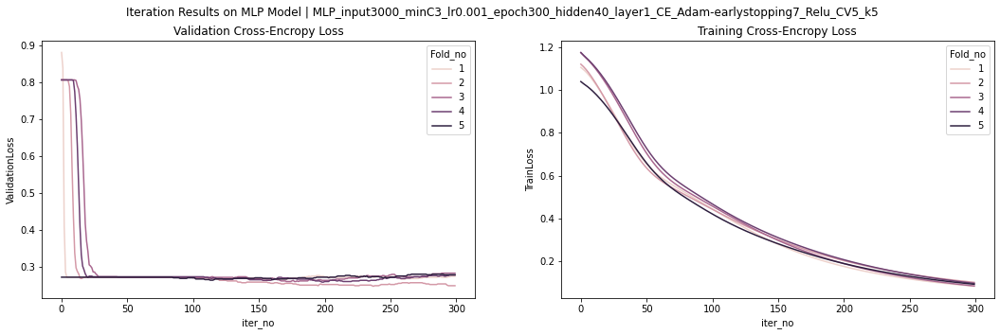

max early stopping = 8 | iterative times = 2
Total training time:
60.90495181083679

Average Generalization Accuracy: 72.8299 %
Average Training Accuracy: 94.7696 %
Average F1 Score: 0: 0.280 | 1: 0.200 | 2: 0.847 




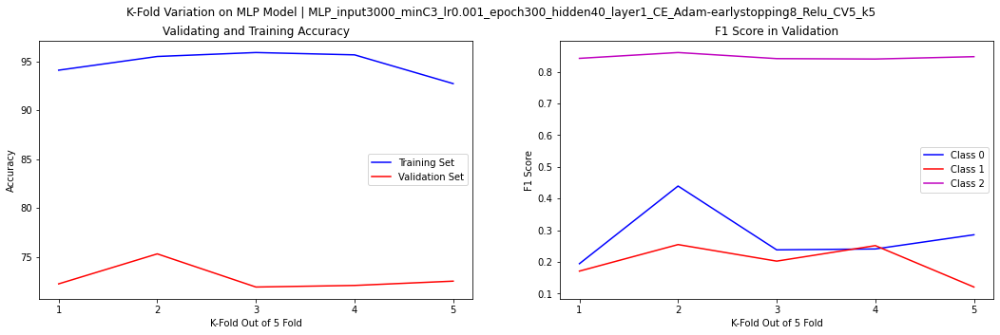

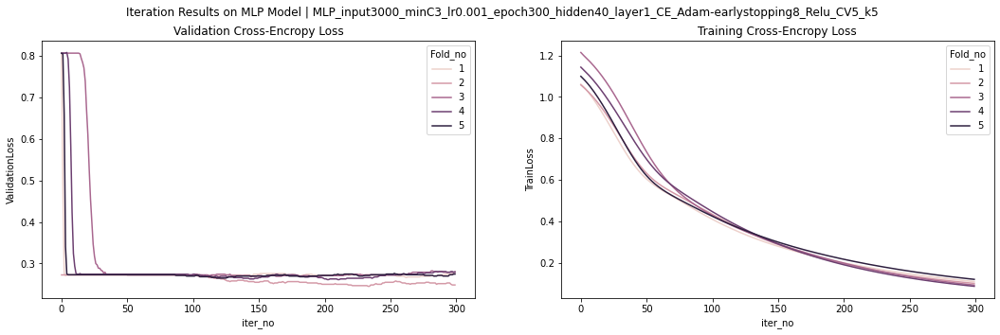

max early stopping = 9 | iterative times = 2
Total training time:
56.21991229057312

Average Generalization Accuracy: 72.4428 %
Average Training Accuracy: 95.8706 %
Average F1 Score: 0: 0.277 | 1: 0.208 | 2: 0.844 




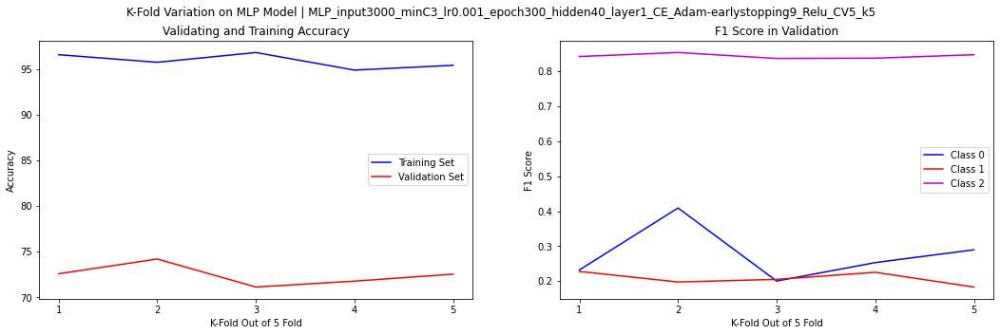

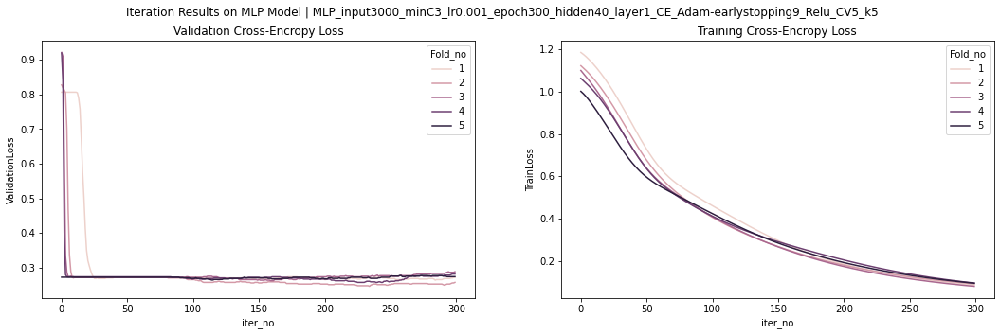

In [466]:
earlyStopping_Lst = np.arange(1,10,1)

## Grid search 
ml = 3000
min_count = 3

vectorizer = Train_Vectorizer(full_raw,'commentsReview','benefitsReview', max_feature=ml, min_count=min_count)
df_train = text_preprocess(train_df_raw, vectorizer)

OptimizerName = 'Adam'
lossFunc = 'CE'
ActivationFunc1 = 'Relu'
ActivationFunc2 = None
layer = 1
learning_rate = 0.001
hidden_size = 40
# early_stopping =-1
num_epochs = 300
k= 5
over_proportion_list=[0.4,0.3,1]
classes=[0,1,2]
SMOTE_bool=True
cv = 5
kFold = StratifiedKFold(n_splits=cv, shuffle=True, random_state=123)
CE_weight=True

grid_search5_sum = pd.DataFrame(columns=list(overview_training.columns))  
grid_search5_iter = pd.DataFrame(columns=list(iterResult.columns))  

for i in range(3):
    for early_stopping in earlyStopping_Lst:    
        print('max early stopping = %d | iterative times = %d' %(early_stopping,i))
        sum_overview , sum_iter,_= Train_MLP(df_train,layer, ActivationFunc1,OptimizerName,learning_rate, hidden_size, num_epochs, kFold,lossFunc, early_stopping,SMOTE,k,over_proportion_list,classes,min_count,ActivationFunc2,CE_weight)
        grid_search5_sum = pd.concat([grid_search5_sum,sum_overview],axis=0)
        grid_search5_iter = pd.concat([grid_search5_iter,sum_iter],axis=0)

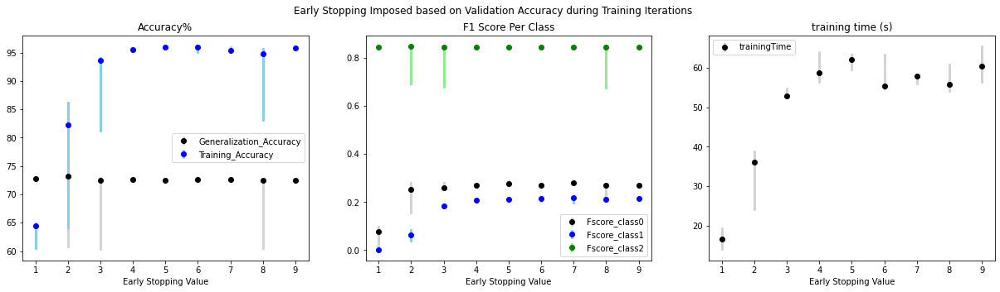

In [467]:
# visualize results of early stopping

data = grid_search5_sum[['optimizer','Generalization_Accuracy','Training_Accuracy','Fscore_class0','Fscore_class1','Fscore_class2','trainingTime']]
data['optimizer'] =list(earlyStopping_Lst) +list(earlyStopping_Lst) +list(earlyStopping_Lst)
data_group = data.groupby('optimizer').agg(['median','min','max']).reset_index()
colors = ['black','blue','green']
ecolors = ['lightgrey','skyblue','lightgreen']
title = ['Accuracy%','F1 Score Per Class','training time (s)']

fig10, ax10 = plt.subplots(figsize=(21,5),ncols=3)
for i in range(3): # 3 subplots
    if i ==0:
        m=['Generalization_Accuracy','Training_Accuracy']
    elif i==1:
        m=['Fscore_class0','Fscore_class1','Fscore_class2']
    else:
        m=['trainingTime']       
    for l in range(len(m)):
        y = data_group[m[l]]['median']
        yerr = [(data_group.shape[0])*[0]]*2
        yerr[0] = y- data_group[m[l]]['min']
        yerr[1]  = data_group[m[l]]['max'] - y
        ax10[i].errorbar(data_group['optimizer'],y,yerr =yerr,fmt='o',color=colors[l], ecolor=ecolors[l], elinewidth=3, label=m[l],capsize=1)
    ax10[i].set_xlabel('Early Stopping Value')
    ax10[i].set_xticks(ticks=earlyStopping_Lst)
    ax10[i].legend()    
    ax10[i].set_title(title[i])
plt.suptitle('Early Stopping Imposed based on Validation Accuracy during Training Iterations')
plt.show()
fig10.savefig('chart/EarlyStopping.jpg')

In [469]:
data.reset_index(drop=True).sort_values(by=['Generalization_Accuracy','Fscore_class1','Fscore_class0'],ascending=False)

,optimizer,Generalization_Accuracy,Training_Accuracy,Fscore_class0,Fscore_class1,Fscore_class2,trainingTime
10,2,73.571994,82.301001,0.251194,0.063394,0.849912,36.026070
1,2,73.184429,86.276678,0.284674,0.087483,0.848034,39.028187
2,3,72.991037,93.568070,0.283347,0.174518,0.848233,54.976075
0,1,72.958987,64.994170,0.075991,0.000000,0.843768,19.629637
22,5,72.862004,95.903691,0.275512,0.212113,0.848433,59.407396
25,8,72.829850,94.769611,0.279756,0.200133,0.846664,60.904952
18,1,72.797697,64.433924,0.099607,0.000000,0.842961,16.631151
3,4,72.797332,95.500286,0.268300,0.215193,0.846860,58.608252
9,1,72.700818,60.380874,0.000000,0.006557,0.841810,13.862877
6,7,72.700766,95.343435,0.285505,0.221398,0.844884,57.902272


### Parameters For MLP Model:

#### Cross-Validate Best-performing Parameters and Test other activation function

Total training time:
65.61716842651367

Average Generalization Accuracy: 72.4750 %
Average Training Accuracy: 95.8135 %
Average F1 Score: 0: 0.264 | 1: 0.213 | 2: 0.844 




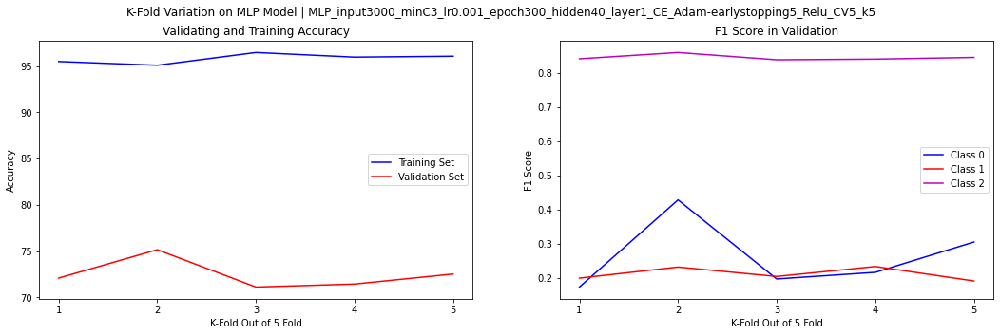

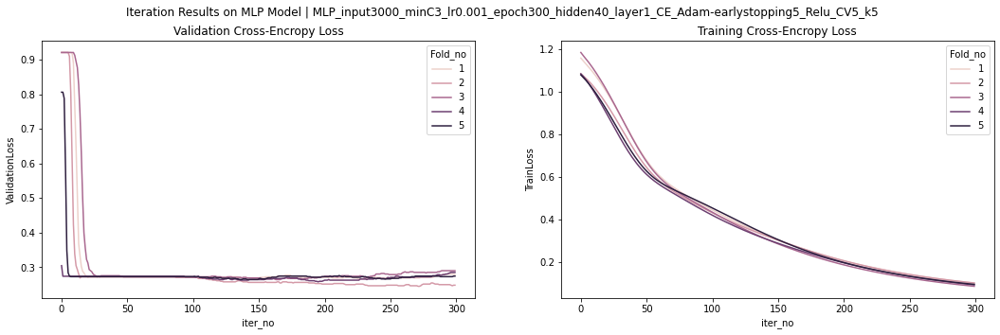

In [520]:
ml = 3000
min_count = 3

vectorizer = Train_Vectorizer(full_raw,'commentsReview','benefitsReview', max_feature=ml, min_count=min_count)
df_train = text_preprocess(train_df_raw, vectorizer)

OptimizerName = 'Adam'
lossFunc = 'CE'
ActivationFunc1 = 'Relu'
ActivationFunc2 = None
layer = 1
learning_rate = 0.001
hidden_size = 40
early_stopping =5
num_epochs = 300
k= 5
over_proportion_list=[0.4,0.3,1]
classes=[0,1,2]
SMOTE_bool=True
cv = 5
kFold = StratifiedKFold(n_splits=cv, shuffle=True, random_state=123 )

overview , iter , mlp_dict = Train_MLP(df_train,layer, ActivationFunc1,OptimizerName,learning_rate, hidden_size, num_epochs, kFold, lossFunc, early_stopping, SMOTE,k,over_proportion_list,classes,min_count,ActivationFunc2)

In [546]:
from sklearn.model_selection import train_test_split

ml = 3000
min_count = 3

vectorizer = Train_Vectorizer(full_raw,'commentsReview','benefitsReview', max_feature=ml, min_count=min_count)
df_train = text_preprocess(train_df_raw, vectorizer)

OptimizerName = 'Adam'
lossFunc = 'CE'
ActivationFunc1 = 'Relu'
ActivationFunc2 = None
layer = 1
learning_rate = 0.001
hidden_size = 40
early_stopping =5
num_epochs = 300
k= 5
over_proportion_list=[0.4,0.3,1]
classes=[0,1,2]
CE_weight = True

# train model
x_train_t,x_val,y_train_t, y_val = train_test_split(df_train.iloc[:,:-1],df_train.iloc[:,-1], test_size=0.2,random_state=123,stratify=df_train.iloc[:,-1])

datasize = x_train_t.shape[0]    
over_target = dict(zip(classes,[int(i*datasize) for i in over_proportion_list]))
over = SMOTE(random_state=123,sampling_strategy=over_target,k_neighbors=k)
over_proportion = ';'.join([str(x) for x in over_proportion_list ])   
            
x_train_t,y_train_t = over.fit_resample(x_train_t,y_train_t)
balance = y_train_t.value_counts(normalize=True)

        
if (CE_weight):
    weight = weight = torch.from_numpy(np.array([balance[0],balance[1],balance[2]])).type(torch.FloatTensor)
else:
    weight = None
        
x_train_t = torch.from_numpy(np.array(x_train_t)).type(torch.FloatTensor)
x_val= torch.from_numpy(np.array(x_val)).type(torch.FloatTensor)
y_train_t = torch.from_numpy(np.array(y_train_t)).type(torch.LongTensor)
y_val = torch.from_numpy(np.array(y_val)).type(torch.LongTensor)   
                           
criterion = nn.CrossEntropyLoss(weight = weight)
        
mlp = MLP_Net_layer1(input_size,hidden_size,num_classes,activation1)
optimizer = torch.optim.Adam(mlp.parameters(), lr=learning_rate) 

                          
        
iter = [ID,'MLP',0,0,0,1,1,layer] # initiate an empty list for early stopping + framework for storing the iterative results in every fold
for epoch in range(num_epochs):
    optimizer.zero_grad()
    output = mlp(x_train_t)
    loss = criterion(output, y_train_t)

    # Calculate the loss in validation set at this model bias/ weight
    val_output_epoch = mlp(x_val) 
    _,pred_val_epoch = torch.max(val_output_epoch,1)
    wrong_val = (pred_val_epoch!=y_val).sum().item()
    loss_val_epoch = wrong_val / len(y_val)

    # Update the model parameter with loss function
    loss.backward()
    optimizer.step()                  
            
    last_iter = iter               
    iter = [ID,'MLP',cv,fold_id+1,epoch,loss.data.item(),loss_val_epoch,layer]
    iter_list.append(iter)
                           
    if loss_val_epoch > last_iter[-2]: # iter: list stored in last iterations
        incr_val_loss +=1
    else:
        incr_val_loss=0 # restart the counting 

    # Early-stopping to break the iteration loop
    if incr_val_loss >=early_stopping:
        print('-----early-stopping implemented, iterations stopped at %d | training loss %.2f | val. loss %.2f ------' %(epoch,loss.data.item(),loss_val_epoch))
        break
        
#print('---------------Training process has finished, Start Evaluating Models-----------------------')
_, pred = torch.max(output,1)
correct = (pred == y_train_t).sum().item()
train_classification_accuracy = correct/ len(y_train_t) *100
print('Classification accuracy (training data): %.4f %%' % train_classification_accuracy)


with torch.no_grad():
    val_output = mlp(x_val)
    _,pred_val = torch.max(val_output,1)
    correct_val = (pred_val==y_val).sum().item()
    val_classification_accuracy = correct_val / len(y_val) *100
    print('Classification accuracy (validation data): %.4f %% \n' % val_classification_accuracy)
    report = classification_report(y_val.data,pred_val.data, labels=label, target_names=target_names)
    print(report)

Classification accuracy (training data): 96.4396 %
Classification accuracy (validation data): 70.8065 % 

                                            precision    recall  f1-score   support

                               Ineffective       0.29      0.14      0.19        49
Marginally Effective/ Moderately Effective       0.38      0.18      0.25       120
  Highly Effective/ Considerably Effective       0.76      0.91      0.83       451

                                  accuracy                           0.71       620
                                 macro avg       0.48      0.41      0.42       620
                              weighted avg       0.65      0.71      0.67       620



In [553]:
best_parameter = mlp.state_dict()
best_parameter

OrderedDict([('layer_1.weight',
              tensor([[-0.1464, -0.2528, -0.2298,  ..., -0.3444,  0.1045,  0.0100],
                      [ 0.1202,  0.1621,  0.1845,  ..., -0.2235,  0.0311,  0.1376],
                      [-0.3572, -0.3511, -0.4115,  ..., -0.2961, -0.2929, -0.1124],
                      ...,
                      [ 0.1798,  0.2090,  0.2206,  ..., -0.2100, -0.0640,  0.2195],
                      [ 0.1939,  0.2257,  0.2772,  ...,  0.2277,  0.2159, -0.0874],
                      [-0.2658, -0.2631, -0.3220,  ..., -0.1153, -0.1829, -0.3405]])),
             ('layer_1.bias',
              tensor([ 1.1346e-02,  1.1313e-01,  1.6654e-01,  1.1095e-01,  1.9393e-02,
                       6.2988e-02,  7.2430e-03,  5.8212e-03,  1.2005e-01,  4.2679e-02,
                       1.0735e-02,  8.5095e-03,  1.7788e-01,  3.5382e-02,  2.2607e-02,
                       1.6330e-01, -6.9137e-03,  4.7267e-02,  1.4256e-01,  2.4812e-01,
                       1.0786e-01,  1.7968e-04,  1.6837e

### Save Model and Text-Processor

In [556]:
# print parameters of best MLP model
# save model
torch.save(best_parameter,'MLP_Final_Model')
# = torch.load('MLP_Final_Model')
#list(model.parameters())

import pickle
# save pre-processor
with open('vectorizer.pickle','wb') as output:
    pickle.dump(vectorizer,output)
    
#with open('vectorizer.pickle','rb') as inputPickle:
#    v = pickle.load(inputPickle)

In [502]:
%%writefile text_processor.py
import pickle
from nltk.corpus import wordnet as wn
import re 
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import numpy as np
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import conditionList
import drugname

tokenizer = RegexpTokenizer('\w+|^[\d\.]+|[^0-9]|\S+') # Tokenizer object
lemma = WordNetLemmatizer() # Lemmatization object
punctuations = '''!()-,[]{};:’“”'"\,,<>./?@#$%^&*_~''' # punctuation 
stopwords = stopwords.words('english') # obtain nltk ver. stopwords
drugsName = drugname.drugname() # list of drugs name
conditions = conditionList.condition() # list of medical condition
extra = ['would','will','also']

punctuations_list = [p for p in punctuations] # create punctuation list

# Remove stopwords that may remove negative sentiment 
remove_stopwords = ['not','no','very',"don't","ain",'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn', "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't",'mightn', "mightn't", 'mustn', "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't","won't", 'wouldn', "wouldn't"]    
for r in remove_stopwords:
    stopwords.remove(r)

# transform effectiveness into numeric/ ordinal variable into 3 levels as scholar papers suggested
effectiveness_mapping = {'Highly Effective': 2, 'Considerably Effective':2, "Ineffective":0, 'Marginally Effective':1,'Moderately Effective':1}


# Check stopwords
unwanted_word = stopwords + punctuations_list +extra + drugsName + conditions # Remove influence of drug used and medical terms of condition

with open('vectorizer.pickle','rb') as v_file:
    vectorizer = pickle.load(v_file)

def hasNumbers(inputString):
    return not(bool(re.search(r'\d', inputString)))

def word_extraction(text):
    word_list = tokenizer.tokenize(text) # tranform word in list
    useWord_list =[]
    for word in word_list:
        word = word.lower() # set word to lowercase 
        if (word not in unwanted_word) & (len(word)>2) & (hasNumbers(word)): # remove unwanted words / words with single character / words with dose amount
            word = lemma.lemmatize(word,wn.NOUN) # lemmatize by noun
            word = lemma.lemmatize(word,wn.VERB) # lemmatize by verb
            word = lemma.lemmatize(word,wn.ADJ) # lemmatize by adj
            useWord_list.append(word)
    text = ' '.join(useWord for useWord in useWord_list) # recreate the text sentence for count vectorizing
    return text    

def text_preprocess(df, vectorizer,labelCol='effectiveness',textCol1='commentsReview',textCol2='benefitsReview'): # input data to pre-process with the trained vectorizer
    df['effectiveness_ordinal'] = df[labelCol].map(effectiveness_mapping)
    df.drop(columns=[labelCol],inplace=True)
    df.reset_index(inplace=True,drop=True)
    textSeries1 = df[textCol1]
    textSeries2 = df[textCol2] 
    label = df[['effectiveness_ordinal']] # obtain the label
    textSeries = textSeries1 + textSeries2 # combine the two columns with text comments
    textSeries = list(textSeries.map(word_extraction)) # words extraction and cleaning    
    count_vector = vectorizer.transform(textSeries).toarray() # obtain word count per combined comment
    feature = vectorizer.get_feature_names() # obtain words
    vector_df = pd.DataFrame(data=count_vector, columns=feature) # build dataframe for storing word vector
    df = pd.concat([vector_df,label],axis=1) # concat with original dataset
    return df

Overwriting text_processor.py


In [503]:
%%writefile MLP_Net_layer.py
import torch
import torch.nn as nn

class MLP_Net_layer(nn.Module):
     def __init__(self, input_size, hidden_size, num_classes,activation1):
        super(MLP_Net_layer, self).__init__()
        self.layer_1 = nn.Linear(input_size,hidden_size, bias=True)
        self.activation1 = activation1
        self.output_layer = nn.Linear(hidden_size, num_classes, bias=True)
 
     def forward(self, x):
        out = self.layer_1(x)
        out = self.activation1(out)
        out = self.output_layer(out)
        return out

Overwriting MLP_Net_layer.py


In [504]:
## Store the training result
overview_training.to_csv('data_output_overview.csv', index=False)
iterResult.to_csv('data_output_iterate.csv', index=False)